# NB26 - was the drop a fluke, or is there a real effect?

**Both, in different halves.** The data-availability half does nothing whatsoever, the volatility
half is a small real effect that survives every robustness check, and the spectacular headline
number is one vault.

`drop_30` was the best single result either plan produced: 48.99% CAGR against the anchor's
37.90%, ulcer 1.384% against 1.796%, invested BTC beta 0.0011 against 0.0458, and an empty
failure set on constraints 1 to 6.
[21-backtest-vol-matched-family.ipynb](21-backtest-vol-matched-family.ipynb) rejected it because
neither neighbour passes, so it was already known to be a spike as a *rule*. This notebook asks
the different question of whether anything real sits underneath it.

**Based on:** [02-better-format.ipynb](02-better-format.ipynb) as the anchor, the family from
[21-backtest-vol-matched-family.ipynb](21-backtest-vol-matched-family.ipynb), and the composition
diagnostic in [22-backtest-joint-downside.ipynb](22-backtest-joint-downside.ipynb) Part A. Full
window 2026-01-01 to 2026-09-08, in-sample throughout.

## Method

`inverse_vol` needs 90 observations; a vault without them is stored as `0.0`; and `0.0` is the
smallest possible sort key, so every UNMEASURED vault is removed before any measured one. The
mechanism therefore does two different things at once, and cannot be interpreted as it stands.
Three new `vol_drop_mode` values separate them. `measured_only` removes the N most volatile vaults
that HAVE an estimate and never an unmeasured one. `unmeasured_only` removes vaults with too
little history to measure and never a measured one, however volatile. `random` removes N
candidates by a seeded deterministic permutation, the null the drop has never had. `incumbent`
reproduces the original sort exactly and is the default, so NB15-NB25 are unaffected - and
`incumbent_30` returns 0.489942 / 2.747391, the same figures NB21 recorded (cell 23).

Variants are matched on removals actually made, read from the trading code's own log, not on the
nominal setting: `incumbent_30` makes 8.7 measured and 21.3 unmeasured removals per decision
(cell 29), so its effective volatility strength is 8.7, not 30.

## Key new insights and what did we learn from this experiment?

- **The data-availability half is exactly inert.** `unmeasured_30`, which removes 21.3 unmeasured
  vaults per decision and never a measured one, returns 0.378971 / 0.017964 / 2.159792 / 0.045797
  (cell 29) - the anchor's numbers to six decimal places on every metric. Those vaults are
  admitted at signal 0 and never win a basket slot, so removing them changes no trade at all.
  Seventy per cent of what the "volatility-matched" control removes has no effect on anything.
- **The volatility half is a small real effect.** `measured_8`, matched to the incumbent's
  effective strength, gives 40.97% CAGR and ulcer 1.713% against the anchor's 37.90% and 1.796%
  (cell 29). It beats all ten of its random-null draws on CAGR, Martin, Sharpe and ulcer, and its
  edge SURVIVES leave-one-vault-out: masking the largest contributor takes the anchor to 23.90%
  and `measured_8` to 27.25%, so its advantage goes from +3.07 to +3.35 percentage points
  (cell 43). It is the only thing in this notebook that gets better under that test.
- **The headline number is one vault.** Masking `0x77fee2df7bad4f1db93052fa82bf78eaab771a16`
  (Realist Capital) takes `incumbent_30` from 48.99% to 24.12%, its ulcer from 1.384% to 2.206%
  and its Martin ratio from 35.39 to 10.93 (cell 43). The masked anchor is 23.90%, so the
  incumbent's entire 11.10 percentage-point edge collapses to **0.22 points**. Ninety-eight per
  cent of the best result either plan produced was one holding.
- **And it is one quarter.** `incumbent_30`'s sparse-regime CAGR is 43.35%, identical to the
  anchor's, because before April there are always more than 30 unmeasured vaults to consume and it
  removes no volatile vault at all. Its dense-regime CAGR is 54.74% against the anchor's 56.34%,
  slightly worse. Its entire edge is the late period, 66.13% against 27.20% (cell 41). A mechanism
  that is provably inert for the first third of the window and behind for the second is not
  earning its result.
- **The two halves win in different periods**, which is why neither reproduces the whole.
  `measured_8` wins in the dense regime (66.72% against 56.34%) and loses in the late one (26.44%
  against 27.20%) - the mirror image of the incumbent (cell 41).
- **Random removal is not a substitute for either.** Ten seeded draws removing 30 candidates give
  a median CAGR of 1.92% and negative CAGR in the dense and late periods, with 0 of 10 positive in
  all three segments (cells 31, 41). Holding a smaller book does not help; what is removed
  matters. Removing 9 at random is roughly anchor-like (median 37.04%) and 10 of 10 stay positive
  in all three segments.

## Summary of results

- 39 variants plus the anchor, 767 seconds of backtests in one kernel (cell 23). Anchor parity
  holds on all ten `BASELINE` metrics and both `decide_trades` splices are asserted inert
  (cell 20).
- The decomposition, CAGR / ulcer / Martin / beta (cell 29): anchor 37.90% / 1.796% / 21.10 /
  0.0458; `incumbent_30` 48.99% / 1.384% / 35.39 / 0.0011; `measured_8` 40.97% / 1.713% / 23.91 /
  0.0437; `unmeasured_30` 37.90% / 1.796% / 21.10 / 0.0458, i.e. the anchor exactly.
- Leave-one-vault-out on the same vault for all three (cell 43): `incumbent_30` 48.99% to 24.12%,
  `measured_8` 40.97% to 27.25%, `unmeasured_30` 37.90% to 23.90%.
- Random nulls, add-one percentile over 10 draws, floor 0.0909 (cell 31): `incumbent_30` beats
  every draw at n=30 on all five metrics; `measured_8` beats every draw at n=9 on CAGR, Martin,
  Sharpe and ulcer but is beaten by **all ten** on beta, p = 1.000. Its risk reduction is not
  selection, it is generic.
- Weight concentration is reported for every variant and stacked-area weight charts for 22 of them
  (cells 37, 39). The 18 remaining random-null draws are summarised numerically rather than
  charted; they are a null, they differ only by seed, and 38 more stacked-area figures would make
  the notebook unreadable and very large.

## Robustness of results

- **Ten draws give a resolution of 0.0909**, so that is the strongest p this design can produce.
  It is a benchmark percentile, not a significance test, and the direction is one-sided in favour
  of the candidate. Read a p of 0.0909 as "beat every draw", nothing more.
- **`measured_8`'s edge is small and its beta result is not selection.** Every random draw at
  matched strength achieved a lower invested beta, so removing volatile names lowers beta
  generically. Only the return and ulcer improvements are attributable to what was removed.
- **Nothing here is out of sample**, and the decomposition was designed after seeing the result it
  decomposes. The measured half is a candidate for a future plan, not a finding to act on: it has
  had no plateau test, no pre-registration, and its ulcer improvement of 4.6% is far short of the
  15% the adoption rule requires.
- **The single-vault result is a property of this window, not a criticism of the vault.** Realist
  Capital has a lifetime CAGR of 105.5%, a lifetime Sharpe of 1.24 and a lifetime maximum drawdown
  of 68.3%. A book of six names that holds one such vault will have its result decided by it. That
  is the concentration the whole track has been trying to reduce, showing up in the result of the
  mechanism that looked most like a solution.
- **The comparator family here is the incumbent runs**, not `family_frame()`'s `drop_N` labels,
  which this notebook does not create. They are the same configurations NB21 ran.
- This notebook adopts nothing and evaluates no plateau. `failed_1_to_6` is reported for every row
  and constraint 7 is not applied, for the same reason as in NB21: the comparator family is drawn
  from the runs under test.


## Notebook setup

- Shared imports, chart output settings, and notebook logging for the clean single backtest.

In [1]:
import datetime
import logging

import pandas as pd
import plotly.express as px
from IPython.display import display

from tradingstrategy.client import Client
from tradeexecutor.utils.notebook import setup_charting_and_output, OutputMode

client = Client.create_jupyter_client()
setup_charting_and_output(OutputMode.static, image_format='png', width=1500, height=1000)
logger = logging.getLogger('strategy')

Started Trading Strategy in Jupyter notebook environment, configuration is stored in /Users/moo/.tradingstrategy


## Universe definition

- Use the same Hyperliquid survivor-first vault universe as the parent notebook so the accounting comparison is direct.


In [2]:
from eth_defi.token import USDC_NATIVE_TOKEN
from tradingstrategy.chain import ChainId
from tradeexecutor.state.identifier import AssetIdentifier

CHAIN_ID = ChainId.hyperliquid

EXCHANGES = ('uniswap-v2', 'uniswap-v3')
SUPPORTING_PAIRS = [
    (ChainId.arbitrum, 'uniswap-v3', 'WETH', 'USDC', 0.0005),
    (ChainId.ethereum, 'uniswap-v3', 'WETH', 'USDC', 0.0005),
    (ChainId.ethereum, 'uniswap-v3', 'WBTC', 'USDC', 0.003),
]
LENDING_RESERVES = None
PREFERRED_STABLECOIN = AssetIdentifier(
    chain_id=ChainId.hyperliquid.value,
    address=USDC_NATIVE_TOKEN[ChainId.hyperliquid].lower(),
    token_symbol='USDC',
    decimals=6,
)
ALLOWED_VAULT_DENOMINATION_TOKENS = {'USDC', 'USDT', 'USDC.e', 'crvUSD', 'USDT0', 'USD₮0', 'USDt', 'USDS'}

print(f'Chain universe: {CHAIN_ID.get_name()}')
print(f'Reserve asset: {PREFERRED_STABLECOIN}')


Chain universe: HyperEVM
Reserve asset: <USDC at 0xb88339cb7199b77e23db6e890353e22632ba630f>


## Parameters

- The parent configuration is unchanged except for redemption accounting.
- Each redemption charges a 10% fee on positive profit and 10 bps of gross redeemed capital.


In [3]:
from tradeexecutor.strategy.cycle import CycleDuration
from tradeexecutor.strategy.default_routing_options import TradeRouting
from tradeexecutor.strategy.parameters import StrategyParameters

from tradingstrategy.timebucket import TimeBucket


class Parameters:
    #: Notebook identifier.
    id = '26-backtest-drop-decomposition'

    #: Daily candles match the whole Hyperliquid survivor-first research chain.
    candle_time_bucket = TimeBucket.d1
    #: Native 2-day rebalance cadence. NB63, NB64 and NB65 all settled on 48 hours, and NB65
    #: verified a native `cycle_2d` reproduces NB64's modulo-counter version to within 0.36 pp, so
    #: the cadence is pinned here rather than searched and the modulo counter is retired.
    #:
    #: Relies on the trade-executor fix that makes `perform_optimisation()` forward
    #: `cycle_duration`; without it the optimiser silently reverts to a daily clock.
    cycle_duration = CycleDuration.cycle_2d
    #: HyperEVM is the primary chain for vaults.
    chain_id = CHAIN_ID
    #: HyperEVM is the primary execution chain.
    primary_chain_id = CHAIN_ID
    #: Same exchange set as the release-candidate notebooks.
    exchanges = EXCHANGES

    #: **Searched.** NB68 found 6 best on CAGR and 8 best on Sharpe/Calmar/drawdown at 150,000,
    #: with a reproducible hole at 7 - so the axis is not monotone and the optimum depends on the
    #: objective. Searched jointly here rather than settled by eye.
    #: **NB92 winner.** NB92's recommendation and an interior optimum confirmed from both sides: mean CAGR
    #: 5 -> 20.82%, 6 -> 21.89%, 7 -> 15.27%, 8 -> 15.60%. Opening the range down to 5 confirmed 6
    #: rather than moving the optimum.
    max_assets_in_portfolio = 6
    #: 98% target deployment, the validated release default.
    allocation_pct = 0.98
    #: **Searched.** The one parameter known to reverse with capital: NB65 measured 33% > 50% at
    #: 25,000, NB68 measured 50% > 33% at 150,000. At large size the ceiling stops being risk
    #: control and becomes a deployment constraint.
    max_concentration_pct = 0.33
    #: **Searched.** The best-evidenced lever in the chain: NB67 measured 15% -> 25% as worth
    #: +4.61 pp at 75,000 and +20.34 pp at 150,000, and NB68 confirmed a gain in all six
    #: combinations tested. 0.30 extends past anything measured so far.
    per_position_cap_of_pool_pct = 0.33
    #: Engine hygiene threshold for cleaning up tiny residual positions.
    min_portfolio_weight_pct = 0.005

    #: Retired: the cadence is now the engine's own 2-day cycle, so every cycle acts.
    rebalance_every_n_cycles = 1
    #: Retired from the search: NB63 and NB64 both found it inert at or below the cadence and
    #: harmful above it, and NB69/NB70 confirmed no configuration wanted it.
    minimum_hold_days = 1

    #: Hyperliquid has a hard 5 USD minimum deposit.
    absolute_min_vault_deposit_usd = 5.0
    #: Buy threshold as a fraction of initial cash. Deposits are free under an exit-only
    #: fee, so the buy side stays tight and is not searched.
    individual_rebalance_min_threshold_of_initial_cash_pct = 0.0005
    #: **Searched.** Sell-side softband in USD at a 150,000 bankroll: the $5 hard floor plus
    #: 0.25%, 0.5% and 1.0% of capital.
    #:
    #: The ladder stops at 1%. NB66 established the crash boundary is a fraction of capital -
    #: between 1% and 2% at every bankroll tested - because suppressed sells are not deducted from
    #: the buy budget, so a wide band lets the plan spend proceeds from a trim it then cancels.
    #: NB67 confirmed $3,000 (2%) and $6,000 (4%) both fail at 150,000 while $1,500 (1%) survives.
    #: 1% is the edge rather than a safe margin, so any crash at that rung is surfaced below
    #: instead of being scored as a zero.
    sell_rebalance_min_threshold_usd = 750.0

    #: Survivor-first TVL floor selected in NB141.
    min_tvl_usd = 7_500

    #: Trailing window (days) for the CAGR leg of the composite selection score.
    cagr_lookback_days = 360
    #: Trailing window (days) for the Sharpe leg of the composite selection score.
    sharpe_lookback_days = 45
    #: Composite blend: ``cagr_weight x CAGR score + (1 - cagr_weight) x Sharpe score``.
    #: NB31 showed both legs are load-bearing: either leg alone is materially worse on
    #: both CAGR and drawdown.
    #: **NB92 winner.** NB92's recommendation, and a value no earlier search in this chain contained - NB90 ran
    #: 0.3/0.5/0.7 and settled on 0.5, stepping straight over the optimum. All 15 of NB92's top
    #: configurations use 0.6, at 100% consensus.
    #:
    #: This is the top of NB92's range and 0.7 was dropped from it on a marginal mean measured
    #: under different companion values, so whether 0.7 is better is still open.
    cagr_weight = 0.60
    #: Momentum gate window: a vault is eligible only while its trailing return over
    #: this window exceeds :py:attr:`gate_threshold`. NB31: pure drawdown insurance at
    #: zero return cost (removal: -4.5pp CAGR and max DD -7.4% -> -17.5%).
    gate_lookback_days = 14
    #: Momentum gate threshold (fraction).
    #: **NB92 winner.** Unchanged. NB92 confirmed this axis is inert across a range 50% wider than NB90's: mean CAGR
    #: spans only 17.52% to 19.54% across all six searched values, and the two newly opened
    #: permissive values changed nothing.
    gate_threshold = -0.16
    #: **Searched.** The window for the volatility estimate that becomes the sizing weight.
    #:
    #: NB70 found a broad 45-60 day plateau with sharp falloff either side and no reason to move
    #: off 60 on its own - but it also found the exponent and the window are separate levers, and
    #: the window was last searched (NB28/NB29) on data that was 41% forward-filled. It is in the
    #: search because it interacts with everything else here, not because 60 looked wrong.
    #:
    #: This is an **indicator** parameter. `prepare_grid_combinations()` calls
    #: `create_indicators()` with each combination's own parameters, so every value gets its own
    #: indicator series - unlike a hand-built grid, where reusing a precomputed indicator set
    #: would silently give every cell the same 60-day series.
    #: **NB92 winner.** NB92's recommendation and a genuine interior optimum: mean CAGR 60 -> 18.44%, 75 -> 19.93%,
    #: 90 -> 21.03%, 105 -> 16.04%. The collapse at 105 is what makes 90 interior rather than a
    #: boundary artefact.
    #:
    #: Chosen over the higher-scoring window-60 configurations deliberately. Those returned up to
    #: 34.12% but their worst one-step neighbour falls to 11-12%, because 60 is a boundary and the
    #: step off it lands on the sharpe_lookback_days cliff. At 90 the worst neighbour holds at
    #: 31.69%.
    inverse_vol_window = 90

    #: Pinned: size by 1/sigma^2 rather than 1/sigma. NB72 measured +2.77 pp of CAGR at 60 days,
    #: winning at 7 of 7 lookbacks on both the full window and clean daily data, with a genuine
    #: interior optimum at k=2. Note the gain is return-only - Sharpe moved +0.02 and drawdown
    #: 0.57 pp worse - so this pins the return-maximising choice, and the search below optimises
    #: Sharpe, which will not reward it for that.
    #: Selection score. ``cagr_sortino_weight`` replaces the Sharpe leg of the incumbent composite
    #: with Sortino, which is the change NB79 measured at +0.869 Sharpe on a single configuration.
    #: This notebook exists to find out whether that survives a search.
    selection_score_indicator = 'cagr_sortino_weight'

    #: Sizing rule, searched rather than pinned. NB71 and NB72 showed the ranking between these two
    #: **reverses with the concentration cap** - inverse variance wins at 33% and loses at 25% - so
    #: it cannot be assumed to carry over to a different selection score. NB77 gives a further
    #: reason to re-test it here: inverse variance weights by the reciprocal of variance, so it
    #: hands the largest positions to the low-volatility cohort that loses most often.
    weighting_method = 'inverse_variance'


    #: Unused while :py:attr:`weighting_method` is ``inverse_variance``; kept so the sizing helper
    #: has a value for every branch.
    weighting_exponent = 2.0
    softmax_temperature = 0.25

    #: Start trading from January 2026 while retaining pre-start indicator history.
    backtest_start = datetime.datetime(2026, 1, 1)
    #: Exclusive end boundary. Extended to "yesterday" for the lower-vol track baseline;
    #: vault price history is now pulled fresh from the Trading Strategy website each run.
    #: Exclusive end boundary, so the last traded day is 2026-09-08 - the same full window
    #: as 01-initial.ipynb and 02-better-format.ipynb.
    #:
    #: This track originally ran on a 2026-01-01 to 2026-06-30 development window with
    #: 2026-07-01 to 2026-09-08 reserved as a hold-out. That split has been retired: every
    #: notebook now runs the full window. The consequence is that results are in-sample
    #: throughout and the track no longer carries an out-of-sample claim.
    backtest_end = datetime.datetime(2026, 9, 9)
    #: Release-candidate bankroll.
    initial_cash = 150_000
    #: Derived at class creation time from the configured initial cash and the 5 USD hard floor.
    individual_rebalance_min_threshold_usd = max(
        absolute_min_vault_deposit_usd,
        initial_cash * individual_rebalance_min_threshold_of_initial_cash_pct,
    )

    #: Optimiser runs do not model managed yield.
    use_managed_yield = False

    #: Margin withheld by the same-cycle buy cap. Sell proceeds are sized at
    #: mark-to-market value but execute slightly lower due to redemption fees,
    #: price movement, and raw-unit rounding.
    sync_cash_headroom_usd = max(0.50, initial_cash * 0.0005)

    #: Default routing is still required by the strategy runtime even though it is not the alpha source.
    routing = TradeRouting.default
    #: Set deliberately high so live and notebook indicator calculations use effectively
    #: all available history; history-derived indicators would be silently biased by a
    #: truncated lookback window.
    required_history_period = datetime.timedelta(days=365 * 20)
    #: Same live-style slippage assumption as the release-candidate notebooks.
    slippage_tolerance_pct = 0.0060
    #: Performance fee charged only on positive profit at redemption.
    vault_performance_fee = 0.10
    #: Fixed capital fee charged on every redemption, including loss-making redemptions.
    vault_redemption_capital_fee = 0.0010
    #: Assume no liquidity if there is a gap in TVL data.
    assummed_liquidity_when_data_missings_usd = 0.01

    #: --- hyperliquid-lower-vol smoothing track additions (see 03-smoothing-experiment-plan.md) ---
    #: Rolling window for `btc_beta` / `btc_beta_r2`.
    beta_window_days = 90
    #: Rolling window for `fresh_observation_count`.
    fresh_window_days = 90
    #: Minimum fresh (non-zero-return) observations before a staleness-sensitive statistic is trusted.
    min_fresh_observations = 60
    #: Window for `ulcer_index_180`.
    ulcer_window_days = 180
    #: Window for `downside_deviation_90`.
    downside_window_days = 90
    #: Rolling-return window and lookback span for `positive_window_share`.
    consistency_window_days = 30
    consistency_span_days = 180
    #: Window for `residual_event_concentration`.
    event_window_days = 180
    #: Window for `gain_to_pain_score`.
    gain_to_pain_window_days = 180
    #: NB04: target annualised portfolio volatility. None disables vol targeting (anchor behaviour).
    target_portfolio_vol = None
    #: NB07: which per-vault risk indicator sizes the basket when `weighting_method` is
    #: `inverse_ulcer` or `inverse_downside`.
    sizing_risk_indicator = 'inverse_vol'
    #: NB07: floor on any sizing weight as a fraction of the mean weight, so a vault whose risk
    #: measure reads as near-zero (often because its marks are stale) cannot swallow the basket.
    weight_floor_fraction = 0.25
    #: NB07: maximum combined weight share for vaults with |btc_beta| above `beta_high_threshold`.
    #: None disables the group cap (anchor behaviour).
    high_beta_group_cap = None
    beta_high_threshold = 0.6
    #: NB08: multiply the composite by `1 - lambda * clip(residual_event_concentration, 0, 1)`.
    event_concentration_lambda = 0.0
    #: NB08: blend weight for the gain-to-pain tiebreak, `0` disables it (anchor behaviour).
    gain_to_pain_tilt = 0.0
    #: NB09: if True, a vault with a NaN composite is dropped from candidates instead of scored 0.
    require_scored_candidates = False
    #: NB07 (plan item): equal-risk-contribution sizing accounts for how correlated the selected
    #: vaults are, not just how volatile each one is. Vaults whose mean absolute correlation to the
    #: rest of the basket exceeds this cap are shrunk further.
    residual_correlation_cap = 0.60
    #: NB09 control: drop this many of the highest-volatility candidates each cycle before ranking.
    #: The pre-registered vol-matched placebo (NB42's control): if dropping names purely by
    #: volatility reproduces a selection change's risk reduction, that change is generic
    #: de-risking rather than selection skill. `0` disables it (anchor behaviour).
    vol_matched_drop_count = 0
    #: NB10: shrink `btc_beta` toward zero before building the residual CAGR leg (estimation-noise
    #: control). `1.0` is full beta (anchor behaviour for the residual variant).
    beta_shrink = 1.0

    #: --- evidence-weighted selection track additions (see 14-evidence-weighted-plan.md) ---
    #: Calendar-day window the CAGR leg (`expanding_cagr_score`) looks back over. Unlike the
    #: Sortino leg below, this is deliberately calendar-time, not event-time: a return level is
    #: well-defined between two calendar dates regardless of how many stale marks sit between them.
    evidence_max_window_days = 365
    #: Event-count window (not calendar days) the Sortino evidence statistics look back over.
    evidence_max_events = 90
    #: Fewest fresh (mark actually moved, NB57) events before an evidence statistic exists at all.
    evidence_min_events = 20
    #: Fewest of those fresh events that must be down-events, so downside deviation is not
    #: estimated from one or two observed losses.
    evidence_min_down_events = 5
    #: Shrinkage prior strength `k` in `n_eff / (n_eff + k)`. A vault needs `n_eff` well past this
    #: before its own evidence dominates the cross-sectional prior. Plateau-tested at 30, 90.
    evidence_prior_strength = 60
    #: t-equivalent that earns the full [0, 1] evidence sub-score after shrinkage. Plateau-tested
    #: at 2, 4.
    evidence_t_cap = 3.0
    #: Fresh observations at which the expanding CAGR leg is trusted in full; below this it is
    #: shrunk linearly towards zero. Plateau-tested at 90, 270.
    cagr_full_evidence_days = 180
    #: Shortest history the expanding CAGR leg is computed on at all.
    cagr_min_days = 90
    #: `inverse_vol_early` becomes available after this many FRESH observations (not calendar
    #: days). At 90 - the same value as `inverse_vol_window` - it cannot fire before `inverse_vol`
    #: itself does (see the docstring on `inverse_vol_early`), so the anchor is unchanged; NB16
    #: lowers it to 45 so a young vault that wins a slot can be sized (NB13's second barrier).
    inverse_vol_min_periods = 90
    #: NB16 objective (review 3c): Sharpe non-inferiority tolerance against the anchor, and the
    #: minimum RELATIVE ulcer-index improvement required. Both pre-registered; see harness_evidence.py.
    sharpe_noninferiority_tol = 0.10
    ulcer_improvement_frac = 0.15
    #: NB18 two-sleeve structure. None disables it (anchor behaviour). Otherwise the share of the
    #: deployed book given to the evidence-selected core sleeve. Must be in (0, 1].
    core_fraction = None
    #: NB18: number of names in the core sleeve; the satellite gets the remainder of
    #: `max_assets_in_portfolio`. Must be in [1, max_assets_in_portfolio].
    core_assets = 4
    #: NB18: indicator that ranks and sizes the core sleeve.
    core_score_indicator = 'sortino_shrunk_score'

    #: --- stability-leads track additions (see 20-stability-leads-plan.md) ---
    #: NB22. 0 disables complementary selection entirely (anchor behaviour). Otherwise the number
    #: of top-ranked candidates by composite score that the joint-loss screen chooses from; the
    #: basket size itself stays `max_assets_in_portfolio`.
    complementary_pool_size = 0
    #: NB22. Calendar window `joint_loss_frequency` measures co-movement over.
    joint_loss_window_days = 180
    #: NB22. Fewest cohort-down days inside that window on which THIS vault also reported, before
    #: a joint-loss frequency exists at all. Below this the vault has no estimate and is NOT
    #: assumed to be complementary.
    joint_loss_min_events = 10
    #: NB22. Fewest vaults that must have posted a FRESH mark on a day before that day's
    #: cross-sectional median is meaningful enough to call the cohort up or down.
    cohort_min_reporting = 5
    #: --- drop-decomposition additions (NB26) ---
    #: How `vol_matched_drop_count` chooses what to remove.
    #:
    #: - ``incumbent``: the original sort verbatim, ascending by `inverse_vol` with a missing
    #:   estimate encoded as 0.0. The default, so a notebook that does not ask for a mode gets
    #:   exactly the behaviour NB15-NB25 ran on.
    #: - ``measured_only``: the N most volatile vaults that HAVE an estimate; an unmeasured vault
    #:   is never removed. What the control was always described as doing.
    #: - ``unmeasured_only``: vaults with no estimate, and never a measured one however volatile.
    #:   The other half of what the incumbent actually does.
    #: - ``random``: N candidates by a seeded deterministic permutation. The null the drop has
    #:   never had - it separates "this filter selects well" from "holding fewer names on this
    #:   window happened to help".
    vol_drop_mode = 'incumbent'
    #: Seed for ``vol_drop_mode = 'random'``, mixed with the decision date so the draw differs
    #: across cycles and is reproducible across runs.
    vol_drop_seed = 0


parameters = StrategyParameters.from_class(Parameters)

from tradeexecutor.strategy.parameters import display_parameters

display_parameters(parameters)


,Value,Type
Name,,
absolute_min_vault_deposit_usd,5.0,float
allocation_pct,0.98,float
assummed_liquidity_when_data_missings_usd,0.01,float
backtest_end,2026-09-09 00:00:00,datetime
backtest_start,2026-01-01 00:00:00,datetime
beta_high_threshold,0.6,float
beta_shrink,1.0,float
beta_window_days,90,int
cagr_full_evidence_days,180,int


## Trading universe

- Build the tradable supporting-pair and Hyperliquid vault universe used by the backtest.

In [4]:
from pathlib import Path
import shutil
import time

from dotenv import load_dotenv
from tradingstrategy.utils.token_filter import filter_for_selected_pairs
from tradeexecutor.analysis.pair import display_strategy_universe
from tradeexecutor.strategy.execution_context import notebook_execution_context
from tradeexecutor.strategy.pandas_trader.trading_universe_input import CreateTradingUniverseInput
from tradeexecutor.strategy.trading_strategy_universe import TradingStrategyUniverse, load_partial_data, load_vault_universe_with_metadata
from tradeexecutor.strategy.universe_model import UniverseOptions
from tradeexecutor.utils.notebook import display_dataframe_with_html, display_head_and_tail

from tradeexecutor.curator import build_hyperliquid_vault_universe

load_dotenv(override=True)

# Vault price history is downloaded fresh from the Trading Strategy website into the standard
# Trading Strategy cache (`~/.cache/tradingstrategy`) rather than copied from a machine-specific
# frozen archive. `load_partial_data(..., vault_history_download_root=None)` resolves the cache
# path from the oracle client, so no custom cache directory is needed.


def create_trading_universe(
    input: CreateTradingUniverseInput,
) -> TradingStrategyUniverse:
    """Create the release-candidate trading universe.

    Keep the backtest trading window fixed to `Parameters.backtest_start` /
    `Parameters.backtest_end`, but let `required_history_period` extend the
    data-loading window backwards so age and other history-derived indicators
    can see the full pre-backtest history for the selected vaults.
    """
    execution_context = input.execution_context
    client = input.client
    timestamp = input.timestamp
    parameters = input.parameters or Parameters
    universe_options = input.universe_options

    debug_printer = logger.info if execution_context.live_trading else print

    chain_id = parameters.primary_chain_id
    debug_printer(f'Preparing trading universe on chain {chain_id.get_name()}')

    all_pairs_df = client.fetch_pair_universe().to_pandas()
    pairs_df = filter_for_selected_pairs(all_pairs_df, SUPPORTING_PAIRS)
    debug_printer(f'We have total {len(all_pairs_df)} pairs in dataset and going to use {len(pairs_df)} pairs for the strategy')

    # Full, non-survivorship-biased universe: `top_n=None` still applies the
    # 120-vault CAGR cap baked into `CHAIN_CONFIG[9999]["top_n"]`, so pass an
    # explicit oversized `top_n` to keep every eligible Hyperliquid vault.
    source_vaults = build_hyperliquid_vault_universe(
        min_tvl=parameters.min_tvl_usd,
        min_age=0.0,
        top_n=9999,
    )
    vault_universe = load_vault_universe_with_metadata(client, vaults=source_vaults)
    vault_universe = vault_universe.limit_to_denomination(ALLOWED_VAULT_DENOMINATION_TOKENS, check_all_vaults_found=True)
    debug_printer(f'Loaded {vault_universe.get_vault_count()} vaults from remote vault metadata, source vaults count: {len(source_vaults)}')

    # `load_partial_data()` now honours `required_history_period` in backtests
    # as a loader-window extension instead of clipping history to the trading window.
    dataset = load_partial_data(
        client=client,
        time_bucket=parameters.candle_time_bucket,
        pairs=pairs_df,
        execution_context=execution_context,
        universe_options=universe_options,
        liquidity=True,
        liquidity_time_bucket=TimeBucket.d1,
        lending_reserves=LENDING_RESERVES,
        vaults=vault_universe,
        vault_history_source="trading-strategy-website",
        check_all_vaults_found=True,
    )

    return TradingStrategyUniverse.create_from_dataset(
        dataset,
        reserve_asset=PREFERRED_STABLECOIN,
        forward_fill=True,
        forward_fill_until=timestamp,
        primary_chain=parameters.primary_chain_id,
    )


universe_input = CreateTradingUniverseInput(
    execution_context=notebook_execution_context,
    client=client,
    timestamp=None,
    parameters=parameters,
    universe_options=UniverseOptions.from_strategy_parameters_class(Parameters, notebook_execution_context),
    execution_model=None,
)

strategy_universe = create_trading_universe(universe_input)
df = display_strategy_universe(
    strategy_universe,
    sort_key='base',
    sort_numeric=False,
    limit=75,
    show_token_risk=True,
    show_tokensniffer=True,
)
display_head_and_tail(df, head_rows=5, tail_rows=5)


def apply_vault_redemption_capital_fee(universe, fee) -> int:
    """Set the fixed redemption-capital fee on every vault pair.

    The performance-fee component is position-specific and changes with the
    position's remaining cost basis. It is refreshed immediately before each
    portfolio decision in :func:`refresh_vault_redemption_accounting`.
    """
    assert 0 <= fee < 0.10, f"Redemption fee does not look real: {fee}"
    count = 0
    for pair in universe.iterate_pairs():
        if not pair.is_vault():
            continue
        assert pair.can_have_tax(), f"Vault pair cannot carry a sell-side fee: {pair}"
        pair.base.other_data["sell_tax"] = fee
        count += 1
    return count


fee_applied = apply_vault_redemption_capital_fee(
    strategy_universe,
    Parameters.vault_redemption_capital_fee,
)
print(
    f'Applied a {Parameters.vault_redemption_capital_fee * 10_000:.0f} BPS '
    f'capital fee to {fee_applied} vault pairs; performance fees are refreshed per position.'
)


Preparing trading universe on chain HyperEVM


We have total 392255 pairs in dataset and going to use 3 pairs for the strategy
Hypercore universe fingerprint: bbf10d84
Loaded 339 cached Hypercore vaults (tvl7500-top9999-age0.0-sort1Y-curbbf10d84)


Loaded 339 vaults from remote vault metadata, source vaults count: 339


Loading TVL/liquidity data for 3 pairs:   0%|          | 0/3 [00:00<?, ?it/s]

Loading TVL/liquidity data for 3 pairs: 100%|██████████| 3/3 [00:00<00:00, 295.19it/s]

Results limited to first 75 entries
Head (5 rows)


,base,quote,exchange,type,fee %,price,first_price_at,last_price_at,volume,tvl,tvl_at,tax,tokensniffer_risk_score,token_risk_score,token_risk_flags,pfee,mfee
id,,,,,,,,,,,,,,,,,
278548699,Sistema I,USDC,hyperliquid,traded,NaN,0.93,2026-01-21 00:00:00,5 days 00:00:00,0.00,"17,972",4 days,- / -,None,None,-,10.0%,0.0%
282757120,$NIKEPIG's,USDC,hyperliquid,traded,NaN,0.34,2026-01-14 00:00:00,5 days 00:00:00,0.00,"14,361",4 days,- / -,None,None,-,10.0%,0.0%
268714989,$🏧| ATM |🏧,USDC,hyperliquid,traded,NaN,,-,-,0.00,292,4 days,- / -,None,None,-,10.0%,0.0%
284367427,-VectorZer,USDC,hyperliquid,traded,NaN,1.96,2025-01-01 00:00:00,5 days 00:00:00,0.00,"65,892",4 days,- / -,None,None,-,10.0%,0.0%
269753871,0xBTC脉冲,USDC,hyperliquid,traded,NaN,1.07,2026-01-27 00:00:00,5 days 00:00:00,0.00,"27,197",4 days,- / -,None,None,-,10.0%,0.0%


Tail (5 rows)


,base,quote,exchange,type,fee %,price,first_price_at,last_price_at,volume,tvl,tvl_at,tax,tokensniffer_risk_score,token_risk_score,token_risk_flags,pfee,mfee
id,,,,,,,,,,,,,,,,,
276885198,Cycle Mode,USDC,hyperliquid,traded,NaN,0.60,2025-11-19 00:00:00,5 days 00:00:00,0.00,"12,266",4 days,- / -,None,None,-,10.0%,0.0%
269792829,DH-Funding,USDC,hyperliquid,traded,NaN,0.87,2025-05-28 00:00:00,5 days 00:00:00,0.00,"6,248",4 days,- / -,None,None,-,10.0%,0.0%
271101545,DOEZOE,USDC,hyperliquid,traded,NaN,2.31,2025-06-04 00:00:00,5 days 00:00:00,0.00,"41,035",4 days,- / -,None,None,-,10.0%,0.0%
278620567,DailyTrade,USDC,hyperliquid,traded,NaN,0.12,2024-08-14 00:00:00,5 days 00:00:00,0.00,"91,421",4 days,- / -,None,None,-,10.0%,0.0%
280434712,DaoScience,USDC,hyperliquid,traded,NaN,0.19,2026-02-21 00:00:00,5 days 00:00:00,0.00,"2,250",4 days,- / -,None,None,-,10.0%,0.0%


Applied a 10 BPS capital fee to 339 vault pairs; performance fees are refreshed per position.


## Indicators

- Define the same inclusion and `age_ramp` indicators used by the parent notebook.

In [5]:
from tradeexecutor.state.identifier import TradingPairIdentifier
from tradeexecutor.state.types import USDollarAmount
from tradeexecutor.strategy.execution_context import ExecutionContext
from tradeexecutor.strategy.pandas_trader.indicator import IndicatorDependencyResolver, IndicatorSource
from tradeexecutor.strategy.pandas_trader.indicator_decorator import IndicatorRegistry
from tradeexecutor.strategy.trading_strategy_universe import TradingStrategyUniverse
from tradeexecutor.analysis.indicator import display_indicators

indicators = IndicatorRegistry()


@indicators.define(source=IndicatorSource.tvl)
def tvl(
    close: pd.Series,
    execution_context: ExecutionContext,
    timestamp: pd.Timestamp,
) -> pd.Series:
    if execution_context.live_trading:
        from tradingstrategy.utils.forward_fill import forward_fill

        df = pd.DataFrame({'close': close})
        df_ff = forward_fill(
            df,
            Parameters.candle_time_bucket.to_frequency(),
            columns=('close',),
            forward_fill_until=timestamp,
        )
        return df_ff['close']

    return close.resample('1h').ffill()


@indicators.define(dependencies=(tvl,), source=IndicatorSource.dependencies_only_universe)
def tvl_inclusion_criteria(
    min_tvl_usd: USDollarAmount,
    dependency_resolver: IndicatorDependencyResolver,
) -> pd.Series:
    series = dependency_resolver.get_indicator_data_pairs_combined(tvl)
    mask = series >= min_tvl_usd
    mask_true_values_only = mask[mask]
    return mask_true_values_only.groupby(level='timestamp').apply(
        lambda x: x.index.get_level_values('pair_id').tolist()
    )


@indicators.define(source=IndicatorSource.strategy_universe)
def trading_availability_criteria(
    strategy_universe: TradingStrategyUniverse,
) -> pd.Series:
    candle_series = strategy_universe.data_universe.candles.df['open']
    return candle_series.groupby(level='timestamp').apply(
        lambda x: x.index.get_level_values('pair_id').tolist()
    )


@indicators.define(
    dependencies=[
        tvl_inclusion_criteria,
        trading_availability_criteria,
    ],
    source=IndicatorSource.strategy_universe,
)
def inclusion_criteria(
    strategy_universe: TradingStrategyUniverse,
    min_tvl_usd: USDollarAmount,
    dependency_resolver: IndicatorDependencyResolver,
) -> pd.Series:
    benchmark_pair_ids = {
        strategy_universe.get_pair_by_human_description(desc).internal_id
        for desc in SUPPORTING_PAIRS
    }

    tvl_series = dependency_resolver.get_indicator_data(
        tvl_inclusion_criteria,
        parameters={'min_tvl_usd': min_tvl_usd},
    )
    trading_availability_series = dependency_resolver.get_indicator_data(trading_availability_criteria)

    df = pd.DataFrame(
        {
            'tvl_pair_ids': tvl_series,
            'trading_availability_pair_ids': trading_availability_series,
        }
    )
    df = df.fillna('').apply(list)

    def _combine(row):
        final_set = set(row['tvl_pair_ids']) & set(row['trading_availability_pair_ids'])
        return final_set - benchmark_pair_ids

    union_criteria = df.apply(_combine, axis=1)
    full_index = pd.date_range(
        start=union_criteria.index.min(),
        end=union_criteria.index.max(),
        freq=Parameters.candle_time_bucket.to_frequency(),
    )
    return union_criteria.reindex(full_index, fill_value=[])


#: CAGR of +100% (1.0) or more earns the full CAGR sub-score of 1.0.
CAGR_SCORE_CAP = 1.0
#: Annualised Sharpe of 3.0 or more earns the full Sharpe sub-score of 1.0.
SHARPE_SCORE_CAP = 3.0
#: Daily-return annualisation factor for the rolling Sharpe score.
TRADING_DAYS_PER_YEAR = 365.0


@indicators.define()
def cagr_score(close: pd.Series, cagr_lookback_days: int = 180) -> pd.Series:
    """Bounded trailing-CAGR sub-score in ``[0, 1]``.

    Annualise the vault share-price return over the trailing
    ``cagr_lookback_days`` window and map ``0..100%`` CAGR linearly to
    ``0..1``, clipping negative CAGR to ``0`` and CAGR above ``+100%`` to ``1``.
    Timestamps with less than a full window of history are ``NaN``.
    """
    lookback = int(cagr_lookback_days)
    ratio = close / close.shift(lookback)
    cagr = ratio.pow(TRADING_DAYS_PER_YEAR / lookback) - 1.0
    return (cagr / CAGR_SCORE_CAP).clip(lower=0.0, upper=1.0)


@indicators.define()
def sharpe_score(close: pd.Series, sharpe_lookback_days: int = 180) -> pd.Series:
    """Bounded trailing-Sharpe sub-score in ``[0, 1]``.

    Compute the annualised Sharpe ratio of daily share-price returns over the
    trailing ``sharpe_lookback_days`` window and map ``0..3.0`` Sharpe linearly
    to ``0..1``, clipping negative Sharpe to ``0`` and Sharpe above ``3.0`` to
    ``1``. Timestamps with less than a full window of history are ``NaN``.
    """
    lookback = int(sharpe_lookback_days)
    daily_returns = close.pct_change()
    rolling_mean = daily_returns.rolling(lookback, min_periods=lookback).mean()
    rolling_std = daily_returns.rolling(lookback, min_periods=lookback).std()
    sharpe = (rolling_mean / rolling_std.replace(0.0, float("nan"))) * (TRADING_DAYS_PER_YEAR ** 0.5)
    return (sharpe / SHARPE_SCORE_CAP).clip(lower=0.0, upper=1.0)


@indicators.define(
    dependencies=(cagr_score, sharpe_score),
    source=IndicatorSource.dependencies_only_per_pair,
)
def cagr_sharpe_weight(
    pair: TradingPairIdentifier,
    dependency_resolver: IndicatorDependencyResolver,
    cagr_lookback_days: int = 180,
    sharpe_lookback_days: int = 180,
    cagr_weight: float = 0.5,
) -> pd.Series:
    """``cagr_weight x CAGR score + (1 - cagr_weight) x Sharpe score`` composite.

    Both sub-scores are already bounded to ``[0, 1]`` so the blend is also in
    ``[0, 1]`` for any ``cagr_weight`` in ``[0, 1]``. A vault must have enough
    history to compute *both* sub-scores for the timestamp (i.e.
    ``max(cagr_lookback_days, sharpe_lookback_days)`` days); otherwise the
    composite is ``NaN`` and the decision function treats the vault as an
    unscored, lowest-priority candidate.
    """
    cagr_component = dependency_resolver.get_indicator_data(
        "cagr_score", pair=pair, parameters={"cagr_lookback_days": cagr_lookback_days},
    )
    sharpe_component = dependency_resolver.get_indicator_data(
        "sharpe_score", pair=pair, parameters={"sharpe_lookback_days": sharpe_lookback_days},
    )
    return cagr_weight * cagr_component + (1.0 - cagr_weight) * sharpe_component


#: Floor on daily volatility so inverse-vol cannot explode for near-flat series.
VOL_FLOOR = 1e-4


@indicators.define()
def inverse_vol(close: pd.Series, inverse_vol_window: int = 60) -> pd.Series:
    """Inverse rolling daily-return volatility (higher = calmer); NaN below the window."""
    lb = int(inverse_vol_window)
    vol = close.pct_change().rolling(lb, min_periods=lb).std()
    return 1.0 / vol.clip(lower=VOL_FLOOR)


@indicators.define()
def return_gate(close: pd.Series, gate_lookback_days: int = 30) -> pd.Series:
    """Raw trailing return over `gate_lookback_days` used as the eligibility gate; NaN below window."""
    lb = int(gate_lookback_days)
    return close / close.shift(lb) - 1.0


@indicators.define(dependencies=(tvl_inclusion_criteria,), source=IndicatorSource.dependencies_only_universe)
def tvl_included_pair_count(
    min_tvl_usd: USDollarAmount,
    dependency_resolver: IndicatorDependencyResolver,
) -> pd.Series:
    series = dependency_resolver.get_indicator_data(
        "tvl_inclusion_criteria",
        parameters={
            "min_tvl_usd": min_tvl_usd,
        },
    )
    return series.apply(len)


@indicators.define()
def sortino_score(close: pd.Series, sharpe_lookback_days: int = 180) -> pd.Series:
    """Bounded trailing-Sortino sub-score, the downside-aware counterpart of ``sharpe_score``.

    Identical to :py:func:`sharpe_score` except the denominator is downside deviation
    ``sqrt(mean(min(r, 0)^2))`` rather than total standard deviation.

    The motivation is NB78/NB79. The vaults responsible for most of the strategy's losses share a
    signature the Sharpe leg cannot see: they almost never post a down day, which inflates their
    trailing Sharpe rather than deflating it. NB78 measured the Sharpe leg as separating losers from
    winners at 0.038 - no better than chance. Sortino divides by downside only, so a series with no
    down days yields NaN and drops out of scoring instead of topping it.
    """
    lookback = int(sharpe_lookback_days)
    returns = close.pct_change()
    rolling_mean = returns.rolling(lookback, min_periods=lookback).mean()
    downside = (returns.clip(upper=0.0) ** 2).rolling(lookback, min_periods=lookback).mean() ** 0.5
    sortino = (rolling_mean / downside.replace(0.0, float("nan"))) * (TRADING_DAYS_PER_YEAR ** 0.5)
    return (sortino / SHARPE_SCORE_CAP).clip(lower=0.0, upper=1.0)


@indicators.define(
    dependencies=(cagr_score, sortino_score),
    source=IndicatorSource.dependencies_only_per_pair,
)
def cagr_sortino_weight(
    pair: TradingPairIdentifier,
    dependency_resolver: IndicatorDependencyResolver,
    cagr_lookback_days: int = 180,
    sharpe_lookback_days: int = 180,
    cagr_weight: float = 0.5,
) -> pd.Series:
    """``cagr_weight x CAGR score + (1 - cagr_weight) x Sortino score``.

    Both sub-scores are bounded to ``[0, 1]``, so the blend is too. A vault must have enough history
    for both legs, and - unlike the Sharpe composite - must also have posted at least one down day
    inside the Sortino window, otherwise the Sortino leg is NaN and the vault goes unscored.
    """
    cagr_component = dependency_resolver.get_indicator_data(
        "cagr_score",
        pair=pair,
        parameters={"cagr_lookback_days": cagr_lookback_days},
    )
    sortino_component = dependency_resolver.get_indicator_data(
        "sortino_score",
        pair=pair,
        parameters={"sharpe_lookback_days": sharpe_lookback_days},
    )
    return cagr_weight * cagr_component + (1.0 - cagr_weight) * sortino_component


#: --- hyperliquid-lower-vol smoothing track additions (see 03-smoothing-experiment-plan.md) ---
import numpy as np
from pathlib import Path
from tradingstrategy.binance.price import fetch_binance_price

#: `fetch_binance_price()` opens an exclusive-lock DuckDB connection, which several indicator
#: worker processes calling it concurrently deadlock on. Fetch once here, in the main kernel
#: process, and cache to a plain Parquet file that worker processes can read concurrently
#: without locking (per CLAUDE.md: always source BTC/Binance prices via `fetch_binance_price()`,
#: never via ad hoc HTTP calls - this still does that, just once, and hands the result to workers
#: through a file instead of a second DuckDB connection).
_BTC_DAILY_RETURNS_CACHE_PATH = Path("/tmp/hyperliquid-lower-vol-btc-daily-returns.parquet")
if not _BTC_DAILY_RETURNS_CACHE_PATH.exists():
    _btc_close = fetch_binance_price()["close"]
    _btc_close.index = pd.to_datetime(_btc_close.index)
    if _btc_close.index.tz is not None:
        _btc_close.index = _btc_close.index.tz_localize(None)
    _btc_close.pct_change().rename("btc_daily_return").to_frame().to_parquet(_BTC_DAILY_RETURNS_CACHE_PATH)

_BTC_DAILY_RETURNS_CACHE: dict[int, pd.Series] = {}


def _btc_daily_returns_for(index: pd.DatetimeIndex) -> pd.Series:
    """BTC daily returns aligned to `index`, cached per-process by index length.

    Reads the Parquet cache written above rather than calling `fetch_binance_price()` again, so
    that concurrent indicator worker processes never open a second DuckDB connection.
    """
    key = len(index)
    if key not in _BTC_DAILY_RETURNS_CACHE:
        series = pd.read_parquet(_BTC_DAILY_RETURNS_CACHE_PATH)["btc_daily_return"]
        _BTC_DAILY_RETURNS_CACHE[key] = series
    return _BTC_DAILY_RETURNS_CACHE[key].reindex(index).fillna(0.0)


@indicators.define()
def fresh_observation_count(close: pd.Series, fresh_window_days: int = 90) -> pd.Series:
    """Number of days in the trailing window on which the mark actually moved.

    NB57: a zero daily return on a Hyperliquid vault is almost always a stale poll, not a flat
    day. Any statistic that needs a distribution (downside deviation, ulcer, event concentration)
    is only trusted once this count clears `Parameters.min_fresh_observations`.
    """
    moved = (close.pct_change().abs() > 0).astype(float)
    return moved.rolling(int(fresh_window_days), min_periods=1).sum()


@indicators.define()
def btc_beta(close: pd.Series, beta_window_days: int = 90) -> pd.Series:
    """Rolling OLS beta of the vault's daily return on BTC's daily return."""
    w = int(beta_window_days)
    r = close.pct_change()
    b = _btc_daily_returns_for(r.index)
    cov = r.rolling(w, min_periods=w).cov(b)
    var = b.rolling(w, min_periods=w).var()
    return cov / var.replace(0.0, float('nan'))


@indicators.define()
def btc_beta_r2(close: pd.Series, beta_window_days: int = 90) -> pd.Series:
    """R-squared of the same regression, so a beta of 1.0 on noise is not mistaken for exposure."""
    w = int(beta_window_days)
    r = close.pct_change()
    b = _btc_daily_returns_for(r.index)
    return r.rolling(w, min_periods=w).corr(b) ** 2


@indicators.define()
def ulcer_index_180(close: pd.Series, ulcer_window_days: int = 180) -> pd.Series:
    """Root-mean-square drawdown from the trailing-window high. Penalises time under water."""
    w = int(ulcer_window_days)
    drawdown = close / close.rolling(w, min_periods=w).max() - 1.0
    return (drawdown ** 2).rolling(w, min_periods=w).mean() ** 0.5


@indicators.define()
def downside_deviation_90(close: pd.Series, downside_window_days: int = 90) -> pd.Series:
    """Root-mean-square of negative daily returns over the trailing window."""
    r = close.pct_change()
    w = int(downside_window_days)
    return ((r.clip(upper=0.0) ** 2).rolling(w, min_periods=w).mean()) ** 0.5


@indicators.define()
def positive_window_share(
    close: pd.Series,
    consistency_window_days: int = 30,
    consistency_span_days: int = 180,
) -> pd.Series:
    """Share of trailing rolling 30-day returns that were positive over the trailing span."""
    rolling_return = close / close.shift(int(consistency_window_days)) - 1.0
    return (rolling_return > 0).astype(float).rolling(
        int(consistency_span_days), min_periods=int(consistency_span_days)
    ).mean()


@indicators.define()
def residual_event_concentration(
    close: pd.Series,
    event_window_days: int = 180,
    beta_window_days: int = 90,
    min_fresh_observations: int = 60,
) -> pd.Series:
    """Share of the trailing window's positive residual log return delivered by its best 5 days.

    Residual means after removing `beta * r_btc`, so a vault that is simply levered BTC does not
    look concentrated merely because BTC had a good week. The denominator is the sum of positive
    residual days, keeping the ratio in [0, 1] and defined even when total return is negative.
    NaN until `min_fresh_observations` marks have actually moved.
    """
    w = int(event_window_days)
    r = close.pct_change()
    b = _btc_daily_returns_for(r.index)
    bw = int(beta_window_days)
    beta = r.rolling(bw, min_periods=bw).cov(b) / b.rolling(bw, min_periods=bw).var().replace(0.0, float('nan'))
    residual = np.log1p((r - beta * b).clip(lower=-0.99))
    positive = residual.clip(lower=0.0)
    top5 = residual.rolling(w, min_periods=w).apply(lambda x: np.sort(x)[-5:].sum(), raw=True)
    concentration = top5 / positive.rolling(w, min_periods=w).sum().replace(0.0, float('nan'))
    fresh = (r.abs() > 0).astype(float).rolling(w, min_periods=1).sum()
    return concentration.where(fresh >= int(min_fresh_observations))


@indicators.define()
def min_window_sortino(close: pd.Series) -> pd.Series:
    """Minimum of the bounded Sortino score across 30, 90, 180 and 360 days.

    Strict: NaN if any window lacks history, so a young vault is unscored rather than scored on
    the windows it has (the NB78 NaN-tolerant failure this must not repeat).
    """
    legs = []
    for w in (30, 90, 180, 360):
        r = close.pct_change()
        mean = r.rolling(w, min_periods=w).mean()
        downside = ((r.clip(upper=0.0) ** 2).rolling(w, min_periods=w).mean()) ** 0.5
        sortino = (mean / downside.replace(0.0, float('nan'))) * (TRADING_DAYS_PER_YEAR ** 0.5)
        legs.append((sortino / SHARPE_SCORE_CAP).clip(lower=0.0, upper=1.0))
    return pd.concat(legs, axis=1).min(axis=1, skipna=False)


@indicators.define()
def residual_cagr_score(
    close: pd.Series,
    cagr_lookback_days: int = 360,
    beta_window_days: int = 90,
    beta_shrink: float = 1.0,
) -> pd.Series:
    """`cagr_score` computed on a BTC-residual NAV index instead of the raw share price."""
    r = close.pct_change().fillna(0.0)
    b = _btc_daily_returns_for(r.index)
    w = int(beta_window_days)
    beta = (r.rolling(w, min_periods=w).cov(b) / b.rolling(w, min_periods=w).var().replace(0.0, float('nan'))).fillna(0.0)
    beta = beta * float(beta_shrink)
    residual_nav = (1.0 + (r - beta * b).clip(lower=-0.99)).cumprod()
    lookback = int(cagr_lookback_days)
    cagr = (residual_nav / residual_nav.shift(lookback)).pow(TRADING_DAYS_PER_YEAR / lookback) - 1.0
    return (cagr / CAGR_SCORE_CAP).clip(lower=0.0, upper=1.0)


@indicators.define()
def gain_to_pain_score(close: pd.Series, gain_to_pain_window_days: int = 180) -> pd.Series:
    """Sum of returns over sum of absolute losses, mapped 0..3 to 0..1 like the Sharpe score."""
    r = close.pct_change()
    w = int(gain_to_pain_window_days)
    gains = r.rolling(w, min_periods=w).sum()
    pain = r.clip(upper=0.0).abs().rolling(w, min_periods=w).sum()
    return ((gains / pain.replace(0.0, float('nan'))) / SHARPE_SCORE_CAP).clip(lower=0.0, upper=1.0)


@indicators.define(
    dependencies=(cagr_score, min_window_sortino),
    source=IndicatorSource.dependencies_only_per_pair,
)
def cagr_min_sortino_weight(
    pair: TradingPairIdentifier,
    dependency_resolver: IndicatorDependencyResolver,
    cagr_lookback_days: int = 360,
    cagr_weight: float = 0.6,
) -> pd.Series:
    """`cagr_weight x CAGR score + (1 - cagr_weight) x min-across-windows Sortino` (NB09)."""
    cagr_component = dependency_resolver.get_indicator_data(
        'cagr_score', pair=pair, parameters={'cagr_lookback_days': cagr_lookback_days},
    )
    consistency = dependency_resolver.get_indicator_data('min_window_sortino', pair=pair)
    return cagr_weight * cagr_component + (1.0 - cagr_weight) * consistency


#: Annualised downside deviation at or above this level scores 0; zero downside scores 1.
DOWNSIDE_SCORE_CAP = 1.0


@indicators.define()
def downside_score(close: pd.Series, downside_window_days: int = 90) -> pd.Series:
    """Bounded [0, 1] score that rewards *low* downside deviation.

    `downside_deviation_90` is a risk measure where lower is better, so it cannot be blended into
    the composite directly - the composite's other legs are all higher-is-better scores bounded to
    [0, 1]. This inverts and bounds it on the same scale.
    """
    r = close.pct_change()
    w = int(downside_window_days)
    dd = ((r.clip(upper=0.0) ** 2).rolling(w, min_periods=w).mean()) ** 0.5
    annualised = dd * (TRADING_DAYS_PER_YEAR ** 0.5)
    return (1.0 - (annualised / DOWNSIDE_SCORE_CAP)).clip(lower=0.0, upper=1.0)


@indicators.define()
def drawdown_recovery_days(close: pd.Series, ulcer_window_days: int = 180) -> pd.Series:
    """Days since the vault last set a trailing-window high - how long it stays under water.

    NB57 Stage C listed recovery speed as a feature the chain had never tested. A vault that
    grinds back to its high quickly is steadier than one that sits under water for months, and
    unlike Sharpe this is not flattered by a stale mark that simply fails to print a new low.
    """
    w = int(ulcer_window_days)
    rolling_max = close.rolling(w, min_periods=1).max()
    at_high = close >= rolling_max
    days = []
    since = 0
    for flag in at_high.to_numpy():
        since = 0 if flag else since + 1
        days.append(float(since))
    return pd.Series(days, index=close.index)


@indicators.define(dependencies=(tvl,), source=IndicatorSource.dependencies_only_per_pair)
def tvl_growth(
    pair: TradingPairIdentifier,
    dependency_resolver: IndicatorDependencyResolver,
    consistency_span_days: int = 180,
) -> pd.Series:
    """Trailing TVL growth: outside money arriving is independent of the share-price series.

    NB57 Stage C's argument for these features is that they do not inherit NAV staleness. NB44
    and NB50 rejected *flow* as a selection signal, but TVL trajectory as a quality proxy - rather
    than a contrarian penalty - has not been tested.
    """
    series = dependency_resolver.get_indicator_data("tvl", pair=pair)
    if series is None or len(series) == 0:
        return pd.Series(dtype="float64")
    daily = series.resample("1D").last().ffill()
    return daily / daily.shift(int(consistency_span_days)) - 1.0


@indicators.define(
    dependencies=(cagr_score, downside_score),
    source=IndicatorSource.dependencies_only_per_pair,
)
def cagr_downside_weight(
    pair: TradingPairIdentifier,
    dependency_resolver: IndicatorDependencyResolver,
    cagr_lookback_days: int = 360,
    downside_window_days: int = 90,
    cagr_weight: float = 0.6,
) -> pd.Series:
    """`cagr_weight x CAGR score + (1 - cagr_weight) x downside score` (NB09).

    Added after the NB03b screen was re-run at live parity: `downside_deviation_90` clears the
    precision-at-6 gate once the one-bar look-ahead is removed, so it earns a selection backtest
    that the original (look-ahead-contaminated) screen denied it.
    """
    cagr_component = dependency_resolver.get_indicator_data(
        "cagr_score", pair=pair, parameters={"cagr_lookback_days": cagr_lookback_days},
    )
    downside_component = dependency_resolver.get_indicator_data(
        "downside_score", pair=pair, parameters={"downside_window_days": downside_window_days},
    )
    return cagr_weight * cagr_component + (1.0 - cagr_weight) * downside_component


@indicators.define(
    dependencies=(cagr_score, positive_window_share),
    source=IndicatorSource.dependencies_only_per_pair,
)
def cagr_positive_window_weight(
    pair: TradingPairIdentifier,
    dependency_resolver: IndicatorDependencyResolver,
    cagr_lookback_days: int = 360,
    cagr_weight: float = 0.6,
) -> pd.Series:
    """`cagr_weight x CAGR score + (1 - cagr_weight) x share of positive rolling 30d windows` (NB09).

    `positive_window_share` cleared the NB03b precision-at-6 gate with the largest margin of any
    feature tested, so it is tried as a second consistency leg alongside `cagr_min_sortino_weight`
    rather than assumed inferior to it.
    """
    cagr_component = dependency_resolver.get_indicator_data(
        'cagr_score', pair=pair, parameters={'cagr_lookback_days': cagr_lookback_days},
    )
    consistency = dependency_resolver.get_indicator_data('positive_window_share', pair=pair)
    return cagr_weight * cagr_component + (1.0 - cagr_weight) * consistency


@indicators.define(
    dependencies=(residual_cagr_score, sortino_score),
    source=IndicatorSource.dependencies_only_per_pair,
)
def residual_cagr_sortino_weight(
    pair: TradingPairIdentifier,
    dependency_resolver: IndicatorDependencyResolver,
    cagr_lookback_days: int = 360,
    sharpe_lookback_days: int = 45,
    cagr_weight: float = 0.6,
    beta_window_days: int = 90,
    beta_shrink: float = 1.0,
) -> pd.Series:
    """NB10: replace the raw-price CAGR leg of the composite with a BTC-residual CAGR leg."""
    residual = dependency_resolver.get_indicator_data(
        'residual_cagr_score', pair=pair,
        parameters={'cagr_lookback_days': cagr_lookback_days, 'beta_window_days': beta_window_days, 'beta_shrink': beta_shrink},
    )
    sortino = dependency_resolver.get_indicator_data(
        'sortino_score', pair=pair, parameters={'sharpe_lookback_days': sharpe_lookback_days},
    )
    return cagr_weight * residual + (1.0 - cagr_weight) * sortino


#: --- evidence-weighted selection track additions (see 14-evidence-weighted-plan.md) ---


def _event_time_stats(
    close: pd.Series,
    max_events: int,
    min_events: int,
    min_down_events: int,
) -> tuple[pd.Series, pd.Series]:
    """Event-time mean/downside Sortino input and an autocorrelation-discounted effective n.

    NB57: a zero daily return on a Hyperliquid vault mark is almost always a stale poll, not a
    real flat day. This restricts every calculation to the subsequence of days the mark actually
    moved (`fresh_r`), a non-contiguous slice of the calendar index, and rolls over that
    subsequence by EVENT COUNT rather than by calendar day - so the sample used for the mean and
    the downside deviation is exactly the sample counted as `n`. Draft 1's `sortino_t` counted
    fresh events as `n` but computed the mean and downside deviation over calendar rows including
    the stale (zero-return) ones between them, which understates `n` relative to the sample the
    ratio was actually estimated from (review finding #1).

    The lag-1 autocorrelation of the fresh-event series further discounts `n` via
    `n_eff = n / (1 + 2*|rho_1|)`, a truncated Newey-West-style correction: a short, smooth run -
    the shape of a pump before it reverses - produces serially correlated fresh-event returns,
    and should not be treated as that many independent observations.

    Both outputs are reindexed back onto the full calendar index, carrying the last known event
    forward, so `decide_trades` (which reads one calendar bar back, per NB57) always sees the most
    recent evidence rather than NaN on the many stale calendar days between events.
    """
    r = close.pct_change()
    fresh_r = r[r.abs() > 0]
    if len(fresh_r) == 0:
        empty = pd.Series(float('nan'), index=close.index)
        return empty, empty.copy()

    w, min_ev = int(max_events), int(min_events)
    mean_event = fresh_r.rolling(w, min_periods=min_ev).mean()
    downside_event = (fresh_r.clip(upper=0.0) ** 2).rolling(w, min_periods=min_ev).mean() ** 0.5
    down_count = (fresh_r < 0).rolling(w, min_periods=1).sum()
    n_event = fresh_r.rolling(w, min_periods=min_ev).count()

    def _autocorr1(values):
        if len(values) < 5 or np.std(values) == 0:
            return 0.0
        a, b = values[:-1], values[1:]
        if np.std(a) == 0 or np.std(b) == 0:
            return 0.0
        return float(np.corrcoef(a, b)[0, 1])

    rho1 = fresh_r.rolling(w, min_periods=min_ev).apply(_autocorr1, raw=True).fillna(0.0).clip(-0.9, 0.9)
    n_eff = n_event / (1.0 + 2.0 * rho1.abs())

    raw_sortino = (mean_event / downside_event.replace(0.0, float('nan'))) * (TRADING_DAYS_PER_YEAR ** 0.5)
    raw_sortino = raw_sortino.where(down_count >= int(min_down_events))

    full_index = close.index
    return raw_sortino.reindex(full_index).ffill(), n_eff.reindex(full_index).ffill()


@indicators.define()
def sortino_raw_event(
    close: pd.Series,
    evidence_max_events: int = 90,
    evidence_min_events: int = 20,
    evidence_min_down_events: int = 5,
) -> pd.Series:
    """Event-time annualised Sortino ratio; NaN until the minimum event counts are met."""
    raw, _ = _event_time_stats(close, evidence_max_events, evidence_min_events, evidence_min_down_events)
    return raw


@indicators.define()
def sortino_neff_event(
    close: pd.Series,
    evidence_max_events: int = 90,
    evidence_min_events: int = 20,
    evidence_min_down_events: int = 5,
) -> pd.Series:
    """Autocorrelation-discounted effective observation count behind `sortino_raw_event`."""
    _, neff = _event_time_stats(close, evidence_max_events, evidence_min_events, evidence_min_down_events)
    return neff


@indicators.define(dependencies=(sortino_raw_event,), source=IndicatorSource.dependencies_only_universe)
def sortino_cross_sectional_prior(
    dependency_resolver: IndicatorDependencyResolver,
    evidence_max_events: int = 90,
    evidence_min_events: int = 20,
    evidence_min_down_events: int = 5,
) -> pd.Series:
    """Cross-sectional median of `sortino_raw_event` across all vaults, per timestamp.

    Same construction as `tvl_inclusion_criteria` (`cell10_enhanced.py`): pull every pair's value
    for this indicator combined into one MultiIndex series, then aggregate by timestamp. The
    shrinkage target for a thinly-observed vault - what a typical vault's Sortino looks like on
    the same day - rather than a fixed constant, so the prior moves with the regime (NB57's
    sparse/dense polling split included).
    """
    series = dependency_resolver.get_indicator_data_pairs_combined(
        sortino_raw_event,
        parameters={
            'evidence_max_events': evidence_max_events,
            'evidence_min_events': evidence_min_events,
            'evidence_min_down_events': evidence_min_down_events,
        },
    )
    return series.groupby(level='timestamp').median()


@indicators.define(
    dependencies=(sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior),
    source=IndicatorSource.dependencies_only_per_pair,
)
def sortino_shrunk_score(
    pair: TradingPairIdentifier,
    dependency_resolver: IndicatorDependencyResolver,
    evidence_max_events: int = 90,
    evidence_min_events: int = 20,
    evidence_min_down_events: int = 5,
    evidence_prior_strength: int = 60,
    evidence_t_cap: float = 3.0,
) -> pd.Series:
    """Bounded [0, 1] evidence score: event-time Sortino, shrunk towards the cross-sectional
    median by `n_eff / (n_eff + evidence_prior_strength)`, then mapped 0..`evidence_t_cap` to 0..1.

    Found in a smoke test of Draft 1 (`smoke_test_finding.md`): a vault at the maximum of the
    unshrunk score, on 45 observations, produced the single worst loss in a 75-position test
    (-$28,990 in 6 days), and the unshrunk score correlated -0.41 with realised P&L across all
    positions. Shrinkage is the structural fix - a thin sample cannot reach the top score however
    extreme its own ratio is, however the cap is set (review finding #1) - regardless of `n_eff`;
    it converges to its own evidence only once `n_eff` grows well past `evidence_prior_strength`.

    NaN wherever `sortino_raw_event` is NaN (fewer than `evidence_min_events` fresh or
    `evidence_min_down_events` down observations) - the NB78 no-down-day protection
    `sortino_score` already has, kept here.
    """
    params = {
        'evidence_max_events': evidence_max_events,
        'evidence_min_events': evidence_min_events,
        'evidence_min_down_events': evidence_min_down_events,
    }
    raw = dependency_resolver.get_indicator_data('sortino_raw_event', pair=pair, parameters=params)
    n_eff = dependency_resolver.get_indicator_data('sortino_neff_event', pair=pair, parameters=params)
    prior = dependency_resolver.get_indicator_data('sortino_cross_sectional_prior', parameters=params)
    prior = prior.reindex(raw.index).ffill()

    k = float(evidence_prior_strength)
    weight_own = n_eff / (n_eff + k)
    shrunk = weight_own * raw.fillna(0.0) + (1.0 - weight_own) * prior.fillna(0.0)
    shrunk = shrunk.where(raw.notna())
    return (shrunk / float(evidence_t_cap)).clip(lower=0.0, upper=1.0)


@indicators.define()
def expanding_cagr_score(
    close: pd.Series,
    evidence_max_window_days: int = 365,
    cagr_min_days: int = 90,
    cagr_full_evidence_days: int = 180,
) -> pd.Series:
    """`cagr_score` on an expanding window, shrunk towards zero while the history is short.

    The window is the last `evidence_max_window_days` or the whole history, whichever is shorter;
    below `cagr_min_days` it is NaN. `shrink = min(1, fresh / cagr_full_evidence_days)` is applied
    to the RAW annualised return BEFORE it is bounded to [0, 1] (review finding #7 on Draft 1:
    applying the shrink after the bound let one large catch-up mark clip to the ceiling first and
    only then be shrunk, which understates how little a thin sample should count for).

    Assumes `close` is one row per day from the vault's first candle with no gaps, which is what
    `TradingStrategyUniverse.create_from_dataset(forward_fill=True)` produces for a vault pair.
    """
    w, min_days = int(evidence_max_window_days), int(cagr_min_days)
    first_price = float(close.iloc[0]) if len(close) else float('nan')
    start = close.shift(w)
    start = start.where(start.notna(), first_price)          # expanding below the cap
    days = pd.Series(np.minimum(np.arange(len(close)), w), index=close.index, dtype=float)
    cagr = (close / start).pow(TRADING_DAYS_PER_YEAR / days.replace(0.0, float('nan'))) - 1.0
    cagr = cagr.where(days >= min_days)
    fresh = (close.pct_change().abs() > 0).astype(float).rolling(w, min_periods=1).sum()
    shrink = (fresh / float(cagr_full_evidence_days)).clip(upper=1.0)
    return ((cagr * shrink) / CAGR_SCORE_CAP).clip(lower=0.0, upper=1.0)


@indicators.define(
    dependencies=(expanding_cagr_score, sortino_shrunk_score),
    source=IndicatorSource.dependencies_only_per_pair,
)
def evidence_composite(
    pair: TradingPairIdentifier,
    dependency_resolver: IndicatorDependencyResolver,
    evidence_max_window_days: int = 365,
    cagr_min_days: int = 90,
    cagr_full_evidence_days: int = 180,
    evidence_max_events: int = 90,
    evidence_min_events: int = 20,
    evidence_min_down_events: int = 5,
    evidence_prior_strength: int = 60,
    evidence_t_cap: float = 3.0,
    cagr_weight: float = 0.6,
) -> pd.Series:
    """`cagr_weight x expanding CAGR score + (1 - cagr_weight) x shrunk Sortino score`.

    The incumbent composite with both legs replaced by their evidence-weighted forms. Same
    `cagr_weight` parameter as the incumbent, so NB16's plateau over 0.3 / 0.6 reads directly
    against NB92's 0.6. This is the SAME bounded form used by the NB14 screen (review finding #9:
    Draft 1 screened an unbounded statistic but traded a capped one - two different rankings).
    """
    cagr_component = dependency_resolver.get_indicator_data(
        'expanding_cagr_score', pair=pair,
        parameters={
            'evidence_max_window_days': evidence_max_window_days,
            'cagr_min_days': cagr_min_days,
            'cagr_full_evidence_days': cagr_full_evidence_days,
        },
    )
    sortino_component = dependency_resolver.get_indicator_data(
        'sortino_shrunk_score', pair=pair,
        parameters={
            'evidence_max_events': evidence_max_events,
            'evidence_min_events': evidence_min_events,
            'evidence_min_down_events': evidence_min_down_events,
            'evidence_prior_strength': evidence_prior_strength,
            'evidence_t_cap': evidence_t_cap,
        },
    )
    return cagr_weight * cagr_component + (1.0 - cagr_weight) * sortino_component


#: Per-cycle core/satellite sleeve composition, keyed by decision timestamp (NB18). NOT the same
#: as `state.visualisation.calculations`: the trade-executor framework itself writes to that dict
#: (e.g. `unallocatable_signals`) later in the same cycle, after `alpha_model.normalise_weights()`
#: - which is exactly when this data is captured - and `add_calculations()` overwrites the whole
#: value for a timestamp rather than merging, so a framework write silently clobbers ours. Found
#: by direct inspection: `state.visualisation.calculations` held only `{'unallocatable_signals':
#: []}` at every timestamp after a core/satellite run, never the sleeve data this dict was meant
#: to carry. A separate, framework-untouched dict avoids the collision entirely. Cleared and
#: snapshotted once per `run_variant()` call by the calling notebook cell (see NB18), since it is
#: shared across every run in a kernel session the same way `MASKED_VAULTS` is.
SLEEVE_LOG: dict = {}


@indicators.define()
def inverse_vol_early(
    close: pd.Series,
    inverse_vol_window: int = 90,
    inverse_vol_min_periods: int = 90,
) -> pd.Series:
    """`inverse_vol` that becomes available after `inverse_vol_min_periods` FRESH observations.

    Review finding #2 on Draft 1: `rolling(..., min_periods=...)` counts non-null calendar rows,
    and a stale (repeated) mark's `pct_change()` is a valid zero, not null - so a `min_periods`
    gate on a plain rolling std counts calendar days elapsed, not real observations, which is
    exactly the failure NB13 diagnosed for the incumbent's own fixed windows. This gates on fresh
    count directly via `.where()` instead.

    At the default `inverse_vol_min_periods = inverse_vol_window = 90`: `inverse_vol` (the
    incumbent) requires 90 calendar days of `pct_change()` history regardless of staleness. This
    function requires 90 FRESH observations inside a window of at most 90 calendar days - and
    fresh observations cannot outnumber calendar days elapsed, so it cannot be non-NaN before
    `inverse_vol` is also non-NaN (`decide_trades` only ever reads this as a fallback when
    `inverse_vol` is NaN, so the two cannot both matter at the same cycle). The anchor is
    therefore unchanged at defaults - proved here rather than asserted, and checked again
    empirically in `verify-plan14-draft2.ipynb`.
    """
    r = close.pct_change()
    w = int(inverse_vol_window)
    fresh = (r.abs() > 0).astype(float).rolling(w, min_periods=1).sum()
    vol = r.rolling(w, min_periods=2).std()
    return (1.0 / vol.clip(lower=VOL_FLOOR)).where(fresh >= int(inverse_vol_min_periods))


#: --- stability-leads track additions (see 20-stability-leads-plan.md) ---

#: Per-cycle record of what the vol-matched drop actually removed, written by `decide_trades`
#: (see CELL14_REPLACEMENTS_STABILITY). Same rationale as `SLEEVE_LOG`: a module-level dict, not
#: `state.visualisation.add_calculations`, because the framework writes `unallocatable_signals`
#: at the same timestamp and overwrites rather than merges. Cleared and snapshotted once per
#: `run_variant()` call by `run_and_record()` in harness_stability.py.
VOL_DROP_LOG: dict = {}

#: Per-cycle record of the complementary-selection screen (NB22), same lifecycle.
COMPLEMENT_LOG: dict = {}


@indicators.define()
def fresh_daily_return(close: pd.Series) -> pd.Series:
    """Daily mark-to-mark return, with stale (unmoved) marks left as exact zero.

    NB57: a zero return on a Hyperliquid vault mark is almost always a stale poll rather than a
    real flat day. This does not drop them - `joint_loss_frequency` needs a common calendar index
    across vaults to ask "did these two lose on the same day" - but nothing downstream counts a
    zero as either a loss or a gain.
    """
    return close.pct_change()


@indicators.define(dependencies=(fresh_daily_return,), source=IndicatorSource.dependencies_only_universe)
def cohort_down_flag(
    dependency_resolver: IndicatorDependencyResolver,
    cohort_min_reporting: int = 5,
) -> pd.Series:
    """1.0 on days the median REPORTING vault lost money, 0.0 when it gained, NaN when too few
    vaults reported to tell.

    The reference "bad day" for the whole vault cohort, built the same way as
    `sortino_cross_sectional_prior`: pull every pair's series combined into one MultiIndex frame
    and aggregate by timestamp. The cohort median rather than BTC, because most of these vaults
    are market neutral by construction and their bad days are not BTC's bad days.

    The median is taken over FRESH marks only. A first version of this took it over every vault
    in the universe, and the flag was almost never set after the NB57 polling-density break:
    by 2026 most vaults are stale on most calendar days, a stale mark is an exact zero return,
    and the median of a column that is mostly exact zeros is exactly zero, which is not negative.
    The resulting `joint_loss_frequency` was NaN for every vault on every date, and the selection
    block silently degenerated into "keep the six lowest pair ids", which lost 37 percentage
    points of CAGR in the splice verification run. Restricting the median to vaults that actually
    marked that day is the fix; requiring `cohort_min_reporting` of them stops a day on which two
    vaults reported from defining a cohort-wide loss.
    """
    series = dependency_resolver.get_indicator_data_pairs_combined(fresh_daily_return)
    fresh = series[series != 0.0].dropna()
    if len(fresh) == 0:
        return pd.Series(dtype=float)
    by_day = fresh.groupby(level='timestamp')
    flag = (by_day.median() < 0).astype(float)
    return flag.where(by_day.count() >= int(cohort_min_reporting))


@indicators.define(
    dependencies=(fresh_daily_return, cohort_down_flag),
    source=IndicatorSource.dependencies_only_per_pair,
)
def joint_loss_frequency(
    pair: TradingPairIdentifier,
    dependency_resolver: IndicatorDependencyResolver,
    joint_loss_window_days: int = 180,
    joint_loss_min_events: int = 10,
    cohort_min_reporting: int = 5,
) -> pd.Series:
    """Share of cohort-down days on which this vault ALSO lost, over a rolling calendar window.

    `P(vault down | cohort down)`. Low means the vault tends to hold up when the rest of the
    cohort is losing, which is the property an equity curve needs: six vaults that each look
    stable alone but all lose on the same days produce a portfolio that is not stable at all.
    High means it simply goes down with everything else.

    This is a per-vault proxy for a basket-level objective. It scores each candidate against the
    cohort, not against the other five names actually chosen, so it cannot see a pair of vaults
    that are individually complementary to the cohort but identical to each other. That is a
    deliberate simplification: a true pairwise-greedy basket search needs a co-movement matrix
    inside `decide_trades`, and this is the cheapest first test of whether the effect exists at
    all. NB22 reports the realised pairwise structure of the chosen baskets so the gap between
    the proxy and the objective is measurable rather than assumed.

    The denominator counts only cohort-down days on which THIS vault also posted a fresh mark.
    Without that restriction a vault that simply stops reporting never registers a loss, scores a
    joint-loss frequency of zero, and is selected as maximally complementary - the selection
    would reward silence. Requiring the vault to have been observed makes a quiet vault
    unestimated rather than perfect.

    NaN until at least `joint_loss_min_events` such days sit inside the window. A vault with no
    estimate is NOT treated as complementary; the selection block sorts NaN last.
    """
    r = dependency_resolver.get_indicator_data('fresh_daily_return', pair=pair)
    cohort_down = dependency_resolver.get_indicator_data(
        'cohort_down_flag', parameters={'cohort_min_reporting': cohort_min_reporting},
    )
    cohort_down = cohort_down.reindex(r.index)

    w = int(joint_loss_window_days)
    cohort_is_down = (cohort_down == 1.0).astype(float)
    # `r.abs() > 0`, the track's own idiom, not `r != 0.0`: a NaN is not equal to 0.0, so the
    # naive form counts a missing observation as a reported day - the same reward-silence class of
    # bug the docstring above says was fixed. Immaterial on this archive, where the only NaN is
    # the first row of each series, but wrong.
    reported = (r.abs() > 0).astype(float)
    observable = cohort_is_down * reported
    own_down = (r < 0).astype(float)

    joint = (own_down * observable).rolling(w, min_periods=1).sum()
    denominator = observable.rolling(w, min_periods=1).sum()
    frequency = joint / denominator.replace(0.0, float('nan'))
    return frequency.where(denominator >= int(joint_loss_min_events))


@indicators.define(
    dependencies=(cagr_score, sortino_shrunk_score),
    source=IndicatorSource.dependencies_only_per_pair,
)
def cagr_sortino_shrunk_weight(
    pair: TradingPairIdentifier,
    dependency_resolver: IndicatorDependencyResolver,
    cagr_lookback_days: int = 360,
    evidence_max_events: int = 90,
    evidence_min_events: int = 20,
    evidence_min_down_events: int = 5,
    evidence_prior_strength: int = 60,
    evidence_t_cap: float = 3.0,
    cagr_weight: float = 0.6,
) -> pd.Series:
    """The incumbent composite (`cagr_sortino_weight`) with ONLY its Sortino leg swapped.

    `cagr_weight x cagr_score(cagr_lookback_days) + (1 - cagr_weight) x sortino_shrunk_score`.
    The CAGR leg is the incumbent's own, untouched, so the composite still needs 360 days of
    history and still cannot reach the young cohort NB13 found. This re-ranks the OLD cohort.

    It is a component replacement, not an isolated test of shrinkage or of event time: the
    replacement leg changes horizon (up to 90 mark events rather than 45 calendar days),
    shrinkage, scaling and saturation at once. Its NaN behaviour also differs from
    `sortino_score`'s, so the set of admitted candidates is NOT guaranteed identical even though
    the CAGR gate is. NB23 measures exactly how much the traded book changes before sweeping
    anything.
    """
    cagr_component = dependency_resolver.get_indicator_data(
        'cagr_score', pair=pair, parameters={'cagr_lookback_days': cagr_lookback_days},
    )
    sortino_component = dependency_resolver.get_indicator_data(
        'sortino_shrunk_score', pair=pair,
        parameters={
            'evidence_max_events': evidence_max_events,
            'evidence_min_events': evidence_min_events,
            'evidence_min_down_events': evidence_min_down_events,
            'evidence_prior_strength': evidence_prior_strength,
            'evidence_t_cap': evidence_t_cap,
        },
    )
    return cagr_weight * cagr_component + (1.0 - cagr_weight) * sortino_component


display_indicators(indicators)


from tradeexecutor.strategy.pandas_trader.indicator import calculate_and_load_indicators_inline

indicator_data = calculate_and_load_indicators_inline(
    strategy_universe=strategy_universe,
    create_indicators=indicators.create_indicators,
    parameters=parameters,
)


We have 40 indicators:


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:   2%|▏         | 185/11634 [00:00<00:06, 1847.56it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:   3%|▎         | 395/11634 [00:00<00:05, 1995.01it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:   5%|▌         | 595/11634 [00:00<00:05, 1933.96it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:   7%|▋         | 797/11634 [00:00<00:05, 1963.77it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:   9%|▊         | 1001/11634 [00:00<00:05, 1987.58it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  10%|█         | 1216/11634 [00:00<00:05, 2037.13it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  12%|█▏        | 1420/11634 [00:00<00:05, 2015.62it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  14%|█▍        | 1623/11634 [00:00<00:04, 2017.73it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  16%|█▌        | 1828/11634 [00:00<00:04, 2026.00it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  18%|█▊        | 2043/11634 [00:01<00:04, 2061.58it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  19%|█▉        | 2258/11634 [00:01<00:04, 2085.13it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  21%|██▏       | 2477/11634 [00:01<00:04, 2115.59it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  23%|██▎       | 2693/11634 [00:01<00:04, 2123.40it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  25%|██▌       | 2911/11634 [00:01<00:04, 2135.94it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  27%|██▋       | 3130/11634 [00:01<00:03, 2151.01it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  29%|██▉       | 3346/11634 [00:01<00:03, 2151.58it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  31%|███       | 3562/11634 [00:01<00:03, 2060.67it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  32%|███▏      | 3769/11634 [00:01<00:03, 2059.38it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  34%|███▍      | 3981/11634 [00:01<00:03, 2075.86it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  36%|███▌      | 4190/11634 [00:02<00:03, 2078.90it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  38%|███▊      | 4399/11634 [00:02<00:03, 2001.53it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  40%|███▉      | 4602/11634 [00:02<00:03, 2008.54it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  41%|████▏     | 4804/11634 [00:02<00:03, 1990.98it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  43%|████▎     | 5004/11634 [00:02<00:03, 1968.44it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  45%|████▍     | 5202/11634 [00:02<00:03, 1903.08it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  46%|████▋     | 5393/11634 [00:02<00:03, 1762.82it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  48%|████▊     | 5572/11634 [00:02<00:04, 1432.64it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  49%|████▉     | 5726/11634 [00:03<00:04, 1250.25it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  51%|█████     | 5912/11634 [00:03<00:04, 1388.96it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  53%|█████▎    | 6114/11634 [00:03<00:03, 1543.20it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  54%|█████▍    | 6302/11634 [00:03<00:03, 1629.93it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  56%|█████▌    | 6513/11634 [00:03<00:02, 1754.80it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  58%|█████▊    | 6715/11634 [00:03<00:02, 1826.94it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  59%|█████▉    | 6921/11634 [00:03<00:02, 1892.87it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  61%|██████▏   | 7128/11634 [00:03<00:02, 1939.13it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  63%|██████▎   | 7343/11634 [00:03<00:02, 2000.31it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  65%|██████▍   | 7552/11634 [00:03<00:02, 2025.31it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  67%|██████▋   | 7759/11634 [00:04<00:01, 2038.51it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  68%|██████▊   | 7965/11634 [00:04<00:01, 1996.63it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  70%|███████   | 8166/11634 [00:04<00:01, 1877.31it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  72%|███████▏  | 8376/11634 [00:04<00:01, 1936.55it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  74%|███████▍  | 8591/11634 [00:04<00:01, 1990.90it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  76%|███████▌  | 8807/11634 [00:04<00:01, 2038.68it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  78%|███████▊  | 9026/11634 [00:04<00:01, 2082.23it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  79%|███████▉  | 9240/11634 [00:04<00:01, 2097.75it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  81%|████████  | 9451/11634 [00:04<00:01, 1879.36it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  83%|████████▎ | 9644/11634 [00:05<00:01, 1673.36it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  85%|████████▍ | 9859/11634 [00:05<00:00, 1794.18it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  86%|████████▋ | 10046/11634 [00:05<00:00, 1731.33it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  88%|████████▊ | 10257/11634 [00:05<00:00, 1831.95it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  90%|█████████ | 10478/11634 [00:05<00:00, 1931.77it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  92%|█████████▏| 10699/11634 [00:05<00:00, 2008.26it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  94%|█████████▍| 10916/11634 [00:05<00:00, 2054.33it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  96%|█████████▌| 11134/11634 [00:05<00:00, 2087.59it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  98%|█████████▊| 11358/11634 [00:05<00:00, 2129.47it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads:  99%|█████████▉| 11573/11634 [00:05<00:00, 2126.65it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 10 threads: 100%|██████████| 11634/11634 [00:06<00:00, 1929.75it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


# Time range for backtest

In [6]:
backtest_start = Parameters.backtest_start
backtest_end = Parameters.backtest_end
print(f'Time range is {backtest_start} - {backtest_end}')

Time range is 2026-01-01 00:00:00 - 2026-09-09 00:00:00


# Algorithm

Composite selection -> momentum gate -> inverse-volatility weighting (the NB29 #48
configuration), wrapped in the two searched holding-period rules:

1. **Rebalance cadence.** Non-scheduled strategy cycles return no trades at all.
2. **Minimum hold.** Eligible incumbents younger than `minimum_hold_days` keep their
   basket slot ahead of higher-ranked newcomers.


In [7]:
import math
from dataclasses import replace
from types import MethodType

import numpy as np

#: Floor for `inverse_ulcer` / `inverse_downside` sizing so a near-zero risk reading cannot
#: produce an unbounded weight (NB07).
RISK_FLOOR = 1e-4


def compute_sizing_weights(
    selected_pair_ids: list[int],
    inv_vol_by_id: dict[int, float],
    signal_by_id: dict[int, float],
    method: str,
    softmax_temperature: float,
    weighting_exponent: float = 2.0,
    risk_by_id: dict[int, float] | None = None,
    fresh_by_id: dict[int, float] | None = None,
    min_fresh: float = 0.0,
    floor_fraction: float = 0.0,
    corr_by_id: dict[int, float] | None = None,
    correlation_cap: float = 0.0,
) -> dict[int, float]:
    """Turn per-vault statistics into portfolio sizing weights.

    Selection is unchanged across every method - the basket always contains the same vaults, ranked
    by the CAGR+Sharpe composite. Only the size of each slot differs, which isolates the sizing
    decision from the selection decision.

    :param selected_pair_ids:
        The vaults that will be held this cycle, in ranked order.

    :param inv_vol_by_id:
        ``1 / sigma`` per vault, where sigma is rolling daily-return volatility.

    :param signal_by_id:
        The composite CAGR+Sharpe score per vault, bounded to ``[0, 1]``.

    :return:
        Raw weights per pair id. `AlphaModel.normalise_weights()` rescales them, so only the
        relative values matter and they need not sum to one.
    """

    def _normalised(values: dict[int, float]) -> dict[int, float]:
        total = sum(values.values())
        if total <= 0:
            return {pair_id: 1.0 / len(values) for pair_id in values}
        return {pair_id: value / total for pair_id, value in values.items()}

    if not selected_pair_ids:
        return {}

    inv_vol = {pair_id: max(inv_vol_by_id.get(pair_id, 0.0), 0.0) for pair_id in selected_pair_ids}
    composite = {pair_id: max(signal_by_id.get(pair_id, 0.0), 0.0) for pair_id in selected_pair_ids}

    if method == 'equal':
        return {pair_id: 1.0 for pair_id in selected_pair_ids}

    if method == 'inverse_vol':
        return inv_vol

    if method == 'inverse_variance':
        # inv_vol is 1/sigma, so squaring gives 1/sigma^2
        return {pair_id: value ** 2 for pair_id, value in inv_vol.items()}

    if method == 'inverse_power':
        # w ~ sigma^-k for an arbitrary k. inv_vol is already 1/sigma, so raise it to k.
        # k=1 is inverse_vol, k=2 is inverse_variance; k<1 flattens toward equal weight.
        return {pair_id: value ** weighting_exponent for pair_id, value in inv_vol.items()}

    if method == 'composite':
        # A vault can score 0 on the composite and still be selected; fall back to equal weight
        # rather than handing the whole basket to one name on a degenerate cycle.
        if sum(composite.values()) <= 0:
            return {pair_id: 1.0 for pair_id in selected_pair_ids}
        return composite

    if method == 'softmax':
        tau = max(softmax_temperature, 1e-6)
        top = max(composite.values())
        # Subtract the max before exponentiating for numerical stability.
        return {pair_id: math.exp((value - top) / tau) for pair_id, value in composite.items()}

    if method == 'blend':
        inv_vol_norm = _normalised(inv_vol)
        composite_norm = _normalised(composite)
        blended = {pair_id: inv_vol_norm[pair_id] * composite_norm[pair_id] for pair_id in selected_pair_ids}
        if sum(blended.values()) <= 0:
            return inv_vol
        return blended

    if method == 'risk_contribution':
        # Equal-risk-contribution sizing. Inverse-vol sizes on each vault's own sigma alone and
        # is therefore blind to two vaults being the same trade; this divides additionally by the
        # square root of each vault's summed absolute correlation to the rest of the basket, so a
        # vault that moves with everything else earns a smaller slot than an equally volatile one
        # that does not. `corr_by_id` carries the row sums, computed in `decide_trades`.
        corr_map = corr_by_id or {}
        weights = {}
        for pair_id in selected_pair_ids:
            inv_sigma = inv_vol.get(pair_id, 0.0)
            row_sum = float(corr_map.get(pair_id, 1.0))
            weights[pair_id] = inv_sigma / math.sqrt(max(row_sum, 1e-6))
        # Residual-correlation cap: a vault whose mean absolute correlation to the rest exceeds
        # the cap is shrunk in proportion to the excess, rather than vetoed (NB79: vetoes fail).
        n_others = max(len(selected_pair_ids) - 1, 1)
        for pair_id in selected_pair_ids:
            mean_corr = (float(corr_map.get(pair_id, 1.0)) - 1.0) / n_others
            if mean_corr > correlation_cap > 0:
                weights[pair_id] *= max(correlation_cap / mean_corr, 0.0)
        if sum(weights.values()) <= 0:
            return {pair_id: 1.0 for pair_id in selected_pair_ids}
        return weights

    if method in ('inverse_ulcer', 'inverse_downside'):
        # NB07: size by 1/risk rather than 1/variance, where risk is a drawdown-based measure
        # (ulcer index or downside deviation) rather than total volatility. NB77 found
        # inverse_variance hands the largest weights to a quiet cohort of small losers; a vault
        # whose risk measure cannot be trusted yet (too few fresh, non-stale observations) falls
        # back to the group's median weight instead of an unbounded 1/near-zero.
        risk_map = risk_by_id or {}
        fresh_map = fresh_by_id or {}
        raw = {}
        for pair_id in selected_pair_ids:
            risk = risk_map.get(pair_id, float('nan'))
            if fresh_map.get(pair_id, 0.0) < min_fresh or risk != risk:
                raw[pair_id] = None
            else:
                raw[pair_id] = 1.0 / max(risk, RISK_FLOOR)
        trusted = [w for w in raw.values() if w is not None]
        fallback = float(np.median(trusted)) if trusted else 1.0
        weights = {pid: (w if w is not None else fallback) for pid, w in raw.items()}
        if floor_fraction > 0 and weights:
            mean_weight = sum(weights.values()) / len(weights)
            weights = {pid: max(w, floor_fraction * mean_weight) for pid, w in weights.items()}
        return weights

    raise ValueError(f"Unknown weighting method: {method}")


from tradeexecutor.exchange_account.allocation import (
    calculate_portfolio_target_value,
    get_redeemable_portfolio_capital,
)
from tradeexecutor.state.trade import TradeExecution
from tradeexecutor.strategy.alpha_model import AlphaModel
from tradeexecutor.strategy.execution_context import ExecutionMode
from tradeexecutor.strategy.pandas_trader.strategy_input import StrategyInput
from tradeexecutor.strategy.tvl_size_risk import USDTVLSizeRiskModel
from tradeexecutor.strategy.weighting import weight_passthrouh
from tradeexecutor.utils.dedent import dedent_any
from tradeexecutor.visual.equity_curve import calculate_equity_curve, calculate_returns
from tradeexecutor.curator import is_quarantined


def install_vault_redemption_pricing(pricing_model, capital_fee_rate: float) -> None:
    """Make backtest vault settlements retain their fee set at redemption request time.

    Async vault redemptions are priced when they settle, not when the request is
    made. Keep the per-pair fee on the pricing model so the later settlement
    cannot lose the performance fee to a fresh pair object.
    """
    if hasattr(pricing_model, "_vault_redemption_fee_by_pair_id"):
        return
    original_get_sell_price = pricing_model.get_sell_price

    def get_sell_price_with_redemption_fee(self, ts, pair, quantity):
        pricing = original_get_sell_price(ts, pair, quantity)
        if not pair.is_vault():
            return pricing
        fee = self._vault_redemption_fee_by_pair_id.get(pair.internal_id, capital_fee_rate)
        reserve = float(quantity) * pricing.mid_price
        return replace(
            pricing,
            price=float(pricing.mid_price * (1.0 - fee)),
            lp_fee=[reserve * fee],
            pair_fee=[fee],
            token_tax=reserve * fee,
            token_tax_percent=fee,
        )

    pricing_model._vault_redemption_fee_by_pair_id = {}
    pricing_model.get_sell_price = MethodType(get_sell_price_with_redemption_fee, pricing_model)


def get_remaining_cost_basis(position) -> float:
    """Calculate the weighted-average cost basis of the shares still held.

    Successful sells reduce the historical cost basis pro rata, while later
    deposits add their actual execution cost. This is the cost base against
    which HyperCore's redemption-time performance fee is charged.
    """
    quantity = 0.0
    cost_basis = 0.0
    for trade in sorted(position.get_successful_trades(), key=lambda trade: trade.executed_at):
        trade_quantity = abs(float(trade.get_position_quantity()))
        if trade.is_buy():
            quantity += trade_quantity
            cost_basis += trade_quantity * float(trade.executed_price)
        elif trade.is_sell():
            assert quantity > 0, f"Cannot sell without a cost basis: {trade}"
            sold_quantity = min(trade_quantity, quantity)
            cost_basis *= (quantity - sold_quantity) / quantity
            quantity -= sold_quantity
    assert abs(quantity - float(position.get_quantity())) < 1e-8, (
        f"Cost-basis quantity mismatch for {position}: {quantity} vs {position.get_quantity()}"
    )
    return cost_basis


def refresh_vault_redemption_accounting(input: StrategyInput) -> pd.DataFrame:
    """Apply redemption performance fees and revalue every open vault position.

    HyperCore takes the performance fee only from positive redeemed profit.
    The pricing model accepts a sell-side tax, so convert the dollar fee to a
    per-share rate at the decision timestamp. Revaluing the position at that
    net price makes allocation use redeemable, rather than gross, equity.
    """
    parameters = input.parameters
    timestamp = input.timestamp
    revaluation_timestamp = timestamp.to_pydatetime() if hasattr(timestamp, "to_pydatetime") else timestamp
    pricing_model = input.pricing_model
    capital_fee_rate = float(parameters.vault_redemption_capital_fee)
    performance_fee_rate = float(parameters.vault_performance_fee)
    install_vault_redemption_pricing(pricing_model, capital_fee_rate)
    rows = []

    for position in input.state.portfolio.get_open_positions():
        if not position.pair.is_vault():
            continue
        quantity = float(position.get_quantity())
        if quantity <= 0:
            continue
        gross_price = float(
            pricing_model.get_sell_price(timestamp, position.pair, position.get_quantity()).mid_price
        )
        gross_value = quantity * gross_price
        cost_basis = get_remaining_cost_basis(position)
        performance_fee_usd = max(gross_value - cost_basis, 0.0) * performance_fee_rate
        performance_fee_rate_of_value = performance_fee_usd / gross_value if gross_value else 0.0
        effective_sell_tax = capital_fee_rate + performance_fee_rate_of_value
        assert 0 <= effective_sell_tax < 1, (
            f"Invalid effective redemption fee {effective_sell_tax:.2%} for {position}"
        )
        position.pair.base.other_data["sell_tax"] = effective_sell_tax
        input.strategy_universe.get_pair_by_id(position.pair.internal_id).base.other_data["sell_tax"] = effective_sell_tax
        pricing_model._vault_redemption_fee_by_pair_id[position.pair.internal_id] = effective_sell_tax
        net_price = gross_price * (1.0 - effective_sell_tax)
        position.revalue_base_asset(revaluation_timestamp, net_price)
        rows.append({
            "Position id": position.position_id,
            "Vault": position.pair.base.token_symbol,
            "Gross redeemable value": gross_value,
            "Remaining cost basis": cost_basis,
            "Performance fee accrued": performance_fee_usd,
            "Capital fee accrued": gross_value * capital_fee_rate,
            "Net redeemable value": gross_value - performance_fee_usd - gross_value * capital_fee_rate,
        })

    return pd.DataFrame(rows)


def minimum_hold_protected_pair_ids(
    input: StrategyInput,
    candidate_pair_ids: set[int],
) -> set[int]:
    """Find open positions that are too young to give up their basket slot.

    Only positions whose pair is still an eligible candidate are protected. Vaults
    dropped by the momentum gate, by the quarantine list, or by the bad-pair list never
    reach ``candidate_pair_ids`` and are therefore always free to be sold.

    :param candidate_pair_ids:
        Pair ids that survived selection filtering on this cycle.

    :return:
        Pair ids whose position age is below ``minimum_hold_days``.
    """
    timestamp = input.timestamp
    current_dt = timestamp.to_pydatetime() if hasattr(timestamp, 'to_pydatetime') else timestamp
    threshold = datetime.timedelta(days=int(input.parameters.minimum_hold_days))
    protected = set()
    for position in input.state.portfolio.get_open_positions():
        pair = position.pair
        if pair.is_credit_supply():
            continue
        if pair.internal_id not in candidate_pair_ids:
            continue
        if current_dt - position.opened_at >= threshold:
            continue
        protected.add(pair.internal_id)
    return protected


#: Vaults masked for this experiment only. **Not a blacklist.**
#:
#: **Empty in this notebook.** Realist Capital was masked through NB88 to NB92 to measure how much
#: of this chain's results depended on it; that question is answered and the mask is lifted here.
#: Its price data was never in doubt - a dense daily series, share price 2.11 to 9.26 across 2026,
#: corroborated by TVL growing $109k to $484k as outside money chased the same run.
#:
#: The machinery is kept rather than deleted so the filter below stays identical between this
#: notebook and NB88-NB92, and so re-masking is a one-line change rather than a re-edit of
#: `decide_trades`. An empty set means every vault that passes the blacklist is tradable.
#:
#: The distinction from `MANUAL_BLACKLIST` is deliberate and still holds: a blacklist entry says a
#: vault can never be traded, a mask says "run the counterfactual without it and see what changes".
MASKED_VAULTS: set[str] = set()

#: Vaults excluded by hand because their price series cannot support a position.
#:
#: This is a data-quality exclusion, not a performance judgement. A vault belongs here when its
#: share price is small enough that the feed's precision, rather than the vault's trading, drives
#: the returns the strategy sees.
#:
#: Keyed on pool address rather than name: token symbols are truncated to ten characters in this
#: universe, so names are not unique and not stable.
MANUAL_BLACKLIST = {
    # Scared Money - share price 0.00000800 to 0.00005568 across 2026, one significant figure of
    # precision, moving +-20% a day on rounding rather than performance. NB84 traced ~6 pp of
    # NB80's headline CAGR to a $10,781 position taken against $28,654 of vault TVL (38% of the
    # vault) and exited at +89%, which the fill-at-NAV assumption makes free.
    "0x5290ab34acb59cfe1371baa5782eba14433d308f",
}

def decide_trades(input: StrategyInput) -> list[TradeExecution]:
    # Rank by the CAGR+Sharpe composite, gate on trailing momentum, size by inverse volatility.
    parameters = input.parameters
    max_assets_in_portfolio = int(parameters.max_assets_in_portfolio)
    rebalance_every_n_cycles = int(parameters.rebalance_every_n_cycles)
    minimum_hold_days = int(parameters.minimum_hold_days)
    position_manager = input.get_position_manager()
    state = input.state
    timestamp = input.timestamp
    indicators = input.indicators
    strategy_universe = input.strategy_universe

    portfolio = position_manager.get_current_portfolio()
    redemption_accounting = refresh_vault_redemption_accounting(input)
    equity = portfolio.get_total_equity()
    if input.execution_context.mode == ExecutionMode.backtesting and equity < parameters.initial_cash * 0.10:
        return []

    # No modulo cadence: the engine's own cycle is 2 days, so every cycle rebalances.

    tvl_included_pair_count = indicators.get_indicator_value('tvl_included_pair_count')
    included_pairs = indicators.get_indicator_value('inclusion_criteria', na_conversion=False)
    included_pairs = [] if included_pairs is None else list(included_pairs)
    candidates = []
    inv_vol_by_id = {}
    signal_by_id = {}
    #: NB07 sizing-risk statistics, NB04 vol-targeting reuses inv_vol_by_id.
    risk_by_id = {}
    fresh_by_id = {}
    #: NB07 beta-group cap.
    beta_by_id = {}
    gate_threshold = float(parameters.gate_threshold)
    #: Selection score indicator. Pinned to the Sortino composite for this notebook; the default
    #: keeps the function usable with the incumbent Sharpe composite.
    try:
        selection_score_indicator = parameters["selection_score_indicator"]
    except (KeyError, TypeError):
        selection_score_indicator = "cagr_sharpe_weight"
    for pair_id in included_pairs:
        pair = strategy_universe.get_pair_by_id(pair_id)
        if not state.is_good_pair(pair) or is_quarantined(pair.pool_address, timestamp):
            continue
        # Manually blacklisted: the price data is too broken to trade at the moment.
        if str(pair.pool_address).lower() in MANUAL_BLACKLIST:
            continue
        # Masked for this experiment only - see MASKED_VAULTS. Not a permanent exclusion.
        if str(pair.pool_address).lower() in MASKED_VAULTS:
            continue
        # Momentum gate: drop (and therefore sell) any vault whose trailing return is at or
        # below the threshold, so decliners leave the basket instead of being held.
        gate_value = indicators.get_indicator_value('return_gate', pair=pair)
        if gate_value is None or gate_value != gate_value or gate_value <= gate_threshold:
            continue
        composite_signal = indicators.get_indicator_value(selection_score_indicator, pair=pair)
        scored = composite_signal is not None and composite_signal == composite_signal
        # NB09: a strict consistency score (e.g. `cagr_min_sortino_weight`) is NaN for any vault
        # missing one of its required windows. Under the strict rule such a vault is not a
        # candidate at all, rather than being admitted at signal 0 where it could still win a
        # basket slot on a degenerate cycle where every other candidate also scores 0.
        if not scored and bool(getattr(parameters, 'require_scored_candidates', False)):
            continue
        signal = float(composite_signal) if scored else 0.0

        # NB08: continuous penalty on trailing residual-event concentration, and/or a small
        # gain-to-pain tilt. Both change the ranking signal directly rather than vetoing a
        # candidate outright, so their cost is visible in the panel rather than hidden in a
        # dropped-candidate count (NB79's vetoes failed exactly because their cost was invisible).
        concentration_lambda = float(getattr(parameters, 'event_concentration_lambda', 0.0))
        if concentration_lambda > 0:
            concentration = indicators.get_indicator_value('residual_event_concentration', pair=pair)
            if concentration is not None and concentration == concentration:
                signal *= 1.0 - concentration_lambda * min(max(float(concentration), 0.0), 1.0)
        gain_to_pain_tilt = float(getattr(parameters, 'gain_to_pain_tilt', 0.0))
        if gain_to_pain_tilt > 0:
            gtp = indicators.get_indicator_value('gain_to_pain_score', pair=pair)
            if gtp is not None and gtp == gtp:
                signal = (1.0 - gain_to_pain_tilt) * signal + gain_to_pain_tilt * float(gtp)

        inv_vol = indicators.get_indicator_value('inverse_vol', pair=pair)
        inv_vol_by_id[pair_id] = float(inv_vol) if inv_vol is not None and inv_vol == inv_vol else 0.0

        # NB07: an alternative per-vault risk statistic for sizing. Read unconditionally so the
        # panel can report it even when `weighting_method` does not use it.
        risk_indicator_name = str(getattr(parameters, 'sizing_risk_indicator', 'inverse_vol'))
        if risk_indicator_name != 'inverse_vol':
            risk_value = indicators.get_indicator_value(risk_indicator_name, pair=pair)
            risk_by_id[pair_id] = float(risk_value) if risk_value is not None and risk_value == risk_value else float('nan')
        fresh_value = indicators.get_indicator_value('fresh_observation_count', pair=pair)
        fresh_by_id[pair_id] = float(fresh_value) if fresh_value is not None and fresh_value == fresh_value else 0.0
        beta_value = indicators.get_indicator_value('btc_beta', pair=pair)
        beta_by_id[pair_id] = float(beta_value) if beta_value is not None and beta_value == beta_value else 0.0

        signal_by_id[pair_id] = signal
        candidates.append((pair_id, pair, signal))
    if not candidates:
        return []

    # NB09 control (NB42's vol-matched placebo, pre-registered in the plan): drop the N
    # highest-volatility candidates before ranking. If dropping names purely by volatility
    # reproduces a selection change's risk reduction, that change is generic de-risking rather
    # than selection skill. `inv_vol` is 1/sigma, so the highest-volatility names are those with
    # the smallest inv_vol.
    vol_matched_drop = int(getattr(parameters, 'vol_matched_drop_count', 0) or 0)
    if vol_matched_drop > 0 and len(candidates) > vol_matched_drop:
        # NB26: the incumbent sort conflates two filters. `inverse_vol` needs 90
        # observations, a vault without them is stored as 0.0, and 0.0 is the smallest
        # possible key - so every UNMEASURED vault sorts ahead of every measured one and is
        # removed first. These modes separate the two so each can be tested on its own.
        vol_drop_mode = str(getattr(parameters, 'vol_drop_mode', 'incumbent'))
        measured = [i for i in candidates if inv_vol_by_id.get(i[0], 0.0) > 0.0]
        unmeasured = [i for i in candidates if inv_vol_by_id.get(i[0], 0.0) <= 0.0]
        if vol_drop_mode == 'incumbent':
            by_vol = sorted(candidates, key=lambda item: inv_vol_by_id.get(item[0], 0.0))
        elif vol_drop_mode == 'measured_only':
            by_vol = sorted(measured, key=lambda item: (inv_vol_by_id[item[0]], item[0]))
        elif vol_drop_mode == 'unmeasured_only':
            by_vol = sorted(unmeasured, key=lambda item: item[0])
        elif vol_drop_mode == 'random':
            # Deterministic seeded permutation: no import, and no shared RNG state that a
            # later run in the same kernel could advance.
            _key = int(getattr(parameters, 'vol_drop_seed', 0)) * 1000003 + timestamp.toordinal()
            by_vol = sorted(candidates, key=lambda item: ((item[0] * 2654435761 + _key) % 4294967291, item[0]))
        else:
            raise ValueError(f'unknown vol_drop_mode {vol_drop_mode!r}')
        dropped_ids = {item[0] for item in by_vol[:vol_matched_drop]}
        # Stability-leads track (NB21, NB22): record what the drop actually removed, so the
        # diagnostics read this decision rather than reconstructing it offline and missing
        # the quality gate, quarantine, blacklist, mask and tie order applied above.
        _address_of = {item[0]: str(item[1].pool_address).lower() for item in candidates}
        VOL_DROP_LOG[timestamp] = {
            'pool_size': len(candidates),
            'mode': vol_drop_mode,
            'measured_pool': len(measured),
            'unmeasured_pool': len(unmeasured),
            'dropped_ids': sorted(dropped_ids),
            'dropped_addresses': sorted(_address_of[pid] for pid in dropped_ids),
            'candidate_addresses': sorted(_address_of.values()),
            'inv_vol': {_address_of[pid]: float(inv_vol_by_id.get(pid, 0.0)) for pid in _address_of},
            'signal': {_address_of[pid]: float(signal_by_id.get(pid, 0.0)) for pid in _address_of},
            'no_estimate_dropped': sorted(
                _address_of[pid] for pid in dropped_ids if inv_vol_by_id.get(pid, 0.0) == 0.0
            ),
        }
        candidates = [item for item in candidates if item[0] not in dropped_ids]
        if not candidates:
            return []

    # Complementary downside selection (NB22, 20-stability-leads-plan.md). Take the top
    # `complementary_pool_size` candidates by composite score, then keep the
    # `max_assets_in_portfolio` of them that lose least often when the cohort loses. Sizing
    # below is untouched - this changes WHICH names are held, not how much of each.
    complementary_pool_size = int(getattr(parameters, 'complementary_pool_size', 0) or 0)
    if complementary_pool_size > 0:
        basket_size = int(parameters.max_assets_in_portfolio)
        joint_loss_by_id = {}
        for _pair_id, _pair, _signal in candidates:
            value = indicators.get_indicator_value('joint_loss_frequency', pair=_pair)
            joint_loss_by_id[_pair_id] = (
                float(value) if value is not None and value == value else float('nan')
            )
        pool = sorted(candidates, key=lambda item: (-item[2], item[0]))[:complementary_pool_size]
        # NaN sorts last: no co-movement estimate is not evidence of complementarity.
        def _complement_key(item):
            value = joint_loss_by_id[item[0]]
            missing = value != value
            return (1 if missing else 0, 0.0 if missing else value, item[0])
        kept = sorted(pool, key=_complement_key)[:basket_size]
        kept_ids = {item[0] for item in kept}
        COMPLEMENT_LOG[timestamp] = {
            'pool_size': len(candidates),
            'screened_pool': [str(item[1].pool_address).lower() for item in pool],
            'kept': [str(item[1].pool_address).lower() for item in kept],
            'incumbent_top': [str(item[1].pool_address).lower() for item in pool[:basket_size]],
            'joint_loss': {
                str(item[1].pool_address).lower(): joint_loss_by_id[item[0]] for item in pool
            },
            'missing_estimates': sum(
                1 for item in pool if joint_loss_by_id[item[0]] != joint_loss_by_id[item[0]]
            ),
        }
        candidates = [item for item in candidates if item[0] in kept_ids]
        if not candidates:
            return []

    # Rank by composite (selection), but SIZE by inverse volatility (linear weighting).
    ordered = sorted(candidates, key=lambda item: (-item[2], item[0]))

    # Minimum holding period. Move still-eligible incumbents that are younger than
    # `minimum_hold_days` to the front of the ranking so they keep their basket slot ahead
    # of higher-ranked newcomers. This suppresses rank-drift churn only: the momentum gate
    # and the quarantine list already removed their vaults from `candidates` above.
    candidate_pair_ids = {pair_id for pair_id, _pair, _signal in candidates}
    hold_protected_ids = minimum_hold_protected_pair_ids(input, candidate_pair_ids)
    naturally_selected_ids = {pair_id for pair_id, _pair, _signal in ordered[:max_assets_in_portfolio]}
    if hold_protected_ids:
        ordered = (
            [item for item in ordered if item[0] in hold_protected_ids]
            + [item for item in ordered if item[0] not in hold_protected_ids]
        )

    # Vault-closed awareness: walk the ranking and give basket slots only to vaults that
    # can take new deposits. A vault we already hold keeps its slot even with a closed
    # deposit window - closed deposits block new capital, not holding, and the sell side
    # remains governed by the momentum gate. The check is lazy so live execution makes
    # only a handful of `vaultDetails` API calls per cycle.
    held_pair_ids = {
        position.pair.internal_id
        for position in state.portfolio.get_open_positions()
        if not position.pair.is_credit_supply()
    }
    selected = []
    deposit_window_skips = 0
    for candidate in ordered:
        if len(selected) >= max_assets_in_portfolio:
            break
        pair_id, pair, signal = candidate
        if pair_id not in held_pair_ids and not input.pricing_model.can_deposit(timestamp, pair):
            deposit_window_skips += 1
            continue
        selected.append(candidate)

    # Sizing. Selection above ranked on the composite score; this decides how much each chosen
    # vault gets. Weights are computed over the selected set so softmax and blend can normalise
    # across exactly the vaults that will be held.
    # Correlation row sums for `risk_contribution` sizing. Computed only when that method is
    # active, since it reads raw candles for the selected pairs on every cycle.
    corr_by_id = {}
    if str(parameters.weighting_method) == 'risk_contribution' and selected:
        lookback = int(parameters.inverse_vol_window)
        window_start = timestamp - datetime.timedelta(days=lookback)
        candle_close = strategy_universe.data_universe.candles.df['close']
        return_frame = {}
        for pair_id, _pair, _signal in selected:
            try:
                series = candle_close.xs(pair_id, level='pair_id').sort_index()
            except KeyError:
                continue
            window = series.loc[window_start:timestamp]
            if len(window) > 10:
                return_frame[pair_id] = window.pct_change().dropna()
        if len(return_frame) >= 2:
            correlations = pd.DataFrame(return_frame).corr().abs().fillna(0.0)
            for pair_id in correlations.index:
                corr_by_id[pair_id] = float(correlations.loc[pair_id].sum())

    weight_by_id = compute_sizing_weights(
        [pair_id for pair_id, _pair, _signal in selected],
        inv_vol_by_id,
        signal_by_id,
        method=str(parameters.weighting_method),
        softmax_temperature=float(getattr(parameters, 'softmax_temperature', 0.25)),
        weighting_exponent=float(getattr(parameters, 'weighting_exponent', 2.0)),
        risk_by_id=risk_by_id,
        fresh_by_id=fresh_by_id,
        min_fresh=float(getattr(parameters, 'min_fresh_observations', 0.0)),
        floor_fraction=float(getattr(parameters, 'weight_floor_fraction', 0.0)),
        corr_by_id=corr_by_id,
        correlation_cap=float(getattr(parameters, 'residual_correlation_cap', 0.0)),
    )

    # NB07: cap the combined weight share of vaults whose |beta| exceeds the threshold, shrinking
    # them proportionally. `alpha_model.normalise_weights()` below renormalises everything, so the
    # capital this frees flows to the remaining (low-beta) vaults rather than to cash.
    group_cap = getattr(parameters, 'high_beta_group_cap', None)
    if group_cap and weight_by_id:
        beta_threshold = float(parameters.beta_high_threshold)
        high_beta_ids = {pid for pid in weight_by_id if abs(beta_by_id.get(pid, 0.0)) > beta_threshold}
        total_weight = sum(weight_by_id.values()) or 1.0
        high_beta_share = sum(weight_by_id[pid] for pid in high_beta_ids) / total_weight
        if high_beta_ids and high_beta_share > float(group_cap):
            shrink = float(group_cap) / high_beta_share
            for pid in high_beta_ids:
                weight_by_id[pid] *= shrink

    alpha_model = AlphaModel(
        timestamp,
        close_position_weight_epsilon=parameters.min_portfolio_weight_pct,
    )
    for pair_id, pair, signal in selected:
        alpha_model.set_signal(pair, weight_by_id.get(pair_id, 0.0))
    alpha_model.select_top_signals(count=len(selected))
    alpha_model.assign_weights(method=weight_passthrouh)

    # NB04: scale the deployed fraction down when the selected basket's ex-ante volatility (a
    # linear, i.e. perfectly-correlated, sum of per-vault sigma weighted by sizing weight) exceeds
    # `target_portfolio_vol`. This is the one lever that removes capital from the basket entirely
    # (into cash) rather than reshuffling it between vaults, and it is deliberately conservative:
    # treating the basket as perfectly correlated overstates ex-ante vol, so the scale-down is a
    # floor on how defensive the target actually is.
    allocation_pct = float(parameters.allocation_pct)
    vol_scale = 1.0
    target_vol = getattr(parameters, 'target_portfolio_vol', None)
    if target_vol and weight_by_id:
        # Apply the concentration ceiling before estimating ex-ante vol. `weight_by_id` holds raw
        # sizing weights; `alpha_model.normalise_weights()` below caps each at
        # `max_concentration_pct` and renormalises, so the raw weights can overstate how much of
        # the book a single volatile vault actually gets.
        total_weight = sum(weight_by_id.values()) or 1.0
        concentration_cap = float(parameters.max_concentration_pct)
        capped_weights = {
            pid: min(weight / total_weight, concentration_cap)
            for pid, weight in weight_by_id.items()
        }
        capped_total = sum(capped_weights.values()) or 1.0
        ex_ante_daily_vol = sum(
            (capped_weights[pid] / capped_total) / max(inv_vol_by_id.get(pid, 0.0), 1e-9)
            for pid in capped_weights
            if inv_vol_by_id.get(pid, 0.0) > 0
        )
        ex_ante_annual_vol = ex_ante_daily_vol * math.sqrt(365.0)
        if ex_ante_annual_vol > 0:
            vol_scale = min(1.0, float(target_vol) / ex_ante_annual_vol)
        allocation_pct *= vol_scale

    redeemable_capital = get_redeemable_portfolio_capital(position_manager)
    portfolio_target_value = calculate_portfolio_target_value(position_manager, allocation_pct)
    size_risk_model = USDTVLSizeRiskModel(
        pricing_model=input.pricing_model,
        per_position_cap=float(parameters.per_position_cap_of_pool_pct),
    )
    alpha_model.normalise_weights(
        investable_equity=portfolio_target_value,
        size_risk_model=size_risk_model,
        max_weight=float(parameters.max_concentration_pct),
        max_positions=max_assets_in_portfolio,
        waterfall=False,
    )
    alpha_model.update_old_weights(state.portfolio, ignore_credit=False)
    alpha_model.calculate_target_positions(position_manager)
    trades = alpha_model.generate_rebalance_trades_and_triggers(
        position_manager,
        min_trade_threshold=parameters.individual_rebalance_min_threshold_usd,
        individual_rebalance_min_threshold=parameters.individual_rebalance_min_threshold_usd,
        sell_rebalance_min_threshold=parameters.sell_rebalance_min_threshold_usd,
        execution_context=input.execution_context,
        # Restrict buys to available cash plus sells that will execute this
        # cycle. Suppressed sub-threshold sells cannot fund a new deposit.
        cap_buys_to_sync_cash=True,
        sync_cash_headroom_usd=parameters.sync_cash_headroom_usd,
    )
    for trade in trades:
        if trade.is_sell() and trade.pair.is_vault():
            trade.other_data["backtest_vault_redemption_fee"] = input.pricing_model._vault_redemption_fee_by_pair_id.get(
                trade.pair.internal_id,
                float(parameters.vault_redemption_capital_fee),
            )
            trade.planned_price = trade.planned_mid_price * (1.0 - trade.other_data["backtest_vault_redemption_fee"])
    state.visualisation.add_calculations(timestamp, {'unallocatable_signals': alpha_model.get_unallocatable_signals()})

    if input.is_visualisation_enabled():
        try:
            top_signal = next(iter(alpha_model.get_signals_sorted_by_weight()))
            if top_signal.normalised_weight == 0:
                top_signal = None
        except StopIteration:
            top_signal = None

        rebalance_volume = sum(trade.get_value() for trade in trades)
        report = dedent_any(f'''
            Cycle: #{input.cycle}
            Rebalanced: {'👍' if alpha_model.is_rebalance_triggered() else '👎'}
            Open/about to open positions: {len(state.portfolio.open_positions)}
            Max position value change: {alpha_model.max_position_adjust_usd:,.2f} USD
            Rebalance threshold: {alpha_model.position_adjust_threshold_usd:,.2f} USD
            Trades decided: {len(trades)}
            Pairs meeting inclusion criteria: {len(included_pairs)}
            Pairs meeting TVL inclusion criteria: {tvl_included_pair_count}
            Candidate signals created: {len(candidates)}
            Selected survivor signals: {len(alpha_model.signals)}
            Candidates skipped for closed deposit window: {deposit_window_skips}
            Weighting method: {parameters.weighting_method}
            Minimum hold days: {minimum_hold_days}
            Signals blocked by minimum hold: {len(hold_protected_ids - naturally_selected_ids)}
            CAGR lookback days: {parameters.cagr_lookback_days}
            Sharpe lookback days: {parameters.sharpe_lookback_days}
            CAGR weight (blend): {parameters.cagr_weight}
            Vol target scale: {vol_scale:.4f} (allocation {allocation_pct:.4f})
            Vol-matched candidates dropped: {vol_matched_drop}
            Total equity: {portfolio.get_total_equity():,.2f} USD
            Cash: {position_manager.get_current_cash():,.2f} USD
            Redeemable capital: {redeemable_capital:,.2f} USD
            Pending redemptions: {position_manager.get_pending_redemptions():,.2f} USD
            Investable equity: {alpha_model.investable_equity:,.2f} USD
            Accepted investable equity: {alpha_model.accepted_investable_equity:,.2f} USD
            Allocated to signals: {alpha_model.get_allocated_value():,.2f} USD
            Discarded allocation because of lack of lit liquidity: {alpha_model.size_risk_discarded_value:,.2f} USD
            Rebalance volume: {rebalance_volume:,.2f} USD
            ''')
        if top_signal:
            assert top_signal.position_size_risk
            report += dedent_any(f'''
                Top signal pair: {top_signal.pair.get_ticker()}
                Top signal value: {top_signal.signal}
                Top signal weight: {top_signal.raw_weight}
                Top signal weight (normalised): {top_signal.normalised_weight * 100:.2f} % (got {top_signal.position_size_risk.get_relative_capped_amount() * 100:.2f} % of asked size)
                ''')
        for flag, count in alpha_model.get_flag_diagnostics_data().items():
            report += f'Signals with flag {flag.name}: {count}' + '\n'
        state.visualisation.add_message(timestamp, report)
        state.visualisation.set_discardable_data('alpha_model', alpha_model)

    return trades



# Harness


In [8]:
import contextlib
import numpy as np
import pandas as pd

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 220)
from tradeexecutor.strategy.parameters import StrategyParameters
from tradeexecutor.strategy.pandas_trader.indicator import calculate_and_load_indicators_inline
from tradeexecutor.backtest.backtest_runner import run_backtest_inline
from tradeexecutor.visual.equity_curve import calculate_equity_curve, calculate_returns
from tradeexecutor.statistics.key_metric import calculate_cagr, calculate_sharpe, calculate_sortino

#: Shared harness for the hyperliquid-lower-vol smoothing track (03-smoothing-experiment-plan.md).
#: Every notebook runs the full 2026-01-01 to 2026-09-08 window. The development/hold-out split
#: this track was originally built on has been retired, so results are in-sample throughout.
WINDOW_START = pd.Timestamp(Parameters.backtest_start)
WINDOW_END = pd.Timestamp(Parameters.backtest_end)
DEV_START, DEV_END = WINDOW_START, WINDOW_END      # retained: older cells refer to these names
REGIME_BREAK = pd.Timestamp("2026-04-01")  # NB57: polling density jumps here
#: The formerly-reserved late period. Still reported as a sub-period so the deterioration NB03a
#: predicted stays visible, but it is no longer out of sample.
LATE_START, LATE_END = pd.Timestamp("2026-07-01"), pd.Timestamp("2026-09-09")
HOLDOUT_START, HOLDOUT_END = LATE_START, LATE_END   # retained for compatibility


@contextlib.contextmanager
def parameter_overrides(**overrides):
    """Temporarily change class attributes on `Parameters`, restored on exit.

    `StrategyParameters.from_class(Parameters)` is the only construction path the baseline uses,
    so overrides mutate the class in place rather than subclassing it.
    """
    saved = {name: getattr(Parameters, name) for name in overrides}
    for name, value in overrides.items():
        setattr(Parameters, name, value)
    try:
        yield
    finally:
        for name, value in saved.items():
            setattr(Parameters, name, value)


def run_variant(name: str, masked: set = frozenset(), **overrides):
    """Run one configuration on the development window; returns (state, equity, returns).

    :param masked:
        Lower-case pool addresses to exclude for this run, via the existing `MASKED_VAULTS`
        mechanism already wired into `decide_trades`. This is the leave-one-vault-out mechanism:
        the vault is unavailable from the first cycle, so substitution is simulated rather than
        its realised P&L merely subtracted.
    """
    with parameter_overrides(**overrides):
        variant_parameters = StrategyParameters.from_class(Parameters)
        variant_indicators = calculate_and_load_indicators_inline(
            strategy_universe=strategy_universe,
            create_indicators=indicators.create_indicators,
            parameters=variant_parameters,
            max_workers=1,
        )
        MASKED_VAULTS.clear()
        MASKED_VAULTS.update(a.lower() for a in masked)
        # `refresh_vault_redemption_accounting` mutates `sell_tax` on the shared universe's pair
        # objects during a run, so without this reset the second and later backtests in a kernel
        # start from the previous run's leftover fees and sit on a different mark-to-market path.
        # Verified in _build/verify-anchor-parity.ipynb: without it, run 1 and run 2 of identical
        # code differ by $428 of intermediate equity.
        apply_vault_redemption_capital_fee(strategy_universe, Parameters.vault_redemption_capital_fee)
        try:
            result = run_backtest_inline(
                name=name,
                engine_version="0.5",
                decide_trades=decide_trades,
                indicator_combinations=variant_indicators.indicator_combinations,
                cycle_duration=Parameters.cycle_duration,
                client=client,
                universe=strategy_universe,
                parameters=variant_parameters,
                max_workers=1,
                start_at=Parameters.backtest_start,
                end_at=Parameters.backtest_end,
            )
        finally:
            MASKED_VAULTS.clear()
    variant_state = result.state
    variant_equity = calculate_equity_curve(variant_state)
    return variant_state, variant_equity, calculate_returns(variant_equity)


def daily(returns_: pd.Series) -> pd.Series:
    """Daily-resampled returns, kept only for paired bootstrap differences against the anchor.

    NOTE: the strategy runs on a 2-day cycle, so this inserts a structural zero on every
    off-cycle day. That is harmless for a paired difference between two runs on the same clock,
    but it is NOT a valid basis for volatility, Sharpe, beta or time-in-market - see
    `cycle_returns()` and `_build/verify-anchor-parity.ipynb`.
    """
    return returns_.resample("1D").sum(min_count=1).fillna(0.0)


def weekly(returns_: pd.Series) -> pd.Series:
    return returns_.resample("1W").sum(min_count=1).fillna(0.0)


def cycle_returns(equity_: pd.Series) -> tuple:
    """Returns on the strategy's own decision clock, plus the implied periods per year.

    The equity curve carries one point per strategy cycle (2 days here), so this is the
    natural sampling basis. Resampling it to daily and zero-filling understates volatility and
    attenuates any regression against a daily benchmark.
    """
    r = equity_.pct_change().dropna()
    spacings = [(b - a).days for a, b in zip(equity_.index, equity_.index[1:])]
    spacing_days = float(np.median(spacings)) if spacings else 1.0
    return r, 365.0 / max(spacing_days, 1e-9)


def mean_invested_fraction(state_) -> float:
    """Mean share of equity actually deployed into positions, from the portfolio statistics."""
    values = [
        1.0 - float(s.free_cash or 0.0) / float(s.total_equity)
        for s in state_.stats.portfolio
        if s.total_equity
    ]
    return float(np.mean(values)) if values else float("nan")


def ulcer_index(equity_: pd.Series) -> float:
    dd = equity_ / equity_.cummax() - 1.0
    return float(np.sqrt((dd ** 2).mean()))


def cagr_of(equity_: pd.Series) -> float:
    days = (equity_.index[-1] - equity_.index[0]).days
    return float((equity_.iloc[-1] / equity_.iloc[0]) ** (365.0 / max(days, 1)) - 1.0)


def invested_basket_beta(state_, equity_) -> tuple:
    """BTC beta of the invested part of the book, on the strategy's own cycle clock.

    Two corrections over a naive daily regression, both verified in
    `_build/verify-anchor-parity.ipynb`:

    - BTC returns are compounded over each strategy cycle rather than compared day by day. The
      equity curve only moves every 2 days, so regressing it against daily BTC returns with the
      off-cycle days zero-filled attenuated beta by about 3.1x and R-squared by about 7.8x.
    - Returns are divided by the prior cycle's invested fraction, so holding cash does not
      mechanically lower the beta (NB42 found the |beta| filter's apparent benefit was mostly
      generic de-risking; measuring the invested basket keeps that distinction visible).

    A single full-window regression is used rather than a rolling mean of window betas: the
    development window carries only ~91 cycles and the hold-out ~35, too few for a 90-day
    rolling window (which returned all-NaN on the hold-out before this fix).

    :return:
        ``(absolute beta, R-squared)``, or ``(nan, nan)`` when there is too little overlap.
    """
    r, _ = cycle_returns(equity_)

    rows = {}
    for s in state_.stats.portfolio:
        ts = pd.Timestamp(s.calculated_at)
        rows[ts] = 1.0 - float(s.free_cash or 0.0) / float(s.total_equity) if s.total_equity else np.nan
    invested = pd.Series(rows).sort_index()
    invested = invested[~invested.index.duplicated()].reindex(r.index).ffill()
    usable = invested.shift(1) > 0.2
    y = (r / invested.shift(1)).where(usable)

    btc_daily = _btc_daily_returns_for(
        pd.date_range(equity_.index[0] - pd.Timedelta(days=7), equity_.index[-1], freq="1D")
    )
    compounded = []
    for a, b in zip(equity_.index, equity_.index[1:]):
        window = btc_daily.loc[(btc_daily.index > a) & (btc_daily.index <= b)]
        compounded.append(float((1.0 + window).prod() - 1.0) if len(window) else np.nan)
    x = pd.Series(compounded, index=equity_.index[1:])

    joined = pd.concat([y.rename("y"), x.rename("x")], axis=1).dropna()
    if len(joined) < 10 or joined["x"].var() == 0:
        return float("nan"), float("nan")
    beta = joined["y"].cov(joined["x"]) / joined["x"].var()
    return float(abs(beta)), float(joined["y"].corr(joined["x"]) ** 2)


def luck_ratio(returns_daily: pd.Series, n: int = 5, draws: int = 500, seed: int = 0) -> float:
    """Return without the best `n` days, over the median return without `n` random days (NB83)."""
    r = returns_daily.dropna()
    total = lambda x: float((1.0 + x).prod() - 1.0)
    without_best = total(r.drop(r.nlargest(n).index))
    rng = np.random.default_rng(seed)
    nulls = [total(r.drop(pd.Index(rng.choice(r.index, size=n, replace=False)))) for _ in range(draws)]
    median_null = float(np.median(nulls))
    # The ratio is only interpretable when both legs are positive; with opposite signs it
    # produces a negative number that reads like a score but is not one (the NB11 hold-out's
    # -2.37 was this case).
    if median_null <= 0 or without_best <= 0:
        return float("nan")
    return without_best / median_null


def top5_gross_profit_share(state_) -> float:
    profits = sorted(
        (float(p.get_total_profit_usd() or 0.0) for p in state_.portfolio.get_all_positions() if not p.is_credit_supply()),
        reverse=True,
    )
    gross = sum(x for x in profits if x > 0)
    return sum(profits[:5]) / gross if gross > 0 else float("nan")


def largest_contributing_vault(state_) -> str:
    """Pool address of the vault with the largest total P&L, for leave-one-vault-out."""
    by_vault = {}
    for p in state_.portfolio.get_all_positions():
        if p.is_credit_supply():
            continue
        key = str(p.pair.pool_address).lower()
        by_vault[key] = by_vault.get(key, 0.0) + float(p.get_total_profit_usd() or 0.0)
    return max(by_vault, key=by_vault.get)


def block_bootstrap_ci(diff: pd.Series, block: int = 20, draws: int = 2000, seed: int = 0) -> tuple:
    """95% CI on the mean of a paired daily-difference series under 20-day block resampling."""
    d = diff.dropna().to_numpy()
    n = len(d)
    if n < block:
        return float("nan"), float("nan")
    rng = np.random.default_rng(seed)
    means = []
    for _ in range(draws):
        starts = rng.integers(0, n - block + 1, size=int(np.ceil(n / block)))
        sample = np.concatenate([d[s:s + block] for s in starts])[:n]
        means.append(sample.mean())
    return float(np.percentile(means, 2.5)), float(np.percentile(means, 97.5))


def panel(label: str, state_, equity_, returns_, anchor_cycle_returns=None) -> pd.Series:
    """The constraint and robustness panel for one run, on the strategy's own clock.

    Volatility, Sharpe, Sortino and beta are computed on cycle returns rather than zero-filled
    daily ones, and `mean_invested` reports actual deployment rather than the share of days on
    which the 2-day clock happened to tick.
    """
    rc, periods_per_year = cycle_returns(equity_)
    out = {"label": label}
    out["cycle_sharpe"] = float(calculate_sharpe(rc, periods=periods_per_year))
    out["cycle_sortino"] = float(calculate_sortino(rc, periods=periods_per_year))
    out["cycle_vol"] = float(rc.std() * np.sqrt(periods_per_year))
    rw = weekly(returns_)
    out["weekly_sharpe"] = float(calculate_sharpe(rw, periods=52))
    out["weekly_sortino"] = float(calculate_sortino(rw, periods=52))
    out["weekly_vol"] = float(rw.std() * np.sqrt(52))
    out["cagr"] = cagr_of(equity_)
    out["ulcer"] = ulcer_index(equity_)
    out["martin"] = out["cagr"] / out["ulcer"] if out["ulcer"] > 0 else float("nan")
    out["max_dd"] = float((equity_ / equity_.cummax() - 1.0).min())
    out["abs_invested_beta"], out["beta_r2"] = invested_basket_beta(state_, equity_)
    out["mean_invested"] = mean_invested_fraction(state_)
    out["luck_ratio"] = luck_ratio(rc)
    out["top5_gross_share"] = top5_gross_profit_share(state_)
    segments = (
        ("sparse", slice(WINDOW_START, REGIME_BREAK - pd.Timedelta(days=1))),   # NB57 sparse polling
        ("dense", slice(REGIME_BREAK, LATE_START - pd.Timedelta(days=1))),      # dense polling, pre-July
        ("late", slice(LATE_START, LATE_END)),                                  # the formerly-reserved period
    )
    for regime, sl in segments:
        e = equity_.loc[sl]
        out[f"{regime}_cagr"] = cagr_of(e) if len(e) > 10 else float("nan")
        out[f"{regime}_ulcer"] = ulcer_index(e) if len(e) > 10 else float("nan")
    if anchor_cycle_returns is not None:
        # Paired difference against the anchor, on the strategy's own clock. A 20-day block on a
        # daily clock is 10 cycles here; using cycle returns keeps the block length meaningful and
        # avoids resampling a series that is half structural zeros.
        paired = rc - anchor_cycle_returns.reindex(rc.index).fillna(0.0)
        lo, hi = block_bootstrap_ci(paired, block=10)
        out["diff_ci_lo_bps"], out["diff_ci_hi_bps"] = lo * 1e4, hi * 1e4
    return pd.Series(out)


def passes_constraints(row: pd.Series, anchor: pd.Series) -> bool:
    """The five pre-registered constraints from 03-smoothing-experiment-plan.md.

    The deployment floor keeps the plan's literal pre-registered 0.45 threshold. Note that it
    was calibrated against a metric that turned out to measure cycle cadence (~0.50) rather than
    deployment; measured correctly the anchor deploys ~0.97, so the floor is more permissive
    relative to the anchor than the plan's wording implies. It is left at the pre-registered
    number rather than re-tuned after the fact, and `mean_invested` is reported for every row so
    a cash-overlay result stays visible.
    """
    return bool(
        row["cagr"] >= 0.30
        and row["cycle_vol"] <= anchor["cycle_vol"]
        and row["ulcer"] < anchor["ulcer"]
        and row["abs_invested_beta"] < anchor["abs_invested_beta"]
        and row["mean_invested"] >= 0.45
    )


# Anchor on the development window. Every notebook in this track starts here.
anchor_state, anchor_equity, anchor_returns = run_variant("anchor")
anchor_panel = panel("anchor", anchor_state, anchor_equity, anchor_returns)

# Aliases so the integrity check and redemption-fee audit cells below, unchanged from
# 01-initial.ipynb, operate on the anchor run without modification.
state, equity, returns = anchor_state, anchor_equity, anchor_returns
positions = [p for p in state.portfolio.get_all_positions() if not p.is_credit_supply()]
max_dd = float((equity / equity.cummax() - 1.0).min())
print(f"Anchor (full window {WINDOW_START.date()} to {(WINDOW_END - pd.Timedelta(days=1)).date()}):")
print(f"Final equity: ${equity.iloc[-1]:,.0f}  (start ${Parameters.initial_cash:,.0f})")
print(f"Max drawdown: {max_dd*100:.1f}%   distinct positions: {len(positions)}   trades: {len(list(state.portfolio.get_all_trades()))}")
display(anchor_panel.to_frame().T)


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:07<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:00:55,613 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:00:55,644 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.631520628998396047592398, executed reserve 6008.532971295332676819573900
  Estimated quantity -3624.10657780110659587080590426921844482421875, executed quantity -3624.10657780110659587080590426921844482421875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:00:55,674 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.655658787644126687291442, executed reserve 3153.462418772855133186414461
  Estimated quantity -1807.358340230454587072017602622509002685546875, executed quantity -1807.358340230454587072017602622509002685546875
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:00:55,726 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.485336785541091209970801, executed reserve 3042.197876312657511193722692
  Estimated quantity -1779.199370326362213745596818625926971435546875, executed quantity -1779.199370326362213745596818625926971435546875
  Reserve drift 1.114501 %, quantity drift 0.000000 %


2026-09-13 18:00:55,800 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8455.107787702435563641300266, executed reserve 8369.178273907683374933232359
  Estimated quantity -3091.65139782867436224478296935558319091796875, executed quantity -3091.65139782867436224478296935558319091796875
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:00:55,819 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.679090446527078542866857, executed reserve 2473.789219597291360462429419
  Estimated quantity -200.95453804265025610220618546009063720703125, executed quantity -200.95453804265025610220618546009063720703125
  Reserve drift 1.547745 %, quantity drift 0.000000 %


2026-09-13 18:00:56,325 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #234
  Estimated reserve 11166.01593548132542538991419, executed reserve 11039.23576464085303402553835
  Estimated quantity -2547.25477143426587645080871880054473876953125, executed quantity -2547.25477143426587645080871880054473876953125
  Reserve drift 1.135411 %, quantity drift 0.000000 %


2026-09-13 18:00:56,491 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6888.778289147105413894042750, executed reserve 6816.588185183728032616386200
  Estimated quantity -1494.182185641168189249583519995212554931640625, executed quantity -1494.182185641168189249583519995212554931640625
  Reserve drift 1.047938 %, quantity drift 0.000000 %


2026-09-13 18:00:56,667 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3336.828312395176806440277867, executed reserve 3293.553498718879324529512644
  Estimated quantity -680.2378093754074370735906995832920074462890625, executed quantity -680.2378093754074370735906995832920074462890625
  Reserve drift 1.296885 %, quantity drift 0.000000 %


2026-09-13 18:00:56,667 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 856.7928331808562344853293213, executed reserve 843.3830061332850791511285494
  Estimated quantity -56.5239338332619780658205854706466197967529296875, executed quantity -56.5239338332619780658205854706466197967529296875
  Reserve drift 1.565119 %, quantity drift 0.000000 %


2026-09-13 18:00:56,956 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #364
  Estimated reserve 3581.248111100825562595548344, executed reserve 3516.183405136634100094066959
  Estimated quantity -658.07276353601264418102800846099853515625, executed quantity -658.07276353601264418102800846099853515625
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:00:57,024 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #378
  Estimated reserve 1582.302703378002694764459687, executed reserve 1566.009824341029670581511039
  Estimated quantity -471.8994715863303781588911078870296478271484375, executed quantity -471.8994715863303781588911078870296478271484375
  Reserve drift 1.029694 %, quantity drift 0.000000 %


2026-09-13 18:00:57,138 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #409
  Estimated reserve 13785.94186387747934750700747, executed reserve 13470.49331852575351154497898
  Estimated quantity -2373.61028290174590438255108892917633056640625, executed quantity -2373.61028290174590438255108892917633056640625
  Reserve drift 2.288190 %, quantity drift 0.000000 %


2026-09-13 18:00:57,159 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #412
  Estimated reserve 2411.384098200215140989827473, executed reserve 2376.176307996711222628953682
  Estimated quantity -1288.361731163019840096239931881427764892578125, executed quantity -1288.361731163019840096239931881427764892578125
  Reserve drift 1.460066 %, quantity drift 0.000000 %


2026-09-13 18:00:57,181 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 1916.225268312824506200092257, executed reserve 1868.927281737738215699681121
  Estimated quantity -319.80038211819328353158198297023773193359375, executed quantity -319.80038211819328353158198297023773193359375
  Reserve drift 2.468289 %, quantity drift 0.000000 %


2026-09-13 18:00:57,272 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #432
  Estimated reserve 4023.892743372504106185256843, executed reserve 3871.838169567415647960779460
  Estimated quantity -538.1093317262406117151840589940547943115234375, executed quantity -538.1093317262406117151840589940547943115234375
  Reserve drift 3.778793 %, quantity drift 0.000000 %


2026-09-13 18:00:57,294 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #434
  Estimated reserve 815.4555756730406283678483826, executed reserve 784.0489836795200732455273896
  Estimated quantity -107.8782499449763037091543083079159259796142578125, executed quantity -107.8782499449763037091543083079159259796142578125
  Reserve drift 3.851417 %, quantity drift 0.000000 %


2026-09-13 18:00:57,319 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #439
  Estimated reserve 37587.88722639243546972719875, executed reserve 36161.41509039906245496061860
  Estimated quantity -5014.50707773069370887242257595062255859375, executed quantity -5014.50707773069370887242257595062255859375
  Reserve drift 3.795031 %, quantity drift 0.000000 %


2026-09-13 18:00:57,343 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #445
  Estimated reserve 11354.35197460275637005986961, executed reserve 10903.45202154119970686367926
  Estimated quantity -1475.141188977077263189130462706089019775390625, executed quantity -1475.141188977077263189130462706089019775390625
  Reserve drift 3.971164 %, quantity drift 0.000000 %


2026-09-13 18:00:57,412 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #461
  Estimated reserve 10368.71733223272949912083794, executed reserve 10046.18059820497337296732845
  Estimated quantity -1376.3116436996497213840484619140625, executed quantity -1376.3116436996497213840484619140625
  Reserve drift 3.110671 %, quantity drift 0.000000 %


2026-09-13 18:00:57,455 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #465
  Estimated reserve 1798.805013678269574488293967, executed reserve 1779.949390400136798432336277
  Estimated quantity -994.3437030801300124949193559587001800537109375, executed quantity -994.3437030801300124949193559587001800537109375
  Reserve drift 1.048231 %, quantity drift 0.000000 %


2026-09-13 18:00:57,507 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #473
  Estimated reserve 1466.383064754622816307466314, executed reserve 1415.916821612473380162371172
  Estimated quantity -183.096592418653045797327649779617786407470703125, executed quantity -183.096592418653045797327649779617786407470703125
  Reserve drift 3.441546 %, quantity drift 0.000000 %


2026-09-13 18:00:57,614 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #496
  Estimated reserve 2771.484923414081201732044839, executed reserve 2738.255844329120470660146108
  Estimated quantity -321.10796240505766263595432974398136138916015625, executed quantity -321.10796240505766263595432974398136138916015625
  Reserve drift 1.198963 %, quantity drift 0.000000 %


2026-09-13 18:00:57,815 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #525
  Estimated reserve 4827.885620781969822919881575, executed reserve 4771.760787238325406582307494
  Estimated quantity -3070.90974751086832839064300060272216796875, executed quantity -3070.90974751086832839064300060272216796875
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:00:57,840 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Sequoia Hy #538
  Estimated reserve 1824.073647500096456037475068, executed reserve 1796.290931047037541843853671
  Estimated quantity -3156.83394391549109059269540011882781982421875, executed quantity -3156.83394391549109059269540011882781982421875
  Reserve drift 1.523114 %, quantity drift 0.000000 %


2026-09-13 18:00:57,882 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #547
  Estimated reserve 1081.082656810831341116998083, executed reserve 1066.462029035154932035420290
  Estimated quantity -672.3652655859231117574381642043590545654296875, executed quantity -672.3652655859231117574381642043590545654296875
  Reserve drift 1.352406 %, quantity drift 0.000000 %


2026-09-13 18:00:57,924 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #555
  Estimated reserve 1238.894759877592146903769366, executed reserve 1220.689544039575339218116414
  Estimated quantity -761.1061116230193874798715114593505859375, executed quantity -761.1061116230193874798715114593505859375
  Reserve drift 1.469472 %, quantity drift 0.000000 %


2026-09-13 18:00:57,945 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #561
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:00:57,946 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #560
  Estimated reserve 873.0506477953530463910390874, executed reserve 860.2585955545784210326229847
  Estimated quantity -536.5939052253135059800115413963794708251953125, executed quantity -536.5939052253135059800115413963794708251953125
  Reserve drift 1.465213 %, quantity drift 0.000000 %


Anchor (full window 2026-01-01 to 2026-09-08):
Final equity: $186,746  (start $150,000)
Max drawdown: -4.5%   distinct positions: 96   trades: 578


,label,cycle_sharpe,cycle_sortino,cycle_vol,weekly_sharpe,weekly_sortino,weekly_vol,cagr,ulcer,martin,max_dd,abs_invested_beta,beta_r2,mean_invested,luck_ratio,top5_gross_share,sparse_cagr,sparse_ulcer,dense_cagr,dense_ulcer,late_cagr,late_ulcer
0,anchor,2.159792,4.447779,0.154278,2.069498,6.088685,0.154989,0.378971,0.017964,21.096003,-0.044504,0.045797,0.015622,0.971969,0.145942,0.608271,0.433534,0.004535,0.563409,0.019197,0.272027,0.025268


In [9]:
#: Evidence-weighted track additions to the shared harness (14-evidence-weighted-plan.md).
#: Draft 2. Revised after 14-evidence-weighted-plan-codex-review.md. Only *adds* names; nothing
#: in harness.py (already loaded by the time this cell runs) is redefined.
#:
#: The seven pre-registered constraints of adoption rule v2. Do not edit the numbers here; if one
#: is badly placed, say so in the notebook's Robustness section.
#: Never truncate the `failed` column: the first write-ups of NB17-NB19 under-reported failed
#: constraints because pandas elided the column at 50 characters and the text was read as complete.
pd.set_option("display.max_colwidth", None)

CAGR_FLOOR_V2 = 0.20
#: Review 3(c): strictly beating the anchor's Sharpe is both too strict an adoption bar (nothing
#: in NB12 cleared it robustly) and too weak a statistical claim (a marginal win can be noise).
#: Replaced with non-inferiority within a pre-registered tolerance, paired with a MATERIAL ulcer
#: improvement below - the operator's actual trade-off (consistency for CAGR) is expressed as a
#: real drawdown reduction, not as a fragile Sharpe race.
SHARPE_NONINFERIORITY_TOL = 0.10
#: Relative ulcer-index improvement required, not merely "any" improvement (review: Draft 1's bare
#: `<` let a 0.01 percentage-point difference count as a pass).
ULCER_IMPROVEMENT_FRAC = 0.15
INVESTED_FLOOR_V2 = 0.90
PLACEBO_MARGIN = 0.10
PLACEBO_DROPS = (0, 10, 20, 30, 40, 50, 60)


def build_placebo_frontier(anchor_cycle_returns_) -> tuple:
    """Run the vol-matched placebo at every pre-registered N.

    Returns `(frontier_df, cycle_returns_by_label)` - the summary panel AND each run's own cycle
    returns, the latter needed by `bootstrap_sharpe_diff_vs_control()` below (review: Draft 1
    referenced a "paired bootstrap CI" without retaining what it would need to compute one).

    Re-run in every notebook rather than loaded from a file so it is always on the same data
    snapshot as the variants it is compared against (vault data is downloaded fresh each run).
    About two minutes.
    """
    rows = []
    cycle_returns_by_label = {}
    for n in PLACEBO_DROPS:
        if n == 0:
            rows.append(anchor_panel.copy())
            cycle_returns_by_label["anchor"] = anchor_cycle_returns_
            continue
        label = f"vol_matched_drop_{n}"
        s, e, r = run_variant(label, vol_matched_drop_count=n)
        rows.append(panel(label, s, e, r, anchor_cycle_returns_))
        cycle_returns_by_label[label], _ = cycle_returns(e)
    frontier = pd.DataFrame(rows).set_index("label")
    frontier.loc["anchor", "drop_n"] = 0
    for n in PLACEBO_DROPS:
        if n:
            frontier.loc[f"vol_matched_drop_{n}", "drop_n"] = n
    return frontier.sort_values("cycle_vol"), cycle_returns_by_label


def _pareto_envelope(frontier: pd.DataFrame) -> pd.DataFrame:
    """Non-dominated subset of the frontier: sorted by volatility ascending, Sharpe strictly rising.

    Review: the raw seven placebo points are not necessarily a frontier - a lower-vol point can
    have a lower Sharpe than a higher-vol point (dominated), and linearly interpolating through a
    dominated point sets too weak a bar. This keeps only points where no quieter-or-equal point
    already achieved an equal-or-higher Sharpe, so the constraint always compares a candidate to
    the BEST Sharpe pure volatility avoidance achieved at or below the candidate's own volatility.
    """
    ordered = frontier.sort_values("cycle_vol")
    keep_labels, best = [], -np.inf
    for label, row in ordered.iterrows():
        if row["cycle_sharpe"] > best:
            keep_labels.append(label)
            best = row["cycle_sharpe"]
    return ordered.loc[keep_labels]


def placebo_sharpe_at(frontier: pd.DataFrame, vol: float) -> float:
    """Envelope Sharpe linearly interpolated at `vol`.

    Returns NaN outside the envelope's volatility range. Review: Draft 1 treated NaN here as an
    automatic PASS of constraint 7 (`ref != ref or ...`); `passes_constraints_v2` below now treats
    it as a FAIL - a candidate whose volatility the placebo design never covered is not evaluable
    against it and must not default to passing.
    """
    envelope = _pareto_envelope(frontier)
    xs, ys = envelope["cycle_vol"].to_numpy(), envelope["cycle_sharpe"].to_numpy()
    if len(xs) == 0 or vol < xs.min() or vol > xs.max():
        return float("nan")
    return float(np.interp(vol, xs, ys))


def nearest_placebo_label(frontier: pd.DataFrame, vol: float) -> str:
    """Label of the placebo run closest in volatility to `vol` (for the bootstrap below)."""
    return (frontier["cycle_vol"] - vol).abs().idxmin()


def bootstrap_sharpe_diff_vs_control(
    candidate_returns: pd.Series,
    control_returns: pd.Series,
    periods_per_year: float,
    block: int = 10,
    draws: int = 1000,
    seed: int = 0,
) -> tuple:
    """95% CI on (candidate cycle Sharpe - control cycle Sharpe), block-resampled in matched pairs.

    Both series are aligned by date and resampled together in matching contiguous blocks, so every
    draw compares the two strategies on the same market days rather than on independently
    resampled ones. Review: "paired bootstrap CI" was named in Draft 1's prose but never
    implemented for a Sharpe difference - `panel()`'s existing bootstrap is a CI on a mean paired
    RETURN difference, not this.
    """
    joined = pd.concat([candidate_returns.rename("c"), control_returns.rename("x")], axis=1).dropna()
    n = len(joined)
    if n < block:
        return float("nan"), float("nan")
    rng = np.random.default_rng(seed)
    diffs = []
    for _ in range(draws):
        starts = rng.integers(0, n - block + 1, size=int(np.ceil(n / block)))
        idx = np.concatenate([np.arange(s, s + block) for s in starts])[:n]
        sample = joined.iloc[idx]
        c_std, x_std = sample["c"].std(), sample["x"].std()
        if c_std <= 0 or x_std <= 0:
            continue
        c_sharpe = sample["c"].mean() / c_std * np.sqrt(periods_per_year)
        x_sharpe = sample["x"].mean() / x_std * np.sqrt(periods_per_year)
        diffs.append(c_sharpe - x_sharpe)
    if not diffs:
        return float("nan"), float("nan")
    return float(np.percentile(diffs, 2.5)), float(np.percentile(diffs, 97.5))


def passes_constraints_v2(row: pd.Series, anchor: pd.Series, frontier: pd.DataFrame | None = None) -> bool:
    """Adoption rule v2: the seven constraints in 14-evidence-weighted-plan.md (Draft 2)."""
    ok = bool(
        row["cagr"] >= CAGR_FLOOR_V2
        and row["cycle_sharpe"] >= anchor["cycle_sharpe"] - SHARPE_NONINFERIORITY_TOL
        and row["cycle_vol"] <= anchor["cycle_vol"]
        and row["ulcer"] <= anchor["ulcer"] * (1.0 - ULCER_IMPROVEMENT_FRAC)
        and row["abs_invested_beta"] < anchor["abs_invested_beta"]
        and row["mean_invested"] >= INVESTED_FLOOR_V2
    )
    if ok and frontier is not None:
        ref = placebo_sharpe_at(frontier, float(row["cycle_vol"]))
        ok = ref == ref and row["cycle_sharpe"] >= ref + PLACEBO_MARGIN   # NaN ref -> FAIL, not pass
    return ok


def failing_constraints_v2(row: pd.Series, anchor: pd.Series, frontier: pd.DataFrame | None = None) -> str:
    """Names of the failed constraints, for the verdict table. Empty string if all pass."""
    failed = []
    if row["cagr"] < CAGR_FLOOR_V2: failed.append("CAGR < 20%")
    if row["cycle_sharpe"] < anchor["cycle_sharpe"] - SHARPE_NONINFERIORITY_TOL: failed.append("Sharpe non-inferiority")
    if row["cycle_vol"] > anchor["cycle_vol"]: failed.append("volatility")
    if row["ulcer"] > anchor["ulcer"] * (1.0 - ULCER_IMPROVEMENT_FRAC): failed.append("ulcer (not material)")
    if not row["abs_invested_beta"] < anchor["abs_invested_beta"]: failed.append("beta")
    if row["mean_invested"] < INVESTED_FLOOR_V2: failed.append("invested < 90%")
    if frontier is not None:
        ref = placebo_sharpe_at(frontier, float(row["cycle_vol"]))
        if not (ref == ref and row["cycle_sharpe"] >= ref + PLACEBO_MARGIN):
            failed.append("placebo (not evaluable)" if ref != ref else "placebo")
    return ", ".join(failed)


def hidden_cohort_reach(state_) -> pd.Series:
    """Goal 1 diagnostic: how much of the book went to vaults the incumbent could never score.

    Vault inception is the first raw poll in the Hyperliquid archive, as NB13 §2 computed it, read
    from its cache file. Reports position-count share (Draft 1's only measure), capital-weighted
    share (entry USD value, review finding: a count share treats a $5,000 position the same as a
    $50,000 one) and days-held-weighted share. Always returns the SAME schema, including when
    there are no positions or the life cache is missing entirely (review: Draft 1 returned a
    single-key Series with zero positions, which breaks any caller expecting the full schema), and
    reports how many held positions could not be matched to the cache rather than silently
    dropping them.
    """
    from pathlib import Path

    schema = ["positions", "unmatched_positions", "young_positions", "young_share",
              "young_capital_share", "young_days_share", "young_pnl_usd",
              "post_april_vaults_held", "youngest_entry_days"]
    life_path = Path("/tmp/hyperliquid-lower-vol-vault-life-stats.parquet")
    if not life_path.exists():
        return pd.Series({k: float("nan") for k in schema})
    life = pd.read_parquet(life_path)

    rows, unmatched = [], 0
    for position in state_.portfolio.get_all_positions():
        if position.is_credit_supply():
            continue
        address = str(position.pair.pool_address).lower()
        if address not in life.index:
            unmatched += 1
            continue
        buys = [t for t in position.trades.values() if t.is_buy() and t.is_success()]
        entry_capital = sum(t.get_value() for t in buys) if buys else 0.0
        age = (pd.Timestamp(position.opened_at) - life.loc[address, "inception"]).days
        days_held = ((position.closed_at or Parameters.backtest_end) - position.opened_at).days
        rows.append({
            "address": address, "age_at_entry": age, "entry_capital_usd": float(entry_capital),
            "days_held": max(days_held, 1),
            "post_april": bool(life.loc[address, "inception"] >= pd.Timestamp("2026-04-01")),
            "pnl_usd": float(position.get_total_profit_usd() or 0.0),
        })
    held = pd.DataFrame(rows)
    if not len(held):
        out = {k: 0.0 for k in schema}
        out["unmatched_positions"] = float(unmatched)
        out["young_share"] = out["young_capital_share"] = out["young_days_share"] = float("nan")
        out["youngest_entry_days"] = float("nan")
        return pd.Series(out)

    young = held[held["age_at_entry"] < Parameters.cagr_lookback_days]
    return pd.Series({
        "positions": float(len(held)),
        "unmatched_positions": float(unmatched),
        "young_positions": float(len(young)),
        "young_share": len(young) / len(held),
        "young_capital_share": (
            young["entry_capital_usd"].sum() / held["entry_capital_usd"].sum()
            if held["entry_capital_usd"].sum() > 0 else float("nan")
        ),
        "young_days_share": (
            young["days_held"].sum() / held["days_held"].sum()
            if held["days_held"].sum() > 0 else float("nan")
        ),
        "young_pnl_usd": float(young["pnl_usd"].sum()),
        "post_april_vaults_held": float(held.loc[held["post_april"], "address"].nunique()),
        "youngest_entry_days": float(held["age_at_entry"].min()),
    })


def late_period_ok(row: pd.Series, anchor: pd.Series) -> bool:
    return bool(row["late_cagr"] > 0 and row["late_ulcer"] < anchor["late_ulcer"])


def verdict_table(rows: list, anchor: pd.Series, frontier: pd.DataFrame) -> pd.DataFrame:
    """One row per run: the panel plus rule-v2 verdict columns and the CAGR sacrifice against the
    anchor (review 3c: the operator's trade-off should be reported explicitly on every row, not
    only implied by the CAGR floor). Sorted by cycle Sharpe.
    """
    df = pd.DataFrame(rows).set_index("label")
    df["placebo_ref"] = [placebo_sharpe_at(frontier, float(v)) for v in df["cycle_vol"]]
    df["cagr_sacrifice_pp"] = (anchor["cagr"] - df["cagr"]) * 100.0
    df["passes_v2"] = [passes_constraints_v2(r, anchor, frontier) for _, r in df.iterrows()]
    df["failed"] = [failing_constraints_v2(r, anchor, frontier) for _, r in df.iterrows()]
    df["late_ok"] = [late_period_ok(r, anchor) for _, r in df.iterrows()]
    return df.sort_values("cycle_sharpe", ascending=False)


def family_wise_reality_check(
    candidate_cycle_returns: dict,
    anchor_cycle_returns_,
    periods_per_year: float,
    block: int = 10,
    draws: int = 2000,
    seed: int = 0,
) -> pd.DataFrame:
    """White's reality-check-style max-statistic test over the full pre-registered candidate family.

    Review 3(f): plateau, leave-one-vault-out, the placebo constraint and the late period are
    useful robustness checks but do not correct for testing an adaptive family of ~25 backtests.
    This block-bootstraps the ANCHOR's own cycle returns `draws` times, and on each draw computes,
    for every candidate in `candidate_cycle_returns`, the Sharpe of (bootstrap anchor sample
    re-labelled as if it were that candidate's own return series) minus the anchor's actual Sharpe
    - i.e. the null distribution of "how much can noise alone improve on the anchor's Sharpe for
    the best of N candidates", matching the number of candidates actually tried. The candidate
    family's own MAXIMUM observed Sharpe improvement is then compared to this null's distribution
    of maxima: a family-wise p-value, not a per-candidate one.

    `candidate_cycle_returns` must be the COMPLETE pre-registered family for this to be valid -
    passing only the winners defeats the point.
    """
    anchor_r = anchor_cycle_returns_.dropna().to_numpy()
    n = len(anchor_r)
    anchor_sharpe = float(anchor_cycle_returns_.mean() / anchor_cycle_returns_.std() * np.sqrt(periods_per_year))
    observed = {
        label: float(r.mean() / r.std() * np.sqrt(periods_per_year)) - anchor_sharpe
        for label, r in candidate_cycle_returns.items() if r.std() > 0
    }
    observed_max = max(observed.values()) if observed else float("nan")

    rng = np.random.default_rng(seed)
    null_maxima = []
    for _ in range(draws):
        draw_max = -np.inf
        for _label in observed:
            starts = rng.integers(0, n - block + 1, size=int(np.ceil(n / block)))
            idx = np.concatenate([np.arange(s, s + block) for s in starts])[:n]
            sample = anchor_r[idx]
            if sample.std() <= 0:
                continue
            draw_max = max(draw_max, float(sample.mean() / sample.std() * np.sqrt(periods_per_year)) - anchor_sharpe)
        null_maxima.append(draw_max)
    p_value = float(np.mean([m >= observed_max for m in null_maxima])) if observed else float("nan")

    return pd.DataFrame({
        "metric": ["Family size", "Best observed Sharpe improvement over anchor",
                   "Null 95th percentile of the best-of-family improvement", "Family-wise p-value"],
        "value": [len(observed), observed_max, float(np.percentile(null_maxima, 95)) if null_maxima else float("nan"), p_value],
    })


In [10]:
#: Stability-leads track additions to the shared harness (20-stability-leads-plan.md, Draft 2).
#: Loaded after harness.py and harness_evidence.py; only ADDS names, redefines nothing.
#:
#: Adoption rule v3 = rule v2's constraints 1-6 unchanged, plus a redefined constraint 7. The
#: gpt-6-astra review found v2's constraint 7 interpolated linearly between realised strategies,
#: which is neither an observed control nor an executable mixture, and marked the whole near-anchor
#: volatility band "not evaluable". v3 compares against the best OBSERVED control at or below the
#: candidate's own volatility instead. Nothing is unevaluable and nothing is interpolated.
import hashlib
import subprocess
from pathlib import Path

#: Full-precision anchor metrics, from 15-backtest-placebo-frontier.ipynb cell 16. Every notebook
#: in this track asserts against THESE, not against the rounded figures in a heading.
BASELINE = {
    "cycle_sharpe": 2.159792,
    "cycle_sortino": 4.447779,
    "cycle_vol": 0.154278,
    "cagr": 0.378971,
    "ulcer": 0.017964,
    "max_dd": -0.044504,
    "abs_invested_beta": 0.045797,
    "mean_invested": 0.971969,
    "late_cagr": 0.272027,
    "late_ulcer": 0.025268,
}
#: Absolute tolerance per metric. The published figures carry six significant digits, so 1e-5 is
#: a genuine parity check rather than a rounding allowance.
BASELINE_TOLERANCE = 1e-5

#: Data snapshot files whose content decides what any of these notebooks can possibly conclude.
PROVENANCE_PATHS = [
    Path.home() / ".cache/tradingstrategy/vaults/downloads/vault-prices.parquet",
    Path.home() / ".cache/tradingstrategy/vaults/downloads/vault-metadata.json",
    Path.home() / ".tradingstrategy/binance-price.duckdb",
    Path("/tmp/hyperliquid-lower-vol-btc-daily-returns.parquet"),
]

#: Volatility-matched drop family at 5-step spacing. This is the comparator for constraint 7 in
#: every notebook of this track, and in NB21 it is also the candidate set.
FAMILY_DROPS = tuple(range(5, 61, 5))
#: Plateau centres. 5 and 60 are boundary members: they can be a neighbour but never a centre,
#: because a centre needs a neighbour on both sides.
FAMILY_CENTRES = tuple(range(10, 56, 5))

PLACEBO_MARGIN_V3 = 0.10
BOOTSTRAP_BLOCK = 10
BOOTSTRAP_DRAWS = 1000
BOOTSTRAP_SEED = 0


def _sha256(path: Path, chunk: int = 1 << 22) -> str:
    digest = hashlib.sha256()
    with open(path, "rb") as handle:
        while True:
            block = handle.read(chunk)
            if not block:
                break
            digest.update(block)
    return digest.hexdigest()


def provenance() -> pd.DataFrame:
    """Content hash of every data snapshot this notebook's conclusions rest on, plus the build commit.

    Size and modification time are not enough: the review noted that a refreshed download of the
    same historical period is not independent evidence, and that a changed metadata snapshot can
    silently change universe membership through deposit-closed status and peak TVL. A content
    hash makes "the same data as the previous notebook" a checkable claim rather than an
    assumption. It does not make the snapshot point-in-time correct - that limitation stands for
    this whole track.
    """
    rows = []
    for path in PROVENANCE_PATHS:
        if not path.exists():
            rows.append({"file": str(path), "bytes": float("nan"), "sha256": "MISSING", "modified": ""})
            continue
        stat = path.stat()
        rows.append({
            "file": str(path),
            "bytes": stat.st_size,
            "sha256": _sha256(path)[:16],
            "modified": str(pd.Timestamp(stat.st_mtime, unit="s")),
        })
    try:
        commit = subprocess.run(
            ["git", "rev-parse", "--short", "HEAD"], capture_output=True, text=True,
            cwd=str(Path.cwd()), timeout=20,
        ).stdout.strip()
    except Exception:
        commit = "unknown"
    rows.append({"file": "git HEAD", "bytes": float("nan"), "sha256": commit, "modified": ""})
    return pd.DataFrame(rows)


def assert_anchor_parity(panel_row: pd.Series = None) -> pd.DataFrame:
    """Fail loudly if this kernel's anchor is not the baseline every earlier notebook ran on.

    Also proves that the two `decide_trades` splices this track adds are inert on the anchor path:
    the drop-log branch only runs when `vol_matched_drop_count > 0`, and the complementary screen
    only when `complementary_pool_size > 0`. Neither is true for the anchor, so identical anchor
    metrics is the evidence that neither fired.
    """
    row = anchor_panel if panel_row is None else panel_row
    rows = []
    for metric, expected in BASELINE.items():
        actual = float(row[metric])
        rows.append({
            "metric": metric, "expected": expected, "actual": actual,
            "abs_diff": abs(actual - expected), "ok": abs(actual - expected) <= BASELINE_TOLERANCE,
        })
    frame = pd.DataFrame(rows).set_index("metric")
    assert bool(frame["ok"].all()), f"ANCHOR PARITY FAILED:\n{frame[~frame['ok']]}"
    assert not VOL_DROP_LOG, "the vol-matched drop log fired on the anchor path; the splice is not inert"
    assert not COMPLEMENT_LOG, "the complementary screen fired on the anchor path; the splice is not inert"
    print(f"Anchor parity OK against BASELINE at +/-{BASELINE_TOLERANCE:g}; both splices inert on the anchor.")
    return frame


# --------------------------------------------------------------------------------------------
# Run bookkeeping. Every run in every notebook of this track goes through `run_and_record()`, so
# `runs` / `run_by_label` is the single source for every table, chart and claim, and every run
# retains its state, equity, returns and diagnostic logs.
# --------------------------------------------------------------------------------------------

anchor_cycle_returns, PERIODS_PER_YEAR = cycle_returns(anchor_equity)

runs: list[dict] = []
run_by_label: dict[str, dict] = {}


def run_and_record(label: str, family: str, **overrides) -> dict:
    """Run one configuration, record it, and snapshot its diagnostic logs.

    :param family:
        What role this run plays - ``anchor``, ``candidate``, ``control``, ``robustness``,
        ``policy`` or ``null``. Carried into the verdict table so a control can never be read as
        an adoptable result, and so `family_wise_joint()` can be handed the complete candidate
        family rather than a hand-picked subset.
    """
    assert label not in run_by_label, f"duplicate run label {label!r}"
    VOL_DROP_LOG.clear()
    COMPLEMENT_LOG.clear()
    SLEEVE_LOG.clear()
    state_, equity_, returns_ = run_variant(label, **overrides)
    panel_row = panel(label, state_, equity_, returns_, anchor_cycle_returns)
    entry = {
        "label": label, "family": family, "overrides": dict(overrides),
        "state": state_, "equity": equity_, "returns": returns_, "panel": panel_row,
        "cycle_returns": cycle_returns(equity_)[0],
        "vol_drop_log": dict(VOL_DROP_LOG), "complement_log": dict(COMPLEMENT_LOG),
        "sleeve_log": dict(SLEEVE_LOG),
    }
    for name in ("vol_drop_log", "complement_log", "sleeve_log"):
        keys = list(entry[name])
        assert len(set(keys)) == len(keys), f"{name} has duplicate decision timestamps for {label}"
    runs.append(entry)
    run_by_label[label] = entry
    return entry


def record_anchor(label: str = "anchor") -> dict:
    """Put the already-computed anchor into `runs` without re-running it."""
    entry = {
        "label": label, "family": "anchor", "overrides": {},
        "state": anchor_state, "equity": anchor_equity, "returns": anchor_returns,
        "panel": anchor_panel, "cycle_returns": anchor_cycle_returns,
        "vol_drop_log": {}, "complement_log": {}, "sleeve_log": {},
    }
    runs.append(entry)
    run_by_label[label] = entry
    return entry


def build_family(suffix: str = "", **common_overrides) -> pd.DataFrame:
    """Run the 5-step volatility-matched drop family, the comparator for constraint 7.

    Run in the same kernel as the candidates it will be compared against, never loaded from a
    file, so the comparison is always on one data snapshot.

    A member this notebook already ran for its own reasons - NB22 runs `drop_20` and `drop_30` for
    its Part A diagnostic before it needs a comparator - is reused rather than re-run, provided
    the recorded overrides are identical. Re-running it would be wasted compute and a duplicate
    label; quietly running a DIFFERENT configuration under the family's name would be worse, so
    that case raises.
    """
    for n in FAMILY_DROPS:
        label = f"drop_{n}{suffix}"
        expected = {"vol_matched_drop_count": n, **common_overrides}
        existing = run_by_label.get(label)
        if existing is not None:
            assert existing["overrides"] == expected, (
                f"{label} already ran with {existing['overrides']}, but the family needs {expected}"
            )
            print(f"  reusing the already-recorded {label}")
            continue
        run_and_record(label, "control", **expected)
    return family_frame(suffix)


def family_frame(suffix: str = "") -> pd.DataFrame:
    """The family's panel rows, indexed by label, with the drop count as a column."""
    rows = []
    for n in FAMILY_DROPS:
        label = f"drop_{n}{suffix}"
        if label in run_by_label:
            row = run_by_label[label]["panel"].copy()
            row["drop_n"] = float(n)
            rows.append(row)
    return pd.DataFrame(rows).set_index("label")


# --------------------------------------------------------------------------------------------
# Adoption rule v3.
# --------------------------------------------------------------------------------------------

def placebo_ref_observed(family: pd.DataFrame, vol: float) -> float:
    """Highest cycle Sharpe among family members no noisier than `vol`. No interpolation.

    A candidate quieter than every family member is compared against the quietest member - the
    closest observed control - rather than being marked unevaluable, which is what v2's
    interpolation did to the entire near-anchor band. A candidate noisier than every member is
    compared against all of them, which is the correct direction of conservatism: it has to beat
    the best simple de-risking that took no more risk than it did.
    """
    if family is None or not len(family):
        return float("nan")
    at_or_below = family[family["cycle_vol"] <= vol]
    if not len(at_or_below):
        at_or_below = family.nsmallest(1, "cycle_vol")
    return float(at_or_below["cycle_sharpe"].max())


def _required_metrics(row: pd.Series) -> str:
    """Name any required metric that is not finite, so a NaN can never pass a comparison silently."""
    required = ["cagr", "cycle_sharpe", "cycle_vol", "ulcer", "abs_invested_beta", "mean_invested"]
    bad = [m for m in required if not np.isfinite(float(row.get(m, np.nan)))]
    return ", ".join(f"{m} not finite" for m in bad)


def failing_constraints_v3(
    row: pd.Series, anchor: pd.Series, family: pd.DataFrame | None = None,
    skip_placebo: bool = False,
) -> str:
    """Every failed constraint, named in full. Empty string means all of them passed.

    Never truncate what this returns. The first write-ups of NB17-NB19 under-reported failures
    because pandas elided the column at 50 characters and the text was read as complete.
    """
    non_finite = _required_metrics(row)
    if non_finite:
        return non_finite
    failed = []
    if row["cagr"] < CAGR_FLOOR_V2:
        failed.append("CAGR < 20%")
    if row["cycle_sharpe"] < anchor["cycle_sharpe"] - SHARPE_NONINFERIORITY_TOL:
        failed.append("Sharpe non-inferiority")
    if row["cycle_vol"] > anchor["cycle_vol"]:
        failed.append("volatility")
    if row["ulcer"] > anchor["ulcer"] * (1.0 - ULCER_IMPROVEMENT_FRAC):
        failed.append("ulcer (not material)")
    if not row["abs_invested_beta"] < anchor["abs_invested_beta"]:
        failed.append("beta")
    if row["mean_invested"] < INVESTED_FLOOR_V2:
        failed.append("invested < 90%")
    if not skip_placebo:
        if family is None or not len(family):
            failed.append("observed control (family missing)")
        else:
            reference = placebo_ref_observed(family, float(row["cycle_vol"]))
            if not (np.isfinite(reference) and row["cycle_sharpe"] >= reference + PLACEBO_MARGIN_V3):
                failed.append("observed control")
    return ", ".join(failed)


def passes_constraints_v3(row, anchor, family=None, skip_placebo: bool = False) -> bool:
    return failing_constraints_v3(row, anchor, family, skip_placebo) == ""


def passes_1_to_6(row: pd.Series, anchor: pd.Series) -> bool:
    """Constraints 1-6 only. Used where constraint 7 is INAPPLICABLE, not merely unevaluated.

    NB21's candidates ARE the observed-control family, so constraint 7 would compare each member
    against itself and require `S >= S + 0.10`. That is a definitional impossibility rather than a
    real bar, so NB21 reports this and `simple_rule_eligible` and never reports `passes_v3`.
    """
    return failing_constraints_v3(row, anchor, None, skip_placebo=True) == ""


def late_period_ok_v3(row: pd.Series, anchor: pd.Series) -> bool:
    late_cagr, late_ulcer = float(row.get("late_cagr", np.nan)), float(row.get("late_ulcer", np.nan))
    if not (np.isfinite(late_cagr) and np.isfinite(late_ulcer)):
        return False
    return bool(late_cagr > 0 and late_ulcer < anchor["late_ulcer"])


def verdict_table_v3(
    labels: list = None, anchor: pd.Series = None, family: pd.DataFrame | None = None,
    skip_placebo: bool = False,
) -> pd.DataFrame:
    """One row per recorded run: panel metrics, the CAGR given up, and every rule-v3 verdict column.

    Reads `runs` directly, so a run that was executed can never be silently left out of the table
    it should have been judged in.
    """
    anchor = anchor_panel if anchor is None else anchor
    chosen = runs if labels is None else [run_by_label[label] for label in labels]
    frame = pd.DataFrame([entry["panel"] for entry in chosen]).set_index("label")
    frame["family"] = [entry["family"] for entry in chosen]
    frame["cagr_sacrifice_pp"] = (anchor["cagr"] - frame["cagr"]) * 100.0
    frame["control_ref"] = [
        placebo_ref_observed(family, float(v)) if family is not None else float("nan")
        for v in frame["cycle_vol"]
    ]
    column = "passes_1_to_6" if skip_placebo else "passes_v3"
    frame[column] = [
        passes_constraints_v3(r, anchor, family, skip_placebo) for _, r in frame.iterrows()
    ]
    frame["failed"] = [
        failing_constraints_v3(r, anchor, family, skip_placebo) for _, r in frame.iterrows()
    ]
    frame["late_ok"] = [late_period_ok_v3(r, anchor) for _, r in frame.iterrows()]
    return frame.sort_values("cycle_sharpe", ascending=False)


# --------------------------------------------------------------------------------------------
# Uncertainty.
# --------------------------------------------------------------------------------------------

def bootstrap_paired_sharpe_diff(
    candidate: pd.Series, control: pd.Series, periods_per_year: float = None,
    block: int = BOOTSTRAP_BLOCK, draws: int = BOOTSTRAP_DRAWS, seed: int = BOOTSTRAP_SEED,
) -> dict:
    """95% interval on (candidate cycle Sharpe - control cycle Sharpe), paired on common blocks.

    Both series are aligned by date and resampled with the SAME block indices, so every draw
    compares the two strategies on the same market days. Resampling them independently would
    inflate the interval by destroying the pairing that makes the comparison informative.
    """
    periods = PERIODS_PER_YEAR if periods_per_year is None else periods_per_year
    joined = pd.concat([candidate.rename("c"), control.rename("x")], axis=1).dropna()
    n = len(joined)
    if n < block:
        return {"n": n, "observed": float("nan"), "lo": float("nan"), "hi": float("nan"), "block": block}
    values = joined.to_numpy()
    # ddof=1 throughout, to match `calculate_sharpe()` in `panel()` - which is the statistic the
    # adoption rule's constraint 2 is actually defined on. Two independent reviews found this
    # function standardising with the population deviation instead, so every reported "observed
    # Sharpe difference" sat 1.00402x (= sqrt(125/124) on 125 cycles) away from the difference of
    # the panel Sharpes printed beside it. It moved no boundary decision, but a diagnostic that
    # reports a different statistic from the one it is diagnosing is a defect.
    observed = (
        values[:, 0].mean() / values[:, 0].std(ddof=1)
        - values[:, 1].mean() / values[:, 1].std(ddof=1)
    ) * np.sqrt(periods)
    rng = np.random.default_rng(seed)
    diffs = []
    for _ in range(draws):
        starts = rng.integers(0, n - block + 1, size=int(np.ceil(n / block)))
        index = np.concatenate([np.arange(s, s + block) for s in starts])[:n]
        sample = values[index]
        c_std, x_std = sample[:, 0].std(ddof=1), sample[:, 1].std(ddof=1)
        if c_std <= 0 or x_std <= 0:
            continue
        diffs.append((sample[:, 0].mean() / c_std - sample[:, 1].mean() / x_std) * np.sqrt(periods))
    if not diffs:
        return {"n": n, "observed": float(observed), "lo": float("nan"), "hi": float("nan"), "block": block}
    return {
        "n": n, "observed": float(observed), "block": block, "draws": len(diffs), "seed": seed,
        "lo": float(np.percentile(diffs, 2.5)), "hi": float(np.percentile(diffs, 97.5)),
    }


def bootstrap_margin_table(label: str, family: pd.DataFrame | None = None) -> pd.DataFrame:
    """Both decision boundaries for one run, at three block lengths.

    Against the anchor the boundary is -0.10, the Sharpe non-inferiority tolerance. Against the
    observed control it is +0.10, the complexity premium a non-simple mechanism has to earn. The
    interval either clears the boundary or it does not; block length 5 and 20 are reported so a
    conclusion that depends on the block choice is visible as one.
    """
    entry = run_by_label[label]
    rows = []
    comparisons = [("anchor", anchor_cycle_returns, -PLACEBO_MARGIN_V3)]
    if family is not None and len(family):
        reference_label = family.loc[
            family[family["cycle_vol"] <= float(entry["panel"]["cycle_vol"])]["cycle_sharpe"].idxmax()
        ] if len(family[family["cycle_vol"] <= float(entry["panel"]["cycle_vol"])]) else None
        name = reference_label.name if reference_label is not None else family["cycle_vol"].idxmin()
        comparisons.append(("observed control " + str(name), run_by_label[str(name)]["cycle_returns"], PLACEBO_MARGIN_V3))
    for block in (5, BOOTSTRAP_BLOCK, 20):
        for against, series, boundary in comparisons:
            result = bootstrap_paired_sharpe_diff(entry["cycle_returns"], series, block=block)
            rows.append({
                "run": label, "against": against, "block": block, "boundary": boundary,
                "observed_diff": result["observed"], "ci_lo": result["lo"], "ci_hi": result["hi"],
                "clears_boundary": bool(np.isfinite(result["lo"]) and result["lo"] > boundary),
            })
    return pd.DataFrame(rows)


def family_wise_joint(
    candidate_labels: list, anchor_returns_: pd.Series = None,
    periods_per_year: float = None, block: int = BOOTSTRAP_BLOCK, draws: int = 999,
    seed: int = BOOTSTRAP_SEED,
) -> tuple:
    """Family-wise p-value on the best Sharpe improvement over the anchor, jointly resampled.

    Replaces `family_wise_reality_check()`, which the review found misspecified: it resampled the
    anchor independently once per candidate, destroying the dependence between candidates that a
    max-statistic null is entirely about, and so produced a null far too wide to reject anything.

    Here every candidate and the anchor are stacked into one aligned matrix and resampled with
    COMMON block indices, so a draw is one bootstrap history experienced by all of them. Each
    candidate's bootstrap distribution of (its Sharpe - the anchor's Sharpe) is centred on its
    OBSERVED difference, which is the no-difference null, and the maximum across the family is
    taken per draw. `p = (1 + #{max_null >= observed_max}) / (draws + 1)`.

    It cannot correct for the adaptive research history behind the family - the earlier notebooks
    that decided which mechanisms were worth trying at all. Pass the COMPLETE executed candidate
    family; passing only the survivors defeats the purpose.
    """
    anchor_series = anchor_cycle_returns if anchor_returns_ is None else anchor_returns_
    periods = PERIODS_PER_YEAR if periods_per_year is None else periods_per_year
    columns = {"__anchor__": anchor_series}
    for label in candidate_labels:
        columns[label] = run_by_label[label]["cycle_returns"]
    matrix = pd.concat(columns, axis=1).dropna()
    names = [c for c in matrix.columns if c != "__anchor__"]
    values = matrix.to_numpy()
    anchor_column = list(matrix.columns).index("__anchor__")
    n = len(matrix)

    def sharpe(column_values):
        # ddof=1, for the same reason as `bootstrap_paired_sharpe_diff()` above: the observed
        # improvements this test reports sit beside panel Sharpes computed that way.
        std = column_values.std(ddof=1)
        return column_values.mean() / std * np.sqrt(periods) if std > 0 else np.nan

    observed = {
        name: sharpe(values[:, list(matrix.columns).index(name)]) - sharpe(values[:, anchor_column])
        for name in names
    }
    observed_max = float(np.nanmax(list(observed.values()))) if observed else float("nan")

    rng = np.random.default_rng(seed)
    null_maxima = []
    for _ in range(draws):
        starts = rng.integers(0, n - block + 1, size=int(np.ceil(n / block)))
        index = np.concatenate([np.arange(s, s + block) for s in starts])[:n]
        sample = values[index]
        anchor_sharpe = sharpe(sample[:, anchor_column])
        centred = [
            sharpe(sample[:, list(matrix.columns).index(name)]) - anchor_sharpe - observed[name]
            for name in names
        ]
        centred = [c for c in centred if np.isfinite(c)]
        if centred:
            null_maxima.append(max(centred))
    count = sum(1 for m in null_maxima if m >= observed_max)
    p_value = (1 + count) / (len(null_maxima) + 1) if null_maxima else float("nan")

    summary = pd.DataFrame({
        "metric": ["Family size", "Aligned cycles", "Best observed Sharpe improvement",
                   "Null 95th percentile", "Exceedances", "Draws", "Family-wise p-value"],
        "value": [len(names), n, observed_max,
                  float(np.percentile(null_maxima, 95)) if null_maxima else float("nan"),
                  count, len(null_maxima), p_value],
    })
    return summary, pd.Series(observed).sort_values(ascending=False)


print("harness_stability.py loaded: adoption rule v3, run bookkeeping, joint family-wise test.")


harness_stability.py loaded: adoption rule v3, run bookkeeping, joint family-wise test.


# Provenance and anchor parity

The new `vol_drop_mode` branch defaults to `'incumbent'`, which is the original sort verbatim, so
the anchor must be unchanged and `drop_30` must still return 0.489942 / 2.747391. Both are
asserted rather than assumed.


In [11]:
display(provenance())
display(assert_anchor_parity())
record_anchor();


,file,bytes,sha256,modified
0,/Users/moo/.cache/tradingstrategy/vaults/downloads/vault-prices.parquet,254300668.0,a7dfce0d900297fe,2026-09-13 08:42:01.654323101
1,/Users/moo/.cache/tradingstrategy/vaults/downloads/vault-metadata.json,75307363.0,ce5c997755c10f12,2026-09-13 08:41:47.067020416
2,/Users/moo/.tradingstrategy/binance-price.duckdb,798720.0,67af6483e76a66f1,2026-09-09 09:42:55.805246353
3,/tmp/hyperliquid-lower-vol-btc-daily-returns.parquet,61833.0,d9864e2c4661af63,2026-09-09 10:53:53.537816048
4,git HEAD,NaN,d09595b,


Anchor parity OK against BASELINE at +/-1e-05; both splices inert on the anchor.


,expected,actual,abs_diff,ok
metric,,,,
cycle_sharpe,2.159792,2.159792,7.469604e-08,True
cycle_sortino,4.447779,4.447779,1.524701e-07,True
cycle_vol,0.154278,0.154278,7.986521e-08,True
cagr,0.378971,0.378971,1.876906e-07,True
ulcer,0.017964,0.017964,1.050972e-07,True
max_dd,-0.044504,-0.044504,2.024302e-07,True
abs_invested_beta,0.045797,0.045797,7.702432e-08,True
mean_invested,0.971969,0.971969,2.059419e-07,True
late_cagr,0.272027,0.272027,3.990304e-07,True


# The variants

Five incumbent settings for context, then each half of the mechanism swept on its own, then the
random null at two strengths: 30, matching the incumbent's nominal N, and 9, matching the volatile
removals it actually makes.


In [12]:
INCUMBENT_N = (10, 20, 30, 40, 50)
MEASURED_N = (2, 4, 6, 8, 10, 12, 14, 16, 20)
UNMEASURED_N = (10, 20, 25, 30, 40)
RANDOM_SEEDS = tuple(range(10))

VARIANTS = []
for n in INCUMBENT_N:
    VARIANTS.append(("incumbent", f"incumbent_{n}", dict(vol_matched_drop_count=n)))
for n in MEASURED_N:
    VARIANTS.append(("measured only", f"measured_{n}",
                     dict(vol_matched_drop_count=n, vol_drop_mode="measured_only")))
for n in UNMEASURED_N:
    VARIANTS.append(("unmeasured only", f"unmeasured_{n}",
                     dict(vol_matched_drop_count=n, vol_drop_mode="unmeasured_only")))
for seed in RANDOM_SEEDS:
    VARIANTS.append(("random null n=30", f"random30_s{seed}",
                     dict(vol_matched_drop_count=30, vol_drop_mode="random", vol_drop_seed=seed)))
    VARIANTS.append(("random null n=9", f"random9_s{seed}",
                     dict(vol_matched_drop_count=9, vol_drop_mode="random", vol_drop_seed=seed)))

mode_by_label = {"anchor": "anchor"}
for mode, label, _ in VARIANTS:
    mode_by_label[label] = mode
print(f"{len(VARIANTS)} variants plus the anchor")
display(pd.Series(mode_by_label).value_counts().rename("runs").to_frame())


39 variants plus the anchor


,runs
random null n=30,10
random null n=9,10
measured only,9
incumbent,5
unmeasured only,5
anchor,1


In [13]:
import time

start = time.time()
for mode, label, overrides in VARIANTS:
    run_and_record(label, mode, **overrides)
print(f"{len(VARIANTS)} variants in {time.time() - start:.0f}s")

# `incumbent_30` must reproduce NB21's drop_30 exactly - same configuration, different label.
inc30 = run_by_label["incumbent_30"]["panel"]
print(f"incumbent_30 CAGR {inc30['cagr']:.6f} (NB21 drop_30: 0.489942), "
      f"Sharpe {inc30['cycle_sharpe']:.6f} (2.747391)")
assert abs(inc30["cagr"] - 0.489942) < 1e-5 and abs(inc30["cycle_sharpe"] - 2.747391) < 1e-5, \
    "incumbent_30 does not reproduce NB21's drop_30; the mode branch is not inert"


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:01:14,022 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:01:14,053 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.631520628998396047592398, executed reserve 6008.532971295332676819573900
  Estimated quantity -3624.10657780110659587080590426921844482421875, executed quantity -3624.10657780110659587080590426921844482421875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:01:14,083 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.655658787644126687291442, executed reserve 3153.462418772855133186414461
  Estimated quantity -1807.358340230454587072017602622509002685546875, executed quantity -1807.358340230454587072017602622509002685546875
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:01:14,133 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.485336785541091209970801, executed reserve 3042.197876312657511193722692
  Estimated quantity -1779.199370326362213745596818625926971435546875, executed quantity -1779.199370326362213745596818625926971435546875
  Reserve drift 1.114501 %, quantity drift 0.000000 %


2026-09-13 18:01:14,208 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8455.107787702435563641300266, executed reserve 8369.178273907683374933232359
  Estimated quantity -3091.65139782867436224478296935558319091796875, executed quantity -3091.65139782867436224478296935558319091796875
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:01:14,229 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.679090446527078542866857, executed reserve 2473.789219597291360462429419
  Estimated quantity -200.95453804265025610220618546009063720703125, executed quantity -200.95453804265025610220618546009063720703125
  Reserve drift 1.547745 %, quantity drift 0.000000 %


2026-09-13 18:01:14,744 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #234
  Estimated reserve 11166.01593548132542538991419, executed reserve 11039.23576464085303402553835
  Estimated quantity -2547.25477143426587645080871880054473876953125, executed quantity -2547.25477143426587645080871880054473876953125
  Reserve drift 1.135411 %, quantity drift 0.000000 %


2026-09-13 18:01:14,909 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6888.778289147105413894042750, executed reserve 6816.588185183728032616386200
  Estimated quantity -1494.182185641168189249583519995212554931640625, executed quantity -1494.182185641168189249583519995212554931640625
  Reserve drift 1.047938 %, quantity drift 0.000000 %


2026-09-13 18:01:15,084 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3336.828312395176806440277867, executed reserve 3293.553498718879324529512644
  Estimated quantity -680.2378093754074370735906995832920074462890625, executed quantity -680.2378093754074370735906995832920074462890625
  Reserve drift 1.296885 %, quantity drift 0.000000 %


2026-09-13 18:01:15,084 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 856.7928331808562344853293213, executed reserve 843.3830061332850791511285494
  Estimated quantity -56.5239338332619780658205854706466197967529296875, executed quantity -56.5239338332619780658205854706466197967529296875
  Reserve drift 1.565119 %, quantity drift 0.000000 %


2026-09-13 18:01:15,368 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #364
  Estimated reserve 3581.248111100825562595548344, executed reserve 3516.183405136634100094066959
  Estimated quantity -658.07276353601264418102800846099853515625, executed quantity -658.07276353601264418102800846099853515625
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:01:15,436 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #378
  Estimated reserve 1582.302703378002694764459687, executed reserve 1566.009824341029670581511039
  Estimated quantity -471.8994715863303781588911078870296478271484375, executed quantity -471.8994715863303781588911078870296478271484375
  Reserve drift 1.029694 %, quantity drift 0.000000 %


2026-09-13 18:01:15,550 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #409
  Estimated reserve 13785.94186387747934750700747, executed reserve 13470.49331852575351154497898
  Estimated quantity -2373.61028290174590438255108892917633056640625, executed quantity -2373.61028290174590438255108892917633056640625
  Reserve drift 2.288190 %, quantity drift 0.000000 %


2026-09-13 18:01:15,571 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #412
  Estimated reserve 2411.384098200215140989827473, executed reserve 2376.176307996711222628953682
  Estimated quantity -1288.361731163019840096239931881427764892578125, executed quantity -1288.361731163019840096239931881427764892578125
  Reserve drift 1.460066 %, quantity drift 0.000000 %


2026-09-13 18:01:15,593 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 1916.225268312824506200092257, executed reserve 1868.927281737738215699681121
  Estimated quantity -319.80038211819328353158198297023773193359375, executed quantity -319.80038211819328353158198297023773193359375
  Reserve drift 2.468289 %, quantity drift 0.000000 %


2026-09-13 18:01:15,686 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #432
  Estimated reserve 4023.892743372504106185256843, executed reserve 3871.838169567415647960779460
  Estimated quantity -538.1093317262406117151840589940547943115234375, executed quantity -538.1093317262406117151840589940547943115234375
  Reserve drift 3.778793 %, quantity drift 0.000000 %


2026-09-13 18:01:15,709 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #434
  Estimated reserve 815.4555756730406283678483826, executed reserve 784.0489836795200732455273896
  Estimated quantity -107.8782499449763037091543083079159259796142578125, executed quantity -107.8782499449763037091543083079159259796142578125
  Reserve drift 3.851417 %, quantity drift 0.000000 %


2026-09-13 18:01:15,736 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #439
  Estimated reserve 37587.88722639243546972719875, executed reserve 36161.41509039906245496061860
  Estimated quantity -5014.50707773069370887242257595062255859375, executed quantity -5014.50707773069370887242257595062255859375
  Reserve drift 3.795031 %, quantity drift 0.000000 %


2026-09-13 18:01:15,760 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #445
  Estimated reserve 11354.35197460275637005986961, executed reserve 10903.45202154119970686367926
  Estimated quantity -1475.141188977077263189130462706089019775390625, executed quantity -1475.141188977077263189130462706089019775390625
  Reserve drift 3.971164 %, quantity drift 0.000000 %


2026-09-13 18:01:15,830 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #461
  Estimated reserve 10368.71733223272949912083794, executed reserve 10046.18059820497337296732845
  Estimated quantity -1376.3116436996497213840484619140625, executed quantity -1376.3116436996497213840484619140625
  Reserve drift 3.110671 %, quantity drift 0.000000 %


2026-09-13 18:01:15,876 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #465
  Estimated reserve 1798.805013678269574488293967, executed reserve 1779.949390400136798432336277
  Estimated quantity -994.3437030801300124949193559587001800537109375, executed quantity -994.3437030801300124949193559587001800537109375
  Reserve drift 1.048231 %, quantity drift 0.000000 %


2026-09-13 18:01:15,922 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #473
  Estimated reserve 1466.383064754622816307466314, executed reserve 1415.916821612473380162371172
  Estimated quantity -183.096592418653045797327649779617786407470703125, executed quantity -183.096592418653045797327649779617786407470703125
  Reserve drift 3.441546 %, quantity drift 0.000000 %


2026-09-13 18:01:16,018 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #496
  Estimated reserve 2771.484923414081201732044839, executed reserve 2738.255844329120470660146108
  Estimated quantity -321.10796240505766263595432974398136138916015625, executed quantity -321.10796240505766263595432974398136138916015625
  Reserve drift 1.198963 %, quantity drift 0.000000 %


2026-09-13 18:01:16,206 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #525
  Estimated reserve 4827.885620781969822919881575, executed reserve 4771.760787238325406582307494
  Estimated quantity -3070.90974751086832839064300060272216796875, executed quantity -3070.90974751086832839064300060272216796875
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:01:16,228 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Sequoia Hy #538
  Estimated reserve 1824.073647500096456037475068, executed reserve 1796.290931047037541843853671
  Estimated quantity -3156.83394391549109059269540011882781982421875, executed quantity -3156.83394391549109059269540011882781982421875
  Reserve drift 1.523114 %, quantity drift 0.000000 %


2026-09-13 18:01:16,273 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #547
  Estimated reserve 1081.082656810831341116998083, executed reserve 1066.462029035154932035420290
  Estimated quantity -672.3652655859231117574381642043590545654296875, executed quantity -672.3652655859231117574381642043590545654296875
  Reserve drift 1.352406 %, quantity drift 0.000000 %


2026-09-13 18:01:16,315 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #555
  Estimated reserve 1238.894759877592146903769366, executed reserve 1220.689544039575339218116414
  Estimated quantity -761.1061116230193874798715114593505859375, executed quantity -761.1061116230193874798715114593505859375
  Reserve drift 1.469472 %, quantity drift 0.000000 %


2026-09-13 18:01:16,338 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #561
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:01:16,338 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #560
  Estimated reserve 873.0506477953530463910390874, executed reserve 860.2585955545784210326229847
  Estimated quantity -536.5939052253135059800115413963794708251953125, executed quantity -536.5939052253135059800115413963794708251953125
  Reserve drift 1.465213 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:07<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:01:31,359 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:01:31,389 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.631520628998396047592398, executed reserve 6008.532971295332676819573900
  Estimated quantity -3624.10657780110659587080590426921844482421875, executed quantity -3624.10657780110659587080590426921844482421875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:01:31,420 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.655658787644126687291442, executed reserve 3153.462418772855133186414461
  Estimated quantity -1807.358340230454587072017602622509002685546875, executed quantity -1807.358340230454587072017602622509002685546875
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:01:31,476 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.485336785541091209970801, executed reserve 3042.197876312657511193722692
  Estimated quantity -1779.199370326362213745596818625926971435546875, executed quantity -1779.199370326362213745596818625926971435546875
  Reserve drift 1.114501 %, quantity drift 0.000000 %


2026-09-13 18:01:31,551 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8455.107787702435563641300266, executed reserve 8369.178273907683374933232359
  Estimated quantity -3091.65139782867436224478296935558319091796875, executed quantity -3091.65139782867436224478296935558319091796875
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:01:31,570 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.679090446527078542866857, executed reserve 2473.789219597291360462429419
  Estimated quantity -200.95453804265025610220618546009063720703125, executed quantity -200.95453804265025610220618546009063720703125
  Reserve drift 1.547745 %, quantity drift 0.000000 %


2026-09-13 18:01:32,133 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #234
  Estimated reserve 11166.01593548132542538991419, executed reserve 11039.23576464085303402553835
  Estimated quantity -2547.25477143426587645080871880054473876953125, executed quantity -2547.25477143426587645080871880054473876953125
  Reserve drift 1.135411 %, quantity drift 0.000000 %


2026-09-13 18:01:32,332 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6888.778289147105413894042750, executed reserve 6816.588185183728032616386200
  Estimated quantity -1494.182185641168189249583519995212554931640625, executed quantity -1494.182185641168189249583519995212554931640625
  Reserve drift 1.047938 %, quantity drift 0.000000 %


2026-09-13 18:01:32,522 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3336.828312395176806440277867, executed reserve 3293.553498718879324529512644
  Estimated quantity -680.2378093754074370735906995832920074462890625, executed quantity -680.2378093754074370735906995832920074462890625
  Reserve drift 1.296885 %, quantity drift 0.000000 %


2026-09-13 18:01:32,522 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 856.7928331808562344853293213, executed reserve 843.3830061332850791511285494
  Estimated quantity -56.5239338332619780658205854706466197967529296875, executed quantity -56.5239338332619780658205854706466197967529296875
  Reserve drift 1.565119 %, quantity drift 0.000000 %


2026-09-13 18:01:32,819 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #364
  Estimated reserve 3581.248111100825562595548344, executed reserve 3516.183405136634100094066959
  Estimated quantity -658.07276353601264418102800846099853515625, executed quantity -658.07276353601264418102800846099853515625
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:01:32,887 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #378
  Estimated reserve 1582.302703378002694764459687, executed reserve 1566.009824341029670581511039
  Estimated quantity -471.8994715863303781588911078870296478271484375, executed quantity -471.8994715863303781588911078870296478271484375
  Reserve drift 1.029694 %, quantity drift 0.000000 %


2026-09-13 18:01:33,004 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #409
  Estimated reserve 13785.94186387747934750700747, executed reserve 13470.49331852575351154497898
  Estimated quantity -2373.61028290174590438255108892917633056640625, executed quantity -2373.61028290174590438255108892917633056640625
  Reserve drift 2.288190 %, quantity drift 0.000000 %


2026-09-13 18:01:33,025 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #412
  Estimated reserve 2411.384098200215140989827473, executed reserve 2376.176307996711222628953682
  Estimated quantity -1288.361731163019840096239931881427764892578125, executed quantity -1288.361731163019840096239931881427764892578125
  Reserve drift 1.460066 %, quantity drift 0.000000 %


2026-09-13 18:01:33,048 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 1916.225268312824506200092257, executed reserve 1868.927281737738215699681121
  Estimated quantity -319.80038211819328353158198297023773193359375, executed quantity -319.80038211819328353158198297023773193359375
  Reserve drift 2.468289 %, quantity drift 0.000000 %


2026-09-13 18:01:33,141 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #432
  Estimated reserve 4023.892743372504106185256843, executed reserve 3871.838169567415647960779460
  Estimated quantity -538.1093317262406117151840589940547943115234375, executed quantity -538.1093317262406117151840589940547943115234375
  Reserve drift 3.778793 %, quantity drift 0.000000 %


2026-09-13 18:01:33,166 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #434
  Estimated reserve 815.4555756730406283678483826, executed reserve 784.0489836795200732455273896
  Estimated quantity -107.8782499449763037091543083079159259796142578125, executed quantity -107.8782499449763037091543083079159259796142578125
  Reserve drift 3.851417 %, quantity drift 0.000000 %


2026-09-13 18:01:33,191 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #439
  Estimated reserve 37587.88722639243546972719875, executed reserve 36161.41509039906245496061860
  Estimated quantity -5014.50707773069370887242257595062255859375, executed quantity -5014.50707773069370887242257595062255859375
  Reserve drift 3.795031 %, quantity drift 0.000000 %


2026-09-13 18:01:33,217 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #445
  Estimated reserve 11354.35197460275637005986961, executed reserve 10903.45202154119970686367926
  Estimated quantity -1475.141188977077263189130462706089019775390625, executed quantity -1475.141188977077263189130462706089019775390625
  Reserve drift 3.971164 %, quantity drift 0.000000 %


2026-09-13 18:01:33,287 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #461
  Estimated reserve 10368.71733223272949912083794, executed reserve 10046.18059820497337296732845
  Estimated quantity -1376.3116436996497213840484619140625, executed quantity -1376.3116436996497213840484619140625
  Reserve drift 3.110671 %, quantity drift 0.000000 %


2026-09-13 18:01:33,333 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #465
  Estimated reserve 1798.805013678269574488293967, executed reserve 1779.949390400136798432336277
  Estimated quantity -994.3437030801300124949193559587001800537109375, executed quantity -994.3437030801300124949193559587001800537109375
  Reserve drift 1.048231 %, quantity drift 0.000000 %


2026-09-13 18:01:33,382 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #473
  Estimated reserve 1466.383064754622816307466314, executed reserve 1415.916821612473380162371172
  Estimated quantity -183.096592418653045797327649779617786407470703125, executed quantity -183.096592418653045797327649779617786407470703125
  Reserve drift 3.441546 %, quantity drift 0.000000 %


2026-09-13 18:01:33,483 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #496
  Estimated reserve 2771.484923414081201732044839, executed reserve 2738.255844329120470660146108
  Estimated quantity -321.10796240505766263595432974398136138916015625, executed quantity -321.10796240505766263595432974398136138916015625
  Reserve drift 1.198963 %, quantity drift 0.000000 %


2026-09-13 18:01:33,691 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #526
  Estimated reserve 15224.51348847603993976907227, executed reserve 15047.52642779557408901196895
  Estimated quantity -9683.971524018665149924345314502716064453125, executed quantity -9683.971524018665149924345314502716064453125
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:01:33,762 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #548
  Estimated reserve 2642.998854396954248050133824, executed reserve 2588.958454095905141142938534
  Estimated quantity -593.74623477636441748472861945629119873046875, executed quantity -593.74623477636441748472861945629119873046875
  Reserve drift 2.044662 %, quantity drift 0.000000 %


2026-09-13 18:01:33,762 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #546
  Estimated reserve 1013.438186344690585979929917, executed reserve 1001.460697538023120609315042
  Estimated quantity -629.2069126391551208143937401473522186279296875, executed quantity -629.2069126391551208143937401473522186279296875
  Reserve drift 1.181867 %, quantity drift 0.000000 %


2026-09-13 18:01:33,808 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #552
  Estimated reserve 992.7888559925996283557907647, executed reserve 979.8705359743442990358268073
  Estimated quantity -608.8729636197582522072480060160160064697265625, executed quantity -608.8729636197582522072480060160160064697265625
  Reserve drift 1.301215 %, quantity drift 0.000000 %


2026-09-13 18:01:33,836 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #560
  Estimated reserve 1214.145973110691501812005323, executed reserve 1200.041514094650790376288526
  Estimated quantity -281.91470028465704444897710345685482025146484375, executed quantity -281.91470028465704444897710345685482025146484375
  Reserve drift 1.161677 %, quantity drift 0.000000 %


2026-09-13 18:01:33,880 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #567
  Estimated reserve 16812.69929257972283495596202, executed reserve 16640.62793430360146267661293
  Estimated quantity -10606.800114403056795708835124969482421875, executed quantity -10606.800114403056795708835124969482421875
  Reserve drift 1.023461 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:07<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:01:49,176 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:01:49,206 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.631520628998396047592398, executed reserve 6008.532971295332676819573900
  Estimated quantity -3624.10657780110659587080590426921844482421875, executed quantity -3624.10657780110659587080590426921844482421875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:01:49,236 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.655658787644126687291442, executed reserve 3153.462418772855133186414461
  Estimated quantity -1807.358340230454587072017602622509002685546875, executed quantity -1807.358340230454587072017602622509002685546875
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:01:49,285 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.485336785541091209970801, executed reserve 3042.197876312657511193722692
  Estimated quantity -1779.199370326362213745596818625926971435546875, executed quantity -1779.199370326362213745596818625926971435546875
  Reserve drift 1.114501 %, quantity drift 0.000000 %


2026-09-13 18:01:49,361 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8455.107787702435563641300266, executed reserve 8369.178273907683374933232359
  Estimated quantity -3091.65139782867436224478296935558319091796875, executed quantity -3091.65139782867436224478296935558319091796875
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:01:49,380 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.679090446527078542866857, executed reserve 2473.789219597291360462429419
  Estimated quantity -200.95453804265025610220618546009063720703125, executed quantity -200.95453804265025610220618546009063720703125
  Reserve drift 1.547745 %, quantity drift 0.000000 %


2026-09-13 18:01:49,893 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #234
  Estimated reserve 11166.01593548132542538991419, executed reserve 11039.23576464085303402553835
  Estimated quantity -2547.25477143426587645080871880054473876953125, executed quantity -2547.25477143426587645080871880054473876953125
  Reserve drift 1.135411 %, quantity drift 0.000000 %


2026-09-13 18:01:50,060 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6888.778289147105413894042750, executed reserve 6816.588185183728032616386200
  Estimated quantity -1494.182185641168189249583519995212554931640625, executed quantity -1494.182185641168189249583519995212554931640625
  Reserve drift 1.047938 %, quantity drift 0.000000 %


2026-09-13 18:01:50,235 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3336.828312395176806440277867, executed reserve 3293.553498718879324529512644
  Estimated quantity -680.2378093754074370735906995832920074462890625, executed quantity -680.2378093754074370735906995832920074462890625
  Reserve drift 1.296885 %, quantity drift 0.000000 %


2026-09-13 18:01:50,236 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 856.7928331808562344853293213, executed reserve 843.3830061332850791511285494
  Estimated quantity -56.5239338332619780658205854706466197967529296875, executed quantity -56.5239338332619780658205854706466197967529296875
  Reserve drift 1.565119 %, quantity drift 0.000000 %


2026-09-13 18:01:50,481 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #358
  Estimated reserve 2115.497542206235964385451605, executed reserve 2057.909597086166233260311730
  Estimated quantity -550.52676990603640660992823541164398193359375, executed quantity -550.52676990603640660992823541164398193359375
  Reserve drift 2.722194 %, quantity drift 0.000000 %


2026-09-13 18:01:50,523 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #366
  Estimated reserve 1491.712422054852142034020474, executed reserve 1464.610744898421723341318909
  Estimated quantity -274.109831413185247583896853029727935791015625, executed quantity -274.109831413185247583896853029727935791015625
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:01:50,707 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #407
  Estimated reserve 13191.24652333037347540790397, executed reserve 12888.48248882304920209537294
  Estimated quantity -2271.38062909258223953656852245330810546875, executed quantity -2271.38062909258223953656852245330810546875
  Reserve drift 2.295189 %, quantity drift 0.000000 %


2026-09-13 18:01:50,728 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #410
  Estimated reserve 2585.428205805940110192580020, executed reserve 2546.237842666084463934787949
  Estimated quantity -1382.13253047542957574478350579738616943359375, executed quantity -1382.13253047542957574478350579738616943359375
  Reserve drift 1.515817 %, quantity drift 0.000000 %


2026-09-13 18:01:50,839 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #432
  Estimated reserve 3955.301218187865818262024284, executed reserve 3872.443347358403895408268335
  Estimated quantity -519.839147007284509527380578219890594482421875, executed quantity -519.839147007284509527380578219890594482421875
  Reserve drift 2.094856 %, quantity drift 0.000000 %


2026-09-13 18:01:50,862 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #434
  Estimated reserve 786.1184084079359062053722403, executed reserve 768.9273627167107648009800065
  Estimated quantity -102.2273474786629634536438970826566219329833984375, executed quantity -102.2273474786629634536438970826566219329833984375
  Reserve drift 2.186827 %, quantity drift 0.000000 %


2026-09-13 18:01:50,887 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #439
  Estimated reserve 37633.29039324776301419128480, executed reserve 36837.18804197526348160019275
  Estimated quantity -4934.4158583856669793021865189075469970703125, executed quantity -4934.4158583856669793021865189075469970703125
  Reserve drift 2.115421 %, quantity drift 0.000000 %


2026-09-13 18:01:50,911 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #445
  Estimated reserve 11206.75278289413520730986747, executed reserve 10944.68577563222505793105088
  Estimated quantity -1431.6247131666523273452185094356536865234375, executed quantity -1431.6247131666523273452185094356536865234375
  Reserve drift 2.338474 %, quantity drift 0.000000 %


2026-09-13 18:01:51,440 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #555
  Estimated reserve 5957.481176228108496820697874, executed reserve 5817.960726925658867661672144
  Estimated quantity -1342.414307688003418661537580192089080810546875, executed quantity -1342.414307688003418661537580192089080810546875
  Reserve drift 2.341937 %, quantity drift 0.000000 %


2026-09-13 18:01:51,440 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #553
  Estimated reserve 35040.32992793440829497041931, executed reserve 34644.05619100632315555689609
  Estimated quantity -21744.0533703976325341500341892242431640625, executed quantity -21744.0533703976325341500341892242431640625
  Reserve drift 1.130908 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:07<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:02:06,505 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #71
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:02:06,691 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #136
  Estimated reserve 9182.939429744200782065992480, executed reserve 9078.420886847149084197689996
  Estimated quantity -3361.92613213789036308298818767070770263671875, executed quantity -3361.92613213789036308298818767070770263671875
  Reserve drift 1.138182 %, quantity drift 0.000000 %


2026-09-13 18:02:06,710 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #141
  Estimated reserve 2422.225063513098492138081793, executed reserve 2389.411899404948129890784562
  Estimated quantity -193.341206422902786243867012672126293182373046875, executed quantity -193.341206422902786243867012672126293182373046875
  Reserve drift 1.354670 %, quantity drift 0.000000 %


2026-09-13 18:02:06,768 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #157
  Estimated reserve 5887.770411652498130438435585, executed reserve 5827.378095737649973286831495
  Estimated quantity -2065.34508003674636711366474628448486328125, executed quantity -2065.34508003674636711366474628448486328125
  Reserve drift 1.025725 %, quantity drift 0.000000 %


2026-09-13 18:02:07,393 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #239
  Estimated reserve 10865.61513252716850389389390, executed reserve 10742.79808082387573665268180
  Estimated quantity -2478.5981971454502854612655937671661376953125, executed quantity -2478.5981971454502854612655937671661376953125
  Reserve drift 1.130328 %, quantity drift 0.000000 %


2026-09-13 18:02:07,623 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6563.612260912182556265709469, executed reserve 6495.296846155744688462808572
  Estimated quantity -1423.550991291344644196215085685253143310546875, executed quantity -1423.550991291344644196215085685253143310546875
  Reserve drift 1.040820 %, quantity drift 0.000000 %


2026-09-13 18:02:07,803 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3163.625008951892830483476051, executed reserve 3122.653332830638671112757615
  Estimated quantity -644.91724999209327506832778453826904296875, executed quantity -644.91724999209327506832778453826904296875
  Reserve drift 1.295086 %, quantity drift 0.000000 %


2026-09-13 18:02:07,804 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 826.6089210416349248436609327, executed reserve 813.8026131837937398172294045
  Estimated quantity -54.52386966895195286042508087120950222015380859375, executed quantity -54.52386966895195286042508087120950222015380859375
  Reserve drift 1.549258 %, quantity drift 0.000000 %


2026-09-13 18:02:08,049 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #358
  Estimated reserve 2050.181176059594733551057699, executed reserve 1964.140572249312095880769043
  Estimated quantity -541.7408698767723080891300924122333526611328125, executed quantity -541.7408698767723080891300924122333526611328125
  Reserve drift 4.196732 %, quantity drift 0.000000 %


2026-09-13 18:02:08,299 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #414
  Estimated reserve 24591.95200581594402374815958, executed reserve 24262.58310198170260566912202
  Estimated quantity -13122.985882304090409888885915279388427734375, executed quantity -13122.985882304090409888885915279388427734375
  Reserve drift 1.339336 %, quantity drift 0.000000 %


2026-09-13 18:02:08,952 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #553
  Estimated reserve 1180.149217999558407152949619, executed reserve 1152.353357999063402551487619
  Estimated quantity -269.86814311098891039364389143884181976318359375, executed quantity -269.86814311098891039364389143884181976318359375
  Reserve drift 2.355284 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:02:25,185 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #82
  Estimated reserve 4703.035376833593780413198502, executed reserve 4651.840027227642014810635925
  Estimated quantity -1802.948843562020783792831934988498687744140625, executed quantity -1802.948843562020783792831934988498687744140625
  Reserve drift 1.088560 %, quantity drift 0.000000 %


2026-09-13 18:02:25,365 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #143
  Estimated reserve 2475.890305531957055001330915, executed reserve 2446.442425827035880778331777
  Estimated quantity -197.2941727761100310090114362537860870361328125, executed quantity -197.2941727761100310090114362537860870361328125
  Reserve drift 1.189385 %, quantity drift 0.000000 %


2026-09-13 18:02:25,856 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #238
  Estimated reserve 11157.79640143302230993652142, executed reserve 11030.95031990130828185583950
  Estimated quantity -2545.41642836699020335800014436244964599609375, executed quantity -2545.41642836699020335800014436244964599609375
  Reserve drift 1.136838 %, quantity drift 0.000000 %


2026-09-13 18:02:26,016 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #272
  Estimated reserve 6827.593047068599823407976001, executed reserve 6756.184014813736270649374850
  Estimated quantity -1480.880389153736132357153110206127166748046875, executed quantity -1480.880389153736132357153110206127166748046875
  Reserve drift 1.045889 %, quantity drift 0.000000 %


2026-09-13 18:02:26,190 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #304
  Estimated reserve 3304.523427253865431546505699, executed reserve 3261.684480739925658715243366
  Estimated quantity -673.6487205190793474685051478445529937744140625, executed quantity -673.6487205190793474685051478445529937744140625
  Reserve drift 1.296373 %, quantity drift 0.000000 %


2026-09-13 18:02:26,191 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #303
  Estimated reserve 850.8339332311188840590957821, executed reserve 837.6702074953737965211285987
  Estimated quantity -56.1205747187145931320628733374178409576416015625, executed quantity -56.1205747187145931320628733374178409576416015625
  Reserve drift 1.547156 %, quantity drift 0.000000 %


2026-09-13 18:02:26,431 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #361
  Estimated reserve 9580.363619807802150468531158, executed reserve 9479.971327255845260081326195
  Estimated quantity -5545.3422567411953423288650810718536376953125, executed quantity -5545.3422567411953423288650810718536376953125
  Reserve drift 1.047896 %, quantity drift 0.000000 %


2026-09-13 18:02:27,294 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #527
  Estimated reserve 2912.181963518098047827851537, executed reserve 2878.327448148534756506754490
  Estimated quantity -1852.373622895516518838121555745601654052734375, executed quantity -1852.373622895516518838121555745601654052734375
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:02:27,360 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #546
  Estimated reserve 993.1919876311366605697486648, executed reserve 981.2140915799519727344540788
  Estimated quantity -616.787415810147422234877012670040130615234375, executed quantity -616.787415810147422234877012670040130615234375
  Reserve drift 1.206000 %, quantity drift 0.000000 %


2026-09-13 18:02:27,404 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #554
  Estimated reserve 8396.451295991104429213872406, executed reserve 8287.679905307704218774120261
  Estimated quantity -5149.2049635555586064583621919155120849609375, executed quantity -5149.2049635555586064583621919155120849609375
  Reserve drift 1.295445 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:07<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:02:44,544 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:02:44,573 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.631520628998396047592398, executed reserve 6008.532971295332676819573900
  Estimated quantity -3624.10657780110659587080590426921844482421875, executed quantity -3624.10657780110659587080590426921844482421875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:02:44,604 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.655658787644126687291442, executed reserve 3153.462418772855133186414461
  Estimated quantity -1807.358340230454587072017602622509002685546875, executed quantity -1807.358340230454587072017602622509002685546875
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:02:44,654 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.485336785541091209970801, executed reserve 3042.197876312657511193722692
  Estimated quantity -1779.199370326362213745596818625926971435546875, executed quantity -1779.199370326362213745596818625926971435546875
  Reserve drift 1.114501 %, quantity drift 0.000000 %


2026-09-13 18:02:44,730 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8455.107787702435563641300266, executed reserve 8369.178273907683374933232359
  Estimated quantity -3091.65139782867436224478296935558319091796875, executed quantity -3091.65139782867436224478296935558319091796875
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:02:44,749 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.679090446527078542866857, executed reserve 2473.789219597291360462429419
  Estimated quantity -200.95453804265025610220618546009063720703125, executed quantity -200.95453804265025610220618546009063720703125
  Reserve drift 1.547745 %, quantity drift 0.000000 %


2026-09-13 18:02:45,262 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #234
  Estimated reserve 11166.01593548132542538991419, executed reserve 11039.23576464085303402553835
  Estimated quantity -2547.25477143426587645080871880054473876953125, executed quantity -2547.25477143426587645080871880054473876953125
  Reserve drift 1.135411 %, quantity drift 0.000000 %


2026-09-13 18:02:45,428 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6888.778289147105413894042750, executed reserve 6816.588185183728032616386200
  Estimated quantity -1494.182185641168189249583519995212554931640625, executed quantity -1494.182185641168189249583519995212554931640625
  Reserve drift 1.047938 %, quantity drift 0.000000 %


2026-09-13 18:02:45,602 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3336.828312395176806440277867, executed reserve 3293.553498718879324529512644
  Estimated quantity -680.2378093754074370735906995832920074462890625, executed quantity -680.2378093754074370735906995832920074462890625
  Reserve drift 1.296885 %, quantity drift 0.000000 %


2026-09-13 18:02:45,603 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 856.7928331808562344853293213, executed reserve 843.3830061332850791511285494
  Estimated quantity -56.5239338332619780658205854706466197967529296875, executed quantity -56.5239338332619780658205854706466197967529296875
  Reserve drift 1.565119 %, quantity drift 0.000000 %


2026-09-13 18:02:45,897 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #364
  Estimated reserve 3581.248111100825562595548344, executed reserve 3516.183405136634100094066959
  Estimated quantity -658.07276353601264418102800846099853515625, executed quantity -658.07276353601264418102800846099853515625
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:02:45,968 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #378
  Estimated reserve 1582.302703378002694764459687, executed reserve 1566.009824341029670581511039
  Estimated quantity -471.8994715863303781588911078870296478271484375, executed quantity -471.8994715863303781588911078870296478271484375
  Reserve drift 1.029694 %, quantity drift 0.000000 %


2026-09-13 18:02:46,086 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #409
  Estimated reserve 13785.94186387747934750700747, executed reserve 13470.49331852575351154497898
  Estimated quantity -2373.61028290174590438255108892917633056640625, executed quantity -2373.61028290174590438255108892917633056640625
  Reserve drift 2.288190 %, quantity drift 0.000000 %


2026-09-13 18:02:46,107 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #412
  Estimated reserve 2411.384098200215140989827473, executed reserve 2376.176307996711222628953682
  Estimated quantity -1288.361731163019840096239931881427764892578125, executed quantity -1288.361731163019840096239931881427764892578125
  Reserve drift 1.460066 %, quantity drift 0.000000 %


2026-09-13 18:02:46,130 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 1916.225268312824506200092257, executed reserve 1868.927281737738215699681121
  Estimated quantity -319.80038211819328353158198297023773193359375, executed quantity -319.80038211819328353158198297023773193359375
  Reserve drift 2.468289 %, quantity drift 0.000000 %


2026-09-13 18:02:46,227 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #432
  Estimated reserve 4023.892743372504106185256843, executed reserve 3871.838169567415647960779460
  Estimated quantity -538.1093317262406117151840589940547943115234375, executed quantity -538.1093317262406117151840589940547943115234375
  Reserve drift 3.778793 %, quantity drift 0.000000 %


2026-09-13 18:02:46,251 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #434
  Estimated reserve 815.4555756730406283678483826, executed reserve 784.0489836795200732455273896
  Estimated quantity -107.8782499449763037091543083079159259796142578125, executed quantity -107.8782499449763037091543083079159259796142578125
  Reserve drift 3.851417 %, quantity drift 0.000000 %


2026-09-13 18:02:46,277 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #439
  Estimated reserve 37587.88722639243546972719875, executed reserve 36161.41509039906245496061860
  Estimated quantity -5014.50707773069370887242257595062255859375, executed quantity -5014.50707773069370887242257595062255859375
  Reserve drift 3.795031 %, quantity drift 0.000000 %


2026-09-13 18:02:46,305 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #445
  Estimated reserve 11354.35197460275637005986961, executed reserve 10903.45202154119970686367926
  Estimated quantity -1475.141188977077263189130462706089019775390625, executed quantity -1475.141188977077263189130462706089019775390625
  Reserve drift 3.971164 %, quantity drift 0.000000 %


2026-09-13 18:02:46,384 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #461
  Estimated reserve 10368.71733223272949912083794, executed reserve 10046.18059820497337296732845
  Estimated quantity -1376.3116436996497213840484619140625, executed quantity -1376.3116436996497213840484619140625
  Reserve drift 3.110671 %, quantity drift 0.000000 %


2026-09-13 18:02:46,435 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #465
  Estimated reserve 1798.805013678269574488293967, executed reserve 1779.949390400136798432336277
  Estimated quantity -994.3437030801300124949193559587001800537109375, executed quantity -994.3437030801300124949193559587001800537109375
  Reserve drift 1.048231 %, quantity drift 0.000000 %


2026-09-13 18:02:46,482 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #473
  Estimated reserve 1466.383064754622816307466314, executed reserve 1415.916821612473380162371172
  Estimated quantity -183.096592418653045797327649779617786407470703125, executed quantity -183.096592418653045797327649779617786407470703125
  Reserve drift 3.441546 %, quantity drift 0.000000 %


2026-09-13 18:02:46,581 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #496
  Estimated reserve 2771.484923414081201732044839, executed reserve 2738.255844329120470660146108
  Estimated quantity -321.10796240505766263595432974398136138916015625, executed quantity -321.10796240505766263595432974398136138916015625
  Reserve drift 1.198963 %, quantity drift 0.000000 %


2026-09-13 18:02:46,770 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #525
  Estimated reserve 4827.885620781969822919881575, executed reserve 4771.760787238325406582307494
  Estimated quantity -3070.90974751086832839064300060272216796875, executed quantity -3070.90974751086832839064300060272216796875
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:02:46,793 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Sequoia Hy #538
  Estimated reserve 1824.073647500096456037475068, executed reserve 1796.290931047037541843853671
  Estimated quantity -3156.83394391549109059269540011882781982421875, executed quantity -3156.83394391549109059269540011882781982421875
  Reserve drift 1.523114 %, quantity drift 0.000000 %


2026-09-13 18:02:46,836 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #547
  Estimated reserve 1081.082656810831341116998083, executed reserve 1066.462029035154932035420290
  Estimated quantity -672.3652655859231117574381642043590545654296875, executed quantity -672.3652655859231117574381642043590545654296875
  Reserve drift 1.352406 %, quantity drift 0.000000 %


2026-09-13 18:02:46,879 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #555
  Estimated reserve 1238.894759877592146903769366, executed reserve 1220.689544039575339218116414
  Estimated quantity -761.1061116230193874798715114593505859375, executed quantity -761.1061116230193874798715114593505859375
  Reserve drift 1.469472 %, quantity drift 0.000000 %


2026-09-13 18:02:46,900 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #561
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:02:46,901 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #560
  Estimated reserve 873.0506477953530463910390874, executed reserve 860.2585955545784210326229847
  Estimated quantity -536.5939052253135059800115413963794708251953125, executed quantity -536.5939052253135059800115413963794708251953125
  Reserve drift 1.465213 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:03:04,692 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:03:04,723 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.631520628998396047592398, executed reserve 6008.532971295332676819573900
  Estimated quantity -3624.10657780110659587080590426921844482421875, executed quantity -3624.10657780110659587080590426921844482421875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:03:04,754 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.655658787644126687291442, executed reserve 3153.462418772855133186414461
  Estimated quantity -1807.358340230454587072017602622509002685546875, executed quantity -1807.358340230454587072017602622509002685546875
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:03:04,803 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.485336785541091209970801, executed reserve 3042.197876312657511193722692
  Estimated quantity -1779.199370326362213745596818625926971435546875, executed quantity -1779.199370326362213745596818625926971435546875
  Reserve drift 1.114501 %, quantity drift 0.000000 %


2026-09-13 18:03:04,877 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8455.107787702435563641300266, executed reserve 8369.178273907683374933232359
  Estimated quantity -3091.65139782867436224478296935558319091796875, executed quantity -3091.65139782867436224478296935558319091796875
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:03:04,896 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.679090446527078542866857, executed reserve 2473.789219597291360462429419
  Estimated quantity -200.95453804265025610220618546009063720703125, executed quantity -200.95453804265025610220618546009063720703125
  Reserve drift 1.547745 %, quantity drift 0.000000 %


2026-09-13 18:03:05,408 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #234
  Estimated reserve 11166.01593548132542538991419, executed reserve 11039.23576464085303402553835
  Estimated quantity -2547.25477143426587645080871880054473876953125, executed quantity -2547.25477143426587645080871880054473876953125
  Reserve drift 1.135411 %, quantity drift 0.000000 %


2026-09-13 18:03:05,575 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6888.778289147105413894042750, executed reserve 6816.588185183728032616386200
  Estimated quantity -1494.182185641168189249583519995212554931640625, executed quantity -1494.182185641168189249583519995212554931640625
  Reserve drift 1.047938 %, quantity drift 0.000000 %


2026-09-13 18:03:05,753 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3336.828312395176806440277867, executed reserve 3293.553498718879324529512644
  Estimated quantity -680.2378093754074370735906995832920074462890625, executed quantity -680.2378093754074370735906995832920074462890625
  Reserve drift 1.296885 %, quantity drift 0.000000 %


2026-09-13 18:03:05,753 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 856.7928331808562344853293213, executed reserve 843.3830061332850791511285494
  Estimated quantity -56.5239338332619780658205854706466197967529296875, executed quantity -56.5239338332619780658205854706466197967529296875
  Reserve drift 1.565119 %, quantity drift 0.000000 %


2026-09-13 18:03:06,001 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #359
  Estimated reserve 2122.961294574620363980974593, executed reserve 2065.170171642615183935827750
  Estimated quantity -552.469100445669027976691722869873046875, executed quantity -552.469100445669027976691722869873046875
  Reserve drift 2.722194 %, quantity drift 0.000000 %


2026-09-13 18:03:06,046 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #367
  Estimated reserve 1491.598795634279745794808887, executed reserve 1464.499182861386840226521600
  Estimated quantity -274.08895197387329289995250292122364044189453125, executed quantity -274.08895197387329289995250292122364044189453125
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:03:06,231 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #412
  Estimated reserve 12815.58617199303343931011508, executed reserve 12520.89419283199126470620937
  Estimated quantity -2206.79318899097097528283484280109405517578125, executed quantity -2206.79318899097097528283484280109405517578125
  Reserve drift 2.299481 %, quantity drift 0.000000 %


2026-09-13 18:03:06,252 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #415
  Estimated reserve 2410.744071511464257857442855, executed reserve 2376.292703591197281532641919
  Estimated quantity -1287.614838005881892968318425118923187255859375, executed quantity -1287.614838005881892968318425118923187255859375
  Reserve drift 1.429076 %, quantity drift 0.000000 %


2026-09-13 18:03:06,274 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #420
  Estimated reserve 1936.806436701241242380422276, executed reserve 1888.746218195302364667768258
  Estimated quantity -323.27869804710047674234374426305294036865234375, executed quantity -323.27869804710047674234374426305294036865234375
  Reserve drift 2.481416 %, quantity drift 0.000000 %


2026-09-13 18:03:06,365 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #435
  Estimated reserve 4105.410877721457061362724233, executed reserve 3947.238912393151892916041616
  Estimated quantity -549.4330400392453839231166057288646697998046875, executed quantity -549.4330400392453839231166057288646697998046875
  Reserve drift 3.852768 %, quantity drift 0.000000 %


2026-09-13 18:03:06,388 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #437
  Estimated reserve 823.8924671068306840980130568, executed reserve 791.5584605640898855123728396
  Estimated quantity -109.0773415147421161464080796577036380767822265625, executed quantity -109.0773415147421161464080796577036380767822265625
  Reserve drift 3.924542 %, quantity drift 0.000000 %


2026-09-13 18:03:06,413 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #442
  Estimated reserve 37926.96478761476136619378212, executed reserve 36459.64003980008161853608070
  Estimated quantity -5063.626170242407170007936656475067138671875, executed quantity -5063.626170242407170007936656475067138671875
  Reserve drift 3.868817 %, quantity drift 0.000000 %


2026-09-13 18:03:06,437 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #448
  Estimated reserve 11388.57250485826755844124484, executed reserve 10928.14525468718575473692774
  Estimated quantity -1480.69300248516583451419137418270111083984375, executed quantity -1480.69300248516583451419137418270111083984375
  Reserve drift 4.042888 %, quantity drift 0.000000 %


2026-09-13 18:03:06,506 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #464
  Estimated reserve 11036.30044581336257577898590, executed reserve 10682.16791119890431968353621
  Estimated quantity -1466.409699636688628743286244571208953857421875, executed quantity -1466.409699636688628743286244571208953857421875
  Reserve drift 3.208798 %, quantity drift 0.000000 %


2026-09-13 18:03:06,551 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #468
  Estimated reserve 1703.355880948569464581293516, executed reserve 1686.007992212586132434399340
  Estimated quantity -941.298058136531153650139458477497100830078125, executed quantity -941.298058136531153650139458477497100830078125
  Reserve drift 1.018454 %, quantity drift 0.000000 %


2026-09-13 18:03:06,597 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #476
  Estimated reserve 1461.348909162612614728950822, executed reserve 1409.772959719662540051837068
  Estimated quantity -182.634068401875509835008415393531322479248046875, executed quantity -182.634068401875509835008415393531322479248046875
  Reserve drift 3.529338 %, quantity drift 0.000000 %


2026-09-13 18:03:06,692 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #499
  Estimated reserve 2876.224722698286073093381899, executed reserve 2841.737984368023832752040156
  Estimated quantity -333.243475136485585608170367777347564697265625, executed quantity -333.243475136485585608170367777347564697265625
  Reserve drift 1.199028 %, quantity drift 0.000000 %


2026-09-13 18:03:06,880 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #529
  Estimated reserve 4965.569546511077235653918708, executed reserve 4907.844118417322073821112745
  Estimated quantity -3158.48740423435037882882170379161834716796875, executed quantity -3158.48740423435037882882170379161834716796875
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:03:06,903 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Sequoia Hy #542
  Estimated reserve 1502.409034734472119487852397, executed reserve 1479.525636212845785607841099
  Estimated quantity -2600.14492561481938537326641380786895751953125, executed quantity -2600.14492561481938537326641380786895751953125
  Reserve drift 1.523114 %, quantity drift 0.000000 %


2026-09-13 18:03:06,946 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #551
  Estimated reserve 1097.898346198336925403462740, executed reserve 1083.049695998943372106114782
  Estimated quantity -682.8239464643838800839148461818695068359375, executed quantity -682.8239464643838800839148461818695068359375
  Reserve drift 1.352461 %, quantity drift 0.000000 %


2026-09-13 18:03:06,990 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #559
  Estimated reserve 1259.896027677277645026946886, executed reserve 1241.381517890267768031502671
  Estimated quantity -774.0085176998517226820695213973522186279296875, executed quantity -774.0085176998517226820695213973522186279296875
  Reserve drift 1.469527 %, quantity drift 0.000000 %


2026-09-13 18:03:07,012 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #565
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:03:07,013 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #564
  Estimated reserve 875.1693899232849544218500740, executed reserve 862.3458167517654943143487760
  Estimated quantity -537.8964227734535370473167859017848968505859375, executed quantity -537.8964227734535370473167859017848968505859375
  Reserve drift 1.465268 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:07<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:03:24,441 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:03:24,477 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.578591984912760922430766, executed reserve 6008.480687427398873801098703
  Estimated quantity -3624.075042264796138624660670757293701171875, executed quantity -3624.075042264796138624660670757293701171875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:03:24,511 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.636417232012153120164104, executed reserve 3153.443514930983005697861160
  Estimated quantity -1807.347498067447077119140885770320892333984375, executed quantity -1807.347498067447077119140885770320892333984375
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:03:24,570 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.176589404664072699085505, executed reserve 3041.894036611801696373137965
  Estimated quantity -1779.019957124573693363345228135585784912109375, executed quantity -1779.019957124573693363345228135585784912109375
  Reserve drift 1.114453 %, quantity drift 0.000000 %


2026-09-13 18:03:24,657 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8456.797791322441363373642402, executed reserve 8370.851101970259890673675910
  Estimated quantity -3092.26935589441609408822841942310333251953125, executed quantity -3092.26935589441609408822841942310333251953125
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:03:24,682 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.476417018566142307197605, executed reserve 2473.590691090799570032310335
  Estimated quantity -200.93824710338259365016710944473743438720703125, executed quantity -200.93824710338259365016710944473743438720703125
  Reserve drift 1.547705 %, quantity drift 0.000000 %


2026-09-13 18:03:25,303 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #234
  Estimated reserve 11165.91990884841752052317348, executed reserve 11039.13900452912223673273061
  Estimated quantity -2547.23328612336263176985085010528564453125, executed quantity -2547.23328612336263176985085010528564453125
  Reserve drift 1.135427 %, quantity drift 0.000000 %


2026-09-13 18:03:25,489 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6888.011843414644528971972080, executed reserve 6815.831545157811704959565204
  Estimated quantity -1494.015554054365793490433134138584136962890625, executed quantity -1494.015554054365793490433134138584136962890625
  Reserve drift 1.047912 %, quantity drift 0.000000 %


2026-09-13 18:03:25,692 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3336.420017646737461102626022, executed reserve 3293.150712724552123042363180
  Estimated quantity -680.15453126330021405010484158992767333984375, executed quantity -680.15453126330021405010484158992767333984375
  Reserve drift 1.296878 %, quantity drift 0.000000 %


2026-09-13 18:03:25,692 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 856.7218330835440462513310135, executed reserve 843.3134648145369470275889236
  Estimated quantity -56.51922655577303800100708031095564365386962890625, executed quantity -56.51922655577303800100708031095564365386962890625
  Reserve drift 1.565078 %, quantity drift 0.000000 %


2026-09-13 18:03:25,969 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #359
  Estimated reserve 2123.375190147115937880297067, executed reserve 2065.572800175069914553666295
  Estimated quantity -552.5768106122178551231627352535724639892578125, executed quantity -552.5768106122178551231627352535724639892578125
  Reserve drift 2.722194 %, quantity drift 0.000000 %


2026-09-13 18:03:26,018 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #367
  Estimated reserve 1491.401007972368453989268288, executed reserve 1464.304988638317637338947570
  Estimated quantity -274.05260747351218242329196073114871978759765625, executed quantity -274.05260747351218242329196073114871978759765625
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:03:26,233 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #408
  Estimated reserve 13255.92775477524987844921700, executed reserve 12951.76196721024178681976500
  Estimated quantity -2282.503399096478460705839097499847412109375, executed quantity -2282.503399096478460705839097499847412109375
  Reserve drift 2.294564 %, quantity drift 0.000000 %


2026-09-13 18:03:26,258 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #411
  Estimated reserve 2410.349949796814973043248060, executed reserve 2376.364425622258396581048255
  Estimated quantity -1287.155010366947180955321528017520904541015625, executed quantity -1287.155010366947180955321528017520904541015625
  Reserve drift 1.409983 %, quantity drift 0.000000 %


2026-09-13 18:03:26,286 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #416
  Estimated reserve 1927.236458038438226066891308, executed reserve 1879.524268303407979828552912
  Estimated quantity -321.6624195872645941562950611114501953125, executed quantity -321.6624195872645941562950611114501953125
  Reserve drift 2.475679 %, quantity drift 0.000000 %


2026-09-13 18:03:26,395 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #431
  Estimated reserve 4067.665589167634430373596841, executed reserve 3912.312515468131890778531722
  Estimated quantity -544.191648164164917034213431179523468017578125, executed quantity -544.191648164164917034213431179523468017578125
  Reserve drift 3.819219 %, quantity drift 0.000000 %


2026-09-13 18:03:26,421 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #433
  Estimated reserve 819.8972467882995448285785181, executed reserve 787.9919398626312026255819515
  Estimated quantity -108.5109476901808562843143590725958347320556640625, executed quantity -108.5109476901808562843143590725958347320556640625
  Reserve drift 3.891379 %, quantity drift 0.000000 %


2026-09-13 18:03:26,451 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #438
  Estimated reserve 37771.59833485862098622434292, executed reserve 36322.92379690742244348101893
  Estimated quantity -5041.1284239992828588583506643772125244140625, executed quantity -5041.1284239992828588583506643772125244140625
  Reserve drift 3.835354 %, quantity drift 0.000000 %


2026-09-13 18:03:26,477 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #444
  Estimated reserve 11372.82389518363227608430361, executed reserve 10916.73267584236147349675980
  Estimated quantity -1478.144370555728755789459683001041412353515625, executed quantity -1478.144370555728755789459683001041412353515625
  Reserve drift 4.010360 %, quantity drift 0.000000 %


2026-09-13 18:03:26,555 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #460
  Estimated reserve 10730.31952322746689336759944, executed reserve 10390.76771668785668388178959
  Estimated quantity -1425.100089845188222170691005885601043701171875, executed quantity -1425.100089845188222170691005885601043701171875
  Reserve drift 3.164415 %, quantity drift 0.000000 %


2026-09-13 18:03:26,605 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #464
  Estimated reserve 1746.219688334876921688697372, executed reserve 1728.755605803978816999598423
  Estimated quantity -964.806371377158711766242049634456634521484375, executed quantity -964.806371377158711766242049634456634521484375
  Reserve drift 1.000108 %, quantity drift 0.000000 %


2026-09-13 18:03:26,658 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #472
  Estimated reserve 1463.624739648869659505177772, executed reserve 1412.550642852619506719938545
  Estimated quantity -182.843104636524316219947650097310543060302734375, executed quantity -182.843104636524316219947650097310543060302734375
  Reserve drift 3.489562 %, quantity drift 0.000000 %


2026-09-13 18:03:26,766 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #495
  Estimated reserve 2828.386274790146540502638777, executed reserve 2794.477763633852492233748253
  Estimated quantity -327.70030167943258447849075309932231903076171875, executed quantity -327.70030167943258447849075309932231903076171875
  Reserve drift 1.198864 %, quantity drift 0.000000 %


2026-09-13 18:03:26,973 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #524
  Estimated reserve 4903.709753976974728643480380, executed reserve 4846.703454469049341521346758
  Estimated quantity -3119.1397778004820793285034596920013427734375, executed quantity -3119.1397778004820793285034596920013427734375
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:03:26,998 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Sequoia Hy #537
  Estimated reserve 1654.030658107986209702872498, executed reserve 1628.837889799612514318173487
  Estimated quantity -2862.54896174190480451215989887714385986328125, executed quantity -2862.54896174190480451215989887714385986328125
  Reserve drift 1.523114 %, quantity drift 0.000000 %


2026-09-13 18:03:27,045 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #546
  Estimated reserve 1090.287623526128268279073633, executed reserve 1075.542392369686455039850437
  Estimated quantity -678.09024704851981368847191333770751953125, executed quantity -678.09024704851981368847191333770751953125
  Reserve drift 1.352417 %, quantity drift 0.000000 %


2026-09-13 18:03:27,095 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #554
  Estimated reserve 1250.385799564799431011414558, executed reserve 1232.011596125370955898334208
  Estimated quantity -768.1656304780630080131231807172298431396484375, executed quantity -768.1656304780630080131231807172298431396484375
  Reserve drift 1.469483 %, quantity drift 0.000000 %


2026-09-13 18:03:27,119 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #560
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:03:27,119 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #559
  Estimated reserve 874.1962188861361962235659880, executed reserve 861.3872906887127267695437738
  Estimated quantity -537.298052193367084328201599419116973876953125, executed quantity -537.298052193367084328201599419116973876953125
  Reserve drift 1.465223 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:03:45,678 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:03:45,715 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.578591984912760922430766, executed reserve 6008.480687427398873801098703
  Estimated quantity -3624.075042264796138624660670757293701171875, executed quantity -3624.075042264796138624660670757293701171875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:03:45,754 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.636417232012153120164104, executed reserve 3153.443514930983005697861160
  Estimated quantity -1807.347498067447077119140885770320892333984375, executed quantity -1807.347498067447077119140885770320892333984375
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:03:45,816 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.176589404664072699085505, executed reserve 3041.894036611801696373137965
  Estimated quantity -1779.019957124573693363345228135585784912109375, executed quantity -1779.019957124573693363345228135585784912109375
  Reserve drift 1.114453 %, quantity drift 0.000000 %


2026-09-13 18:03:45,902 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8456.797791322441363373642402, executed reserve 8370.851101970259890673675910
  Estimated quantity -3092.26935589441609408822841942310333251953125, executed quantity -3092.26935589441609408822841942310333251953125
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:03:45,923 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.476417018566142307197605, executed reserve 2473.590691090799570032310335
  Estimated quantity -200.93824710338259365016710944473743438720703125, executed quantity -200.93824710338259365016710944473743438720703125
  Reserve drift 1.547705 %, quantity drift 0.000000 %


2026-09-13 18:03:46,536 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #234
  Estimated reserve 11165.91990884841752052317348, executed reserve 11039.13900452912223673273061
  Estimated quantity -2547.23328612336263176985085010528564453125, executed quantity -2547.23328612336263176985085010528564453125
  Reserve drift 1.135427 %, quantity drift 0.000000 %


2026-09-13 18:03:46,730 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6888.011843414644528971972080, executed reserve 6815.831545157811704959565204
  Estimated quantity -1494.015554054365793490433134138584136962890625, executed quantity -1494.015554054365793490433134138584136962890625
  Reserve drift 1.047912 %, quantity drift 0.000000 %


2026-09-13 18:03:46,921 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3336.420017646737461102626022, executed reserve 3293.150712724552123042363180
  Estimated quantity -680.15453126330021405010484158992767333984375, executed quantity -680.15453126330021405010484158992767333984375
  Reserve drift 1.296878 %, quantity drift 0.000000 %


2026-09-13 18:03:46,921 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 856.7218330835440462513310135, executed reserve 843.3134648145369470275889236
  Estimated quantity -56.51922655577303800100708031095564365386962890625, executed quantity -56.51922655577303800100708031095564365386962890625
  Reserve drift 1.565078 %, quantity drift 0.000000 %


2026-09-13 18:03:47,187 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #359
  Estimated reserve 2131.040403310210501332289227, executed reserve 2042.723471945455185073385093
  Estimated quantity -562.79920134475469239987432956695556640625, executed quantity -562.79920134475469239987432956695556640625
  Reserve drift 4.144311 %, quantity drift 0.000000 %


2026-09-13 18:03:47,234 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #367
  Estimated reserve 1506.388329007943112296061475, executed reserve 1479.020017555022362148090068
  Estimated quantity -276.806604813520607422105967998504638671875, executed quantity -276.806604813520607422105967998504638671875
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:03:47,430 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #408
  Estimated reserve 12910.25288332716392692807046, executed reserve 12613.51825366458849747167180
  Estimated quantity -2223.070770759712104336358606815338134765625, executed quantity -2223.070770759712104336358606815338134765625
  Reserve drift 2.298442 %, quantity drift 0.000000 %


2026-09-13 18:03:47,452 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #411
  Estimated reserve 2410.663114314542410385383889, executed reserve 2376.307433217817122328944679
  Estimated quantity -1287.52037774290874949656426906585693359375, executed quantity -1287.52037774290874949656426906585693359375
  Reserve drift 1.425155 %, quantity drift 0.000000 %


2026-09-13 18:03:47,475 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #416
  Estimated reserve 1934.750289814866893661044732, executed reserve 1886.764569111044976816951159
  Estimated quantity -322.93148168796034269689698703587055206298828125, executed quantity -322.93148168796034269689698703587055206298828125
  Reserve drift 2.480202 %, quantity drift 0.000000 %


2026-09-13 18:03:47,574 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #431
  Estimated reserve 4097.300298913185577503147105, executed reserve 3939.734149627879074845505251
  Estimated quantity -548.306762211359455250203609466552734375, executed quantity -548.306762211359455250203609466552734375
  Reserve drift 3.845609 %, quantity drift 0.000000 %


2026-09-13 18:03:47,598 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #433
  Estimated reserve 823.0344589058877028627893700, executed reserve 790.7923710448808437978146490
  Estimated quantity -108.955721777768843594458303414285182952880859375, executed quantity -108.955721777768843594458303414285182952880859375
  Reserve drift 3.917465 %, quantity drift 0.000000 %


2026-09-13 18:03:47,626 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #438
  Estimated reserve 37893.57116786318448441889563, executed reserve 36430.24426836751358555213378
  Estimated quantity -5058.7920134363548640976659953594207763671875, executed quantity -5058.7920134363548640976659953594207763671875
  Reserve drift 3.861676 %, quantity drift 0.000000 %


2026-09-13 18:03:47,654 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #444
  Estimated reserve 11385.19025457284356709146208, executed reserve 10925.69002907319778328434234
  Estimated quantity -1480.146186277582955881371162831783294677734375, executed quantity -1480.146186277582955881371162831783294677734375
  Reserve drift 4.035947 %, quantity drift 0.000000 %


2026-09-13 18:03:47,732 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #460
  Estimated reserve 10970.53218345073374874121447, executed reserve 10619.54753361916911572555107
  Estimated quantity -1457.528560187746961673838086426258087158203125, executed quantity -1457.528560187746961673838086426258087158203125
  Reserve drift 3.199340 %, quantity drift 0.000000 %


2026-09-13 18:03:47,780 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #464
  Estimated reserve 1712.572562734243477186673300, executed reserve 1695.195333051053074737740321
  Estimated quantity -946.3553003145590309941326268017292022705078125, executed quantity -946.3553003145590309941326268017292022705078125
  Reserve drift 1.014686 %, quantity drift 0.000000 %


2026-09-13 18:03:47,827 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #472
  Estimated reserve 1461.838290524747279195413010, executed reserve 1410.368972530293278738753825
  Estimated quantity -182.679179409071849704560008831322193145751953125, executed quantity -182.679179409071849704560008831322193145751953125
  Reserve drift 3.520863 %, quantity drift 0.000000 %


2026-09-13 18:03:47,927 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #495
  Estimated reserve 2865.941485632504409664628735, executed reserve 2831.579272377260889454702070
  Estimated quantity -332.05190091544471897577750496566295623779296875, executed quantity -332.05190091544471897577750496566295623779296875
  Reserve drift 1.198985 %, quantity drift 0.000000 %


2026-09-13 18:03:48,126 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #525
  Estimated reserve 4951.924790041638317214817678, executed reserve 4894.357984116207596096312605
  Estimated quantity -3149.8082807140990553307346999645233154296875, executed quantity -3149.8082807140990553307346999645233154296875
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:03:48,157 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Sequoia Hy #538
  Estimated reserve 1535.310451228019058030779362, executed reserve 1511.925926709316363906954177
  Estimated quantity -2657.08577804809510780614800751209259033203125, executed quantity -2657.08577804809510780614800751209259033203125
  Reserve drift 1.523114 %, quantity drift 0.000000 %


2026-09-13 18:03:48,205 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #547
  Estimated reserve 1096.246843097454970548239784, executed reserve 1081.420634617033859955914800
  Estimated quantity -681.7967483751025383753585629165172576904296875, executed quantity -681.7967483751025383753585629165172576904296875
  Reserve drift 1.352452 %, quantity drift 0.000000 %


2026-09-13 18:03:48,252 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #555
  Estimated reserve 1257.832337869404069029668736, executed reserve 1239.348274303337292967115443
  Estimated quantity -772.7406293019604390792665071785449981689453125, executed quantity -772.7406293019604390792665071785449981689453125
  Reserve drift 1.469517 %, quantity drift 0.000000 %


2026-09-13 18:03:48,275 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #561
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:03:48,275 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #560
  Estimated reserve 874.8790105431399319158309340, executed reserve 862.0597755364111176845255749
  Estimated quantity -537.7178978832608891025302000343799591064453125, executed quantity -537.7178978832608891025302000343799591064453125
  Reserve drift 1.465258 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:04:06,650 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:04:06,684 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.578591984912760922430766, executed reserve 6008.480687427398873801098703
  Estimated quantity -3624.075042264796138624660670757293701171875, executed quantity -3624.075042264796138624660670757293701171875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:04:06,716 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.636417232012153120164104, executed reserve 3153.443514930983005697861160
  Estimated quantity -1807.347498067447077119140885770320892333984375, executed quantity -1807.347498067447077119140885770320892333984375
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:04:06,771 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.176589404664072699085505, executed reserve 3041.894036611801696373137965
  Estimated quantity -1779.019957124573693363345228135585784912109375, executed quantity -1779.019957124573693363345228135585784912109375
  Reserve drift 1.114453 %, quantity drift 0.000000 %


2026-09-13 18:04:06,849 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8456.797791322441363373642402, executed reserve 8370.851101970259890673675910
  Estimated quantity -3092.26935589441609408822841942310333251953125, executed quantity -3092.26935589441609408822841942310333251953125
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:04:06,869 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.476417018566142307197605, executed reserve 2473.590691090799570032310335
  Estimated quantity -200.93824710338259365016710944473743438720703125, executed quantity -200.93824710338259365016710944473743438720703125
  Reserve drift 1.547705 %, quantity drift 0.000000 %


2026-09-13 18:04:07,472 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #234
  Estimated reserve 11165.91990884841752052317348, executed reserve 11039.13900452912223673273061
  Estimated quantity -2547.23328612336263176985085010528564453125, executed quantity -2547.23328612336263176985085010528564453125
  Reserve drift 1.135427 %, quantity drift 0.000000 %


2026-09-13 18:04:07,657 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6888.011843414644528971972080, executed reserve 6815.831545157811704959565204
  Estimated quantity -1494.015554054365793490433134138584136962890625, executed quantity -1494.015554054365793490433134138584136962890625
  Reserve drift 1.047912 %, quantity drift 0.000000 %


2026-09-13 18:04:07,855 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3336.420017646737461102626022, executed reserve 3293.150712724552123042363180
  Estimated quantity -680.15453126330021405010484158992767333984375, executed quantity -680.15453126330021405010484158992767333984375
  Reserve drift 1.296878 %, quantity drift 0.000000 %


2026-09-13 18:04:07,855 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 856.7218330835440462513310135, executed reserve 843.3134648145369470275889236
  Estimated quantity -56.51922655577303800100708031095564365386962890625, executed quantity -56.51922655577303800100708031095564365386962890625
  Reserve drift 1.565078 %, quantity drift 0.000000 %


2026-09-13 18:04:08,121 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #359
  Estimated reserve 2131.040403310210501332289227, executed reserve 2042.723471945455185073385093
  Estimated quantity -562.79920134475469239987432956695556640625, executed quantity -562.79920134475469239987432956695556640625
  Reserve drift 4.144311 %, quantity drift 0.000000 %


2026-09-13 18:04:08,167 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #367
  Estimated reserve 1506.388329007943112296061475, executed reserve 1479.020017555022362148090068
  Estimated quantity -276.806604813520607422105967998504638671875, executed quantity -276.806604813520607422105967998504638671875
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:04:08,372 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #408
  Estimated reserve 12910.25288332716392692807046, executed reserve 12613.51825366458849747167180
  Estimated quantity -2223.070770759712104336358606815338134765625, executed quantity -2223.070770759712104336358606815338134765625
  Reserve drift 2.298442 %, quantity drift 0.000000 %


2026-09-13 18:04:08,395 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #411
  Estimated reserve 2410.663114314542410385383889, executed reserve 2376.307433217817122328944679
  Estimated quantity -1287.52037774290874949656426906585693359375, executed quantity -1287.52037774290874949656426906585693359375
  Reserve drift 1.425155 %, quantity drift 0.000000 %


2026-09-13 18:04:08,418 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #416
  Estimated reserve 1934.750289814866893661044732, executed reserve 1886.764569111044976816951159
  Estimated quantity -322.93148168796034269689698703587055206298828125, executed quantity -322.93148168796034269689698703587055206298828125
  Reserve drift 2.480202 %, quantity drift 0.000000 %


2026-09-13 18:04:08,522 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #431
  Estimated reserve 4097.300298913185577503147105, executed reserve 3939.734149627879074845505251
  Estimated quantity -548.306762211359455250203609466552734375, executed quantity -548.306762211359455250203609466552734375
  Reserve drift 3.845609 %, quantity drift 0.000000 %


2026-09-13 18:04:08,548 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #433
  Estimated reserve 823.0344589058877028627893700, executed reserve 790.7923710448808437978146490
  Estimated quantity -108.955721777768843594458303414285182952880859375, executed quantity -108.955721777768843594458303414285182952880859375
  Reserve drift 3.917465 %, quantity drift 0.000000 %


2026-09-13 18:04:08,575 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #438
  Estimated reserve 37893.57116786318448441889563, executed reserve 36430.24426836751358555213378
  Estimated quantity -5058.7920134363548640976659953594207763671875, executed quantity -5058.7920134363548640976659953594207763671875
  Reserve drift 3.861676 %, quantity drift 0.000000 %


2026-09-13 18:04:08,602 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #444
  Estimated reserve 11385.19025457284356709146208, executed reserve 10925.69002907319778328434234
  Estimated quantity -1480.146186277582955881371162831783294677734375, executed quantity -1480.146186277582955881371162831783294677734375
  Reserve drift 4.035947 %, quantity drift 0.000000 %


2026-09-13 18:04:08,694 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #460
  Estimated reserve 10970.53218345073374874121447, executed reserve 10619.54753361916911572555107
  Estimated quantity -1457.528560187746961673838086426258087158203125, executed quantity -1457.528560187746961673838086426258087158203125
  Reserve drift 3.199340 %, quantity drift 0.000000 %


2026-09-13 18:04:08,752 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #464
  Estimated reserve 1712.572562734243477186673300, executed reserve 1695.195333051053074737740321
  Estimated quantity -946.3553003145590309941326268017292022705078125, executed quantity -946.3553003145590309941326268017292022705078125
  Reserve drift 1.014686 %, quantity drift 0.000000 %


2026-09-13 18:04:08,806 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #472
  Estimated reserve 1461.838290524747279195413010, executed reserve 1410.368972530293278738753825
  Estimated quantity -182.679179409071849704560008831322193145751953125, executed quantity -182.679179409071849704560008831322193145751953125
  Reserve drift 3.520863 %, quantity drift 0.000000 %


2026-09-13 18:04:08,912 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #495
  Estimated reserve 2865.941485632504409664628735, executed reserve 2831.579272377260889454702070
  Estimated quantity -332.05190091544471897577750496566295623779296875, executed quantity -332.05190091544471897577750496566295623779296875
  Reserve drift 1.198985 %, quantity drift 0.000000 %


2026-09-13 18:04:09,111 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #525
  Estimated reserve 4951.924790041638317214817678, executed reserve 4894.357984116207596096312605
  Estimated quantity -3149.8082807140990553307346999645233154296875, executed quantity -3149.8082807140990553307346999645233154296875
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:04:09,136 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Sequoia Hy #538
  Estimated reserve 1535.310451228019058030779362, executed reserve 1511.925926709316363906954177
  Estimated quantity -2657.08577804809510780614800751209259033203125, executed quantity -2657.08577804809510780614800751209259033203125
  Reserve drift 1.523114 %, quantity drift 0.000000 %


2026-09-13 18:04:09,182 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #547
  Estimated reserve 1096.246843097454970548239784, executed reserve 1081.420634617033859955914800
  Estimated quantity -681.7967483751025383753585629165172576904296875, executed quantity -681.7967483751025383753585629165172576904296875
  Reserve drift 1.352452 %, quantity drift 0.000000 %


2026-09-13 18:04:09,228 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #555
  Estimated reserve 1257.832337869404069029668736, executed reserve 1239.348274303337292967115443
  Estimated quantity -772.7406293019604390792665071785449981689453125, executed quantity -772.7406293019604390792665071785449981689453125
  Reserve drift 1.469517 %, quantity drift 0.000000 %


2026-09-13 18:04:09,252 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #561
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:04:09,252 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #560
  Estimated reserve 874.8790105431399319158309340, executed reserve 862.0597755364111176845255749
  Estimated quantity -537.7178978832608891025302000343799591064453125, executed quantity -537.7178978832608891025302000343799591064453125
  Reserve drift 1.465258 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:04:24,940 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:04:24,971 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.578591984912760922430766, executed reserve 6008.480687427398873801098703
  Estimated quantity -3624.075042264796138624660670757293701171875, executed quantity -3624.075042264796138624660670757293701171875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:04:25,002 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.636417232012153120164104, executed reserve 3153.443514930983005697861160
  Estimated quantity -1807.347498067447077119140885770320892333984375, executed quantity -1807.347498067447077119140885770320892333984375
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:04:25,052 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.176589404664072699085505, executed reserve 3041.894036611801696373137965
  Estimated quantity -1779.019957124573693363345228135585784912109375, executed quantity -1779.019957124573693363345228135585784912109375
  Reserve drift 1.114453 %, quantity drift 0.000000 %


2026-09-13 18:04:25,127 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8456.797791322441363373642402, executed reserve 8370.851101970259890673675910
  Estimated quantity -3092.26935589441609408822841942310333251953125, executed quantity -3092.26935589441609408822841942310333251953125
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:04:25,148 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.476417018566142307197605, executed reserve 2473.590691090799570032310335
  Estimated quantity -200.93824710338259365016710944473743438720703125, executed quantity -200.93824710338259365016710944473743438720703125
  Reserve drift 1.547705 %, quantity drift 0.000000 %


2026-09-13 18:04:25,668 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #234
  Estimated reserve 11165.91990884841752052317348, executed reserve 11039.13900452912223673273061
  Estimated quantity -2547.23328612336263176985085010528564453125, executed quantity -2547.23328612336263176985085010528564453125
  Reserve drift 1.135427 %, quantity drift 0.000000 %


2026-09-13 18:04:25,840 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6888.011843414644528971972080, executed reserve 6815.831545157811704959565204
  Estimated quantity -1494.015554054365793490433134138584136962890625, executed quantity -1494.015554054365793490433134138584136962890625
  Reserve drift 1.047912 %, quantity drift 0.000000 %


2026-09-13 18:04:26,018 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3336.420017646737461102626022, executed reserve 3293.150712724552123042363180
  Estimated quantity -680.15453126330021405010484158992767333984375, executed quantity -680.15453126330021405010484158992767333984375
  Reserve drift 1.296878 %, quantity drift 0.000000 %


2026-09-13 18:04:26,018 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 856.7218330835440462513310135, executed reserve 843.3134648145369470275889236
  Estimated quantity -56.51922655577303800100708031095564365386962890625, executed quantity -56.51922655577303800100708031095564365386962890625
  Reserve drift 1.565078 %, quantity drift 0.000000 %


2026-09-13 18:04:26,265 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #359
  Estimated reserve 2131.040403310210501332289227, executed reserve 2042.723471945455185073385093
  Estimated quantity -562.79920134475469239987432956695556640625, executed quantity -562.79920134475469239987432956695556640625
  Reserve drift 4.144311 %, quantity drift 0.000000 %


2026-09-13 18:04:26,309 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #367
  Estimated reserve 1506.388329007943112296061475, executed reserve 1479.020017555022362148090068
  Estimated quantity -276.806604813520607422105967998504638671875, executed quantity -276.806604813520607422105967998504638671875
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:04:26,499 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #408
  Estimated reserve 12910.25288332716392692807046, executed reserve 12613.51825366458849747167180
  Estimated quantity -2223.070770759712104336358606815338134765625, executed quantity -2223.070770759712104336358606815338134765625
  Reserve drift 2.298442 %, quantity drift 0.000000 %


2026-09-13 18:04:26,520 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #411
  Estimated reserve 2410.663114314542410385383889, executed reserve 2376.307433217817122328944679
  Estimated quantity -1287.52037774290874949656426906585693359375, executed quantity -1287.52037774290874949656426906585693359375
  Reserve drift 1.425155 %, quantity drift 0.000000 %


2026-09-13 18:04:26,542 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #416
  Estimated reserve 1934.750289814866893661044732, executed reserve 1886.764569111044976816951159
  Estimated quantity -322.93148168796034269689698703587055206298828125, executed quantity -322.93148168796034269689698703587055206298828125
  Reserve drift 2.480202 %, quantity drift 0.000000 %


2026-09-13 18:04:26,641 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #431
  Estimated reserve 4097.300298913185577503147105, executed reserve 3939.734149627879074845505251
  Estimated quantity -548.306762211359455250203609466552734375, executed quantity -548.306762211359455250203609466552734375
  Reserve drift 3.845609 %, quantity drift 0.000000 %


2026-09-13 18:04:26,665 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #433
  Estimated reserve 823.0344589058877028627893700, executed reserve 790.7923710448808437978146490
  Estimated quantity -108.955721777768843594458303414285182952880859375, executed quantity -108.955721777768843594458303414285182952880859375
  Reserve drift 3.917465 %, quantity drift 0.000000 %


2026-09-13 18:04:26,691 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #438
  Estimated reserve 37893.57116786318448441889563, executed reserve 36430.24426836751358555213378
  Estimated quantity -5058.7920134363548640976659953594207763671875, executed quantity -5058.7920134363548640976659953594207763671875
  Reserve drift 3.861676 %, quantity drift 0.000000 %


2026-09-13 18:04:26,716 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #444
  Estimated reserve 11385.19025457284356709146208, executed reserve 10925.69002907319778328434234
  Estimated quantity -1480.146186277582955881371162831783294677734375, executed quantity -1480.146186277582955881371162831783294677734375
  Reserve drift 4.035947 %, quantity drift 0.000000 %


2026-09-13 18:04:26,789 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #460
  Estimated reserve 10970.53218345073374874121447, executed reserve 10619.54753361916911572555107
  Estimated quantity -1457.528560187746961673838086426258087158203125, executed quantity -1457.528560187746961673838086426258087158203125
  Reserve drift 3.199340 %, quantity drift 0.000000 %


2026-09-13 18:04:26,835 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #464
  Estimated reserve 1712.572562734243477186673300, executed reserve 1695.195333051053074737740321
  Estimated quantity -946.3553003145590309941326268017292022705078125, executed quantity -946.3553003145590309941326268017292022705078125
  Reserve drift 1.014686 %, quantity drift 0.000000 %


2026-09-13 18:04:26,881 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #472
  Estimated reserve 1461.838290524747279195413010, executed reserve 1410.368972530293278738753825
  Estimated quantity -182.679179409071849704560008831322193145751953125, executed quantity -182.679179409071849704560008831322193145751953125
  Reserve drift 3.520863 %, quantity drift 0.000000 %


2026-09-13 18:04:26,978 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #495
  Estimated reserve 2865.941485632504409664628735, executed reserve 2831.579272377260889454702070
  Estimated quantity -332.05190091544471897577750496566295623779296875, executed quantity -332.05190091544471897577750496566295623779296875
  Reserve drift 1.198985 %, quantity drift 0.000000 %


2026-09-13 18:04:27,174 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #526
  Estimated reserve 15321.24419901696185070472189, executed reserve 15143.13263053865213952411066
  Estimated quantity -9745.499759195796286803670227527618408203125, executed quantity -9745.499759195796286803670227527618408203125
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:04:27,243 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #546
  Estimated reserve 1088.763500751600019515915946, executed reserve 1075.887016963132111030821961
  Estimated quantity -675.979158550772126545780338346958160400390625, executed quantity -675.979158550772126545780338346958160400390625
  Reserve drift 1.182670 %, quantity drift 0.000000 %


2026-09-13 18:04:27,290 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #554
  Estimated reserve 1256.035631644481223386558375, executed reserve 1239.681945045004870649567289
  Estimated quantity -770.3272219774763698296737857162952423095703125, executed quantity -770.3272219774763698296737857162952423095703125
  Reserve drift 1.302008 %, quantity drift 0.000000 %


2026-09-13 18:04:27,313 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #561
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:04:27,314 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #559
  Estimated reserve 884.5964330869246899353892259, executed reserve 873.1173236182668041470430510
  Estimated quantity -542.76725751652747931075282394886016845703125, executed quantity -542.76725751652747931075282394886016845703125
  Reserve drift 1.297666 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:04:43,795 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #72
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:04:43,826 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #87
  Estimated reserve 6072.847921966565905084699314, executed reserve 5998.868556322671683636520529
  Estimated quantity -3618.277389538290663040243089199066162109375, executed quantity -3618.277389538290663040243089199066162109375
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:04:43,989 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #135
  Estimated reserve 8712.962925186027299346733496, executed reserve 8611.747465612991674259899019
  Estimated quantity -3190.62296644914385979063808917999267578125, executed quantity -3190.62296644914385979063808917999267578125
  Reserve drift 1.161665 %, quantity drift 0.000000 %


2026-09-13 18:04:44,011 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #140
  Estimated reserve 2478.771074587443069045008205, executed reserve 2444.845307561290154173122001
  Estimated quantity -197.8827390534997903159819543361663818359375, executed quantity -197.8827390534997903159819543361663818359375
  Reserve drift 1.368653 %, quantity drift 0.000000 %


2026-09-13 18:04:44,072 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #156
  Estimated reserve 4487.659237975840217971879711, executed reserve 4440.156232248110912253519555
  Estimated quantity -1574.728113233533804304897785186767578125, executed quantity -1574.728113233533804304897785186767578125
  Reserve drift 1.058525 %, quantity drift 0.000000 %


2026-09-13 18:04:44,150 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #171
  Estimated reserve 2477.019349924401360180153379, executed reserve 2451.240341275710566316088947
  Estimated quantity -854.966613864778992137871682643890380859375, executed quantity -854.966613864778992137871682643890380859375
  Reserve drift 1.040727 %, quantity drift 0.000000 %


2026-09-13 18:04:44,538 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #238
  Estimated reserve 11151.40839515851351408878552, executed reserve 11024.72505748064198067523487
  Estimated quantity -2543.93834336079225977300666272640228271484375, executed quantity -2543.93834336079225977300666272640228271484375
  Reserve drift 1.136030 %, quantity drift 0.000000 %


2026-09-13 18:04:44,709 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6774.936666324717969969473943, executed reserve 6704.260333777573243989402335
  Estimated quantity -1469.419524183865405575488694012165069580078125, executed quantity -1469.419524183865405575488694012165069580078125
  Reserve drift 1.043203 %, quantity drift 0.000000 %


2026-09-13 18:04:44,889 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3276.365438761763460686219067, executed reserve 3233.913282690541332224922337
  Estimated quantity -667.904036623705678721307776868343353271484375, executed quantity -667.904036623705678721307776868343353271484375
  Reserve drift 1.295709 %, quantity drift 0.000000 %


2026-09-13 18:04:44,889 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 846.0543137542007643587805401, executed reserve 832.9257359903667917468450158
  Estimated quantity -55.80791302127479269756804569624364376068115234375, executed quantity -55.80791302127479269756804569624364376068115234375
  Reserve drift 1.551742 %, quantity drift 0.000000 %


2026-09-13 18:04:45,137 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #359
  Estimated reserve 2181.638694654710027950501978, executed reserve 2091.180034752228158623983775
  Estimated quantity -576.17434392747645688359625637531280517578125, executed quantity -576.17434392747645688359625637531280517578125
  Reserve drift 4.146363 %, quantity drift 0.000000 %


2026-09-13 18:04:45,192 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #367
  Estimated reserve 1477.210129111780644744456064, executed reserve 1450.371932003890473723896882
  Estimated quantity -271.44496048031868440375546924769878387451171875, executed quantity -271.44496048031868440375546924769878387451171875
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:04:45,420 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #408
  Estimated reserve 13579.74662756780267629484975, executed reserve 13268.66377778567259763342920
  Estimated quantity -2338.17048764099172331043519079685211181640625, executed quantity -2338.17048764099172331043519079685211181640625
  Reserve drift 2.290785 %, quantity drift 0.000000 %


2026-09-13 18:04:45,444 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #411
  Estimated reserve 2906.349289675112285565561002, executed reserve 2865.033410664577933159996171
  Estimated quantity -1552.206922968583285182830877602100372314453125, executed quantity -1552.206922968583285182830877602100372314453125
  Reserve drift 1.421573 %, quantity drift 0.000000 %


2026-09-13 18:04:45,560 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #433
  Estimated reserve 3922.058904981655456392482981, executed reserve 3840.290821668039037664081946
  Estimated quantity -515.4173549476663538371212780475616455078125, executed quantity -515.4173549476663538371212780475616455078125
  Reserve drift 2.084825 %, quantity drift 0.000000 %


2026-09-13 18:04:45,584 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #435
  Estimated reserve 782.8309358184197411076781182, executed reserve 765.7894025084721313889728746
  Estimated quantity -101.789523893966617151818354614078998565673828125, executed quantity -101.789523893966617151818354614078998565673828125
  Reserve drift 2.176911 %, quantity drift 0.000000 %


2026-09-13 18:04:45,610 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #440
  Estimated reserve 37494.01553583440835278430952, executed reserve 36704.61067392642923806602168
  Estimated quantity -4915.6519306009950014413334429264068603515625, executed quantity -4915.6519306009950014413334429264068603515625
  Reserve drift 2.105416 %, quantity drift 0.000000 %


2026-09-13 18:04:45,636 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #446
  Estimated reserve 11194.91424682997175770409831, executed reserve 10934.21283220483915168592062
  Estimated quantity -1429.969979807925483328290283679962158203125, executed quantity -1429.969979807925483328290283679962158203125
  Reserve drift 2.328749 %, quantity drift 0.000000 %


2026-09-13 18:04:45,712 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #462
  Estimated reserve 10335.05909987032789279722893, executed reserve 10157.60300989498457615857168
  Estimated quantity -1352.391363370958288214751519262790679931640625, executed quantity -1352.391363370958288214751519262790679931640625
  Reserve drift 1.717030 %, quantity drift 0.000000 %


2026-09-13 18:04:46,131 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #531
  Estimated reserve 15231.20837738549646847941790, executed reserve 15054.14348770178766622723746
  Estimated quantity -9688.2299926787454751320183277130126953125, executed quantity -9688.2299926787454751320183277130126953125
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:04:46,207 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #555
  Estimated reserve 2613.554647427212147532886046, executed reserve 2559.972256985180407274857337
  Estimated quantity -587.164664387036964399158023297786712646484375, executed quantity -587.164664387036964399158023297786712646484375
  Reserve drift 2.050173 %, quantity drift 0.000000 %


2026-09-13 18:04:46,207 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #553
  Estimated reserve 1017.316395055509910008087498, executed reserve 1005.313675904607072636473551
  Estimated quantity -631.6018058036339652971946634352207183837890625, executed quantity -631.6018058036339652971946634352207183837890625
  Reserve drift 1.179841 %, quantity drift 0.000000 %


2026-09-13 18:04:46,256 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #559
  Estimated reserve 995.4373545597700193374442069, executed reserve 982.5044638279747880320998770
  Estimated quantity -610.48491570907162895309738814830780029296875, executed quantity -610.48491570907162895309738814830780029296875
  Reserve drift 1.299217 %, quantity drift 0.000000 %


2026-09-13 18:04:46,281 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #567
  Estimated reserve 1214.150648638354965632645394, executed reserve 1199.944939307465967692480963
  Estimated quantity -281.93956095288052665637223981320858001708984375, executed quantity -281.93956095288052665637223981320858001708984375
  Reserve drift 1.170012 %, quantity drift 0.000000 %


2026-09-13 18:04:46,339 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #574
  Estimated reserve 16827.80426578655923414044182, executed reserve 16655.92520148542668048475426
  Estimated quantity -10616.108441065342049114406108856201171875, executed quantity -10616.108441065342049114406108856201171875
  Reserve drift 1.021399 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:05:02,232 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #68
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:05:02,417 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #135
  Estimated reserve 8883.269729308086397855249218, executed reserve 8780.146492523397990192452768
  Estimated quantity -3252.96190263874586889869533479213714599609375, executed quantity -3252.96190263874586889869533479213714599609375
  Reserve drift 1.160870 %, quantity drift 0.000000 %


2026-09-13 18:05:02,435 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #140
  Estimated reserve 2457.943491489469858217464400, executed reserve 2424.810231803744573766923430
  Estimated quantity -196.178988776174946906394325196743011474609375, executed quantity -196.178988776174946906394325196743011474609375
  Reserve drift 1.348007 %, quantity drift 0.000000 %


2026-09-13 18:05:02,473 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #151
  Estimated reserve 3057.316012772480668206215362, executed reserve 3023.730129093808654786776550
  Estimated quantity -1073.252040113713292157626710832118988037109375, executed quantity -1073.252040113713292157626710832118988037109375
  Reserve drift 1.098541 %, quantity drift 0.000000 %


2026-09-13 18:05:02,564 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #168
  Estimated reserve 2477.092476848298386216341184, executed reserve 2450.620119344753136906982833
  Estimated quantity -855.2334898587731686347979120910167694091796875, executed quantity -855.2334898587731686347979120910167694091796875
  Reserve drift 1.068687 %, quantity drift 0.000000 %


2026-09-13 18:05:02,942 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #236
  Estimated reserve 11062.56138599205192891853178, executed reserve 10937.10106276689163373221403
  Estimated quantity -2523.6206270167813272564671933650970458984375, executed quantity -2523.6206270167813272564671933650970458984375
  Reserve drift 1.134098 %, quantity drift 0.000000 %


2026-09-13 18:05:03,105 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #266
  Estimated reserve 6700.901124672981544960776426, executed reserve 6631.079125561730051303639207
  Estimated quantity -1453.343946533442021973314695060253143310546875, executed quantity -1453.343946533442021973314695060253143310546875
  Reserve drift 1.041979 %, quantity drift 0.000000 %


2026-09-13 18:05:03,279 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #297
  Estimated reserve 3236.868123292588867630379405, executed reserve 3194.937851119219056698112291
  Estimated quantity -659.85021583916704912553541362285614013671875, executed quantity -659.85021583916704912553541362285614013671875
  Reserve drift 1.295396 %, quantity drift 0.000000 %


2026-09-13 18:05:03,280 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #296
  Estimated reserve 839.2473416625070606823826607, executed reserve 826.2267722477816908708917522
  Estimated quantity -55.3587480989536828701602644287049770355224609375, executed quantity -55.3587480989536828701602644287049770355224609375
  Reserve drift 1.551458 %, quantity drift 0.000000 %


2026-09-13 18:05:03,522 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #356
  Estimated reserve 2126.285317168022705077368534, executed reserve 2037.714857633335289757959876
  Estimated quantity -561.6675746043355275105568580329418182373046875, executed quantity -561.6675746043355275105568580329418182373046875
  Reserve drift 4.165502 %, quantity drift 0.000000 %


2026-09-13 18:05:03,568 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #364
  Estimated reserve 1457.758427662806734238450568, executed reserve 1431.273632272981742282766011
  Estimated quantity -267.8706102731031251096283085644245147705078125, executed quantity -267.8706102731031251096283085644245147705078125
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:05:03,778 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #415
  Estimated reserve 1847.884452842663470382700631, executed reserve 1821.150957181494271680434573
  Estimated quantity -987.159590218403309336281381547451019287109375, executed quantity -987.159590218403309336281381547451019287109375
  Reserve drift 1.446708 %, quantity drift 0.000000 %


2026-09-13 18:05:03,893 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #437
  Estimated reserve 3770.276661483388791871286760, executed reserve 3721.861845835507550489492201
  Estimated quantity -491.45201429855677588420803658664226531982421875, executed quantity -491.45201429855677588420803658664226531982421875
  Reserve drift 1.284118 %, quantity drift 0.000000 %


2026-09-13 18:05:03,917 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #439
  Estimated reserve 759.4029344434747772813052469, executed reserve 748.8821417070792784169382521
  Estimated quantity -97.9506998369742944987592636607587337493896484375, executed quantity -97.9506998369742944987592636607587337493896484375
  Reserve drift 1.385403 %, quantity drift 0.000000 %


2026-09-13 18:05:03,944 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #444
  Estimated reserve 36978.26139229259693388493221, executed reserve 36495.04224371482987399365149
  Estimated quantity -4808.80250197766508790664374828338623046875, executed quantity -4808.80250197766508790664374828338623046875
  Reserve drift 1.306765 %, quantity drift 0.000000 %


2026-09-13 18:05:03,969 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #451
  Estimated reserve 10962.54105561903953208353080, executed reserve 10792.35755842355259750129377
  Estimated quantity -1389.24563563169022017973475158214569091796875, executed quantity -1389.24563563169022017973475158214569091796875
  Reserve drift 1.552409 %, quantity drift 0.000000 %


2026-09-13 18:05:04,042 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #468
  Estimated reserve 9371.191195332701786259905433, executed reserve 9272.259965717136325345646178
  Estimated quantity -1218.0684458072037159581668674945831298828125, executed quantity -1218.0684458072037159581668674945831298828125
  Reserve drift 1.055695 %, quantity drift 0.000000 %


2026-09-13 18:05:04,089 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #474
  Estimated reserve 10312.20104941378738879939113, executed reserve 10208.21654870816264833580398
  Estimated quantity -5698.0843253726625334820710122585296630859375, executed quantity -5698.0843253726625334820710122585296630859375
  Reserve drift 1.008364 %, quantity drift 0.000000 %


2026-09-13 18:05:04,418 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #543
  Estimated reserve 15085.11372834625129205779284, executed reserve 14909.74720902650664539491238
  Estimated quantity -9595.30246352134781773202121257781982421875, executed quantity -9595.30246352134781773202121257781982421875
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:05:04,485 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #565
  Estimated reserve 2946.310395467764394913152170, executed reserve 2886.305474378126171208412711
  Estimated quantity -661.8303867173353864927776157855987548828125, executed quantity -661.8303867173353864927776157855987548828125
  Reserve drift 2.036612 %, quantity drift 0.000000 %


2026-09-13 18:05:04,486 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #563
  Estimated reserve 992.0624304041412076590469006, executed reserve 980.3802428738895826060493037
  Estimated quantity -615.9086762991506702746846713125705718994140625, executed quantity -615.9086762991506702746846713125705718994140625
  Reserve drift 1.177566 %, quantity drift 0.000000 %


2026-09-13 18:05:04,530 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #569
  Estimated reserve 968.1396114188610357079615221, executed reserve 955.5831132974763741932553317
  Estimated quantity -593.7301656222601877743727527558803558349609375, executed quantity -593.7301656222601877743727527558803558349609375
  Reserve drift 1.296972 %, quantity drift 0.000000 %


2026-09-13 18:05:04,552 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #577
  Estimated reserve 1091.674380994087182504826837, executed reserve 1079.392316730394306220281364
  Estimated quantity -253.383948740947317901373025961220264434814453125, executed quantity -253.383948740947317901373025961220264434814453125
  Reserve drift 1.125067 %, quantity drift 0.000000 %


2026-09-13 18:05:04,575 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #580
  Estimated reserve 1009.473938843119058390059695, executed reserve 995.9291807744508192943150468
  Estimated quantity -616.2088322189064228950883261859416961669921875, executed quantity -616.2088322189064228950883261859416961669921875
  Reserve drift 1.341764 %, quantity drift 0.000000 %


2026-09-13 18:05:04,600 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #585
  Estimated reserve 15674.62371010750986903675070, executed reserve 15514.88624316828390100916887
  Estimated quantity -9888.373367876107295160181820392608642578125, executed quantity -9888.373367876107295160181820392608642578125
  Reserve drift 1.019083 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:07<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:05:21,871 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #68
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:05:21,991 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #106
  Estimated reserve 2481.085383349054687402283230, executed reserve 2455.604106821743149873579464
  Estimated quantity -936.6860753547504145899438299238681793212890625, executed quantity -936.6860753547504145899438299238681793212890625
  Reserve drift 1.027021 %, quantity drift 0.000000 %


2026-09-13 18:05:22,094 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #140
  Estimated reserve 4114.008817070850996385711868, executed reserve 4069.312467996031142194515524
  Estimated quantity -1465.251683242338685886352322995662689208984375, executed quantity -1465.251683242338685886352322995662689208984375
  Reserve drift 1.086443 %, quantity drift 0.000000 %


2026-09-13 18:05:22,095 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #139
  Estimated reserve 7707.826789191444093787842139, executed reserve 7614.211115866221972758443415
  Estimated quantity -614.363545774376007102546282112598419189453125, executed quantity -614.363545774376007102546282112598419189453125
  Reserve drift 1.214553 %, quantity drift 0.000000 %


2026-09-13 18:05:22,117 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #147
  Estimated reserve 3637.096609768905130077873966, executed reserve 3592.922128766054748230880904
  Estimated quantity -289.90007567826870626959134824573993682861328125, executed quantity -289.90007567826870626959134824573993682861328125
  Reserve drift 1.214553 %, quantity drift 0.000000 %


2026-09-13 18:05:22,137 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #153
  Estimated reserve 5134.442674858245773156217679, executed reserve 5080.687640787228020909519974
  Estimated quantity -416.26150837067660859247553162276744842529296875, executed quantity -416.26150837067660859247553162276744842529296875
  Reserve drift 1.046950 %, quantity drift 0.000000 %


2026-09-13 18:05:22,640 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #246
  Estimated reserve 10724.23469525655550969451143, executed reserve 10605.06457942897483526786808
  Estimated quantity -2445.8747210237270337529480457305908203125, executed quantity -2445.8747210237270337529480457305908203125
  Reserve drift 1.111223 %, quantity drift 0.000000 %


2026-09-13 18:05:22,811 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #276
  Estimated reserve 6465.178826157864033711167712, executed reserve 6398.419440545088325446893939
  Estimated quantity -1402.08574628839778597466647624969482421875, executed quantity -1402.08574628839778597466647624969482421875
  Reserve drift 1.032599 %, quantity drift 0.000000 %


2026-09-13 18:05:22,994 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #307
  Estimated reserve 3111.043055468474572805423477, executed reserve 3070.815708002942888679189429
  Estimated quantity -634.1851317863523718187934719026088714599609375, executed quantity -634.1851317863523718187934719026088714599609375
  Reserve drift 1.293050 %, quantity drift 0.000000 %


2026-09-13 18:05:22,994 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #306
  Estimated reserve 817.6268855668031386244995662, executed reserve 804.9122911108476977892000339
  Estimated quantity -53.934585228537656576008885167539119720458984375, executed quantity -53.934585228537656576008885167539119720458984375
  Reserve drift 1.555061 %, quantity drift 0.000000 %


2026-09-13 18:05:23,480 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #408
  Estimated reserve 1675.084419658254858751575725, executed reserve 1652.102288173296799233808257
  Estimated quantity -894.1701299248721852563903667032718658447265625, executed quantity -894.1701299248721852563903667032718658447265625
  Reserve drift 1.371998 %, quantity drift 0.000000 %


2026-09-13 18:05:23,592 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #427
  Estimated reserve 3440.569507779524525434160108, executed reserve 3397.114482456532456193929563
  Estimated quantity -448.37915844489549499485292471945285797119140625, executed quantity -448.37915844489549499485292471945285797119140625
  Reserve drift 1.263018 %, quantity drift 0.000000 %


2026-09-13 18:05:23,641 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #433
  Estimated reserve 36239.85324089664154667035542, executed reserve 35773.91032062873492966784200
  Estimated quantity -4711.7721630186324546230025589466094970703125, executed quantity -4711.7721630186324546230025589466094970703125
  Reserve drift 1.285720 %, quantity drift 0.000000 %


2026-09-13 18:05:23,665 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #440
  Estimated reserve 9462.451460508392948373565645, executed reserve 9317.491308430982349096709182
  Estimated quantity -1198.895234516432765303761698305606842041015625, executed quantity -1198.895234516432765303761698305606842041015625
  Reserve drift 1.531951 %, quantity drift 0.000000 %


2026-09-13 18:05:24,173 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #552
  Estimated reserve 3561.533623651783041667764808, executed reserve 3489.123372716682158156151636
  Estimated quantity -799.9996031187052949462668038904666900634765625, executed quantity -799.9996031187052949462668038904666900634765625
  Reserve drift 2.033120 %, quantity drift 0.000000 %


2026-09-13 18:05:24,174 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #550
  Estimated reserve 948.1093851776458767818703202, executed reserve 937.4556477872760999772156168
  Estimated quantity -588.3002428568601089864387176930904388427734375, executed quantity -588.3002428568601089864387176930904388427734375
  Reserve drift 1.123682 %, quantity drift 0.000000 %


2026-09-13 18:05:24,216 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #556
  Estimated reserve 917.9570259683532418211892436, executed reserve 906.5393894073147299698065959
  Estimated quantity -562.65168428739661976578645408153533935546875, executed quantity -562.65168428739661976578645408153533935546875
  Reserve drift 1.243809 %, quantity drift 0.000000 %


2026-09-13 18:05:24,259 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #566
  Estimated reserve 1536.125563688569004007578938, executed reserve 1516.326868840140141129056150
  Estimated quantity -937.1880794967663632633048109710216522216796875, executed quantity -937.1880794967663632633048109710216522216796875
  Reserve drift 1.288872 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:05:39,893 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:05:39,924 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.631520628998396047592398, executed reserve 6008.532971295332676819573900
  Estimated quantity -3624.10657780110659587080590426921844482421875, executed quantity -3624.10657780110659587080590426921844482421875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:05:39,956 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.655658787644126687291442, executed reserve 3153.462418772855133186414461
  Estimated quantity -1807.358340230454587072017602622509002685546875, executed quantity -1807.358340230454587072017602622509002685546875
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:05:40,008 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.485336785541091209970801, executed reserve 3042.197876312657511193722692
  Estimated quantity -1779.199370326362213745596818625926971435546875, executed quantity -1779.199370326362213745596818625926971435546875
  Reserve drift 1.114501 %, quantity drift 0.000000 %


2026-09-13 18:05:40,082 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8455.107787702435563641300266, executed reserve 8369.178273907683374933232359
  Estimated quantity -3091.65139782867436224478296935558319091796875, executed quantity -3091.65139782867436224478296935558319091796875
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:05:40,102 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.679090446527078542866857, executed reserve 2473.789219597291360462429419
  Estimated quantity -200.95453804265025610220618546009063720703125, executed quantity -200.95453804265025610220618546009063720703125
  Reserve drift 1.547745 %, quantity drift 0.000000 %


2026-09-13 18:05:40,640 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #234
  Estimated reserve 11166.01593548132542538991419, executed reserve 11039.23576464085303402553835
  Estimated quantity -2547.25477143426587645080871880054473876953125, executed quantity -2547.25477143426587645080871880054473876953125
  Reserve drift 1.135411 %, quantity drift 0.000000 %


2026-09-13 18:05:40,819 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6888.778289147105413894042750, executed reserve 6816.588185183728032616386200
  Estimated quantity -1494.182185641168189249583519995212554931640625, executed quantity -1494.182185641168189249583519995212554931640625
  Reserve drift 1.047938 %, quantity drift 0.000000 %


2026-09-13 18:05:41,013 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3336.828312395176806440277867, executed reserve 3293.553498718879324529512644
  Estimated quantity -680.2378093754074370735906995832920074462890625, executed quantity -680.2378093754074370735906995832920074462890625
  Reserve drift 1.296885 %, quantity drift 0.000000 %


2026-09-13 18:05:41,014 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 856.7928331808562344853293213, executed reserve 843.3830061332850791511285494
  Estimated quantity -56.5239338332619780658205854706466197967529296875, executed quantity -56.5239338332619780658205854706466197967529296875
  Reserve drift 1.565119 %, quantity drift 0.000000 %


2026-09-13 18:05:41,326 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #364
  Estimated reserve 3581.248111100825562595548344, executed reserve 3516.183405136634100094066959
  Estimated quantity -658.07276353601264418102800846099853515625, executed quantity -658.07276353601264418102800846099853515625
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:05:41,395 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #378
  Estimated reserve 1582.302703378002694764459687, executed reserve 1566.009824341029670581511039
  Estimated quantity -471.8994715863303781588911078870296478271484375, executed quantity -471.8994715863303781588911078870296478271484375
  Reserve drift 1.029694 %, quantity drift 0.000000 %


2026-09-13 18:05:41,516 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #409
  Estimated reserve 13785.94186387747934750700747, executed reserve 13470.49331852575351154497898
  Estimated quantity -2373.61028290174590438255108892917633056640625, executed quantity -2373.61028290174590438255108892917633056640625
  Reserve drift 2.288190 %, quantity drift 0.000000 %


2026-09-13 18:05:41,538 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #412
  Estimated reserve 2411.384098200215140989827473, executed reserve 2376.176307996711222628953682
  Estimated quantity -1288.361731163019840096239931881427764892578125, executed quantity -1288.361731163019840096239931881427764892578125
  Reserve drift 1.460066 %, quantity drift 0.000000 %


2026-09-13 18:05:41,561 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 1916.225268312824506200092257, executed reserve 1868.927281737738215699681121
  Estimated quantity -319.80038211819328353158198297023773193359375, executed quantity -319.80038211819328353158198297023773193359375
  Reserve drift 2.468289 %, quantity drift 0.000000 %


2026-09-13 18:05:41,663 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #432
  Estimated reserve 4023.892743372504106185256843, executed reserve 3871.838169567415647960779460
  Estimated quantity -538.1093317262406117151840589940547943115234375, executed quantity -538.1093317262406117151840589940547943115234375
  Reserve drift 3.778793 %, quantity drift 0.000000 %


2026-09-13 18:05:41,688 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #434
  Estimated reserve 815.4555756730406283678483826, executed reserve 784.0489836795200732455273896
  Estimated quantity -107.8782499449763037091543083079159259796142578125, executed quantity -107.8782499449763037091543083079159259796142578125
  Reserve drift 3.851417 %, quantity drift 0.000000 %


2026-09-13 18:05:41,715 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #439
  Estimated reserve 37587.88722639243546972719875, executed reserve 36161.41509039906245496061860
  Estimated quantity -5014.50707773069370887242257595062255859375, executed quantity -5014.50707773069370887242257595062255859375
  Reserve drift 3.795031 %, quantity drift 0.000000 %


2026-09-13 18:05:41,741 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #445
  Estimated reserve 11354.35197460275637005986961, executed reserve 10903.45202154119970686367926
  Estimated quantity -1475.141188977077263189130462706089019775390625, executed quantity -1475.141188977077263189130462706089019775390625
  Reserve drift 3.971164 %, quantity drift 0.000000 %


2026-09-13 18:05:41,813 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #461
  Estimated reserve 10368.71733223272949912083794, executed reserve 10046.18059820497337296732845
  Estimated quantity -1376.3116436996497213840484619140625, executed quantity -1376.3116436996497213840484619140625
  Reserve drift 3.110671 %, quantity drift 0.000000 %


2026-09-13 18:05:41,862 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #465
  Estimated reserve 1798.805013678269574488293967, executed reserve 1779.949390400136798432336277
  Estimated quantity -994.3437030801300124949193559587001800537109375, executed quantity -994.3437030801300124949193559587001800537109375
  Reserve drift 1.048231 %, quantity drift 0.000000 %


2026-09-13 18:05:41,911 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #473
  Estimated reserve 1466.383064754622816307466314, executed reserve 1415.916821612473380162371172
  Estimated quantity -183.096592418653045797327649779617786407470703125, executed quantity -183.096592418653045797327649779617786407470703125
  Reserve drift 3.441546 %, quantity drift 0.000000 %


2026-09-13 18:05:42,012 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #496
  Estimated reserve 2771.484923414081201732044839, executed reserve 2738.255844329120470660146108
  Estimated quantity -321.10796240505766263595432974398136138916015625, executed quantity -321.10796240505766263595432974398136138916015625
  Reserve drift 1.198963 %, quantity drift 0.000000 %


2026-09-13 18:05:42,204 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #525
  Estimated reserve 4827.885620781969822919881575, executed reserve 4771.760787238325406582307494
  Estimated quantity -3070.90974751086832839064300060272216796875, executed quantity -3070.90974751086832839064300060272216796875
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:05:42,227 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Sequoia Hy #538
  Estimated reserve 1824.073647500096456037475068, executed reserve 1796.290931047037541843853671
  Estimated quantity -3156.83394391549109059269540011882781982421875, executed quantity -3156.83394391549109059269540011882781982421875
  Reserve drift 1.523114 %, quantity drift 0.000000 %


2026-09-13 18:05:42,271 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #547
  Estimated reserve 1081.082656810831341116998083, executed reserve 1066.462029035154932035420290
  Estimated quantity -672.3652655859231117574381642043590545654296875, executed quantity -672.3652655859231117574381642043590545654296875
  Reserve drift 1.352406 %, quantity drift 0.000000 %


2026-09-13 18:05:42,314 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #555
  Estimated reserve 1238.894759877592146903769366, executed reserve 1220.689544039575339218116414
  Estimated quantity -761.1061116230193874798715114593505859375, executed quantity -761.1061116230193874798715114593505859375
  Reserve drift 1.469472 %, quantity drift 0.000000 %


2026-09-13 18:05:42,336 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #561
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:05:42,337 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #560
  Estimated reserve 873.0506477953530463910390874, executed reserve 860.2585955545784210326229847
  Estimated quantity -536.5939052253135059800115413963794708251953125, executed quantity -536.5939052253135059800115413963794708251953125
  Reserve drift 1.465213 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:07<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:05:57,628 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:05:57,659 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.631520628998396047592398, executed reserve 6008.532971295332676819573900
  Estimated quantity -3624.10657780110659587080590426921844482421875, executed quantity -3624.10657780110659587080590426921844482421875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:05:57,691 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.655658787644126687291442, executed reserve 3153.462418772855133186414461
  Estimated quantity -1807.358340230454587072017602622509002685546875, executed quantity -1807.358340230454587072017602622509002685546875
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:05:57,745 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.485336785541091209970801, executed reserve 3042.197876312657511193722692
  Estimated quantity -1779.199370326362213745596818625926971435546875, executed quantity -1779.199370326362213745596818625926971435546875
  Reserve drift 1.114501 %, quantity drift 0.000000 %


2026-09-13 18:05:57,821 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8455.107787702435563641300266, executed reserve 8369.178273907683374933232359
  Estimated quantity -3091.65139782867436224478296935558319091796875, executed quantity -3091.65139782867436224478296935558319091796875
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:05:57,839 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.679090446527078542866857, executed reserve 2473.789219597291360462429419
  Estimated quantity -200.95453804265025610220618546009063720703125, executed quantity -200.95453804265025610220618546009063720703125
  Reserve drift 1.547745 %, quantity drift 0.000000 %


2026-09-13 18:05:58,374 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #234
  Estimated reserve 11166.01593548132542538991419, executed reserve 11039.23576464085303402553835
  Estimated quantity -2547.25477143426587645080871880054473876953125, executed quantity -2547.25477143426587645080871880054473876953125
  Reserve drift 1.135411 %, quantity drift 0.000000 %


2026-09-13 18:05:58,546 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6888.778289147105413894042750, executed reserve 6816.588185183728032616386200
  Estimated quantity -1494.182185641168189249583519995212554931640625, executed quantity -1494.182185641168189249583519995212554931640625
  Reserve drift 1.047938 %, quantity drift 0.000000 %


2026-09-13 18:05:58,735 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3336.828312395176806440277867, executed reserve 3293.553498718879324529512644
  Estimated quantity -680.2378093754074370735906995832920074462890625, executed quantity -680.2378093754074370735906995832920074462890625
  Reserve drift 1.296885 %, quantity drift 0.000000 %


2026-09-13 18:05:58,735 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 856.7928331808562344853293213, executed reserve 843.3830061332850791511285494
  Estimated quantity -56.5239338332619780658205854706466197967529296875, executed quantity -56.5239338332619780658205854706466197967529296875
  Reserve drift 1.565119 %, quantity drift 0.000000 %


2026-09-13 18:05:59,044 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #364
  Estimated reserve 3581.248111100825562595548344, executed reserve 3516.183405136634100094066959
  Estimated quantity -658.07276353601264418102800846099853515625, executed quantity -658.07276353601264418102800846099853515625
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:05:59,114 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #378
  Estimated reserve 1582.302703378002694764459687, executed reserve 1566.009824341029670581511039
  Estimated quantity -471.8994715863303781588911078870296478271484375, executed quantity -471.8994715863303781588911078870296478271484375
  Reserve drift 1.029694 %, quantity drift 0.000000 %


2026-09-13 18:05:59,229 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #409
  Estimated reserve 13785.94186387747934750700747, executed reserve 13470.49331852575351154497898
  Estimated quantity -2373.61028290174590438255108892917633056640625, executed quantity -2373.61028290174590438255108892917633056640625
  Reserve drift 2.288190 %, quantity drift 0.000000 %


2026-09-13 18:05:59,251 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #412
  Estimated reserve 2411.384098200215140989827473, executed reserve 2376.176307996711222628953682
  Estimated quantity -1288.361731163019840096239931881427764892578125, executed quantity -1288.361731163019840096239931881427764892578125
  Reserve drift 1.460066 %, quantity drift 0.000000 %


2026-09-13 18:05:59,274 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 1916.225268312824506200092257, executed reserve 1868.927281737738215699681121
  Estimated quantity -319.80038211819328353158198297023773193359375, executed quantity -319.80038211819328353158198297023773193359375
  Reserve drift 2.468289 %, quantity drift 0.000000 %


2026-09-13 18:05:59,366 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #432
  Estimated reserve 4023.892743372504106185256843, executed reserve 3871.838169567415647960779460
  Estimated quantity -538.1093317262406117151840589940547943115234375, executed quantity -538.1093317262406117151840589940547943115234375
  Reserve drift 3.778793 %, quantity drift 0.000000 %


2026-09-13 18:05:59,389 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #434
  Estimated reserve 815.4555756730406283678483826, executed reserve 784.0489836795200732455273896
  Estimated quantity -107.8782499449763037091543083079159259796142578125, executed quantity -107.8782499449763037091543083079159259796142578125
  Reserve drift 3.851417 %, quantity drift 0.000000 %


2026-09-13 18:05:59,417 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #439
  Estimated reserve 37587.88722639243546972719875, executed reserve 36161.41509039906245496061860
  Estimated quantity -5014.50707773069370887242257595062255859375, executed quantity -5014.50707773069370887242257595062255859375
  Reserve drift 3.795031 %, quantity drift 0.000000 %


2026-09-13 18:05:59,443 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #445
  Estimated reserve 11354.35197460275637005986961, executed reserve 10903.45202154119970686367926
  Estimated quantity -1475.141188977077263189130462706089019775390625, executed quantity -1475.141188977077263189130462706089019775390625
  Reserve drift 3.971164 %, quantity drift 0.000000 %


2026-09-13 18:05:59,516 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #461
  Estimated reserve 10368.71733223272949912083794, executed reserve 10046.18059820497337296732845
  Estimated quantity -1376.3116436996497213840484619140625, executed quantity -1376.3116436996497213840484619140625
  Reserve drift 3.110671 %, quantity drift 0.000000 %


2026-09-13 18:05:59,565 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #465
  Estimated reserve 1798.805013678269574488293967, executed reserve 1779.949390400136798432336277
  Estimated quantity -994.3437030801300124949193559587001800537109375, executed quantity -994.3437030801300124949193559587001800537109375
  Reserve drift 1.048231 %, quantity drift 0.000000 %


2026-09-13 18:05:59,614 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #473
  Estimated reserve 1466.383064754622816307466314, executed reserve 1415.916821612473380162371172
  Estimated quantity -183.096592418653045797327649779617786407470703125, executed quantity -183.096592418653045797327649779617786407470703125
  Reserve drift 3.441546 %, quantity drift 0.000000 %


2026-09-13 18:05:59,715 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #496
  Estimated reserve 2771.484923414081201732044839, executed reserve 2738.255844329120470660146108
  Estimated quantity -321.10796240505766263595432974398136138916015625, executed quantity -321.10796240505766263595432974398136138916015625
  Reserve drift 1.198963 %, quantity drift 0.000000 %


2026-09-13 18:05:59,909 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #525
  Estimated reserve 4827.885620781969822919881575, executed reserve 4771.760787238325406582307494
  Estimated quantity -3070.90974751086832839064300060272216796875, executed quantity -3070.90974751086832839064300060272216796875
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:05:59,933 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Sequoia Hy #538
  Estimated reserve 1824.073647500096456037475068, executed reserve 1796.290931047037541843853671
  Estimated quantity -3156.83394391549109059269540011882781982421875, executed quantity -3156.83394391549109059269540011882781982421875
  Reserve drift 1.523114 %, quantity drift 0.000000 %


2026-09-13 18:05:59,979 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #547
  Estimated reserve 1081.082656810831341116998083, executed reserve 1066.462029035154932035420290
  Estimated quantity -672.3652655859231117574381642043590545654296875, executed quantity -672.3652655859231117574381642043590545654296875
  Reserve drift 1.352406 %, quantity drift 0.000000 %


2026-09-13 18:06:00,024 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #555
  Estimated reserve 1238.894759877592146903769366, executed reserve 1220.689544039575339218116414
  Estimated quantity -761.1061116230193874798715114593505859375, executed quantity -761.1061116230193874798715114593505859375
  Reserve drift 1.469472 %, quantity drift 0.000000 %


2026-09-13 18:06:00,049 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #561
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:06:00,050 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #560
  Estimated reserve 873.0506477953530463910390874, executed reserve 860.2585955545784210326229847
  Estimated quantity -536.5939052253135059800115413963794708251953125, executed quantity -536.5939052253135059800115413963794708251953125
  Reserve drift 1.465213 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:07<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:06:15,316 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:06:15,351 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.631520628998396047592398, executed reserve 6008.532971295332676819573900
  Estimated quantity -3624.10657780110659587080590426921844482421875, executed quantity -3624.10657780110659587080590426921844482421875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:06:15,386 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.655658787644126687291442, executed reserve 3153.462418772855133186414461
  Estimated quantity -1807.358340230454587072017602622509002685546875, executed quantity -1807.358340230454587072017602622509002685546875
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:06:15,440 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.485336785541091209970801, executed reserve 3042.197876312657511193722692
  Estimated quantity -1779.199370326362213745596818625926971435546875, executed quantity -1779.199370326362213745596818625926971435546875
  Reserve drift 1.114501 %, quantity drift 0.000000 %


2026-09-13 18:06:15,517 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8455.107787702435563641300266, executed reserve 8369.178273907683374933232359
  Estimated quantity -3091.65139782867436224478296935558319091796875, executed quantity -3091.65139782867436224478296935558319091796875
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:06:15,537 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.679090446527078542866857, executed reserve 2473.789219597291360462429419
  Estimated quantity -200.95453804265025610220618546009063720703125, executed quantity -200.95453804265025610220618546009063720703125
  Reserve drift 1.547745 %, quantity drift 0.000000 %


2026-09-13 18:06:16,096 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #234
  Estimated reserve 11166.01593548132542538991419, executed reserve 11039.23576464085303402553835
  Estimated quantity -2547.25477143426587645080871880054473876953125, executed quantity -2547.25477143426587645080871880054473876953125
  Reserve drift 1.135411 %, quantity drift 0.000000 %


2026-09-13 18:06:16,273 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6888.778289147105413894042750, executed reserve 6816.588185183728032616386200
  Estimated quantity -1494.182185641168189249583519995212554931640625, executed quantity -1494.182185641168189249583519995212554931640625
  Reserve drift 1.047938 %, quantity drift 0.000000 %


2026-09-13 18:06:16,463 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3336.828312395176806440277867, executed reserve 3293.553498718879324529512644
  Estimated quantity -680.2378093754074370735906995832920074462890625, executed quantity -680.2378093754074370735906995832920074462890625
  Reserve drift 1.296885 %, quantity drift 0.000000 %


2026-09-13 18:06:16,463 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 856.7928331808562344853293213, executed reserve 843.3830061332850791511285494
  Estimated quantity -56.5239338332619780658205854706466197967529296875, executed quantity -56.5239338332619780658205854706466197967529296875
  Reserve drift 1.565119 %, quantity drift 0.000000 %


2026-09-13 18:06:16,773 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #364
  Estimated reserve 3581.248111100825562595548344, executed reserve 3516.183405136634100094066959
  Estimated quantity -658.07276353601264418102800846099853515625, executed quantity -658.07276353601264418102800846099853515625
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:06:16,845 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #378
  Estimated reserve 1582.302703378002694764459687, executed reserve 1566.009824341029670581511039
  Estimated quantity -471.8994715863303781588911078870296478271484375, executed quantity -471.8994715863303781588911078870296478271484375
  Reserve drift 1.029694 %, quantity drift 0.000000 %


2026-09-13 18:06:16,970 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #409
  Estimated reserve 13785.94186387747934750700747, executed reserve 13470.49331852575351154497898
  Estimated quantity -2373.61028290174590438255108892917633056640625, executed quantity -2373.61028290174590438255108892917633056640625
  Reserve drift 2.288190 %, quantity drift 0.000000 %


2026-09-13 18:06:16,994 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #412
  Estimated reserve 2411.384098200215140989827473, executed reserve 2376.176307996711222628953682
  Estimated quantity -1288.361731163019840096239931881427764892578125, executed quantity -1288.361731163019840096239931881427764892578125
  Reserve drift 1.460066 %, quantity drift 0.000000 %


2026-09-13 18:06:17,019 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 1916.225268312824506200092257, executed reserve 1868.927281737738215699681121
  Estimated quantity -319.80038211819328353158198297023773193359375, executed quantity -319.80038211819328353158198297023773193359375
  Reserve drift 2.468289 %, quantity drift 0.000000 %


2026-09-13 18:06:17,120 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #432
  Estimated reserve 4023.892743372504106185256843, executed reserve 3871.838169567415647960779460
  Estimated quantity -538.1093317262406117151840589940547943115234375, executed quantity -538.1093317262406117151840589940547943115234375
  Reserve drift 3.778793 %, quantity drift 0.000000 %


2026-09-13 18:06:17,146 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #434
  Estimated reserve 815.4555756730406283678483826, executed reserve 784.0489836795200732455273896
  Estimated quantity -107.8782499449763037091543083079159259796142578125, executed quantity -107.8782499449763037091543083079159259796142578125
  Reserve drift 3.851417 %, quantity drift 0.000000 %


2026-09-13 18:06:17,175 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #439
  Estimated reserve 37587.88722639243546972719875, executed reserve 36161.41509039906245496061860
  Estimated quantity -5014.50707773069370887242257595062255859375, executed quantity -5014.50707773069370887242257595062255859375
  Reserve drift 3.795031 %, quantity drift 0.000000 %


2026-09-13 18:06:17,204 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #445
  Estimated reserve 11354.35197460275637005986961, executed reserve 10903.45202154119970686367926
  Estimated quantity -1475.141188977077263189130462706089019775390625, executed quantity -1475.141188977077263189130462706089019775390625
  Reserve drift 3.971164 %, quantity drift 0.000000 %


2026-09-13 18:06:17,279 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #461
  Estimated reserve 10368.71733223272949912083794, executed reserve 10046.18059820497337296732845
  Estimated quantity -1376.3116436996497213840484619140625, executed quantity -1376.3116436996497213840484619140625
  Reserve drift 3.110671 %, quantity drift 0.000000 %


2026-09-13 18:06:17,326 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #465
  Estimated reserve 1798.805013678269574488293967, executed reserve 1779.949390400136798432336277
  Estimated quantity -994.3437030801300124949193559587001800537109375, executed quantity -994.3437030801300124949193559587001800537109375
  Reserve drift 1.048231 %, quantity drift 0.000000 %


2026-09-13 18:06:17,374 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #473
  Estimated reserve 1466.383064754622816307466314, executed reserve 1415.916821612473380162371172
  Estimated quantity -183.096592418653045797327649779617786407470703125, executed quantity -183.096592418653045797327649779617786407470703125
  Reserve drift 3.441546 %, quantity drift 0.000000 %


2026-09-13 18:06:17,477 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #496
  Estimated reserve 2771.484923414081201732044839, executed reserve 2738.255844329120470660146108
  Estimated quantity -321.10796240505766263595432974398136138916015625, executed quantity -321.10796240505766263595432974398136138916015625
  Reserve drift 1.198963 %, quantity drift 0.000000 %


2026-09-13 18:06:17,677 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #525
  Estimated reserve 4827.885620781969822919881575, executed reserve 4771.760787238325406582307494
  Estimated quantity -3070.90974751086832839064300060272216796875, executed quantity -3070.90974751086832839064300060272216796875
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:06:17,701 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Sequoia Hy #538
  Estimated reserve 1824.073647500096456037475068, executed reserve 1796.290931047037541843853671
  Estimated quantity -3156.83394391549109059269540011882781982421875, executed quantity -3156.83394391549109059269540011882781982421875
  Reserve drift 1.523114 %, quantity drift 0.000000 %


2026-09-13 18:06:17,748 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #547
  Estimated reserve 1081.082656810831341116998083, executed reserve 1066.462029035154932035420290
  Estimated quantity -672.3652655859231117574381642043590545654296875, executed quantity -672.3652655859231117574381642043590545654296875
  Reserve drift 1.352406 %, quantity drift 0.000000 %


2026-09-13 18:06:17,792 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #555
  Estimated reserve 1238.894759877592146903769366, executed reserve 1220.689544039575339218116414
  Estimated quantity -761.1061116230193874798715114593505859375, executed quantity -761.1061116230193874798715114593505859375
  Reserve drift 1.469472 %, quantity drift 0.000000 %


2026-09-13 18:06:17,815 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #561
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:06:17,815 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #560
  Estimated reserve 873.0506477953530463910390874, executed reserve 860.2585955545784210326229847
  Estimated quantity -536.5939052253135059800115413963794708251953125, executed quantity -536.5939052253135059800115413963794708251953125
  Reserve drift 1.465213 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:07<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:06:33,011 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:06:33,042 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.631520628998396047592398, executed reserve 6008.532971295332676819573900
  Estimated quantity -3624.10657780110659587080590426921844482421875, executed quantity -3624.10657780110659587080590426921844482421875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:06:33,073 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.655658787644126687291442, executed reserve 3153.462418772855133186414461
  Estimated quantity -1807.358340230454587072017602622509002685546875, executed quantity -1807.358340230454587072017602622509002685546875
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:06:33,124 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.485336785541091209970801, executed reserve 3042.197876312657511193722692
  Estimated quantity -1779.199370326362213745596818625926971435546875, executed quantity -1779.199370326362213745596818625926971435546875
  Reserve drift 1.114501 %, quantity drift 0.000000 %


2026-09-13 18:06:33,207 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8455.107787702435563641300266, executed reserve 8369.178273907683374933232359
  Estimated quantity -3091.65139782867436224478296935558319091796875, executed quantity -3091.65139782867436224478296935558319091796875
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:06:33,227 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.679090446527078542866857, executed reserve 2473.789219597291360462429419
  Estimated quantity -200.95453804265025610220618546009063720703125, executed quantity -200.95453804265025610220618546009063720703125
  Reserve drift 1.547745 %, quantity drift 0.000000 %


2026-09-13 18:06:33,771 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #234
  Estimated reserve 11166.01593548132542538991419, executed reserve 11039.23576464085303402553835
  Estimated quantity -2547.25477143426587645080871880054473876953125, executed quantity -2547.25477143426587645080871880054473876953125
  Reserve drift 1.135411 %, quantity drift 0.000000 %


2026-09-13 18:06:33,950 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6888.778289147105413894042750, executed reserve 6816.588185183728032616386200
  Estimated quantity -1494.182185641168189249583519995212554931640625, executed quantity -1494.182185641168189249583519995212554931640625
  Reserve drift 1.047938 %, quantity drift 0.000000 %


2026-09-13 18:06:34,165 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3336.828312395176806440277867, executed reserve 3293.553498718879324529512644
  Estimated quantity -680.2378093754074370735906995832920074462890625, executed quantity -680.2378093754074370735906995832920074462890625
  Reserve drift 1.296885 %, quantity drift 0.000000 %


2026-09-13 18:06:34,165 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 856.7928331808562344853293213, executed reserve 843.3830061332850791511285494
  Estimated quantity -56.5239338332619780658205854706466197967529296875, executed quantity -56.5239338332619780658205854706466197967529296875
  Reserve drift 1.565119 %, quantity drift 0.000000 %


2026-09-13 18:06:34,485 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #364
  Estimated reserve 3581.248111100825562595548344, executed reserve 3516.183405136634100094066959
  Estimated quantity -658.07276353601264418102800846099853515625, executed quantity -658.07276353601264418102800846099853515625
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:06:34,560 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #378
  Estimated reserve 1582.302703378002694764459687, executed reserve 1566.009824341029670581511039
  Estimated quantity -471.8994715863303781588911078870296478271484375, executed quantity -471.8994715863303781588911078870296478271484375
  Reserve drift 1.029694 %, quantity drift 0.000000 %


2026-09-13 18:06:34,687 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #409
  Estimated reserve 13785.94186387747934750700747, executed reserve 13470.49331852575351154497898
  Estimated quantity -2373.61028290174590438255108892917633056640625, executed quantity -2373.61028290174590438255108892917633056640625
  Reserve drift 2.288190 %, quantity drift 0.000000 %


2026-09-13 18:06:34,711 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #412
  Estimated reserve 2411.384098200215140989827473, executed reserve 2376.176307996711222628953682
  Estimated quantity -1288.361731163019840096239931881427764892578125, executed quantity -1288.361731163019840096239931881427764892578125
  Reserve drift 1.460066 %, quantity drift 0.000000 %


2026-09-13 18:06:34,742 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 1916.225268312824506200092257, executed reserve 1868.927281737738215699681121
  Estimated quantity -319.80038211819328353158198297023773193359375, executed quantity -319.80038211819328353158198297023773193359375
  Reserve drift 2.468289 %, quantity drift 0.000000 %


2026-09-13 18:06:34,841 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #432
  Estimated reserve 4023.892743372504106185256843, executed reserve 3871.838169567415647960779460
  Estimated quantity -538.1093317262406117151840589940547943115234375, executed quantity -538.1093317262406117151840589940547943115234375
  Reserve drift 3.778793 %, quantity drift 0.000000 %


2026-09-13 18:06:34,865 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #434
  Estimated reserve 815.4555756730406283678483826, executed reserve 784.0489836795200732455273896
  Estimated quantity -107.8782499449763037091543083079159259796142578125, executed quantity -107.8782499449763037091543083079159259796142578125
  Reserve drift 3.851417 %, quantity drift 0.000000 %


2026-09-13 18:06:34,893 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #439
  Estimated reserve 37587.88722639243546972719875, executed reserve 36161.41509039906245496061860
  Estimated quantity -5014.50707773069370887242257595062255859375, executed quantity -5014.50707773069370887242257595062255859375
  Reserve drift 3.795031 %, quantity drift 0.000000 %


2026-09-13 18:06:34,918 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #445
  Estimated reserve 11354.35197460275637005986961, executed reserve 10903.45202154119970686367926
  Estimated quantity -1475.141188977077263189130462706089019775390625, executed quantity -1475.141188977077263189130462706089019775390625
  Reserve drift 3.971164 %, quantity drift 0.000000 %


2026-09-13 18:06:34,991 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #461
  Estimated reserve 10368.71733223272949912083794, executed reserve 10046.18059820497337296732845
  Estimated quantity -1376.3116436996497213840484619140625, executed quantity -1376.3116436996497213840484619140625
  Reserve drift 3.110671 %, quantity drift 0.000000 %


2026-09-13 18:06:35,277 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #465
  Estimated reserve 1798.805013678269574488293967, executed reserve 1779.949390400136798432336277
  Estimated quantity -994.3437030801300124949193559587001800537109375, executed quantity -994.3437030801300124949193559587001800537109375
  Reserve drift 1.048231 %, quantity drift 0.000000 %


2026-09-13 18:06:35,327 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #473
  Estimated reserve 1466.383064754622816307466314, executed reserve 1415.916821612473380162371172
  Estimated quantity -183.096592418653045797327649779617786407470703125, executed quantity -183.096592418653045797327649779617786407470703125
  Reserve drift 3.441546 %, quantity drift 0.000000 %


2026-09-13 18:06:35,432 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #496
  Estimated reserve 2771.484923414081201732044839, executed reserve 2738.255844329120470660146108
  Estimated quantity -321.10796240505766263595432974398136138916015625, executed quantity -321.10796240505766263595432974398136138916015625
  Reserve drift 1.198963 %, quantity drift 0.000000 %


2026-09-13 18:06:35,628 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #525
  Estimated reserve 4827.885620781969822919881575, executed reserve 4771.760787238325406582307494
  Estimated quantity -3070.90974751086832839064300060272216796875, executed quantity -3070.90974751086832839064300060272216796875
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:06:35,653 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Sequoia Hy #538
  Estimated reserve 1824.073647500096456037475068, executed reserve 1796.290931047037541843853671
  Estimated quantity -3156.83394391549109059269540011882781982421875, executed quantity -3156.83394391549109059269540011882781982421875
  Reserve drift 1.523114 %, quantity drift 0.000000 %


2026-09-13 18:06:35,699 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #547
  Estimated reserve 1081.082656810831341116998083, executed reserve 1066.462029035154932035420290
  Estimated quantity -672.3652655859231117574381642043590545654296875, executed quantity -672.3652655859231117574381642043590545654296875
  Reserve drift 1.352406 %, quantity drift 0.000000 %


2026-09-13 18:06:35,743 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #555
  Estimated reserve 1238.894759877592146903769366, executed reserve 1220.689544039575339218116414
  Estimated quantity -761.1061116230193874798715114593505859375, executed quantity -761.1061116230193874798715114593505859375
  Reserve drift 1.469472 %, quantity drift 0.000000 %


2026-09-13 18:06:35,767 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #561
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:06:35,768 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #560
  Estimated reserve 873.0506477953530463910390874, executed reserve 860.2585955545784210326229847
  Estimated quantity -536.5939052253135059800115413963794708251953125, executed quantity -536.5939052253135059800115413963794708251953125
  Reserve drift 1.465213 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:06:51,673 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:06:51,710 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.631520628998396047592398, executed reserve 6008.532971295332676819573900
  Estimated quantity -3624.10657780110659587080590426921844482421875, executed quantity -3624.10657780110659587080590426921844482421875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:06:51,746 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.655658787644126687291442, executed reserve 3153.462418772855133186414461
  Estimated quantity -1807.358340230454587072017602622509002685546875, executed quantity -1807.358340230454587072017602622509002685546875
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:06:51,803 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.485336785541091209970801, executed reserve 3042.197876312657511193722692
  Estimated quantity -1779.199370326362213745596818625926971435546875, executed quantity -1779.199370326362213745596818625926971435546875
  Reserve drift 1.114501 %, quantity drift 0.000000 %


2026-09-13 18:06:51,885 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8455.107787702435563641300266, executed reserve 8369.178273907683374933232359
  Estimated quantity -3091.65139782867436224478296935558319091796875, executed quantity -3091.65139782867436224478296935558319091796875
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:06:51,906 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.679090446527078542866857, executed reserve 2473.789219597291360462429419
  Estimated quantity -200.95453804265025610220618546009063720703125, executed quantity -200.95453804265025610220618546009063720703125
  Reserve drift 1.547745 %, quantity drift 0.000000 %


2026-09-13 18:06:52,492 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #234
  Estimated reserve 11166.01593548132542538991419, executed reserve 11039.23576464085303402553835
  Estimated quantity -2547.25477143426587645080871880054473876953125, executed quantity -2547.25477143426587645080871880054473876953125
  Reserve drift 1.135411 %, quantity drift 0.000000 %


2026-09-13 18:06:52,682 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #269
  Estimated reserve 6888.778289147105413894042750, executed reserve 6816.588185183728032616386200
  Estimated quantity -1494.182185641168189249583519995212554931640625, executed quantity -1494.182185641168189249583519995212554931640625
  Reserve drift 1.047938 %, quantity drift 0.000000 %


2026-09-13 18:06:52,876 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #300
  Estimated reserve 3336.828312395176806440277867, executed reserve 3293.553498718879324529512644
  Estimated quantity -680.2378093754074370735906995832920074462890625, executed quantity -680.2378093754074370735906995832920074462890625
  Reserve drift 1.296885 %, quantity drift 0.000000 %


2026-09-13 18:06:52,876 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #299
  Estimated reserve 856.7928331808562344853293213, executed reserve 843.3830061332850791511285494
  Estimated quantity -56.5239338332619780658205854706466197967529296875, executed quantity -56.5239338332619780658205854706466197967529296875
  Reserve drift 1.565119 %, quantity drift 0.000000 %


2026-09-13 18:06:53,186 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #364
  Estimated reserve 3581.248111100825562595548344, executed reserve 3516.183405136634100094066959
  Estimated quantity -658.07276353601264418102800846099853515625, executed quantity -658.07276353601264418102800846099853515625
  Reserve drift 1.816816 %, quantity drift 0.000000 %


2026-09-13 18:06:53,259 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #378
  Estimated reserve 1582.302703378002694764459687, executed reserve 1566.009824341029670581511039
  Estimated quantity -471.8994715863303781588911078870296478271484375, executed quantity -471.8994715863303781588911078870296478271484375
  Reserve drift 1.029694 %, quantity drift 0.000000 %


2026-09-13 18:06:53,379 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #409
  Estimated reserve 13785.94186387747934750700747, executed reserve 13470.49331852575351154497898
  Estimated quantity -2373.61028290174590438255108892917633056640625, executed quantity -2373.61028290174590438255108892917633056640625
  Reserve drift 2.288190 %, quantity drift 0.000000 %


2026-09-13 18:06:53,403 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #412
  Estimated reserve 2411.384098200215140989827473, executed reserve 2376.176307996711222628953682
  Estimated quantity -1288.361731163019840096239931881427764892578125, executed quantity -1288.361731163019840096239931881427764892578125
  Reserve drift 1.460066 %, quantity drift 0.000000 %


2026-09-13 18:06:53,426 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 1916.225268312824506200092257, executed reserve 1868.927281737738215699681121
  Estimated quantity -319.80038211819328353158198297023773193359375, executed quantity -319.80038211819328353158198297023773193359375
  Reserve drift 2.468289 %, quantity drift 0.000000 %


2026-09-13 18:06:53,525 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #432
  Estimated reserve 4023.892743372504106185256843, executed reserve 3871.838169567415647960779460
  Estimated quantity -538.1093317262406117151840589940547943115234375, executed quantity -538.1093317262406117151840589940547943115234375
  Reserve drift 3.778793 %, quantity drift 0.000000 %


2026-09-13 18:06:53,549 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #434
  Estimated reserve 815.4555756730406283678483826, executed reserve 784.0489836795200732455273896
  Estimated quantity -107.8782499449763037091543083079159259796142578125, executed quantity -107.8782499449763037091543083079159259796142578125
  Reserve drift 3.851417 %, quantity drift 0.000000 %


2026-09-13 18:06:53,576 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #439
  Estimated reserve 37587.88722639243546972719875, executed reserve 36161.41509039906245496061860
  Estimated quantity -5014.50707773069370887242257595062255859375, executed quantity -5014.50707773069370887242257595062255859375
  Reserve drift 3.795031 %, quantity drift 0.000000 %


2026-09-13 18:06:53,602 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #445
  Estimated reserve 11354.35197460275637005986961, executed reserve 10903.45202154119970686367926
  Estimated quantity -1475.141188977077263189130462706089019775390625, executed quantity -1475.141188977077263189130462706089019775390625
  Reserve drift 3.971164 %, quantity drift 0.000000 %


2026-09-13 18:06:53,676 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #461
  Estimated reserve 10368.71733223272949912083794, executed reserve 10046.18059820497337296732845
  Estimated quantity -1376.3116436996497213840484619140625, executed quantity -1376.3116436996497213840484619140625
  Reserve drift 3.110671 %, quantity drift 0.000000 %


2026-09-13 18:06:53,725 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #465
  Estimated reserve 1798.805013678269574488293967, executed reserve 1779.949390400136798432336277
  Estimated quantity -994.3437030801300124949193559587001800537109375, executed quantity -994.3437030801300124949193559587001800537109375
  Reserve drift 1.048231 %, quantity drift 0.000000 %


2026-09-13 18:06:53,774 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #473
  Estimated reserve 1466.383064754622816307466314, executed reserve 1415.916821612473380162371172
  Estimated quantity -183.096592418653045797327649779617786407470703125, executed quantity -183.096592418653045797327649779617786407470703125
  Reserve drift 3.441546 %, quantity drift 0.000000 %


2026-09-13 18:06:53,876 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #496
  Estimated reserve 2771.484923414081201732044839, executed reserve 2738.255844329120470660146108
  Estimated quantity -321.10796240505766263595432974398136138916015625, executed quantity -321.10796240505766263595432974398136138916015625
  Reserve drift 1.198963 %, quantity drift 0.000000 %


2026-09-13 18:06:54,078 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #525
  Estimated reserve 4827.885620781969822919881575, executed reserve 4771.760787238325406582307494
  Estimated quantity -3070.90974751086832839064300060272216796875, executed quantity -3070.90974751086832839064300060272216796875
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:06:54,104 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Sequoia Hy #538
  Estimated reserve 1824.073647500096456037475068, executed reserve 1796.290931047037541843853671
  Estimated quantity -3156.83394391549109059269540011882781982421875, executed quantity -3156.83394391549109059269540011882781982421875
  Reserve drift 1.523114 %, quantity drift 0.000000 %


2026-09-13 18:06:54,154 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #547
  Estimated reserve 1081.082656810831341116998083, executed reserve 1066.462029035154932035420290
  Estimated quantity -672.3652655859231117574381642043590545654296875, executed quantity -672.3652655859231117574381642043590545654296875
  Reserve drift 1.352406 %, quantity drift 0.000000 %


2026-09-13 18:06:54,201 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #555
  Estimated reserve 1238.894759877592146903769366, executed reserve 1220.689544039575339218116414
  Estimated quantity -761.1061116230193874798715114593505859375, executed quantity -761.1061116230193874798715114593505859375
  Reserve drift 1.469472 %, quantity drift 0.000000 %


2026-09-13 18:06:54,226 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #561
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:06:54,226 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #560
  Estimated reserve 873.0506477953530463910390874, executed reserve 860.2585955545784210326229847
  Estimated quantity -536.5939052253135059800115413963794708251953125, executed quantity -536.5939052253135059800115413963794708251953125
  Reserve drift 1.465213 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:07:10,178 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #52
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:07:10,211 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 10665.71405356542656796316583, executed reserve 10535.78444393897263400575089
  Estimated quantity -6354.7634485797416346031241118907928466796875, executed quantity -6354.7634485797416346031241118907928466796875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:07:10,292 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #82
  Estimated reserve 2329.154205700266033654748528, executed reserve 2304.591166707111404583799410
  Estimated quantity -879.57238779458248245646245777606964111328125, executed quantity -879.57238779458248245646245777606964111328125
  Reserve drift 1.054591 %, quantity drift 0.000000 %


2026-09-13 18:07:10,366 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 13268.77493811416522269206810, executed reserve 13128.13248967862570975127503
  Estimated quantity -4853.9326413472526837722398340702056884765625, executed quantity -4853.9326413472526837722398340702056884765625
  Reserve drift 1.059951 %, quantity drift 0.000000 %


2026-09-13 18:07:10,386 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #108
  Estimated reserve 2020.469830978017867124249920, executed reserve 1994.635634619383158320148891
  Estimated quantity -161.1490040545096462665242142975330352783203125, executed quantity -161.1490040545096462665242142975330352783203125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:07:10,407 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #115
  Estimated reserve 3526.991977208599457778859520, executed reserve 3481.895038913593769184831129
  Estimated quantity -281.3064742274765421825577504932880401611328125, executed quantity -281.3064742274765421825577504932880401611328125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:07:10,426 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #119
  Estimated reserve 938.3320485801486583609444019, executed reserve 927.8956561273978097858396272
  Estimated quantity -76.1230338023222117271870956756174564361572265625, executed quantity -76.1230338023222117271870956756174564361572265625
  Reserve drift 1.112228 %, quantity drift 0.000000 %


2026-09-13 18:07:10,445 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #124
  Estimated reserve 4762.899068677193971083455170, executed reserve 4709.714351349938888971343952
  Estimated quantity -386.22180998206971480612992309033870697021484375, executed quantity -386.22180998206971480612992309033870697021484375
  Reserve drift 1.116646 %, quantity drift 0.000000 %


2026-09-13 18:07:11,484 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #275
  Estimated reserve 810.8114493995054429273196740, executed reserve 801.6315258355028980086441723
  Estimated quantity -469.71707825132261859835125505924224853515625, executed quantity -469.71707825132261859835125505924224853515625
  Reserve drift 1.132190 %, quantity drift 0.000000 %


2026-09-13 18:07:11,571 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #288
  Estimated reserve 3692.279724167939834370248094, executed reserve 3610.861682400792247264428127
  Estimated quantity -1143.4153110282850320800207555294036865234375, executed quantity -1143.4153110282850320800207555294036865234375
  Reserve drift 2.205089 %, quantity drift 0.000000 %


2026-09-13 18:07:11,718 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #316
  Estimated reserve 2582.896930867706001648851740, executed reserve 2556.108399855334731798334481
  Estimated quantity -1443.098163049280856284894980490207672119140625, executed quantity -1443.098163049280856284894980490207672119140625
  Reserve drift 1.037151 %, quantity drift 0.000000 %


2026-09-13 18:07:11,743 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #320
  Estimated reserve 772.5489199180465096323171437, executed reserve 761.1888695253941843080897161
  Estimated quantity -412.80337804141663582413457334041595458984375, executed quantity -412.80337804141663582413457334041595458984375
  Reserve drift 1.470464 %, quantity drift 0.000000 %


2026-09-13 18:07:12,457 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #450
  Estimated reserve 813.8363683021233921452130914, executed reserve 804.8778614423560006481661239
  Estimated quantity -504.86710078633899456690414808690547943115234375, executed quantity -504.86710078633899456690414808690547943115234375
  Reserve drift 1.100775 %, quantity drift 0.000000 %


2026-09-13 18:07:12,503 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #458
  Estimated reserve 1524.449043993401549072732110, executed reserve 1505.832339785832413413954707
  Estimated quantity -934.1805189721275155534385703504085540771484375, executed quantity -934.1805189721275155534385703504085540771484375
  Reserve drift 1.221209 %, quantity drift 0.000000 %


2026-09-13 18:07:12,528 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #466
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:07:12,529 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #465
  Estimated reserve 1504.323070629594340628199400, executed reserve 1486.018062803728932672374854
  Estimated quantity -922.2613783410150745112332515418529510498046875, executed quantity -922.2613783410150745112332515418529510498046875
  Reserve drift 1.216827 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:09<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:07:31,915 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:07:31,949 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #80
  Estimated reserve 2155.545682674939630136277090, executed reserve 2129.286849213309453532111313
  Estimated quantity -1284.30059602315077427192591130733489990234375, executed quantity -1284.30059602315077427192591130733489990234375
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:07:31,968 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #86
  Estimated reserve 8333.835387565205059365375975, executed reserve 8242.788854431083526307016564
  Estimated quantity -5029.2779528320088502368889749050140380859375, executed quantity -5029.2779528320088502368889749050140380859375
  Reserve drift 1.092493 %, quantity drift 0.000000 %


2026-09-13 18:07:32,055 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 3481.878123551312777291584686, executed reserve 3446.989522428640671215013418
  Estimated quantity -1314.176216574083582599996589124202728271484375, executed quantity -1314.176216574083582599996589124202728271484375
  Reserve drift 1.002005 %, quantity drift 0.000000 %


2026-09-13 18:07:32,111 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #120
  Estimated reserve 13185.59084243808490036743869, executed reserve 13049.74780459420824526618247
  Estimated quantity -4822.054475885279316571541130542755126953125, executed quantity -4822.054475885279316571541130542755126953125
  Reserve drift 1.030239 %, quantity drift 0.000000 %


2026-09-13 18:07:32,130 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #125
  Estimated reserve 2029.734465563866230365226341, executed reserve 2004.231874379163228083599762
  Estimated quantity -161.851581361187157881431630812585353851318359375, executed quantity -161.851581361187157881431630812585353851318359375
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:07:32,151 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #132
  Estimated reserve 3440.064299945443177859755671, executed reserve 3396.841624773383980941653749
  Estimated quantity -274.31166804159289540621102787554264068603515625, executed quantity -274.31166804159289540621102787554264068603515625
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:07:32,169 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 945.1182589515955451187660316, executed reserve 934.8199079800278444177186727
  Estimated quantity -76.6560584423809103782332385890185832977294921875, executed quantity -76.6560584423809103782332385890185832977294921875
  Reserve drift 1.089636 %, quantity drift 0.000000 %


2026-09-13 18:07:32,189 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #141
  Estimated reserve 4815.086362550305717302071394, executed reserve 4762.406179914330573879864832
  Estimated quantity -390.3645166932252550395787693560123443603515625, executed quantity -390.3645166932252550395787693560123443603515625
  Reserve drift 1.094065 %, quantity drift 0.000000 %


2026-09-13 18:07:33,115 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #288
  Estimated reserve 3446.742293499179127933297116, executed reserve 3402.483917099593487009167658
  Estimated quantity -702.5533543111538392622605897486209869384765625, executed quantity -702.5533543111538392622605897486209869384765625
  Reserve drift 1.284064 %, quantity drift 0.000000 %


2026-09-13 18:07:33,115 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #287
  Estimated reserve 4232.957558972562776671895260, executed reserve 4170.080616083427939408101208
  Estimated quantity -279.028749287060463757370598614215850830078125, executed quantity -279.028749287060463757370598614215850830078125
  Reserve drift 1.485414 %, quantity drift 0.000000 %


2026-09-13 18:07:33,354 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #336
  Estimated reserve 8190.664703897921064640033875, executed reserve 8098.728613827118309310265548
  Estimated quantity -4996.9104105170918046496808528900146484375, executed quantity -4996.9104105170918046496808528900146484375
  Reserve drift 1.122450 %, quantity drift 0.000000 %


2026-09-13 18:07:33,376 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #343
  Estimated reserve 1833.111815173396372487772915, executed reserve 1757.141969593221214981575121
  Estimated quantity -484.117459224466301748179830610752105712890625, executed quantity -484.117459224466301748179830610752105712890625
  Reserve drift 4.144311 %, quantity drift 0.000000 %


2026-09-13 18:07:33,441 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #352
  Estimated reserve 1804.004472255652170932998548, executed reserve 1780.296414860029862119140870
  Estimated quantity -1061.531123336122846012585796415805816650390625, executed quantity -1061.531123336122846012585796415805816650390625
  Reserve drift 1.314191 %, quantity drift 0.000000 %


2026-09-13 18:07:33,535 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #366
  Estimated reserve 14112.12847560944228333573764, executed reserve 13961.17227206577873544140587
  Estimated quantity -8372.3303355011157691478729248046875, executed quantity -8372.3303355011157691478729248046875
  Reserve drift 1.069691 %, quantity drift 0.000000 %


2026-09-13 18:07:33,608 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #387
  Estimated reserve 14766.25684679065345056766633, executed reserve 14430.23330005451515673016700
  Estimated quantity -2542.0700518492158153094351291656494140625, executed quantity -2542.0700518492158153094351291656494140625
  Reserve drift 2.275618 %, quantity drift 0.000000 %


2026-09-13 18:07:33,631 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #390
  Estimated reserve 2415.571020127565119793407473, executed reserve 2375.417188820773606423623297
  Estimated quantity -1293.252775040020651431404985487461090087890625, executed quantity -1293.252775040020651431404985487461090087890625
  Reserve drift 1.662291 %, quantity drift 0.000000 %


2026-09-13 18:07:33,654 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #395
  Estimated reserve 1896.625363371204126534129237, executed reserve 1850.087472017533219605086615
  Estimated quantity -316.4820641137188204083940945565700531005859375, executed quantity -316.4820641137188204083940945565700531005859375
  Reserve drift 2.453721 %, quantity drift 0.000000 %


2026-09-13 18:07:33,702 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #400
  Estimated reserve 3309.316528437498979525725980, executed reserve 3273.201644605949718088092729
  Estimated quantity -1868.609292448963742572232149541378021240234375, executed quantity -1868.609292448963742572232149541378021240234375
  Reserve drift 1.091309 %, quantity drift 0.000000 %


2026-09-13 18:07:33,753 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #410
  Estimated reserve 3945.439623209131370905972663, executed reserve 3799.334984315603469620559367
  Estimated quantity -527.2033304694663229383877478539943695068359375, executed quantity -527.2033304694663229383877478539943695068359375
  Reserve drift 3.703127 %, quantity drift 0.000000 %


2026-09-13 18:07:33,780 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #412
  Estimated reserve 807.7980408015574031874784680, executed reserve 777.2905780200588103472043326
  Estimated quantity -106.782150568567402615371975116431713104248046875, executed quantity -106.782150568567402615371975116431713104248046875
  Reserve drift 3.776620 %, quantity drift 0.000000 %


2026-09-13 18:07:33,813 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 37253.08165323402685941495427, executed reserve 35867.43097653277271866247795
  Estimated quantity -4965.9457735529604178736917674541473388671875, executed quantity -4965.9457735529604178736917674541473388671875
  Reserve drift 3.719560 %, quantity drift 0.000000 %


2026-09-13 18:07:33,845 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #423
  Estimated reserve 11320.89240543787728147869704, executed reserve 10879.62655832952795044085436
  Estimated quantity -1469.671383579269559049862436950206756591796875, executed quantity -1469.671383579269559049862436950206756591796875
  Reserve drift 3.897801 %, quantity drift 0.000000 %


2026-09-13 18:07:33,926 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #437
  Estimated reserve 9971.594959209458446823171974, executed reserve 9677.831211510186526029822578
  Estimated quantity -1321.353168237128329565166495740413665771484375, executed quantity -1321.353168237128329565166495740413665771484375
  Reserve drift 2.946006 %, quantity drift 0.000000 %


2026-09-13 18:07:33,926 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #435
  Estimated reserve 14469.18100911525489186804824, executed reserve 14313.77195115941150868343075
  Estimated quantity -8152.5593564837245139642618596553802490234375, executed quantity -8152.5593564837245139642618596553802490234375
  Reserve drift 1.074069 %, quantity drift 0.000000 %


2026-09-13 18:07:33,973 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #441
  Estimated reserve 777.3003269542895611513457402, executed reserve 767.6418415671609820375716697
  Estimated quantity -430.52171863489780889722169376909732818603515625, executed quantity -430.52171863489780889722169376909732818603515625
  Reserve drift 1.242568 %, quantity drift 0.000000 %


2026-09-13 18:07:34,025 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #452
  Estimated reserve 9134.147808593857059741886837, executed reserve 8957.483972022183040900497471
  Estimated quantity -1122.982945883815091292490251362323760986328125, executed quantity -1122.982945883815091292490251362323760986328125
  Reserve drift 1.934103 %, quantity drift 0.000000 %


2026-09-13 18:07:34,349 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #502
  Estimated reserve 3916.904187474101343632432805, executed reserve 3871.369638233313591036815514
  Estimated quantity -2491.45489230378962020040489733219146728515625, executed quantity -2491.45489230378962020040489733219146728515625
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:07:34,420 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #522
  Estimated reserve 1038.784005808825948465124373, executed reserve 1024.781696020875603951461315
  Estimated quantity -646.0290017454059352530748583376407623291015625, executed quantity -646.0290017454059352530748583376407623291015625
  Reserve drift 1.347952 %, quantity drift 0.000000 %


2026-09-13 18:07:34,467 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #530
  Estimated reserve 1728.524519747894413193450282, executed reserve 1703.200289844598825404048983
  Estimated quantity -1061.859284239099679325590841472148895263671875, executed quantity -1061.859284239099679325590841472148895263671875
  Reserve drift 1.465078 %, quantity drift 0.000000 %


2026-09-13 18:07:34,490 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #537
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:07:34,491 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #536
  Estimated reserve 975.3228075842780645315251353, executed reserve 961.0751318990728359457756468
  Estimated quantity -599.4256167948241227350081317126750946044921875, executed quantity -599.4256167948241227350081317126750946044921875
  Reserve drift 1.460816 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:07:53,053 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #52
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:07:53,087 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 10665.71405356542656796316583, executed reserve 10535.78444393897263400575089
  Estimated quantity -6354.7634485797416346031241118907928466796875, executed quantity -6354.7634485797416346031241118907928466796875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:07:53,180 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #82
  Estimated reserve 2329.154205700266033654748528, executed reserve 2304.591166707111404583799410
  Estimated quantity -879.57238779458248245646245777606964111328125, executed quantity -879.57238779458248245646245777606964111328125
  Reserve drift 1.054591 %, quantity drift 0.000000 %


2026-09-13 18:07:53,254 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 13268.77493811416522269206810, executed reserve 13128.13248967862570975127503
  Estimated quantity -4853.9326413472526837722398340702056884765625, executed quantity -4853.9326413472526837722398340702056884765625
  Reserve drift 1.059951 %, quantity drift 0.000000 %


2026-09-13 18:07:53,274 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #108
  Estimated reserve 2020.469830978017867124249920, executed reserve 1994.635634619383158320148891
  Estimated quantity -161.1490040545096462665242142975330352783203125, executed quantity -161.1490040545096462665242142975330352783203125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:07:53,295 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #115
  Estimated reserve 3526.991977208599457778859520, executed reserve 3481.895038913593769184831129
  Estimated quantity -281.3064742274765421825577504932880401611328125, executed quantity -281.3064742274765421825577504932880401611328125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:07:53,315 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #119
  Estimated reserve 938.3320485801486583609444019, executed reserve 927.8956561273978097858396272
  Estimated quantity -76.1230338023222117271870956756174564361572265625, executed quantity -76.1230338023222117271870956756174564361572265625
  Reserve drift 1.112228 %, quantity drift 0.000000 %


2026-09-13 18:07:53,334 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #124
  Estimated reserve 4762.899068677193971083455170, executed reserve 4709.714351349938888971343952
  Estimated quantity -386.22180998206971480612992309033870697021484375, executed quantity -386.22180998206971480612992309033870697021484375
  Reserve drift 1.116646 %, quantity drift 0.000000 %


2026-09-13 18:07:54,343 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #275
  Estimated reserve 810.8114493995054429273196740, executed reserve 801.6315258355028980086441723
  Estimated quantity -469.71707825132261859835125505924224853515625, executed quantity -469.71707825132261859835125505924224853515625
  Reserve drift 1.132190 %, quantity drift 0.000000 %


2026-09-13 18:07:54,425 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #288
  Estimated reserve 3692.279724167939834370248094, executed reserve 3610.861682400792247264428127
  Estimated quantity -1143.4153110282850320800207555294036865234375, executed quantity -1143.4153110282850320800207555294036865234375
  Reserve drift 2.205089 %, quantity drift 0.000000 %


2026-09-13 18:07:54,563 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #316
  Estimated reserve 2582.896930867706001648851740, executed reserve 2556.108399855334731798334481
  Estimated quantity -1443.098163049280856284894980490207672119140625, executed quantity -1443.098163049280856284894980490207672119140625
  Reserve drift 1.037151 %, quantity drift 0.000000 %


2026-09-13 18:07:54,586 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #320
  Estimated reserve 772.5489199180465096323171437, executed reserve 761.1888695253941843080897161
  Estimated quantity -412.80337804141663582413457334041595458984375, executed quantity -412.80337804141663582413457334041595458984375
  Reserve drift 1.470464 %, quantity drift 0.000000 %


2026-09-13 18:07:55,273 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #450
  Estimated reserve 813.8363683021233921452130914, executed reserve 804.8778614423560006481661239
  Estimated quantity -504.86710078633899456690414808690547943115234375, executed quantity -504.86710078633899456690414808690547943115234375
  Reserve drift 1.100775 %, quantity drift 0.000000 %


2026-09-13 18:07:55,319 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #458
  Estimated reserve 1524.449043993401549072732110, executed reserve 1505.832339785832413413954707
  Estimated quantity -934.1805189721275155534385703504085540771484375, executed quantity -934.1805189721275155534385703504085540771484375
  Reserve drift 1.221209 %, quantity drift 0.000000 %


2026-09-13 18:07:55,343 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #466
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:07:55,344 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #465
  Estimated reserve 1504.323070629594340628199400, executed reserve 1486.018062803728932672374854
  Estimated quantity -922.2613783410150745112332515418529510498046875, executed quantity -922.2613783410150745112332515418529510498046875
  Reserve drift 1.216827 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:08:13,232 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:08:13,266 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #80
  Estimated reserve 2155.545682674939630136277090, executed reserve 2129.286849213309453532111313
  Estimated quantity -1284.30059602315077427192591130733489990234375, executed quantity -1284.30059602315077427192591130733489990234375
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:08:13,285 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #86
  Estimated reserve 8333.835387565205059365375975, executed reserve 8242.788854431083526307016564
  Estimated quantity -5029.2779528320088502368889749050140380859375, executed quantity -5029.2779528320088502368889749050140380859375
  Reserve drift 1.092493 %, quantity drift 0.000000 %


2026-09-13 18:08:13,375 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 3481.878123551312777291584686, executed reserve 3446.989522428640671215013418
  Estimated quantity -1314.176216574083582599996589124202728271484375, executed quantity -1314.176216574083582599996589124202728271484375
  Reserve drift 1.002005 %, quantity drift 0.000000 %


2026-09-13 18:08:13,433 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #120
  Estimated reserve 13185.59084243808490036743869, executed reserve 13049.74780459420824526618247
  Estimated quantity -4822.054475885279316571541130542755126953125, executed quantity -4822.054475885279316571541130542755126953125
  Reserve drift 1.030239 %, quantity drift 0.000000 %


2026-09-13 18:08:13,453 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #125
  Estimated reserve 2029.734465563866230365226341, executed reserve 2004.231874379163228083599762
  Estimated quantity -161.851581361187157881431630812585353851318359375, executed quantity -161.851581361187157881431630812585353851318359375
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:08:13,475 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #132
  Estimated reserve 3440.064299945443177859755671, executed reserve 3396.841624773383980941653749
  Estimated quantity -274.31166804159289540621102787554264068603515625, executed quantity -274.31166804159289540621102787554264068603515625
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:08:13,494 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 945.1182589515955451187660316, executed reserve 934.8199079800278444177186727
  Estimated quantity -76.6560584423809103782332385890185832977294921875, executed quantity -76.6560584423809103782332385890185832977294921875
  Reserve drift 1.089636 %, quantity drift 0.000000 %


2026-09-13 18:08:13,514 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #141
  Estimated reserve 4815.086362550305717302071394, executed reserve 4762.406179914330573879864832
  Estimated quantity -390.3645166932252550395787693560123443603515625, executed quantity -390.3645166932252550395787693560123443603515625
  Reserve drift 1.094065 %, quantity drift 0.000000 %


2026-09-13 18:08:14,325 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #288
  Estimated reserve 3446.742293499179127933297116, executed reserve 3402.483917099593487009167658
  Estimated quantity -702.5533543111538392622605897486209869384765625, executed quantity -702.5533543111538392622605897486209869384765625
  Reserve drift 1.284064 %, quantity drift 0.000000 %


2026-09-13 18:08:14,326 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #287
  Estimated reserve 4232.957558972562776671895260, executed reserve 4170.080616083427939408101208
  Estimated quantity -279.028749287060463757370598614215850830078125, executed quantity -279.028749287060463757370598614215850830078125
  Reserve drift 1.485414 %, quantity drift 0.000000 %


2026-09-13 18:08:14,591 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #336
  Estimated reserve 8190.664703897921064640033875, executed reserve 8098.728613827118309310265548
  Estimated quantity -4996.9104105170918046496808528900146484375, executed quantity -4996.9104105170918046496808528900146484375
  Reserve drift 1.122450 %, quantity drift 0.000000 %


2026-09-13 18:08:14,615 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #343
  Estimated reserve 1833.111815173396372487772915, executed reserve 1757.141969593221214981575121
  Estimated quantity -484.117459224466301748179830610752105712890625, executed quantity -484.117459224466301748179830610752105712890625
  Reserve drift 4.144311 %, quantity drift 0.000000 %


2026-09-13 18:08:14,684 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #352
  Estimated reserve 1804.004472255652170932998548, executed reserve 1780.296414860029862119140870
  Estimated quantity -1061.531123336122846012585796415805816650390625, executed quantity -1061.531123336122846012585796415805816650390625
  Reserve drift 1.314191 %, quantity drift 0.000000 %


2026-09-13 18:08:14,782 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #366
  Estimated reserve 14112.12847560944228333573764, executed reserve 13961.17227206577873544140587
  Estimated quantity -8372.3303355011157691478729248046875, executed quantity -8372.3303355011157691478729248046875
  Reserve drift 1.069691 %, quantity drift 0.000000 %


2026-09-13 18:08:14,864 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #387
  Estimated reserve 14766.25684679065345056766633, executed reserve 14430.23330005451515673016700
  Estimated quantity -2542.0700518492158153094351291656494140625, executed quantity -2542.0700518492158153094351291656494140625
  Reserve drift 2.275618 %, quantity drift 0.000000 %


2026-09-13 18:08:14,889 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #390
  Estimated reserve 2415.571020127565119793407473, executed reserve 2375.417188820773606423623297
  Estimated quantity -1293.252775040020651431404985487461090087890625, executed quantity -1293.252775040020651431404985487461090087890625
  Reserve drift 1.662291 %, quantity drift 0.000000 %


2026-09-13 18:08:14,915 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #395
  Estimated reserve 1896.625363371204126534129237, executed reserve 1850.087472017533219605086615
  Estimated quantity -316.4820641137188204083940945565700531005859375, executed quantity -316.4820641137188204083940945565700531005859375
  Reserve drift 2.453721 %, quantity drift 0.000000 %


2026-09-13 18:08:14,969 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #400
  Estimated reserve 3309.316528437498979525725980, executed reserve 3273.201644605949718088092729
  Estimated quantity -1868.609292448963742572232149541378021240234375, executed quantity -1868.609292448963742572232149541378021240234375
  Reserve drift 1.091309 %, quantity drift 0.000000 %


2026-09-13 18:08:15,025 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #410
  Estimated reserve 3945.439623209131370905972663, executed reserve 3799.334984315603469620559367
  Estimated quantity -527.2033304694663229383877478539943695068359375, executed quantity -527.2033304694663229383877478539943695068359375
  Reserve drift 3.703127 %, quantity drift 0.000000 %


2026-09-13 18:08:15,075 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #412
  Estimated reserve 807.7980408015574031874784680, executed reserve 777.2905780200588103472043326
  Estimated quantity -106.782150568567402615371975116431713104248046875, executed quantity -106.782150568567402615371975116431713104248046875
  Reserve drift 3.776620 %, quantity drift 0.000000 %


2026-09-13 18:08:15,103 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 37253.08165323402685941495427, executed reserve 35867.43097653277271866247795
  Estimated quantity -4965.9457735529604178736917674541473388671875, executed quantity -4965.9457735529604178736917674541473388671875
  Reserve drift 3.719560 %, quantity drift 0.000000 %


2026-09-13 18:08:15,130 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #423
  Estimated reserve 11320.89240543787728147869704, executed reserve 10879.62655832952795044085436
  Estimated quantity -1469.671383579269559049862436950206756591796875, executed quantity -1469.671383579269559049862436950206756591796875
  Reserve drift 3.897801 %, quantity drift 0.000000 %


2026-09-13 18:08:15,210 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #437
  Estimated reserve 9971.594959209458446823171974, executed reserve 9677.831211510186526029822578
  Estimated quantity -1321.353168237128329565166495740413665771484375, executed quantity -1321.353168237128329565166495740413665771484375
  Reserve drift 2.946006 %, quantity drift 0.000000 %


2026-09-13 18:08:15,210 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #435
  Estimated reserve 14469.18100911525489186804824, executed reserve 14313.77195115941150868343075
  Estimated quantity -8152.5593564837245139642618596553802490234375, executed quantity -8152.5593564837245139642618596553802490234375
  Reserve drift 1.074069 %, quantity drift 0.000000 %


2026-09-13 18:08:15,260 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #441
  Estimated reserve 777.3003269542895611513457402, executed reserve 767.6418415671609820375716697
  Estimated quantity -430.52171863489780889722169376909732818603515625, executed quantity -430.52171863489780889722169376909732818603515625
  Reserve drift 1.242568 %, quantity drift 0.000000 %


2026-09-13 18:08:15,322 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #452
  Estimated reserve 9134.147808593857059741886837, executed reserve 8957.483972022183040900497471
  Estimated quantity -1122.982945883815091292490251362323760986328125, executed quantity -1122.982945883815091292490251362323760986328125
  Reserve drift 1.934103 %, quantity drift 0.000000 %


2026-09-13 18:08:15,632 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #502
  Estimated reserve 3916.904187474101343632432805, executed reserve 3871.369638233313591036815514
  Estimated quantity -2491.45489230378962020040489733219146728515625, executed quantity -2491.45489230378962020040489733219146728515625
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:08:15,701 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #522
  Estimated reserve 1038.784005808825948465124373, executed reserve 1024.781696020875603951461315
  Estimated quantity -646.0290017454059352530748583376407623291015625, executed quantity -646.0290017454059352530748583376407623291015625
  Reserve drift 1.347952 %, quantity drift 0.000000 %


2026-09-13 18:08:15,745 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #530
  Estimated reserve 1728.524519747894413193450282, executed reserve 1703.200289844598825404048983
  Estimated quantity -1061.859284239099679325590841472148895263671875, executed quantity -1061.859284239099679325590841472148895263671875
  Reserve drift 1.465078 %, quantity drift 0.000000 %


2026-09-13 18:08:15,768 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #537
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:08:15,769 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #536
  Estimated reserve 975.3228075842780645315251353, executed reserve 961.0751318990728359457756468
  Estimated quantity -599.4256167948241227350081317126750946044921875, executed quantity -599.4256167948241227350081317126750946044921875
  Reserve drift 1.460816 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:07<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:08:31,268 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #52
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:08:31,300 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 10665.71405356542656796316583, executed reserve 10535.78444393897263400575089
  Estimated quantity -6354.7634485797416346031241118907928466796875, executed quantity -6354.7634485797416346031241118907928466796875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:08:31,378 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #82
  Estimated reserve 2329.154205700266033654748528, executed reserve 2304.591166707111404583799410
  Estimated quantity -879.57238779458248245646245777606964111328125, executed quantity -879.57238779458248245646245777606964111328125
  Reserve drift 1.054591 %, quantity drift 0.000000 %


2026-09-13 18:08:31,450 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 13268.77493811416522269206810, executed reserve 13128.13248967862570975127503
  Estimated quantity -4853.9326413472526837722398340702056884765625, executed quantity -4853.9326413472526837722398340702056884765625
  Reserve drift 1.059951 %, quantity drift 0.000000 %


2026-09-13 18:08:31,468 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #108
  Estimated reserve 2020.469830978017867124249920, executed reserve 1994.635634619383158320148891
  Estimated quantity -161.1490040545096462665242142975330352783203125, executed quantity -161.1490040545096462665242142975330352783203125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:08:31,488 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #115
  Estimated reserve 3526.991977208599457778859520, executed reserve 3481.895038913593769184831129
  Estimated quantity -281.3064742274765421825577504932880401611328125, executed quantity -281.3064742274765421825577504932880401611328125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:08:31,507 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #119
  Estimated reserve 938.3320485801486583609444019, executed reserve 927.8956561273978097858396272
  Estimated quantity -76.1230338023222117271870956756174564361572265625, executed quantity -76.1230338023222117271870956756174564361572265625
  Reserve drift 1.112228 %, quantity drift 0.000000 %


2026-09-13 18:08:31,526 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #124
  Estimated reserve 4762.899068677193971083455170, executed reserve 4709.714351349938888971343952
  Estimated quantity -386.22180998206971480612992309033870697021484375, executed quantity -386.22180998206971480612992309033870697021484375
  Reserve drift 1.116646 %, quantity drift 0.000000 %


2026-09-13 18:08:32,549 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #275
  Estimated reserve 810.8114493995054429273196740, executed reserve 801.6315258355028980086441723
  Estimated quantity -469.71707825132261859835125505924224853515625, executed quantity -469.71707825132261859835125505924224853515625
  Reserve drift 1.132190 %, quantity drift 0.000000 %


2026-09-13 18:08:32,640 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #288
  Estimated reserve 3692.279724167939834370248094, executed reserve 3610.861682400792247264428127
  Estimated quantity -1143.4153110282850320800207555294036865234375, executed quantity -1143.4153110282850320800207555294036865234375
  Reserve drift 2.205089 %, quantity drift 0.000000 %


2026-09-13 18:08:32,787 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #316
  Estimated reserve 2582.896930867706001648851740, executed reserve 2556.108399855334731798334481
  Estimated quantity -1443.098163049280856284894980490207672119140625, executed quantity -1443.098163049280856284894980490207672119140625
  Reserve drift 1.037151 %, quantity drift 0.000000 %


2026-09-13 18:08:32,810 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #320
  Estimated reserve 772.5489199180465096323171437, executed reserve 761.1888695253941843080897161
  Estimated quantity -412.80337804141663582413457334041595458984375, executed quantity -412.80337804141663582413457334041595458984375
  Reserve drift 1.470464 %, quantity drift 0.000000 %


2026-09-13 18:08:33,511 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #450
  Estimated reserve 813.8363683021233921452130914, executed reserve 804.8778614423560006481661239
  Estimated quantity -504.86710078633899456690414808690547943115234375, executed quantity -504.86710078633899456690414808690547943115234375
  Reserve drift 1.100775 %, quantity drift 0.000000 %


2026-09-13 18:08:33,554 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #458
  Estimated reserve 1524.449043993401549072732110, executed reserve 1505.832339785832413413954707
  Estimated quantity -934.1805189721275155534385703504085540771484375, executed quantity -934.1805189721275155534385703504085540771484375
  Reserve drift 1.221209 %, quantity drift 0.000000 %


2026-09-13 18:08:33,577 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #466
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:08:33,577 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #465
  Estimated reserve 1504.323070629594340628199400, executed reserve 1486.018062803728932672374854
  Estimated quantity -922.2613783410150745112332515418529510498046875, executed quantity -922.2613783410150745112332515418529510498046875
  Reserve drift 1.216827 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:07<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:08:48,632 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:08:48,665 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #80
  Estimated reserve 2155.545682674939630136277090, executed reserve 2129.286849213309453532111313
  Estimated quantity -1284.30059602315077427192591130733489990234375, executed quantity -1284.30059602315077427192591130733489990234375
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:08:48,681 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #86
  Estimated reserve 8333.835387565205059365375975, executed reserve 8242.788854431083526307016564
  Estimated quantity -5029.2779528320088502368889749050140380859375, executed quantity -5029.2779528320088502368889749050140380859375
  Reserve drift 1.092493 %, quantity drift 0.000000 %


2026-09-13 18:08:48,765 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 3481.878123551312777291584686, executed reserve 3446.989522428640671215013418
  Estimated quantity -1314.176216574083582599996589124202728271484375, executed quantity -1314.176216574083582599996589124202728271484375
  Reserve drift 1.002005 %, quantity drift 0.000000 %


2026-09-13 18:08:48,820 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #120
  Estimated reserve 13185.59084243808490036743869, executed reserve 13049.74780459420824526618247
  Estimated quantity -4822.054475885279316571541130542755126953125, executed quantity -4822.054475885279316571541130542755126953125
  Reserve drift 1.030239 %, quantity drift 0.000000 %


2026-09-13 18:08:48,840 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #125
  Estimated reserve 2029.734465563866230365226341, executed reserve 2004.231874379163228083599762
  Estimated quantity -161.851581361187157881431630812585353851318359375, executed quantity -161.851581361187157881431630812585353851318359375
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:08:48,861 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #132
  Estimated reserve 3440.064299945443177859755671, executed reserve 3396.841624773383980941653749
  Estimated quantity -274.31166804159289540621102787554264068603515625, executed quantity -274.31166804159289540621102787554264068603515625
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:08:48,879 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 945.1182589515955451187660316, executed reserve 934.8199079800278444177186727
  Estimated quantity -76.6560584423809103782332385890185832977294921875, executed quantity -76.6560584423809103782332385890185832977294921875
  Reserve drift 1.089636 %, quantity drift 0.000000 %


2026-09-13 18:08:48,899 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #141
  Estimated reserve 4815.086362550305717302071394, executed reserve 4762.406179914330573879864832
  Estimated quantity -390.3645166932252550395787693560123443603515625, executed quantity -390.3645166932252550395787693560123443603515625
  Reserve drift 1.094065 %, quantity drift 0.000000 %


2026-09-13 18:08:49,729 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #288
  Estimated reserve 3446.742293499179127933297116, executed reserve 3402.483917099593487009167658
  Estimated quantity -702.5533543111538392622605897486209869384765625, executed quantity -702.5533543111538392622605897486209869384765625
  Reserve drift 1.284064 %, quantity drift 0.000000 %


2026-09-13 18:08:49,730 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #287
  Estimated reserve 4232.957558972562776671895260, executed reserve 4170.080616083427939408101208
  Estimated quantity -279.028749287060463757370598614215850830078125, executed quantity -279.028749287060463757370598614215850830078125
  Reserve drift 1.485414 %, quantity drift 0.000000 %


2026-09-13 18:08:49,938 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #336
  Estimated reserve 8190.664703897921064640033875, executed reserve 8098.728613827118309310265548
  Estimated quantity -4996.9104105170918046496808528900146484375, executed quantity -4996.9104105170918046496808528900146484375
  Reserve drift 1.122450 %, quantity drift 0.000000 %


2026-09-13 18:08:49,960 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #343
  Estimated reserve 1833.111815173396372487772915, executed reserve 1757.141969593221214981575121
  Estimated quantity -484.117459224466301748179830610752105712890625, executed quantity -484.117459224466301748179830610752105712890625
  Reserve drift 4.144311 %, quantity drift 0.000000 %


2026-09-13 18:08:50,023 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #352
  Estimated reserve 1804.004472255652170932998548, executed reserve 1780.296414860029862119140870
  Estimated quantity -1061.531123336122846012585796415805816650390625, executed quantity -1061.531123336122846012585796415805816650390625
  Reserve drift 1.314191 %, quantity drift 0.000000 %


2026-09-13 18:08:50,114 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #366
  Estimated reserve 14112.12847560944228333573764, executed reserve 13961.17227206577873544140587
  Estimated quantity -8372.3303355011157691478729248046875, executed quantity -8372.3303355011157691478729248046875
  Reserve drift 1.069691 %, quantity drift 0.000000 %


2026-09-13 18:08:50,185 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #387
  Estimated reserve 14766.25684679065345056766633, executed reserve 14430.23330005451515673016700
  Estimated quantity -2542.0700518492158153094351291656494140625, executed quantity -2542.0700518492158153094351291656494140625
  Reserve drift 2.275618 %, quantity drift 0.000000 %


2026-09-13 18:08:50,206 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #390
  Estimated reserve 2415.571020127565119793407473, executed reserve 2375.417188820773606423623297
  Estimated quantity -1293.252775040020651431404985487461090087890625, executed quantity -1293.252775040020651431404985487461090087890625
  Reserve drift 1.662291 %, quantity drift 0.000000 %


2026-09-13 18:08:50,229 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #395
  Estimated reserve 1896.625363371204126534129237, executed reserve 1850.087472017533219605086615
  Estimated quantity -316.4820641137188204083940945565700531005859375, executed quantity -316.4820641137188204083940945565700531005859375
  Reserve drift 2.453721 %, quantity drift 0.000000 %


2026-09-13 18:08:50,275 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #400
  Estimated reserve 3309.316528437498979525725980, executed reserve 3273.201644605949718088092729
  Estimated quantity -1868.609292448963742572232149541378021240234375, executed quantity -1868.609292448963742572232149541378021240234375
  Reserve drift 1.091309 %, quantity drift 0.000000 %


2026-09-13 18:08:50,324 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #410
  Estimated reserve 3945.439623209131370905972663, executed reserve 3799.334984315603469620559367
  Estimated quantity -527.2033304694663229383877478539943695068359375, executed quantity -527.2033304694663229383877478539943695068359375
  Reserve drift 3.703127 %, quantity drift 0.000000 %


2026-09-13 18:08:50,348 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #412
  Estimated reserve 807.7980408015574031874784680, executed reserve 777.2905780200588103472043326
  Estimated quantity -106.782150568567402615371975116431713104248046875, executed quantity -106.782150568567402615371975116431713104248046875
  Reserve drift 3.776620 %, quantity drift 0.000000 %


2026-09-13 18:08:50,373 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 37253.08165323402685941495427, executed reserve 35867.43097653277271866247795
  Estimated quantity -4965.9457735529604178736917674541473388671875, executed quantity -4965.9457735529604178736917674541473388671875
  Reserve drift 3.719560 %, quantity drift 0.000000 %


2026-09-13 18:08:50,398 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #423
  Estimated reserve 11320.89240543787728147869704, executed reserve 10879.62655832952795044085436
  Estimated quantity -1469.671383579269559049862436950206756591796875, executed quantity -1469.671383579269559049862436950206756591796875
  Reserve drift 3.897801 %, quantity drift 0.000000 %


2026-09-13 18:08:50,469 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #437
  Estimated reserve 9971.594959209458446823171974, executed reserve 9677.831211510186526029822578
  Estimated quantity -1321.353168237128329565166495740413665771484375, executed quantity -1321.353168237128329565166495740413665771484375
  Reserve drift 2.946006 %, quantity drift 0.000000 %


2026-09-13 18:08:50,470 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #435
  Estimated reserve 14469.18100911525489186804824, executed reserve 14313.77195115941150868343075
  Estimated quantity -8152.5593564837245139642618596553802490234375, executed quantity -8152.5593564837245139642618596553802490234375
  Reserve drift 1.074069 %, quantity drift 0.000000 %


2026-09-13 18:08:50,515 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #441
  Estimated reserve 777.3003269542895611513457402, executed reserve 767.6418415671609820375716697
  Estimated quantity -430.52171863489780889722169376909732818603515625, executed quantity -430.52171863489780889722169376909732818603515625
  Reserve drift 1.242568 %, quantity drift 0.000000 %


2026-09-13 18:08:50,562 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #452
  Estimated reserve 9134.147808593857059741886837, executed reserve 8957.483972022183040900497471
  Estimated quantity -1122.982945883815091292490251362323760986328125, executed quantity -1122.982945883815091292490251362323760986328125
  Reserve drift 1.934103 %, quantity drift 0.000000 %


2026-09-13 18:08:50,854 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #502
  Estimated reserve 3916.904187474101343632432805, executed reserve 3871.369638233313591036815514
  Estimated quantity -2491.45489230378962020040489733219146728515625, executed quantity -2491.45489230378962020040489733219146728515625
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:08:50,987 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #522
  Estimated reserve 1038.784005808825948465124373, executed reserve 1024.781696020875603951461315
  Estimated quantity -646.0290017454059352530748583376407623291015625, executed quantity -646.0290017454059352530748583376407623291015625
  Reserve drift 1.347952 %, quantity drift 0.000000 %


2026-09-13 18:08:51,031 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #530
  Estimated reserve 1728.524519747894413193450282, executed reserve 1703.200289844598825404048983
  Estimated quantity -1061.859284239099679325590841472148895263671875, executed quantity -1061.859284239099679325590841472148895263671875
  Reserve drift 1.465078 %, quantity drift 0.000000 %


2026-09-13 18:08:51,056 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #537
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:08:51,057 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #536
  Estimated reserve 975.3228075842780645315251353, executed reserve 961.0751318990728359457756468
  Estimated quantity -599.4256167948241227350081317126750946044921875, executed quantity -599.4256167948241227350081317126750946044921875
  Reserve drift 1.460816 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:07<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:09:06,211 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #52
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:09:06,243 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 10665.71405356542656796316583, executed reserve 10535.78444393897263400575089
  Estimated quantity -6354.7634485797416346031241118907928466796875, executed quantity -6354.7634485797416346031241118907928466796875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:09:06,325 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #82
  Estimated reserve 2329.154205700266033654748528, executed reserve 2304.591166707111404583799410
  Estimated quantity -879.57238779458248245646245777606964111328125, executed quantity -879.57238779458248245646245777606964111328125
  Reserve drift 1.054591 %, quantity drift 0.000000 %


2026-09-13 18:09:06,398 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 13268.77493811416522269206810, executed reserve 13128.13248967862570975127503
  Estimated quantity -4853.9326413472526837722398340702056884765625, executed quantity -4853.9326413472526837722398340702056884765625
  Reserve drift 1.059951 %, quantity drift 0.000000 %


2026-09-13 18:09:06,417 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #108
  Estimated reserve 2020.469830978017867124249920, executed reserve 1994.635634619383158320148891
  Estimated quantity -161.1490040545096462665242142975330352783203125, executed quantity -161.1490040545096462665242142975330352783203125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:09:06,437 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #115
  Estimated reserve 3526.991977208599457778859520, executed reserve 3481.895038913593769184831129
  Estimated quantity -281.3064742274765421825577504932880401611328125, executed quantity -281.3064742274765421825577504932880401611328125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:09:06,456 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #119
  Estimated reserve 938.3320485801486583609444019, executed reserve 927.8956561273978097858396272
  Estimated quantity -76.1230338023222117271870956756174564361572265625, executed quantity -76.1230338023222117271870956756174564361572265625
  Reserve drift 1.112228 %, quantity drift 0.000000 %


2026-09-13 18:09:06,474 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #124
  Estimated reserve 4762.899068677193971083455170, executed reserve 4709.714351349938888971343952
  Estimated quantity -386.22180998206971480612992309033870697021484375, executed quantity -386.22180998206971480612992309033870697021484375
  Reserve drift 1.116646 %, quantity drift 0.000000 %


2026-09-13 18:09:07,466 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #275
  Estimated reserve 810.8114493995054429273196740, executed reserve 801.6315258355028980086441723
  Estimated quantity -469.71707825132261859835125505924224853515625, executed quantity -469.71707825132261859835125505924224853515625
  Reserve drift 1.132190 %, quantity drift 0.000000 %


2026-09-13 18:09:07,549 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #288
  Estimated reserve 3692.279724167939834370248094, executed reserve 3610.861682400792247264428127
  Estimated quantity -1143.4153110282850320800207555294036865234375, executed quantity -1143.4153110282850320800207555294036865234375
  Reserve drift 2.205089 %, quantity drift 0.000000 %


2026-09-13 18:09:07,695 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #316
  Estimated reserve 2582.896930867706001648851740, executed reserve 2556.108399855334731798334481
  Estimated quantity -1443.098163049280856284894980490207672119140625, executed quantity -1443.098163049280856284894980490207672119140625
  Reserve drift 1.037151 %, quantity drift 0.000000 %


2026-09-13 18:09:07,719 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #320
  Estimated reserve 772.5489199180465096323171437, executed reserve 761.1888695253941843080897161
  Estimated quantity -412.80337804141663582413457334041595458984375, executed quantity -412.80337804141663582413457334041595458984375
  Reserve drift 1.470464 %, quantity drift 0.000000 %


2026-09-13 18:09:08,414 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #450
  Estimated reserve 813.8363683021233921452130914, executed reserve 804.8778614423560006481661239
  Estimated quantity -504.86710078633899456690414808690547943115234375, executed quantity -504.86710078633899456690414808690547943115234375
  Reserve drift 1.100775 %, quantity drift 0.000000 %


2026-09-13 18:09:08,455 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #458
  Estimated reserve 1524.449043993401549072732110, executed reserve 1505.832339785832413413954707
  Estimated quantity -934.1805189721275155534385703504085540771484375, executed quantity -934.1805189721275155534385703504085540771484375
  Reserve drift 1.221209 %, quantity drift 0.000000 %


2026-09-13 18:09:08,477 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #466
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:09:08,478 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #465
  Estimated reserve 1504.323070629594340628199400, executed reserve 1486.018062803728932672374854
  Estimated quantity -922.2613783410150745112332515418529510498046875, executed quantity -922.2613783410150745112332515418529510498046875
  Reserve drift 1.216827 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:09:26,220 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:09:26,253 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #80
  Estimated reserve 2155.545682674939630136277090, executed reserve 2129.286849213309453532111313
  Estimated quantity -1284.30059602315077427192591130733489990234375, executed quantity -1284.30059602315077427192591130733489990234375
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:09:26,270 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #86
  Estimated reserve 8333.835387565205059365375975, executed reserve 8242.788854431083526307016564
  Estimated quantity -5029.2779528320088502368889749050140380859375, executed quantity -5029.2779528320088502368889749050140380859375
  Reserve drift 1.092493 %, quantity drift 0.000000 %


2026-09-13 18:09:26,360 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 3481.878123551312777291584686, executed reserve 3446.989522428640671215013418
  Estimated quantity -1314.176216574083582599996589124202728271484375, executed quantity -1314.176216574083582599996589124202728271484375
  Reserve drift 1.002005 %, quantity drift 0.000000 %


2026-09-13 18:09:26,422 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #120
  Estimated reserve 13185.59084243808490036743869, executed reserve 13049.74780459420824526618247
  Estimated quantity -4822.054475885279316571541130542755126953125, executed quantity -4822.054475885279316571541130542755126953125
  Reserve drift 1.030239 %, quantity drift 0.000000 %


2026-09-13 18:09:26,443 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #125
  Estimated reserve 2029.734465563866230365226341, executed reserve 2004.231874379163228083599762
  Estimated quantity -161.851581361187157881431630812585353851318359375, executed quantity -161.851581361187157881431630812585353851318359375
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:09:26,465 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #132
  Estimated reserve 3440.064299945443177859755671, executed reserve 3396.841624773383980941653749
  Estimated quantity -274.31166804159289540621102787554264068603515625, executed quantity -274.31166804159289540621102787554264068603515625
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:09:26,484 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 945.1182589515955451187660316, executed reserve 934.8199079800278444177186727
  Estimated quantity -76.6560584423809103782332385890185832977294921875, executed quantity -76.6560584423809103782332385890185832977294921875
  Reserve drift 1.089636 %, quantity drift 0.000000 %


2026-09-13 18:09:26,506 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #141
  Estimated reserve 4815.086362550305717302071394, executed reserve 4762.406179914330573879864832
  Estimated quantity -390.3645166932252550395787693560123443603515625, executed quantity -390.3645166932252550395787693560123443603515625
  Reserve drift 1.094065 %, quantity drift 0.000000 %


2026-09-13 18:09:27,298 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #288
  Estimated reserve 3446.742293499179127933297116, executed reserve 3402.483917099593487009167658
  Estimated quantity -702.5533543111538392622605897486209869384765625, executed quantity -702.5533543111538392622605897486209869384765625
  Reserve drift 1.284064 %, quantity drift 0.000000 %


2026-09-13 18:09:27,298 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #287
  Estimated reserve 4232.957558972562776671895260, executed reserve 4170.080616083427939408101208
  Estimated quantity -279.028749287060463757370598614215850830078125, executed quantity -279.028749287060463757370598614215850830078125
  Reserve drift 1.485414 %, quantity drift 0.000000 %


2026-09-13 18:09:27,504 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #336
  Estimated reserve 8190.664703897921064640033875, executed reserve 8098.728613827118309310265548
  Estimated quantity -4996.9104105170918046496808528900146484375, executed quantity -4996.9104105170918046496808528900146484375
  Reserve drift 1.122450 %, quantity drift 0.000000 %


2026-09-13 18:09:27,525 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #343
  Estimated reserve 1833.111815173396372487772915, executed reserve 1757.141969593221214981575121
  Estimated quantity -484.117459224466301748179830610752105712890625, executed quantity -484.117459224466301748179830610752105712890625
  Reserve drift 4.144311 %, quantity drift 0.000000 %


2026-09-13 18:09:27,586 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #352
  Estimated reserve 1804.004472255652170932998548, executed reserve 1780.296414860029862119140870
  Estimated quantity -1061.531123336122846012585796415805816650390625, executed quantity -1061.531123336122846012585796415805816650390625
  Reserve drift 1.314191 %, quantity drift 0.000000 %


2026-09-13 18:09:27,675 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #366
  Estimated reserve 14112.12847560944228333573764, executed reserve 13961.17227206577873544140587
  Estimated quantity -8372.3303355011157691478729248046875, executed quantity -8372.3303355011157691478729248046875
  Reserve drift 1.069691 %, quantity drift 0.000000 %


2026-09-13 18:09:27,744 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #387
  Estimated reserve 14766.25684679065345056766633, executed reserve 14430.23330005451515673016700
  Estimated quantity -2542.0700518492158153094351291656494140625, executed quantity -2542.0700518492158153094351291656494140625
  Reserve drift 2.275618 %, quantity drift 0.000000 %


2026-09-13 18:09:27,766 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #390
  Estimated reserve 2415.571020127565119793407473, executed reserve 2375.417188820773606423623297
  Estimated quantity -1293.252775040020651431404985487461090087890625, executed quantity -1293.252775040020651431404985487461090087890625
  Reserve drift 1.662291 %, quantity drift 0.000000 %


2026-09-13 18:09:27,788 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #395
  Estimated reserve 1896.625363371204126534129237, executed reserve 1850.087472017533219605086615
  Estimated quantity -316.4820641137188204083940945565700531005859375, executed quantity -316.4820641137188204083940945565700531005859375
  Reserve drift 2.453721 %, quantity drift 0.000000 %


2026-09-13 18:09:27,834 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #400
  Estimated reserve 3309.316528437498979525725980, executed reserve 3273.201644605949718088092729
  Estimated quantity -1868.609292448963742572232149541378021240234375, executed quantity -1868.609292448963742572232149541378021240234375
  Reserve drift 1.091309 %, quantity drift 0.000000 %


2026-09-13 18:09:27,896 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #410
  Estimated reserve 3945.439623209131370905972663, executed reserve 3799.334984315603469620559367
  Estimated quantity -527.2033304694663229383877478539943695068359375, executed quantity -527.2033304694663229383877478539943695068359375
  Reserve drift 3.703127 %, quantity drift 0.000000 %


2026-09-13 18:09:27,929 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #412
  Estimated reserve 807.7980408015574031874784680, executed reserve 777.2905780200588103472043326
  Estimated quantity -106.782150568567402615371975116431713104248046875, executed quantity -106.782150568567402615371975116431713104248046875
  Reserve drift 3.776620 %, quantity drift 0.000000 %


2026-09-13 18:09:27,961 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 37253.08165323402685941495427, executed reserve 35867.43097653277271866247795
  Estimated quantity -4965.9457735529604178736917674541473388671875, executed quantity -4965.9457735529604178736917674541473388671875
  Reserve drift 3.719560 %, quantity drift 0.000000 %


2026-09-13 18:09:28,021 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #423
  Estimated reserve 11320.89240543787728147869704, executed reserve 10879.62655832952795044085436
  Estimated quantity -1469.671383579269559049862436950206756591796875, executed quantity -1469.671383579269559049862436950206756591796875
  Reserve drift 3.897801 %, quantity drift 0.000000 %


2026-09-13 18:09:28,107 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #437
  Estimated reserve 9971.594959209458446823171974, executed reserve 9677.831211510186526029822578
  Estimated quantity -1321.353168237128329565166495740413665771484375, executed quantity -1321.353168237128329565166495740413665771484375
  Reserve drift 2.946006 %, quantity drift 0.000000 %


2026-09-13 18:09:28,108 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #435
  Estimated reserve 14469.18100911525489186804824, executed reserve 14313.77195115941150868343075
  Estimated quantity -8152.5593564837245139642618596553802490234375, executed quantity -8152.5593564837245139642618596553802490234375
  Reserve drift 1.074069 %, quantity drift 0.000000 %


2026-09-13 18:09:28,169 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #441
  Estimated reserve 777.3003269542895611513457402, executed reserve 767.6418415671609820375716697
  Estimated quantity -430.52171863489780889722169376909732818603515625, executed quantity -430.52171863489780889722169376909732818603515625
  Reserve drift 1.242568 %, quantity drift 0.000000 %


2026-09-13 18:09:28,223 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #452
  Estimated reserve 9134.147808593857059741886837, executed reserve 8957.483972022183040900497471
  Estimated quantity -1122.982945883815091292490251362323760986328125, executed quantity -1122.982945883815091292490251362323760986328125
  Reserve drift 1.934103 %, quantity drift 0.000000 %


2026-09-13 18:09:28,527 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #502
  Estimated reserve 3916.904187474101343632432805, executed reserve 3871.369638233313591036815514
  Estimated quantity -2491.45489230378962020040489733219146728515625, executed quantity -2491.45489230378962020040489733219146728515625
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:09:28,593 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #522
  Estimated reserve 1038.784005808825948465124373, executed reserve 1024.781696020875603951461315
  Estimated quantity -646.0290017454059352530748583376407623291015625, executed quantity -646.0290017454059352530748583376407623291015625
  Reserve drift 1.347952 %, quantity drift 0.000000 %


2026-09-13 18:09:28,637 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #530
  Estimated reserve 1728.524519747894413193450282, executed reserve 1703.200289844598825404048983
  Estimated quantity -1061.859284239099679325590841472148895263671875, executed quantity -1061.859284239099679325590841472148895263671875
  Reserve drift 1.465078 %, quantity drift 0.000000 %


2026-09-13 18:09:28,660 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #537
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:09:28,661 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #536
  Estimated reserve 975.3228075842780645315251353, executed reserve 961.0751318990728359457756468
  Estimated quantity -599.4256167948241227350081317126750946044921875, executed quantity -599.4256167948241227350081317126750946044921875
  Reserve drift 1.460816 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:09:46,672 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #52
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:09:46,707 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 10665.71405356542656796316583, executed reserve 10535.78444393897263400575089
  Estimated quantity -6354.7634485797416346031241118907928466796875, executed quantity -6354.7634485797416346031241118907928466796875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:09:46,789 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #82
  Estimated reserve 2329.154205700266033654748528, executed reserve 2304.591166707111404583799410
  Estimated quantity -879.57238779458248245646245777606964111328125, executed quantity -879.57238779458248245646245777606964111328125
  Reserve drift 1.054591 %, quantity drift 0.000000 %


2026-09-13 18:09:46,864 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 13268.77493811416522269206810, executed reserve 13128.13248967862570975127503
  Estimated quantity -4853.9326413472526837722398340702056884765625, executed quantity -4853.9326413472526837722398340702056884765625
  Reserve drift 1.059951 %, quantity drift 0.000000 %


2026-09-13 18:09:46,884 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #108
  Estimated reserve 2020.469830978017867124249920, executed reserve 1994.635634619383158320148891
  Estimated quantity -161.1490040545096462665242142975330352783203125, executed quantity -161.1490040545096462665242142975330352783203125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:09:46,906 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #115
  Estimated reserve 3526.991977208599457778859520, executed reserve 3481.895038913593769184831129
  Estimated quantity -281.3064742274765421825577504932880401611328125, executed quantity -281.3064742274765421825577504932880401611328125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:09:46,924 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #119
  Estimated reserve 938.3320485801486583609444019, executed reserve 927.8956561273978097858396272
  Estimated quantity -76.1230338023222117271870956756174564361572265625, executed quantity -76.1230338023222117271870956756174564361572265625
  Reserve drift 1.112228 %, quantity drift 0.000000 %


2026-09-13 18:09:46,943 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #124
  Estimated reserve 4762.899068677193971083455170, executed reserve 4709.714351349938888971343952
  Estimated quantity -386.22180998206971480612992309033870697021484375, executed quantity -386.22180998206971480612992309033870697021484375
  Reserve drift 1.116646 %, quantity drift 0.000000 %


2026-09-13 18:09:47,932 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #275
  Estimated reserve 810.8114493995054429273196740, executed reserve 801.6315258355028980086441723
  Estimated quantity -469.71707825132261859835125505924224853515625, executed quantity -469.71707825132261859835125505924224853515625
  Reserve drift 1.132190 %, quantity drift 0.000000 %


2026-09-13 18:09:48,020 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #288
  Estimated reserve 3692.279724167939834370248094, executed reserve 3610.861682400792247264428127
  Estimated quantity -1143.4153110282850320800207555294036865234375, executed quantity -1143.4153110282850320800207555294036865234375
  Reserve drift 2.205089 %, quantity drift 0.000000 %


2026-09-13 18:09:48,157 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #316
  Estimated reserve 2582.896930867706001648851740, executed reserve 2556.108399855334731798334481
  Estimated quantity -1443.098163049280856284894980490207672119140625, executed quantity -1443.098163049280856284894980490207672119140625
  Reserve drift 1.037151 %, quantity drift 0.000000 %


2026-09-13 18:09:48,178 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #320
  Estimated reserve 772.5489199180465096323171437, executed reserve 761.1888695253941843080897161
  Estimated quantity -412.80337804141663582413457334041595458984375, executed quantity -412.80337804141663582413457334041595458984375
  Reserve drift 1.470464 %, quantity drift 0.000000 %


2026-09-13 18:09:48,886 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #450
  Estimated reserve 813.8363683021233921452130914, executed reserve 804.8778614423560006481661239
  Estimated quantity -504.86710078633899456690414808690547943115234375, executed quantity -504.86710078633899456690414808690547943115234375
  Reserve drift 1.100775 %, quantity drift 0.000000 %


2026-09-13 18:09:48,931 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #458
  Estimated reserve 1524.449043993401549072732110, executed reserve 1505.832339785832413413954707
  Estimated quantity -934.1805189721275155534385703504085540771484375, executed quantity -934.1805189721275155534385703504085540771484375
  Reserve drift 1.221209 %, quantity drift 0.000000 %


2026-09-13 18:09:48,955 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #466
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:09:48,955 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #465
  Estimated reserve 1504.323070629594340628199400, executed reserve 1486.018062803728932672374854
  Estimated quantity -922.2613783410150745112332515418529510498046875, executed quantity -922.2613783410150745112332515418529510498046875
  Reserve drift 1.216827 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:10:07,532 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:10:07,565 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #80
  Estimated reserve 2155.545682674939630136277090, executed reserve 2129.286849213309453532111313
  Estimated quantity -1284.30059602315077427192591130733489990234375, executed quantity -1284.30059602315077427192591130733489990234375
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:10:07,581 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #86
  Estimated reserve 8333.835387565205059365375975, executed reserve 8242.788854431083526307016564
  Estimated quantity -5029.2779528320088502368889749050140380859375, executed quantity -5029.2779528320088502368889749050140380859375
  Reserve drift 1.092493 %, quantity drift 0.000000 %


2026-09-13 18:10:07,669 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 3481.878123551312777291584686, executed reserve 3446.989522428640671215013418
  Estimated quantity -1314.176216574083582599996589124202728271484375, executed quantity -1314.176216574083582599996589124202728271484375
  Reserve drift 1.002005 %, quantity drift 0.000000 %


2026-09-13 18:10:07,726 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #120
  Estimated reserve 13185.59084243808490036743869, executed reserve 13049.74780459420824526618247
  Estimated quantity -4822.054475885279316571541130542755126953125, executed quantity -4822.054475885279316571541130542755126953125
  Reserve drift 1.030239 %, quantity drift 0.000000 %


2026-09-13 18:10:07,746 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #125
  Estimated reserve 2029.734465563866230365226341, executed reserve 2004.231874379163228083599762
  Estimated quantity -161.851581361187157881431630812585353851318359375, executed quantity -161.851581361187157881431630812585353851318359375
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:10:07,766 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #132
  Estimated reserve 3440.064299945443177859755671, executed reserve 3396.841624773383980941653749
  Estimated quantity -274.31166804159289540621102787554264068603515625, executed quantity -274.31166804159289540621102787554264068603515625
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:10:07,784 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 945.1182589515955451187660316, executed reserve 934.8199079800278444177186727
  Estimated quantity -76.6560584423809103782332385890185832977294921875, executed quantity -76.6560584423809103782332385890185832977294921875
  Reserve drift 1.089636 %, quantity drift 0.000000 %


2026-09-13 18:10:07,804 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #141
  Estimated reserve 4815.086362550305717302071394, executed reserve 4762.406179914330573879864832
  Estimated quantity -390.3645166932252550395787693560123443603515625, executed quantity -390.3645166932252550395787693560123443603515625
  Reserve drift 1.094065 %, quantity drift 0.000000 %


2026-09-13 18:10:08,609 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #288
  Estimated reserve 3446.742293499179127933297116, executed reserve 3402.483917099593487009167658
  Estimated quantity -702.5533543111538392622605897486209869384765625, executed quantity -702.5533543111538392622605897486209869384765625
  Reserve drift 1.284064 %, quantity drift 0.000000 %


2026-09-13 18:10:08,610 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #287
  Estimated reserve 4232.957558972562776671895260, executed reserve 4170.080616083427939408101208
  Estimated quantity -279.028749287060463757370598614215850830078125, executed quantity -279.028749287060463757370598614215850830078125
  Reserve drift 1.485414 %, quantity drift 0.000000 %


2026-09-13 18:10:08,836 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #336
  Estimated reserve 8190.664703897921064640033875, executed reserve 8098.728613827118309310265548
  Estimated quantity -4996.9104105170918046496808528900146484375, executed quantity -4996.9104105170918046496808528900146484375
  Reserve drift 1.122450 %, quantity drift 0.000000 %


2026-09-13 18:10:08,857 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #343
  Estimated reserve 1833.111815173396372487772915, executed reserve 1757.141969593221214981575121
  Estimated quantity -484.117459224466301748179830610752105712890625, executed quantity -484.117459224466301748179830610752105712890625
  Reserve drift 4.144311 %, quantity drift 0.000000 %


2026-09-13 18:10:08,921 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #352
  Estimated reserve 1804.004472255652170932998548, executed reserve 1780.296414860029862119140870
  Estimated quantity -1061.531123336122846012585796415805816650390625, executed quantity -1061.531123336122846012585796415805816650390625
  Reserve drift 1.314191 %, quantity drift 0.000000 %


2026-09-13 18:10:09,013 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #366
  Estimated reserve 14112.12847560944228333573764, executed reserve 13961.17227206577873544140587
  Estimated quantity -8372.3303355011157691478729248046875, executed quantity -8372.3303355011157691478729248046875
  Reserve drift 1.069691 %, quantity drift 0.000000 %


2026-09-13 18:10:09,085 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #387
  Estimated reserve 14766.25684679065345056766633, executed reserve 14430.23330005451515673016700
  Estimated quantity -2542.0700518492158153094351291656494140625, executed quantity -2542.0700518492158153094351291656494140625
  Reserve drift 2.275618 %, quantity drift 0.000000 %


2026-09-13 18:10:09,107 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #390
  Estimated reserve 2415.571020127565119793407473, executed reserve 2375.417188820773606423623297
  Estimated quantity -1293.252775040020651431404985487461090087890625, executed quantity -1293.252775040020651431404985487461090087890625
  Reserve drift 1.662291 %, quantity drift 0.000000 %


2026-09-13 18:10:09,130 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #395
  Estimated reserve 1896.625363371204126534129237, executed reserve 1850.087472017533219605086615
  Estimated quantity -316.4820641137188204083940945565700531005859375, executed quantity -316.4820641137188204083940945565700531005859375
  Reserve drift 2.453721 %, quantity drift 0.000000 %


2026-09-13 18:10:09,186 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #400
  Estimated reserve 3309.316528437498979525725980, executed reserve 3273.201644605949718088092729
  Estimated quantity -1868.609292448963742572232149541378021240234375, executed quantity -1868.609292448963742572232149541378021240234375
  Reserve drift 1.091309 %, quantity drift 0.000000 %


2026-09-13 18:10:09,236 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #410
  Estimated reserve 3945.439623209131370905972663, executed reserve 3799.334984315603469620559367
  Estimated quantity -527.2033304694663229383877478539943695068359375, executed quantity -527.2033304694663229383877478539943695068359375
  Reserve drift 3.703127 %, quantity drift 0.000000 %


2026-09-13 18:10:09,260 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #412
  Estimated reserve 807.7980408015574031874784680, executed reserve 777.2905780200588103472043326
  Estimated quantity -106.782150568567402615371975116431713104248046875, executed quantity -106.782150568567402615371975116431713104248046875
  Reserve drift 3.776620 %, quantity drift 0.000000 %


2026-09-13 18:10:09,288 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 37253.08165323402685941495427, executed reserve 35867.43097653277271866247795
  Estimated quantity -4965.9457735529604178736917674541473388671875, executed quantity -4965.9457735529604178736917674541473388671875
  Reserve drift 3.719560 %, quantity drift 0.000000 %


2026-09-13 18:10:09,313 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #423
  Estimated reserve 11320.89240543787728147869704, executed reserve 10879.62655832952795044085436
  Estimated quantity -1469.671383579269559049862436950206756591796875, executed quantity -1469.671383579269559049862436950206756591796875
  Reserve drift 3.897801 %, quantity drift 0.000000 %


2026-09-13 18:10:09,384 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #437
  Estimated reserve 9971.594959209458446823171974, executed reserve 9677.831211510186526029822578
  Estimated quantity -1321.353168237128329565166495740413665771484375, executed quantity -1321.353168237128329565166495740413665771484375
  Reserve drift 2.946006 %, quantity drift 0.000000 %


2026-09-13 18:10:09,384 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #435
  Estimated reserve 14469.18100911525489186804824, executed reserve 14313.77195115941150868343075
  Estimated quantity -8152.5593564837245139642618596553802490234375, executed quantity -8152.5593564837245139642618596553802490234375
  Reserve drift 1.074069 %, quantity drift 0.000000 %


2026-09-13 18:10:09,430 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #441
  Estimated reserve 777.3003269542895611513457402, executed reserve 767.6418415671609820375716697
  Estimated quantity -430.52171863489780889722169376909732818603515625, executed quantity -430.52171863489780889722169376909732818603515625
  Reserve drift 1.242568 %, quantity drift 0.000000 %


2026-09-13 18:10:09,478 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #452
  Estimated reserve 9134.147808593857059741886837, executed reserve 8957.483972022183040900497471
  Estimated quantity -1122.982945883815091292490251362323760986328125, executed quantity -1122.982945883815091292490251362323760986328125
  Reserve drift 1.934103 %, quantity drift 0.000000 %


2026-09-13 18:10:09,767 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #502
  Estimated reserve 3916.904187474101343632432805, executed reserve 3871.369638233313591036815514
  Estimated quantity -2491.45489230378962020040489733219146728515625, executed quantity -2491.45489230378962020040489733219146728515625
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:10:09,833 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #522
  Estimated reserve 1038.784005808825948465124373, executed reserve 1024.781696020875603951461315
  Estimated quantity -646.0290017454059352530748583376407623291015625, executed quantity -646.0290017454059352530748583376407623291015625
  Reserve drift 1.347952 %, quantity drift 0.000000 %


2026-09-13 18:10:09,877 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #530
  Estimated reserve 1728.524519747894413193450282, executed reserve 1703.200289844598825404048983
  Estimated quantity -1061.859284239099679325590841472148895263671875, executed quantity -1061.859284239099679325590841472148895263671875
  Reserve drift 1.465078 %, quantity drift 0.000000 %


2026-09-13 18:10:09,899 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #537
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:10:09,899 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #536
  Estimated reserve 975.3228075842780645315251353, executed reserve 961.0751318990728359457756468
  Estimated quantity -599.4256167948241227350081317126750946044921875, executed quantity -599.4256167948241227350081317126750946044921875
  Reserve drift 1.460816 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:07<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:10:27,493 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #52
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:10:27,529 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 10665.71405356542656796316583, executed reserve 10535.78444393897263400575089
  Estimated quantity -6354.7634485797416346031241118907928466796875, executed quantity -6354.7634485797416346031241118907928466796875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:10:27,618 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #82
  Estimated reserve 2329.154205700266033654748528, executed reserve 2304.591166707111404583799410
  Estimated quantity -879.57238779458248245646245777606964111328125, executed quantity -879.57238779458248245646245777606964111328125
  Reserve drift 1.054591 %, quantity drift 0.000000 %


2026-09-13 18:10:27,701 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 13268.77493811416522269206810, executed reserve 13128.13248967862570975127503
  Estimated quantity -4853.9326413472526837722398340702056884765625, executed quantity -4853.9326413472526837722398340702056884765625
  Reserve drift 1.059951 %, quantity drift 0.000000 %


2026-09-13 18:10:27,722 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #108
  Estimated reserve 2020.469830978017867124249920, executed reserve 1994.635634619383158320148891
  Estimated quantity -161.1490040545096462665242142975330352783203125, executed quantity -161.1490040545096462665242142975330352783203125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:10:27,745 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #115
  Estimated reserve 3526.991977208599457778859520, executed reserve 3481.895038913593769184831129
  Estimated quantity -281.3064742274765421825577504932880401611328125, executed quantity -281.3064742274765421825577504932880401611328125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:10:27,765 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #119
  Estimated reserve 938.3320485801486583609444019, executed reserve 927.8956561273978097858396272
  Estimated quantity -76.1230338023222117271870956756174564361572265625, executed quantity -76.1230338023222117271870956756174564361572265625
  Reserve drift 1.112228 %, quantity drift 0.000000 %


2026-09-13 18:10:27,787 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #124
  Estimated reserve 4762.899068677193971083455170, executed reserve 4709.714351349938888971343952
  Estimated quantity -386.22180998206971480612992309033870697021484375, executed quantity -386.22180998206971480612992309033870697021484375
  Reserve drift 1.116646 %, quantity drift 0.000000 %


2026-09-13 18:10:28,904 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #275
  Estimated reserve 810.8114493995054429273196740, executed reserve 801.6315258355028980086441723
  Estimated quantity -469.71707825132261859835125505924224853515625, executed quantity -469.71707825132261859835125505924224853515625
  Reserve drift 1.132190 %, quantity drift 0.000000 %


2026-09-13 18:10:28,994 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #288
  Estimated reserve 3692.279724167939834370248094, executed reserve 3610.861682400792247264428127
  Estimated quantity -1143.4153110282850320800207555294036865234375, executed quantity -1143.4153110282850320800207555294036865234375
  Reserve drift 2.205089 %, quantity drift 0.000000 %


2026-09-13 18:10:29,141 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #316
  Estimated reserve 2582.896930867706001648851740, executed reserve 2556.108399855334731798334481
  Estimated quantity -1443.098163049280856284894980490207672119140625, executed quantity -1443.098163049280856284894980490207672119140625
  Reserve drift 1.037151 %, quantity drift 0.000000 %


2026-09-13 18:10:29,167 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #320
  Estimated reserve 772.5489199180465096323171437, executed reserve 761.1888695253941843080897161
  Estimated quantity -412.80337804141663582413457334041595458984375, executed quantity -412.80337804141663582413457334041595458984375
  Reserve drift 1.470464 %, quantity drift 0.000000 %


2026-09-13 18:10:30,005 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #450
  Estimated reserve 813.8363683021233921452130914, executed reserve 804.8778614423560006481661239
  Estimated quantity -504.86710078633899456690414808690547943115234375, executed quantity -504.86710078633899456690414808690547943115234375
  Reserve drift 1.100775 %, quantity drift 0.000000 %


2026-09-13 18:10:30,166 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #458
  Estimated reserve 1524.449043993401549072732110, executed reserve 1505.832339785832413413954707
  Estimated quantity -934.1805189721275155534385703504085540771484375, executed quantity -934.1805189721275155534385703504085540771484375
  Reserve drift 1.221209 %, quantity drift 0.000000 %


2026-09-13 18:10:30,228 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #466
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:10:30,230 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #465
  Estimated reserve 1504.323070629594340628199400, executed reserve 1486.018062803728932672374854
  Estimated quantity -922.2613783410150745112332515418529510498046875, executed quantity -922.2613783410150745112332515418529510498046875
  Reserve drift 1.216827 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:09<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:10:49,657 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:10:49,915 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #80
  Estimated reserve 2155.545682674939630136277090, executed reserve 2129.286849213309453532111313
  Estimated quantity -1284.30059602315077427192591130733489990234375, executed quantity -1284.30059602315077427192591130733489990234375
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:10:49,966 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #86
  Estimated reserve 8333.835387565205059365375975, executed reserve 8242.788854431083526307016564
  Estimated quantity -5029.2779528320088502368889749050140380859375, executed quantity -5029.2779528320088502368889749050140380859375
  Reserve drift 1.092493 %, quantity drift 0.000000 %


2026-09-13 18:10:50,117 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 3481.878123551312777291584686, executed reserve 3446.989522428640671215013418
  Estimated quantity -1314.176216574083582599996589124202728271484375, executed quantity -1314.176216574083582599996589124202728271484375
  Reserve drift 1.002005 %, quantity drift 0.000000 %


2026-09-13 18:10:50,191 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #120
  Estimated reserve 13185.59084243808490036743869, executed reserve 13049.74780459420824526618247
  Estimated quantity -4822.054475885279316571541130542755126953125, executed quantity -4822.054475885279316571541130542755126953125
  Reserve drift 1.030239 %, quantity drift 0.000000 %


2026-09-13 18:10:50,217 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #125
  Estimated reserve 2029.734465563866230365226341, executed reserve 2004.231874379163228083599762
  Estimated quantity -161.851581361187157881431630812585353851318359375, executed quantity -161.851581361187157881431630812585353851318359375
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:10:50,240 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #132
  Estimated reserve 3440.064299945443177859755671, executed reserve 3396.841624773383980941653749
  Estimated quantity -274.31166804159289540621102787554264068603515625, executed quantity -274.31166804159289540621102787554264068603515625
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:10:50,261 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 945.1182589515955451187660316, executed reserve 934.8199079800278444177186727
  Estimated quantity -76.6560584423809103782332385890185832977294921875, executed quantity -76.6560584423809103782332385890185832977294921875
  Reserve drift 1.089636 %, quantity drift 0.000000 %


2026-09-13 18:10:50,283 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #141
  Estimated reserve 4815.086362550305717302071394, executed reserve 4762.406179914330573879864832
  Estimated quantity -390.3645166932252550395787693560123443603515625, executed quantity -390.3645166932252550395787693560123443603515625
  Reserve drift 1.094065 %, quantity drift 0.000000 %


2026-09-13 18:10:51,208 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #288
  Estimated reserve 3446.742293499179127933297116, executed reserve 3402.483917099593487009167658
  Estimated quantity -702.5533543111538392622605897486209869384765625, executed quantity -702.5533543111538392622605897486209869384765625
  Reserve drift 1.284064 %, quantity drift 0.000000 %


2026-09-13 18:10:51,209 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #287
  Estimated reserve 4232.957558972562776671895260, executed reserve 4170.080616083427939408101208
  Estimated quantity -279.028749287060463757370598614215850830078125, executed quantity -279.028749287060463757370598614215850830078125
  Reserve drift 1.485414 %, quantity drift 0.000000 %


2026-09-13 18:10:51,454 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #336
  Estimated reserve 8190.664703897921064640033875, executed reserve 8098.728613827118309310265548
  Estimated quantity -4996.9104105170918046496808528900146484375, executed quantity -4996.9104105170918046496808528900146484375
  Reserve drift 1.122450 %, quantity drift 0.000000 %


2026-09-13 18:10:51,476 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #343
  Estimated reserve 1833.111815173396372487772915, executed reserve 1757.141969593221214981575121
  Estimated quantity -484.117459224466301748179830610752105712890625, executed quantity -484.117459224466301748179830610752105712890625
  Reserve drift 4.144311 %, quantity drift 0.000000 %


2026-09-13 18:10:51,547 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #352
  Estimated reserve 1804.004472255652170932998548, executed reserve 1780.296414860029862119140870
  Estimated quantity -1061.531123336122846012585796415805816650390625, executed quantity -1061.531123336122846012585796415805816650390625
  Reserve drift 1.314191 %, quantity drift 0.000000 %


2026-09-13 18:10:51,639 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #366
  Estimated reserve 14112.12847560944228333573764, executed reserve 13961.17227206577873544140587
  Estimated quantity -8372.3303355011157691478729248046875, executed quantity -8372.3303355011157691478729248046875
  Reserve drift 1.069691 %, quantity drift 0.000000 %


2026-09-13 18:10:51,714 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #387
  Estimated reserve 14766.25684679065345056766633, executed reserve 14430.23330005451515673016700
  Estimated quantity -2542.0700518492158153094351291656494140625, executed quantity -2542.0700518492158153094351291656494140625
  Reserve drift 2.275618 %, quantity drift 0.000000 %


2026-09-13 18:10:51,738 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #390
  Estimated reserve 2415.571020127565119793407473, executed reserve 2375.417188820773606423623297
  Estimated quantity -1293.252775040020651431404985487461090087890625, executed quantity -1293.252775040020651431404985487461090087890625
  Reserve drift 1.662291 %, quantity drift 0.000000 %


2026-09-13 18:10:51,761 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #395
  Estimated reserve 1896.625363371204126534129237, executed reserve 1850.087472017533219605086615
  Estimated quantity -316.4820641137188204083940945565700531005859375, executed quantity -316.4820641137188204083940945565700531005859375
  Reserve drift 2.453721 %, quantity drift 0.000000 %


2026-09-13 18:10:51,810 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #400
  Estimated reserve 3309.316528437498979525725980, executed reserve 3273.201644605949718088092729
  Estimated quantity -1868.609292448963742572232149541378021240234375, executed quantity -1868.609292448963742572232149541378021240234375
  Reserve drift 1.091309 %, quantity drift 0.000000 %


2026-09-13 18:10:51,863 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #410
  Estimated reserve 3945.439623209131370905972663, executed reserve 3799.334984315603469620559367
  Estimated quantity -527.2033304694663229383877478539943695068359375, executed quantity -527.2033304694663229383877478539943695068359375
  Reserve drift 3.703127 %, quantity drift 0.000000 %


2026-09-13 18:10:51,887 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #412
  Estimated reserve 807.7980408015574031874784680, executed reserve 777.2905780200588103472043326
  Estimated quantity -106.782150568567402615371975116431713104248046875, executed quantity -106.782150568567402615371975116431713104248046875
  Reserve drift 3.776620 %, quantity drift 0.000000 %


2026-09-13 18:10:51,914 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 37253.08165323402685941495427, executed reserve 35867.43097653277271866247795
  Estimated quantity -4965.9457735529604178736917674541473388671875, executed quantity -4965.9457735529604178736917674541473388671875
  Reserve drift 3.719560 %, quantity drift 0.000000 %


2026-09-13 18:10:51,940 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #423
  Estimated reserve 11320.89240543787728147869704, executed reserve 10879.62655832952795044085436
  Estimated quantity -1469.671383579269559049862436950206756591796875, executed quantity -1469.671383579269559049862436950206756591796875
  Reserve drift 3.897801 %, quantity drift 0.000000 %


2026-09-13 18:10:52,014 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #437
  Estimated reserve 9971.594959209458446823171974, executed reserve 9677.831211510186526029822578
  Estimated quantity -1321.353168237128329565166495740413665771484375, executed quantity -1321.353168237128329565166495740413665771484375
  Reserve drift 2.946006 %, quantity drift 0.000000 %


2026-09-13 18:10:52,014 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #435
  Estimated reserve 14469.18100911525489186804824, executed reserve 14313.77195115941150868343075
  Estimated quantity -8152.5593564837245139642618596553802490234375, executed quantity -8152.5593564837245139642618596553802490234375
  Reserve drift 1.074069 %, quantity drift 0.000000 %


2026-09-13 18:10:52,062 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #441
  Estimated reserve 777.3003269542895611513457402, executed reserve 767.6418415671609820375716697
  Estimated quantity -430.52171863489780889722169376909732818603515625, executed quantity -430.52171863489780889722169376909732818603515625
  Reserve drift 1.242568 %, quantity drift 0.000000 %


2026-09-13 18:10:52,116 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #452
  Estimated reserve 9134.147808593857059741886837, executed reserve 8957.483972022183040900497471
  Estimated quantity -1122.982945883815091292490251362323760986328125, executed quantity -1122.982945883815091292490251362323760986328125
  Reserve drift 1.934103 %, quantity drift 0.000000 %


2026-09-13 18:10:52,425 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #502
  Estimated reserve 3916.904187474101343632432805, executed reserve 3871.369638233313591036815514
  Estimated quantity -2491.45489230378962020040489733219146728515625, executed quantity -2491.45489230378962020040489733219146728515625
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:10:52,498 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #522
  Estimated reserve 1038.784005808825948465124373, executed reserve 1024.781696020875603951461315
  Estimated quantity -646.0290017454059352530748583376407623291015625, executed quantity -646.0290017454059352530748583376407623291015625
  Reserve drift 1.347952 %, quantity drift 0.000000 %


2026-09-13 18:10:52,545 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #530
  Estimated reserve 1728.524519747894413193450282, executed reserve 1703.200289844598825404048983
  Estimated quantity -1061.859284239099679325590841472148895263671875, executed quantity -1061.859284239099679325590841472148895263671875
  Reserve drift 1.465078 %, quantity drift 0.000000 %


2026-09-13 18:10:52,569 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #537
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:10:52,569 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #536
  Estimated reserve 975.3228075842780645315251353, executed reserve 961.0751318990728359457756468
  Estimated quantity -599.4256167948241227350081317126750946044921875, executed quantity -599.4256167948241227350081317126750946044921875
  Reserve drift 1.460816 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:09<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:11:11,760 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #52
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:11:11,795 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 10665.71405356542656796316583, executed reserve 10535.78444393897263400575089
  Estimated quantity -6354.7634485797416346031241118907928466796875, executed quantity -6354.7634485797416346031241118907928466796875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:11:11,882 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #82
  Estimated reserve 2329.154205700266033654748528, executed reserve 2304.591166707111404583799410
  Estimated quantity -879.57238779458248245646245777606964111328125, executed quantity -879.57238779458248245646245777606964111328125
  Reserve drift 1.054591 %, quantity drift 0.000000 %


2026-09-13 18:11:11,966 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 13268.77493811416522269206810, executed reserve 13128.13248967862570975127503
  Estimated quantity -4853.9326413472526837722398340702056884765625, executed quantity -4853.9326413472526837722398340702056884765625
  Reserve drift 1.059951 %, quantity drift 0.000000 %


2026-09-13 18:11:11,986 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #108
  Estimated reserve 2020.469830978017867124249920, executed reserve 1994.635634619383158320148891
  Estimated quantity -161.1490040545096462665242142975330352783203125, executed quantity -161.1490040545096462665242142975330352783203125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:11:12,008 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #115
  Estimated reserve 3526.991977208599457778859520, executed reserve 3481.895038913593769184831129
  Estimated quantity -281.3064742274765421825577504932880401611328125, executed quantity -281.3064742274765421825577504932880401611328125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:11:12,028 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #119
  Estimated reserve 938.3320485801486583609444019, executed reserve 927.8956561273978097858396272
  Estimated quantity -76.1230338023222117271870956756174564361572265625, executed quantity -76.1230338023222117271870956756174564361572265625
  Reserve drift 1.112228 %, quantity drift 0.000000 %


2026-09-13 18:11:12,049 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #124
  Estimated reserve 4762.899068677193971083455170, executed reserve 4709.714351349938888971343952
  Estimated quantity -386.22180998206971480612992309033870697021484375, executed quantity -386.22180998206971480612992309033870697021484375
  Reserve drift 1.116646 %, quantity drift 0.000000 %


2026-09-13 18:11:13,441 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #275
  Estimated reserve 810.8114493995054429273196740, executed reserve 801.6315258355028980086441723
  Estimated quantity -469.71707825132261859835125505924224853515625, executed quantity -469.71707825132261859835125505924224853515625
  Reserve drift 1.132190 %, quantity drift 0.000000 %


2026-09-13 18:11:13,538 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #288
  Estimated reserve 3692.279724167939834370248094, executed reserve 3610.861682400792247264428127
  Estimated quantity -1143.4153110282850320800207555294036865234375, executed quantity -1143.4153110282850320800207555294036865234375
  Reserve drift 2.205089 %, quantity drift 0.000000 %


2026-09-13 18:11:13,684 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #316
  Estimated reserve 2582.896930867706001648851740, executed reserve 2556.108399855334731798334481
  Estimated quantity -1443.098163049280856284894980490207672119140625, executed quantity -1443.098163049280856284894980490207672119140625
  Reserve drift 1.037151 %, quantity drift 0.000000 %


2026-09-13 18:11:13,708 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #320
  Estimated reserve 772.5489199180465096323171437, executed reserve 761.1888695253941843080897161
  Estimated quantity -412.80337804141663582413457334041595458984375, executed quantity -412.80337804141663582413457334041595458984375
  Reserve drift 1.470464 %, quantity drift 0.000000 %


2026-09-13 18:11:14,445 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #450
  Estimated reserve 813.8363683021233921452130914, executed reserve 804.8778614423560006481661239
  Estimated quantity -504.86710078633899456690414808690547943115234375, executed quantity -504.86710078633899456690414808690547943115234375
  Reserve drift 1.100775 %, quantity drift 0.000000 %


2026-09-13 18:11:14,496 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #458
  Estimated reserve 1524.449043993401549072732110, executed reserve 1505.832339785832413413954707
  Estimated quantity -934.1805189721275155534385703504085540771484375, executed quantity -934.1805189721275155534385703504085540771484375
  Reserve drift 1.221209 %, quantity drift 0.000000 %


2026-09-13 18:11:14,522 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #466
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:11:14,523 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #465
  Estimated reserve 1504.323070629594340628199400, executed reserve 1486.018062803728932672374854
  Estimated quantity -922.2613783410150745112332515418529510498046875, executed quantity -922.2613783410150745112332515418529510498046875
  Reserve drift 1.216827 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:09<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:11:34,535 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:11:34,571 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #80
  Estimated reserve 2155.545682674939630136277090, executed reserve 2129.286849213309453532111313
  Estimated quantity -1284.30059602315077427192591130733489990234375, executed quantity -1284.30059602315077427192591130733489990234375
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:11:34,592 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #86
  Estimated reserve 8333.835387565205059365375975, executed reserve 8242.788854431083526307016564
  Estimated quantity -5029.2779528320088502368889749050140380859375, executed quantity -5029.2779528320088502368889749050140380859375
  Reserve drift 1.092493 %, quantity drift 0.000000 %


2026-09-13 18:11:34,678 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 3481.878123551312777291584686, executed reserve 3446.989522428640671215013418
  Estimated quantity -1314.176216574083582599996589124202728271484375, executed quantity -1314.176216574083582599996589124202728271484375
  Reserve drift 1.002005 %, quantity drift 0.000000 %


2026-09-13 18:11:34,738 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #120
  Estimated reserve 13185.59084243808490036743869, executed reserve 13049.74780459420824526618247
  Estimated quantity -4822.054475885279316571541130542755126953125, executed quantity -4822.054475885279316571541130542755126953125
  Reserve drift 1.030239 %, quantity drift 0.000000 %


2026-09-13 18:11:34,759 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #125
  Estimated reserve 2029.734465563866230365226341, executed reserve 2004.231874379163228083599762
  Estimated quantity -161.851581361187157881431630812585353851318359375, executed quantity -161.851581361187157881431630812585353851318359375
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:11:34,780 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #132
  Estimated reserve 3440.064299945443177859755671, executed reserve 3396.841624773383980941653749
  Estimated quantity -274.31166804159289540621102787554264068603515625, executed quantity -274.31166804159289540621102787554264068603515625
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:11:34,799 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 945.1182589515955451187660316, executed reserve 934.8199079800278444177186727
  Estimated quantity -76.6560584423809103782332385890185832977294921875, executed quantity -76.6560584423809103782332385890185832977294921875
  Reserve drift 1.089636 %, quantity drift 0.000000 %


2026-09-13 18:11:34,820 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #141
  Estimated reserve 4815.086362550305717302071394, executed reserve 4762.406179914330573879864832
  Estimated quantity -390.3645166932252550395787693560123443603515625, executed quantity -390.3645166932252550395787693560123443603515625
  Reserve drift 1.094065 %, quantity drift 0.000000 %


2026-09-13 18:11:35,726 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #288
  Estimated reserve 3446.742293499179127933297116, executed reserve 3402.483917099593487009167658
  Estimated quantity -702.5533543111538392622605897486209869384765625, executed quantity -702.5533543111538392622605897486209869384765625
  Reserve drift 1.284064 %, quantity drift 0.000000 %


2026-09-13 18:11:35,726 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #287
  Estimated reserve 4232.957558972562776671895260, executed reserve 4170.080616083427939408101208
  Estimated quantity -279.028749287060463757370598614215850830078125, executed quantity -279.028749287060463757370598614215850830078125
  Reserve drift 1.485414 %, quantity drift 0.000000 %


2026-09-13 18:11:35,946 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #336
  Estimated reserve 8190.664703897921064640033875, executed reserve 8098.728613827118309310265548
  Estimated quantity -4996.9104105170918046496808528900146484375, executed quantity -4996.9104105170918046496808528900146484375
  Reserve drift 1.122450 %, quantity drift 0.000000 %


2026-09-13 18:11:35,968 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #343
  Estimated reserve 1833.111815173396372487772915, executed reserve 1757.141969593221214981575121
  Estimated quantity -484.117459224466301748179830610752105712890625, executed quantity -484.117459224466301748179830610752105712890625
  Reserve drift 4.144311 %, quantity drift 0.000000 %


2026-09-13 18:11:36,033 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #352
  Estimated reserve 1804.004472255652170932998548, executed reserve 1780.296414860029862119140870
  Estimated quantity -1061.531123336122846012585796415805816650390625, executed quantity -1061.531123336122846012585796415805816650390625
  Reserve drift 1.314191 %, quantity drift 0.000000 %


2026-09-13 18:11:36,126 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #366
  Estimated reserve 14112.12847560944228333573764, executed reserve 13961.17227206577873544140587
  Estimated quantity -8372.3303355011157691478729248046875, executed quantity -8372.3303355011157691478729248046875
  Reserve drift 1.069691 %, quantity drift 0.000000 %


2026-09-13 18:11:36,199 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #387
  Estimated reserve 14766.25684679065345056766633, executed reserve 14430.23330005451515673016700
  Estimated quantity -2542.0700518492158153094351291656494140625, executed quantity -2542.0700518492158153094351291656494140625
  Reserve drift 2.275618 %, quantity drift 0.000000 %


2026-09-13 18:11:36,223 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #390
  Estimated reserve 2415.571020127565119793407473, executed reserve 2375.417188820773606423623297
  Estimated quantity -1293.252775040020651431404985487461090087890625, executed quantity -1293.252775040020651431404985487461090087890625
  Reserve drift 1.662291 %, quantity drift 0.000000 %


2026-09-13 18:11:36,247 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #395
  Estimated reserve 1896.625363371204126534129237, executed reserve 1850.087472017533219605086615
  Estimated quantity -316.4820641137188204083940945565700531005859375, executed quantity -316.4820641137188204083940945565700531005859375
  Reserve drift 2.453721 %, quantity drift 0.000000 %


2026-09-13 18:11:36,297 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #400
  Estimated reserve 3309.316528437498979525725980, executed reserve 3273.201644605949718088092729
  Estimated quantity -1868.609292448963742572232149541378021240234375, executed quantity -1868.609292448963742572232149541378021240234375
  Reserve drift 1.091309 %, quantity drift 0.000000 %


2026-09-13 18:11:36,352 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #410
  Estimated reserve 3945.439623209131370905972663, executed reserve 3799.334984315603469620559367
  Estimated quantity -527.2033304694663229383877478539943695068359375, executed quantity -527.2033304694663229383877478539943695068359375
  Reserve drift 3.703127 %, quantity drift 0.000000 %


2026-09-13 18:11:36,377 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #412
  Estimated reserve 807.7980408015574031874784680, executed reserve 777.2905780200588103472043326
  Estimated quantity -106.782150568567402615371975116431713104248046875, executed quantity -106.782150568567402615371975116431713104248046875
  Reserve drift 3.776620 %, quantity drift 0.000000 %


2026-09-13 18:11:36,403 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 37253.08165323402685941495427, executed reserve 35867.43097653277271866247795
  Estimated quantity -4965.9457735529604178736917674541473388671875, executed quantity -4965.9457735529604178736917674541473388671875
  Reserve drift 3.719560 %, quantity drift 0.000000 %


2026-09-13 18:11:36,429 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #423
  Estimated reserve 11320.89240543787728147869704, executed reserve 10879.62655832952795044085436
  Estimated quantity -1469.671383579269559049862436950206756591796875, executed quantity -1469.671383579269559049862436950206756591796875
  Reserve drift 3.897801 %, quantity drift 0.000000 %


2026-09-13 18:11:36,509 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #437
  Estimated reserve 9971.594959209458446823171974, executed reserve 9677.831211510186526029822578
  Estimated quantity -1321.353168237128329565166495740413665771484375, executed quantity -1321.353168237128329565166495740413665771484375
  Reserve drift 2.946006 %, quantity drift 0.000000 %


2026-09-13 18:11:36,510 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #435
  Estimated reserve 14469.18100911525489186804824, executed reserve 14313.77195115941150868343075
  Estimated quantity -8152.5593564837245139642618596553802490234375, executed quantity -8152.5593564837245139642618596553802490234375
  Reserve drift 1.074069 %, quantity drift 0.000000 %


2026-09-13 18:11:36,560 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #441
  Estimated reserve 777.3003269542895611513457402, executed reserve 767.6418415671609820375716697
  Estimated quantity -430.52171863489780889722169376909732818603515625, executed quantity -430.52171863489780889722169376909732818603515625
  Reserve drift 1.242568 %, quantity drift 0.000000 %


2026-09-13 18:11:36,611 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #452
  Estimated reserve 9134.147808593857059741886837, executed reserve 8957.483972022183040900497471
  Estimated quantity -1122.982945883815091292490251362323760986328125, executed quantity -1122.982945883815091292490251362323760986328125
  Reserve drift 1.934103 %, quantity drift 0.000000 %


2026-09-13 18:11:36,921 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #502
  Estimated reserve 3916.904187474101343632432805, executed reserve 3871.369638233313591036815514
  Estimated quantity -2491.45489230378962020040489733219146728515625, executed quantity -2491.45489230378962020040489733219146728515625
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:11:36,991 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #522
  Estimated reserve 1038.784005808825948465124373, executed reserve 1024.781696020875603951461315
  Estimated quantity -646.0290017454059352530748583376407623291015625, executed quantity -646.0290017454059352530748583376407623291015625
  Reserve drift 1.347952 %, quantity drift 0.000000 %


2026-09-13 18:11:37,037 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #530
  Estimated reserve 1728.524519747894413193450282, executed reserve 1703.200289844598825404048983
  Estimated quantity -1061.859284239099679325590841472148895263671875, executed quantity -1061.859284239099679325590841472148895263671875
  Reserve drift 1.465078 %, quantity drift 0.000000 %


2026-09-13 18:11:37,061 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #537
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:11:37,062 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #536
  Estimated reserve 975.3228075842780645315251353, executed reserve 961.0751318990728359457756468
  Estimated quantity -599.4256167948241227350081317126750946044921875, executed quantity -599.4256167948241227350081317126750946044921875
  Reserve drift 1.460816 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:11:55,359 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #52
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:11:55,391 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 10665.71405356542656796316583, executed reserve 10535.78444393897263400575089
  Estimated quantity -6354.7634485797416346031241118907928466796875, executed quantity -6354.7634485797416346031241118907928466796875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:11:55,482 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #82
  Estimated reserve 2329.154205700266033654748528, executed reserve 2304.591166707111404583799410
  Estimated quantity -879.57238779458248245646245777606964111328125, executed quantity -879.57238779458248245646245777606964111328125
  Reserve drift 1.054591 %, quantity drift 0.000000 %


2026-09-13 18:11:55,562 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 13268.77493811416522269206810, executed reserve 13128.13248967862570975127503
  Estimated quantity -4853.9326413472526837722398340702056884765625, executed quantity -4853.9326413472526837722398340702056884765625
  Reserve drift 1.059951 %, quantity drift 0.000000 %


2026-09-13 18:11:55,582 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #108
  Estimated reserve 2020.469830978017867124249920, executed reserve 1994.635634619383158320148891
  Estimated quantity -161.1490040545096462665242142975330352783203125, executed quantity -161.1490040545096462665242142975330352783203125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:11:55,605 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #115
  Estimated reserve 3526.991977208599457778859520, executed reserve 3481.895038913593769184831129
  Estimated quantity -281.3064742274765421825577504932880401611328125, executed quantity -281.3064742274765421825577504932880401611328125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:11:55,625 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #119
  Estimated reserve 938.3320485801486583609444019, executed reserve 927.8956561273978097858396272
  Estimated quantity -76.1230338023222117271870956756174564361572265625, executed quantity -76.1230338023222117271870956756174564361572265625
  Reserve drift 1.112228 %, quantity drift 0.000000 %


2026-09-13 18:11:55,646 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #124
  Estimated reserve 4762.899068677193971083455170, executed reserve 4709.714351349938888971343952
  Estimated quantity -386.22180998206971480612992309033870697021484375, executed quantity -386.22180998206971480612992309033870697021484375
  Reserve drift 1.116646 %, quantity drift 0.000000 %


2026-09-13 18:11:56,714 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #275
  Estimated reserve 810.8114493995054429273196740, executed reserve 801.6315258355028980086441723
  Estimated quantity -469.71707825132261859835125505924224853515625, executed quantity -469.71707825132261859835125505924224853515625
  Reserve drift 1.132190 %, quantity drift 0.000000 %


2026-09-13 18:11:56,803 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #288
  Estimated reserve 3692.279724167939834370248094, executed reserve 3610.861682400792247264428127
  Estimated quantity -1143.4153110282850320800207555294036865234375, executed quantity -1143.4153110282850320800207555294036865234375
  Reserve drift 2.205089 %, quantity drift 0.000000 %


2026-09-13 18:11:56,952 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #316
  Estimated reserve 2582.896930867706001648851740, executed reserve 2556.108399855334731798334481
  Estimated quantity -1443.098163049280856284894980490207672119140625, executed quantity -1443.098163049280856284894980490207672119140625
  Reserve drift 1.037151 %, quantity drift 0.000000 %


2026-09-13 18:11:56,975 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #320
  Estimated reserve 772.5489199180465096323171437, executed reserve 761.1888695253941843080897161
  Estimated quantity -412.80337804141663582413457334041595458984375, executed quantity -412.80337804141663582413457334041595458984375
  Reserve drift 1.470464 %, quantity drift 0.000000 %


2026-09-13 18:11:57,728 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #450
  Estimated reserve 813.8363683021233921452130914, executed reserve 804.8778614423560006481661239
  Estimated quantity -504.86710078633899456690414808690547943115234375, executed quantity -504.86710078633899456690414808690547943115234375
  Reserve drift 1.100775 %, quantity drift 0.000000 %


2026-09-13 18:11:57,772 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #458
  Estimated reserve 1524.449043993401549072732110, executed reserve 1505.832339785832413413954707
  Estimated quantity -934.1805189721275155534385703504085540771484375, executed quantity -934.1805189721275155534385703504085540771484375
  Reserve drift 1.221209 %, quantity drift 0.000000 %


2026-09-13 18:11:57,796 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #466
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:11:57,796 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #465
  Estimated reserve 1504.323070629594340628199400, executed reserve 1486.018062803728932672374854
  Estimated quantity -922.2613783410150745112332515418529510498046875, executed quantity -922.2613783410150745112332515418529510498046875
  Reserve drift 1.216827 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:08<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:12:15,912 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:12:15,947 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #80
  Estimated reserve 2155.545682674939630136277090, executed reserve 2129.286849213309453532111313
  Estimated quantity -1284.30059602315077427192591130733489990234375, executed quantity -1284.30059602315077427192591130733489990234375
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:12:15,964 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #86
  Estimated reserve 8333.835387565205059365375975, executed reserve 8242.788854431083526307016564
  Estimated quantity -5029.2779528320088502368889749050140380859375, executed quantity -5029.2779528320088502368889749050140380859375
  Reserve drift 1.092493 %, quantity drift 0.000000 %


2026-09-13 18:12:16,052 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 3481.878123551312777291584686, executed reserve 3446.989522428640671215013418
  Estimated quantity -1314.176216574083582599996589124202728271484375, executed quantity -1314.176216574083582599996589124202728271484375
  Reserve drift 1.002005 %, quantity drift 0.000000 %


2026-09-13 18:12:16,108 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #120
  Estimated reserve 13185.59084243808490036743869, executed reserve 13049.74780459420824526618247
  Estimated quantity -4822.054475885279316571541130542755126953125, executed quantity -4822.054475885279316571541130542755126953125
  Reserve drift 1.030239 %, quantity drift 0.000000 %


2026-09-13 18:12:16,128 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #125
  Estimated reserve 2029.734465563866230365226341, executed reserve 2004.231874379163228083599762
  Estimated quantity -161.851581361187157881431630812585353851318359375, executed quantity -161.851581361187157881431630812585353851318359375
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:12:16,148 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #132
  Estimated reserve 3440.064299945443177859755671, executed reserve 3396.841624773383980941653749
  Estimated quantity -274.31166804159289540621102787554264068603515625, executed quantity -274.31166804159289540621102787554264068603515625
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:12:16,169 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 945.1182589515955451187660316, executed reserve 934.8199079800278444177186727
  Estimated quantity -76.6560584423809103782332385890185832977294921875, executed quantity -76.6560584423809103782332385890185832977294921875
  Reserve drift 1.089636 %, quantity drift 0.000000 %


2026-09-13 18:12:16,188 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #141
  Estimated reserve 4815.086362550305717302071394, executed reserve 4762.406179914330573879864832
  Estimated quantity -390.3645166932252550395787693560123443603515625, executed quantity -390.3645166932252550395787693560123443603515625
  Reserve drift 1.094065 %, quantity drift 0.000000 %


2026-09-13 18:12:17,212 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #288
  Estimated reserve 3446.742293499179127933297116, executed reserve 3402.483917099593487009167658
  Estimated quantity -702.5533543111538392622605897486209869384765625, executed quantity -702.5533543111538392622605897486209869384765625
  Reserve drift 1.284064 %, quantity drift 0.000000 %


2026-09-13 18:12:17,212 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #287
  Estimated reserve 4232.957558972562776671895260, executed reserve 4170.080616083427939408101208
  Estimated quantity -279.028749287060463757370598614215850830078125, executed quantity -279.028749287060463757370598614215850830078125
  Reserve drift 1.485414 %, quantity drift 0.000000 %


2026-09-13 18:12:17,443 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #336
  Estimated reserve 8190.664703897921064640033875, executed reserve 8098.728613827118309310265548
  Estimated quantity -4996.9104105170918046496808528900146484375, executed quantity -4996.9104105170918046496808528900146484375
  Reserve drift 1.122450 %, quantity drift 0.000000 %


2026-09-13 18:12:17,467 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #343
  Estimated reserve 1833.111815173396372487772915, executed reserve 1757.141969593221214981575121
  Estimated quantity -484.117459224466301748179830610752105712890625, executed quantity -484.117459224466301748179830610752105712890625
  Reserve drift 4.144311 %, quantity drift 0.000000 %


2026-09-13 18:12:17,533 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #352
  Estimated reserve 1804.004472255652170932998548, executed reserve 1780.296414860029862119140870
  Estimated quantity -1061.531123336122846012585796415805816650390625, executed quantity -1061.531123336122846012585796415805816650390625
  Reserve drift 1.314191 %, quantity drift 0.000000 %


2026-09-13 18:12:17,626 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #366
  Estimated reserve 14112.12847560944228333573764, executed reserve 13961.17227206577873544140587
  Estimated quantity -8372.3303355011157691478729248046875, executed quantity -8372.3303355011157691478729248046875
  Reserve drift 1.069691 %, quantity drift 0.000000 %


2026-09-13 18:12:17,707 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #387
  Estimated reserve 14766.25684679065345056766633, executed reserve 14430.23330005451515673016700
  Estimated quantity -2542.0700518492158153094351291656494140625, executed quantity -2542.0700518492158153094351291656494140625
  Reserve drift 2.275618 %, quantity drift 0.000000 %


2026-09-13 18:12:17,730 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #390
  Estimated reserve 2415.571020127565119793407473, executed reserve 2375.417188820773606423623297
  Estimated quantity -1293.252775040020651431404985487461090087890625, executed quantity -1293.252775040020651431404985487461090087890625
  Reserve drift 1.662291 %, quantity drift 0.000000 %


2026-09-13 18:12:17,753 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #395
  Estimated reserve 1896.625363371204126534129237, executed reserve 1850.087472017533219605086615
  Estimated quantity -316.4820641137188204083940945565700531005859375, executed quantity -316.4820641137188204083940945565700531005859375
  Reserve drift 2.453721 %, quantity drift 0.000000 %


2026-09-13 18:12:17,801 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #400
  Estimated reserve 3309.316528437498979525725980, executed reserve 3273.201644605949718088092729
  Estimated quantity -1868.609292448963742572232149541378021240234375, executed quantity -1868.609292448963742572232149541378021240234375
  Reserve drift 1.091309 %, quantity drift 0.000000 %


2026-09-13 18:12:17,850 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #410
  Estimated reserve 3945.439623209131370905972663, executed reserve 3799.334984315603469620559367
  Estimated quantity -527.2033304694663229383877478539943695068359375, executed quantity -527.2033304694663229383877478539943695068359375
  Reserve drift 3.703127 %, quantity drift 0.000000 %


2026-09-13 18:12:17,875 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #412
  Estimated reserve 807.7980408015574031874784680, executed reserve 777.2905780200588103472043326
  Estimated quantity -106.782150568567402615371975116431713104248046875, executed quantity -106.782150568567402615371975116431713104248046875
  Reserve drift 3.776620 %, quantity drift 0.000000 %


2026-09-13 18:12:17,903 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 37253.08165323402685941495427, executed reserve 35867.43097653277271866247795
  Estimated quantity -4965.9457735529604178736917674541473388671875, executed quantity -4965.9457735529604178736917674541473388671875
  Reserve drift 3.719560 %, quantity drift 0.000000 %


2026-09-13 18:12:17,932 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #423
  Estimated reserve 11320.89240543787728147869704, executed reserve 10879.62655832952795044085436
  Estimated quantity -1469.671383579269559049862436950206756591796875, executed quantity -1469.671383579269559049862436950206756591796875
  Reserve drift 3.897801 %, quantity drift 0.000000 %


2026-09-13 18:12:18,006 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #437
  Estimated reserve 9971.594959209458446823171974, executed reserve 9677.831211510186526029822578
  Estimated quantity -1321.353168237128329565166495740413665771484375, executed quantity -1321.353168237128329565166495740413665771484375
  Reserve drift 2.946006 %, quantity drift 0.000000 %


2026-09-13 18:12:18,007 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #435
  Estimated reserve 14469.18100911525489186804824, executed reserve 14313.77195115941150868343075
  Estimated quantity -8152.5593564837245139642618596553802490234375, executed quantity -8152.5593564837245139642618596553802490234375
  Reserve drift 1.074069 %, quantity drift 0.000000 %


2026-09-13 18:12:18,055 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #441
  Estimated reserve 777.3003269542895611513457402, executed reserve 767.6418415671609820375716697
  Estimated quantity -430.52171863489780889722169376909732818603515625, executed quantity -430.52171863489780889722169376909732818603515625
  Reserve drift 1.242568 %, quantity drift 0.000000 %


2026-09-13 18:12:18,106 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #452
  Estimated reserve 9134.147808593857059741886837, executed reserve 8957.483972022183040900497471
  Estimated quantity -1122.982945883815091292490251362323760986328125, executed quantity -1122.982945883815091292490251362323760986328125
  Reserve drift 1.934103 %, quantity drift 0.000000 %


2026-09-13 18:12:18,429 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #502
  Estimated reserve 3916.904187474101343632432805, executed reserve 3871.369638233313591036815514
  Estimated quantity -2491.45489230378962020040489733219146728515625, executed quantity -2491.45489230378962020040489733219146728515625
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:12:18,501 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #522
  Estimated reserve 1038.784005808825948465124373, executed reserve 1024.781696020875603951461315
  Estimated quantity -646.0290017454059352530748583376407623291015625, executed quantity -646.0290017454059352530748583376407623291015625
  Reserve drift 1.347952 %, quantity drift 0.000000 %


2026-09-13 18:12:18,545 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #530
  Estimated reserve 1728.524519747894413193450282, executed reserve 1703.200289844598825404048983
  Estimated quantity -1061.859284239099679325590841472148895263671875, executed quantity -1061.859284239099679325590841472148895263671875
  Reserve drift 1.465078 %, quantity drift 0.000000 %


2026-09-13 18:12:18,568 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #537
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:12:18,568 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #536
  Estimated reserve 975.3228075842780645315251353, executed reserve 961.0751318990728359457756468
  Estimated quantity -599.4256167948241227350081317126750946044921875, executed quantity -599.4256167948241227350081317126750946044921875
  Reserve drift 1.460816 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:09<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:12:35,914 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #52
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:12:35,946 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 10665.71405356542656796316583, executed reserve 10535.78444393897263400575089
  Estimated quantity -6354.7634485797416346031241118907928466796875, executed quantity -6354.7634485797416346031241118907928466796875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:12:36,027 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #82
  Estimated reserve 2329.154205700266033654748528, executed reserve 2304.591166707111404583799410
  Estimated quantity -879.57238779458248245646245777606964111328125, executed quantity -879.57238779458248245646245777606964111328125
  Reserve drift 1.054591 %, quantity drift 0.000000 %


2026-09-13 18:12:36,102 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 13268.77493811416522269206810, executed reserve 13128.13248967862570975127503
  Estimated quantity -4853.9326413472526837722398340702056884765625, executed quantity -4853.9326413472526837722398340702056884765625
  Reserve drift 1.059951 %, quantity drift 0.000000 %


2026-09-13 18:12:36,122 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #108
  Estimated reserve 2020.469830978017867124249920, executed reserve 1994.635634619383158320148891
  Estimated quantity -161.1490040545096462665242142975330352783203125, executed quantity -161.1490040545096462665242142975330352783203125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:12:36,143 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #115
  Estimated reserve 3526.991977208599457778859520, executed reserve 3481.895038913593769184831129
  Estimated quantity -281.3064742274765421825577504932880401611328125, executed quantity -281.3064742274765421825577504932880401611328125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:12:36,163 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #119
  Estimated reserve 938.3320485801486583609444019, executed reserve 927.8956561273978097858396272
  Estimated quantity -76.1230338023222117271870956756174564361572265625, executed quantity -76.1230338023222117271870956756174564361572265625
  Reserve drift 1.112228 %, quantity drift 0.000000 %


2026-09-13 18:12:36,182 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #124
  Estimated reserve 4762.899068677193971083455170, executed reserve 4709.714351349938888971343952
  Estimated quantity -386.22180998206971480612992309033870697021484375, executed quantity -386.22180998206971480612992309033870697021484375
  Reserve drift 1.116646 %, quantity drift 0.000000 %


2026-09-13 18:12:37,234 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #275
  Estimated reserve 810.8114493995054429273196740, executed reserve 801.6315258355028980086441723
  Estimated quantity -469.71707825132261859835125505924224853515625, executed quantity -469.71707825132261859835125505924224853515625
  Reserve drift 1.132190 %, quantity drift 0.000000 %


2026-09-13 18:12:37,324 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #288
  Estimated reserve 3692.279724167939834370248094, executed reserve 3610.861682400792247264428127
  Estimated quantity -1143.4153110282850320800207555294036865234375, executed quantity -1143.4153110282850320800207555294036865234375
  Reserve drift 2.205089 %, quantity drift 0.000000 %


2026-09-13 18:12:37,469 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #316
  Estimated reserve 2582.896930867706001648851740, executed reserve 2556.108399855334731798334481
  Estimated quantity -1443.098163049280856284894980490207672119140625, executed quantity -1443.098163049280856284894980490207672119140625
  Reserve drift 1.037151 %, quantity drift 0.000000 %


2026-09-13 18:12:37,496 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #320
  Estimated reserve 772.5489199180465096323171437, executed reserve 761.1888695253941843080897161
  Estimated quantity -412.80337804141663582413457334041595458984375, executed quantity -412.80337804141663582413457334041595458984375
  Reserve drift 1.470464 %, quantity drift 0.000000 %


2026-09-13 18:12:38,321 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #450
  Estimated reserve 813.8363683021233921452130914, executed reserve 804.8778614423560006481661239
  Estimated quantity -504.86710078633899456690414808690547943115234375, executed quantity -504.86710078633899456690414808690547943115234375
  Reserve drift 1.100775 %, quantity drift 0.000000 %


2026-09-13 18:12:38,369 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #458
  Estimated reserve 1524.449043993401549072732110, executed reserve 1505.832339785832413413954707
  Estimated quantity -934.1805189721275155534385703504085540771484375, executed quantity -934.1805189721275155534385703504085540771484375
  Reserve drift 1.221209 %, quantity drift 0.000000 %


2026-09-13 18:12:38,394 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #466
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:12:38,394 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #465
  Estimated reserve 1504.323070629594340628199400, executed reserve 1486.018062803728932672374854
  Estimated quantity -922.2613783410150745112332515418529510498046875, executed quantity -922.2613783410150745112332515418529510498046875
  Reserve drift 1.216827 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:09<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:12:56,015 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:12:56,048 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #80
  Estimated reserve 2155.545682674939630136277090, executed reserve 2129.286849213309453532111313
  Estimated quantity -1284.30059602315077427192591130733489990234375, executed quantity -1284.30059602315077427192591130733489990234375
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:12:56,065 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #86
  Estimated reserve 8333.835387565205059365375975, executed reserve 8242.788854431083526307016564
  Estimated quantity -5029.2779528320088502368889749050140380859375, executed quantity -5029.2779528320088502368889749050140380859375
  Reserve drift 1.092493 %, quantity drift 0.000000 %


2026-09-13 18:12:56,210 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 3481.878123551312777291584686, executed reserve 3446.989522428640671215013418
  Estimated quantity -1314.176216574083582599996589124202728271484375, executed quantity -1314.176216574083582599996589124202728271484375
  Reserve drift 1.002005 %, quantity drift 0.000000 %


2026-09-13 18:12:56,293 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #120
  Estimated reserve 13185.59084243808490036743869, executed reserve 13049.74780459420824526618247
  Estimated quantity -4822.054475885279316571541130542755126953125, executed quantity -4822.054475885279316571541130542755126953125
  Reserve drift 1.030239 %, quantity drift 0.000000 %


2026-09-13 18:12:56,318 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #125
  Estimated reserve 2029.734465563866230365226341, executed reserve 2004.231874379163228083599762
  Estimated quantity -161.851581361187157881431630812585353851318359375, executed quantity -161.851581361187157881431630812585353851318359375
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:12:56,342 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #132
  Estimated reserve 3440.064299945443177859755671, executed reserve 3396.841624773383980941653749
  Estimated quantity -274.31166804159289540621102787554264068603515625, executed quantity -274.31166804159289540621102787554264068603515625
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:12:56,363 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 945.1182589515955451187660316, executed reserve 934.8199079800278444177186727
  Estimated quantity -76.6560584423809103782332385890185832977294921875, executed quantity -76.6560584423809103782332385890185832977294921875
  Reserve drift 1.089636 %, quantity drift 0.000000 %


2026-09-13 18:12:56,384 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #141
  Estimated reserve 4815.086362550305717302071394, executed reserve 4762.406179914330573879864832
  Estimated quantity -390.3645166932252550395787693560123443603515625, executed quantity -390.3645166932252550395787693560123443603515625
  Reserve drift 1.094065 %, quantity drift 0.000000 %


2026-09-13 18:12:57,301 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #288
  Estimated reserve 3446.742293499179127933297116, executed reserve 3402.483917099593487009167658
  Estimated quantity -702.5533543111538392622605897486209869384765625, executed quantity -702.5533543111538392622605897486209869384765625
  Reserve drift 1.284064 %, quantity drift 0.000000 %


2026-09-13 18:12:57,301 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #287
  Estimated reserve 4232.957558972562776671895260, executed reserve 4170.080616083427939408101208
  Estimated quantity -279.028749287060463757370598614215850830078125, executed quantity -279.028749287060463757370598614215850830078125
  Reserve drift 1.485414 %, quantity drift 0.000000 %


2026-09-13 18:12:57,510 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #336
  Estimated reserve 8190.664703897921064640033875, executed reserve 8098.728613827118309310265548
  Estimated quantity -4996.9104105170918046496808528900146484375, executed quantity -4996.9104105170918046496808528900146484375
  Reserve drift 1.122450 %, quantity drift 0.000000 %


2026-09-13 18:12:57,533 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #343
  Estimated reserve 1833.111815173396372487772915, executed reserve 1757.141969593221214981575121
  Estimated quantity -484.117459224466301748179830610752105712890625, executed quantity -484.117459224466301748179830610752105712890625
  Reserve drift 4.144311 %, quantity drift 0.000000 %


2026-09-13 18:12:57,603 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #352
  Estimated reserve 1804.004472255652170932998548, executed reserve 1780.296414860029862119140870
  Estimated quantity -1061.531123336122846012585796415805816650390625, executed quantity -1061.531123336122846012585796415805816650390625
  Reserve drift 1.314191 %, quantity drift 0.000000 %


2026-09-13 18:12:57,696 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #366
  Estimated reserve 14112.12847560944228333573764, executed reserve 13961.17227206577873544140587
  Estimated quantity -8372.3303355011157691478729248046875, executed quantity -8372.3303355011157691478729248046875
  Reserve drift 1.069691 %, quantity drift 0.000000 %


2026-09-13 18:12:57,768 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #387
  Estimated reserve 14766.25684679065345056766633, executed reserve 14430.23330005451515673016700
  Estimated quantity -2542.0700518492158153094351291656494140625, executed quantity -2542.0700518492158153094351291656494140625
  Reserve drift 2.275618 %, quantity drift 0.000000 %


2026-09-13 18:12:57,793 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #390
  Estimated reserve 2415.571020127565119793407473, executed reserve 2375.417188820773606423623297
  Estimated quantity -1293.252775040020651431404985487461090087890625, executed quantity -1293.252775040020651431404985487461090087890625
  Reserve drift 1.662291 %, quantity drift 0.000000 %


2026-09-13 18:12:57,817 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #395
  Estimated reserve 1896.625363371204126534129237, executed reserve 1850.087472017533219605086615
  Estimated quantity -316.4820641137188204083940945565700531005859375, executed quantity -316.4820641137188204083940945565700531005859375
  Reserve drift 2.453721 %, quantity drift 0.000000 %


2026-09-13 18:12:57,873 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #400
  Estimated reserve 3309.316528437498979525725980, executed reserve 3273.201644605949718088092729
  Estimated quantity -1868.609292448963742572232149541378021240234375, executed quantity -1868.609292448963742572232149541378021240234375
  Reserve drift 1.091309 %, quantity drift 0.000000 %


2026-09-13 18:12:57,929 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #410
  Estimated reserve 3945.439623209131370905972663, executed reserve 3799.334984315603469620559367
  Estimated quantity -527.2033304694663229383877478539943695068359375, executed quantity -527.2033304694663229383877478539943695068359375
  Reserve drift 3.703127 %, quantity drift 0.000000 %


2026-09-13 18:12:57,954 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #412
  Estimated reserve 807.7980408015574031874784680, executed reserve 777.2905780200588103472043326
  Estimated quantity -106.782150568567402615371975116431713104248046875, executed quantity -106.782150568567402615371975116431713104248046875
  Reserve drift 3.776620 %, quantity drift 0.000000 %


2026-09-13 18:12:57,981 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 37253.08165323402685941495427, executed reserve 35867.43097653277271866247795
  Estimated quantity -4965.9457735529604178736917674541473388671875, executed quantity -4965.9457735529604178736917674541473388671875
  Reserve drift 3.719560 %, quantity drift 0.000000 %


2026-09-13 18:12:58,008 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #423
  Estimated reserve 11320.89240543787728147869704, executed reserve 10879.62655832952795044085436
  Estimated quantity -1469.671383579269559049862436950206756591796875, executed quantity -1469.671383579269559049862436950206756591796875
  Reserve drift 3.897801 %, quantity drift 0.000000 %


2026-09-13 18:12:58,080 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #437
  Estimated reserve 9971.594959209458446823171974, executed reserve 9677.831211510186526029822578
  Estimated quantity -1321.353168237128329565166495740413665771484375, executed quantity -1321.353168237128329565166495740413665771484375
  Reserve drift 2.946006 %, quantity drift 0.000000 %


2026-09-13 18:12:58,081 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #435
  Estimated reserve 14469.18100911525489186804824, executed reserve 14313.77195115941150868343075
  Estimated quantity -8152.5593564837245139642618596553802490234375, executed quantity -8152.5593564837245139642618596553802490234375
  Reserve drift 1.074069 %, quantity drift 0.000000 %


2026-09-13 18:12:58,131 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #441
  Estimated reserve 777.3003269542895611513457402, executed reserve 767.6418415671609820375716697
  Estimated quantity -430.52171863489780889722169376909732818603515625, executed quantity -430.52171863489780889722169376909732818603515625
  Reserve drift 1.242568 %, quantity drift 0.000000 %


2026-09-13 18:12:58,185 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #452
  Estimated reserve 9134.147808593857059741886837, executed reserve 8957.483972022183040900497471
  Estimated quantity -1122.982945883815091292490251362323760986328125, executed quantity -1122.982945883815091292490251362323760986328125
  Reserve drift 1.934103 %, quantity drift 0.000000 %


2026-09-13 18:12:58,491 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #502
  Estimated reserve 3916.904187474101343632432805, executed reserve 3871.369638233313591036815514
  Estimated quantity -2491.45489230378962020040489733219146728515625, executed quantity -2491.45489230378962020040489733219146728515625
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:12:58,566 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #522
  Estimated reserve 1038.784005808825948465124373, executed reserve 1024.781696020875603951461315
  Estimated quantity -646.0290017454059352530748583376407623291015625, executed quantity -646.0290017454059352530748583376407623291015625
  Reserve drift 1.347952 %, quantity drift 0.000000 %


2026-09-13 18:12:58,612 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #530
  Estimated reserve 1728.524519747894413193450282, executed reserve 1703.200289844598825404048983
  Estimated quantity -1061.859284239099679325590841472148895263671875, executed quantity -1061.859284239099679325590841472148895263671875
  Reserve drift 1.465078 %, quantity drift 0.000000 %


2026-09-13 18:12:58,635 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #537
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:12:58,636 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #536
  Estimated reserve 975.3228075842780645315251353, executed reserve 961.0751318990728359457756468
  Estimated quantity -599.4256167948241227350081317126750946044921875, executed quantity -599.4256167948241227350081317126750946044921875
  Reserve drift 1.460816 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:09<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:13:18,315 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #52
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:13:18,352 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 10665.71405356542656796316583, executed reserve 10535.78444393897263400575089
  Estimated quantity -6354.7634485797416346031241118907928466796875, executed quantity -6354.7634485797416346031241118907928466796875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:13:18,439 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #82
  Estimated reserve 2329.154205700266033654748528, executed reserve 2304.591166707111404583799410
  Estimated quantity -879.57238779458248245646245777606964111328125, executed quantity -879.57238779458248245646245777606964111328125
  Reserve drift 1.054591 %, quantity drift 0.000000 %


2026-09-13 18:13:18,521 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 13268.77493811416522269206810, executed reserve 13128.13248967862570975127503
  Estimated quantity -4853.9326413472526837722398340702056884765625, executed quantity -4853.9326413472526837722398340702056884765625
  Reserve drift 1.059951 %, quantity drift 0.000000 %


2026-09-13 18:13:18,542 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #108
  Estimated reserve 2020.469830978017867124249920, executed reserve 1994.635634619383158320148891
  Estimated quantity -161.1490040545096462665242142975330352783203125, executed quantity -161.1490040545096462665242142975330352783203125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:13:18,565 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #115
  Estimated reserve 3526.991977208599457778859520, executed reserve 3481.895038913593769184831129
  Estimated quantity -281.3064742274765421825577504932880401611328125, executed quantity -281.3064742274765421825577504932880401611328125
  Reserve drift 1.278623 %, quantity drift 0.000000 %


2026-09-13 18:13:18,585 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #119
  Estimated reserve 938.3320485801486583609444019, executed reserve 927.8956561273978097858396272
  Estimated quantity -76.1230338023222117271870956756174564361572265625, executed quantity -76.1230338023222117271870956756174564361572265625
  Reserve drift 1.112228 %, quantity drift 0.000000 %


2026-09-13 18:13:18,607 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #124
  Estimated reserve 4762.899068677193971083455170, executed reserve 4709.714351349938888971343952
  Estimated quantity -386.22180998206971480612992309033870697021484375, executed quantity -386.22180998206971480612992309033870697021484375
  Reserve drift 1.116646 %, quantity drift 0.000000 %


2026-09-13 18:13:19,727 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #275
  Estimated reserve 810.8114493995054429273196740, executed reserve 801.6315258355028980086441723
  Estimated quantity -469.71707825132261859835125505924224853515625, executed quantity -469.71707825132261859835125505924224853515625
  Reserve drift 1.132190 %, quantity drift 0.000000 %


2026-09-13 18:13:19,816 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #288
  Estimated reserve 3692.279724167939834370248094, executed reserve 3610.861682400792247264428127
  Estimated quantity -1143.4153110282850320800207555294036865234375, executed quantity -1143.4153110282850320800207555294036865234375
  Reserve drift 2.205089 %, quantity drift 0.000000 %


2026-09-13 18:13:19,968 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #316
  Estimated reserve 2582.896930867706001648851740, executed reserve 2556.108399855334731798334481
  Estimated quantity -1443.098163049280856284894980490207672119140625, executed quantity -1443.098163049280856284894980490207672119140625
  Reserve drift 1.037151 %, quantity drift 0.000000 %


2026-09-13 18:13:19,993 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #320
  Estimated reserve 772.5489199180465096323171437, executed reserve 761.1888695253941843080897161
  Estimated quantity -412.80337804141663582413457334041595458984375, executed quantity -412.80337804141663582413457334041595458984375
  Reserve drift 1.470464 %, quantity drift 0.000000 %


2026-09-13 18:13:20,730 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #450
  Estimated reserve 813.8363683021233921452130914, executed reserve 804.8778614423560006481661239
  Estimated quantity -504.86710078633899456690414808690547943115234375, executed quantity -504.86710078633899456690414808690547943115234375
  Reserve drift 1.100775 %, quantity drift 0.000000 %


2026-09-13 18:13:20,775 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #458
  Estimated reserve 1524.449043993401549072732110, executed reserve 1505.832339785832413413954707
  Estimated quantity -934.1805189721275155534385703504085540771484375, executed quantity -934.1805189721275155534385703504085540771484375
  Reserve drift 1.221209 %, quantity drift 0.000000 %


2026-09-13 18:13:20,799 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #466
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:13:20,799 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #465
  Estimated reserve 1504.323070629594340628199400, executed reserve 1486.018062803728932672374854
  Estimated quantity -922.2613783410150745112332515418529510498046875, executed quantity -922.2613783410150745112332515418529510498046875
  Reserve drift 1.216827 %, quantity drift 0.000000 %


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:12<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:13:42,646 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #67
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:13:42,683 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #80
  Estimated reserve 2155.545682674939630136277090, executed reserve 2129.286849213309453532111313
  Estimated quantity -1284.30059602315077427192591130733489990234375, executed quantity -1284.30059602315077427192591130733489990234375
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:13:42,701 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #86
  Estimated reserve 8333.835387565205059365375975, executed reserve 8242.788854431083526307016564
  Estimated quantity -5029.2779528320088502368889749050140380859375, executed quantity -5029.2779528320088502368889749050140380859375
  Reserve drift 1.092493 %, quantity drift 0.000000 %


2026-09-13 18:13:42,799 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #103
  Estimated reserve 3481.878123551312777291584686, executed reserve 3446.989522428640671215013418
  Estimated quantity -1314.176216574083582599996589124202728271484375, executed quantity -1314.176216574083582599996589124202728271484375
  Reserve drift 1.002005 %, quantity drift 0.000000 %


2026-09-13 18:13:42,865 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #120
  Estimated reserve 13185.59084243808490036743869, executed reserve 13049.74780459420824526618247
  Estimated quantity -4822.054475885279316571541130542755126953125, executed quantity -4822.054475885279316571541130542755126953125
  Reserve drift 1.030239 %, quantity drift 0.000000 %


2026-09-13 18:13:42,890 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #125
  Estimated reserve 2029.734465563866230365226341, executed reserve 2004.231874379163228083599762
  Estimated quantity -161.851581361187157881431630812585353851318359375, executed quantity -161.851581361187157881431630812585353851318359375
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:13:42,920 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #132
  Estimated reserve 3440.064299945443177859755671, executed reserve 3396.841624773383980941653749
  Estimated quantity -274.31166804159289540621102787554264068603515625, executed quantity -274.31166804159289540621102787554264068603515625
  Reserve drift 1.256450 %, quantity drift 0.000000 %


2026-09-13 18:13:42,942 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 945.1182589515955451187660316, executed reserve 934.8199079800278444177186727
  Estimated quantity -76.6560584423809103782332385890185832977294921875, executed quantity -76.6560584423809103782332385890185832977294921875
  Reserve drift 1.089636 %, quantity drift 0.000000 %


2026-09-13 18:13:42,968 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #141
  Estimated reserve 4815.086362550305717302071394, executed reserve 4762.406179914330573879864832
  Estimated quantity -390.3645166932252550395787693560123443603515625, executed quantity -390.3645166932252550395787693560123443603515625
  Reserve drift 1.094065 %, quantity drift 0.000000 %


2026-09-13 18:13:43,872 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #288
  Estimated reserve 3446.742293499179127933297116, executed reserve 3402.483917099593487009167658
  Estimated quantity -702.5533543111538392622605897486209869384765625, executed quantity -702.5533543111538392622605897486209869384765625
  Reserve drift 1.284064 %, quantity drift 0.000000 %


2026-09-13 18:13:43,872 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #287
  Estimated reserve 4232.957558972562776671895260, executed reserve 4170.080616083427939408101208
  Estimated quantity -279.028749287060463757370598614215850830078125, executed quantity -279.028749287060463757370598614215850830078125
  Reserve drift 1.485414 %, quantity drift 0.000000 %


2026-09-13 18:13:44,099 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #336
  Estimated reserve 8190.664703897921064640033875, executed reserve 8098.728613827118309310265548
  Estimated quantity -4996.9104105170918046496808528900146484375, executed quantity -4996.9104105170918046496808528900146484375
  Reserve drift 1.122450 %, quantity drift 0.000000 %


2026-09-13 18:13:44,123 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #343
  Estimated reserve 1833.111815173396372487772915, executed reserve 1757.141969593221214981575121
  Estimated quantity -484.117459224466301748179830610752105712890625, executed quantity -484.117459224466301748179830610752105712890625
  Reserve drift 4.144311 %, quantity drift 0.000000 %


2026-09-13 18:13:44,189 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #352
  Estimated reserve 1804.004472255652170932998548, executed reserve 1780.296414860029862119140870
  Estimated quantity -1061.531123336122846012585796415805816650390625, executed quantity -1061.531123336122846012585796415805816650390625
  Reserve drift 1.314191 %, quantity drift 0.000000 %


2026-09-13 18:13:44,285 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #366
  Estimated reserve 14112.12847560944228333573764, executed reserve 13961.17227206577873544140587
  Estimated quantity -8372.3303355011157691478729248046875, executed quantity -8372.3303355011157691478729248046875
  Reserve drift 1.069691 %, quantity drift 0.000000 %


2026-09-13 18:13:44,360 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #387
  Estimated reserve 14766.25684679065345056766633, executed reserve 14430.23330005451515673016700
  Estimated quantity -2542.0700518492158153094351291656494140625, executed quantity -2542.0700518492158153094351291656494140625
  Reserve drift 2.275618 %, quantity drift 0.000000 %


2026-09-13 18:13:44,384 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #390
  Estimated reserve 2415.571020127565119793407473, executed reserve 2375.417188820773606423623297
  Estimated quantity -1293.252775040020651431404985487461090087890625, executed quantity -1293.252775040020651431404985487461090087890625
  Reserve drift 1.662291 %, quantity drift 0.000000 %


2026-09-13 18:13:44,409 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #395
  Estimated reserve 1896.625363371204126534129237, executed reserve 1850.087472017533219605086615
  Estimated quantity -316.4820641137188204083940945565700531005859375, executed quantity -316.4820641137188204083940945565700531005859375
  Reserve drift 2.453721 %, quantity drift 0.000000 %


2026-09-13 18:13:44,458 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #400
  Estimated reserve 3309.316528437498979525725980, executed reserve 3273.201644605949718088092729
  Estimated quantity -1868.609292448963742572232149541378021240234375, executed quantity -1868.609292448963742572232149541378021240234375
  Reserve drift 1.091309 %, quantity drift 0.000000 %


2026-09-13 18:13:44,511 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #410
  Estimated reserve 3945.439623209131370905972663, executed reserve 3799.334984315603469620559367
  Estimated quantity -527.2033304694663229383877478539943695068359375, executed quantity -527.2033304694663229383877478539943695068359375
  Reserve drift 3.703127 %, quantity drift 0.000000 %


2026-09-13 18:13:44,538 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #412
  Estimated reserve 807.7980408015574031874784680, executed reserve 777.2905780200588103472043326
  Estimated quantity -106.782150568567402615371975116431713104248046875, executed quantity -106.782150568567402615371975116431713104248046875
  Reserve drift 3.776620 %, quantity drift 0.000000 %


2026-09-13 18:13:44,567 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #417
  Estimated reserve 37253.08165323402685941495427, executed reserve 35867.43097653277271866247795
  Estimated quantity -4965.9457735529604178736917674541473388671875, executed quantity -4965.9457735529604178736917674541473388671875
  Reserve drift 3.719560 %, quantity drift 0.000000 %


2026-09-13 18:13:44,594 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #423
  Estimated reserve 11320.89240543787728147869704, executed reserve 10879.62655832952795044085436
  Estimated quantity -1469.671383579269559049862436950206756591796875, executed quantity -1469.671383579269559049862436950206756591796875
  Reserve drift 3.897801 %, quantity drift 0.000000 %


2026-09-13 18:13:44,675 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #437
  Estimated reserve 9971.594959209458446823171974, executed reserve 9677.831211510186526029822578
  Estimated quantity -1321.353168237128329565166495740413665771484375, executed quantity -1321.353168237128329565166495740413665771484375
  Reserve drift 2.946006 %, quantity drift 0.000000 %


2026-09-13 18:13:44,676 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #435
  Estimated reserve 14469.18100911525489186804824, executed reserve 14313.77195115941150868343075
  Estimated quantity -8152.5593564837245139642618596553802490234375, executed quantity -8152.5593564837245139642618596553802490234375
  Reserve drift 1.074069 %, quantity drift 0.000000 %


2026-09-13 18:13:44,726 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #441
  Estimated reserve 777.3003269542895611513457402, executed reserve 767.6418415671609820375716697
  Estimated quantity -430.52171863489780889722169376909732818603515625, executed quantity -430.52171863489780889722169376909732818603515625
  Reserve drift 1.242568 %, quantity drift 0.000000 %


2026-09-13 18:13:44,780 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Realist Ca #452
  Estimated reserve 9134.147808593857059741886837, executed reserve 8957.483972022183040900497471
  Estimated quantity -1122.982945883815091292490251362323760986328125, executed quantity -1122.982945883815091292490251362323760986328125
  Reserve drift 1.934103 %, quantity drift 0.000000 %


2026-09-13 18:13:45,102 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #502
  Estimated reserve 3916.904187474101343632432805, executed reserve 3871.369638233313591036815514
  Estimated quantity -2491.45489230378962020040489733219146728515625, executed quantity -2491.45489230378962020040489733219146728515625
  Reserve drift 1.162514 %, quantity drift 0.000000 %


2026-09-13 18:13:45,174 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #522
  Estimated reserve 1038.784005808825948465124373, executed reserve 1024.781696020875603951461315
  Estimated quantity -646.0290017454059352530748583376407623291015625, executed quantity -646.0290017454059352530748583376407623291015625
  Reserve drift 1.347952 %, quantity drift 0.000000 %


2026-09-13 18:13:45,221 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #530
  Estimated reserve 1728.524519747894413193450282, executed reserve 1703.200289844598825404048983
  Estimated quantity -1061.859284239099679325590841472148895263671875, executed quantity -1061.859284239099679325590841472148895263671875
  Reserve drift 1.465078 %, quantity drift 0.000000 %


2026-09-13 18:13:45,245 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #537
  Estimated reserve 1154.370664345397112216617755, executed reserve 1136.553670836110247401225706
  Estimated quantity -269.07465954394916707315132953226566314697265625, executed quantity -269.07465954394916707315132953226566314697265625
  Reserve drift 1.543438 %, quantity drift 0.000000 %


2026-09-13 18:13:45,246 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #536
  Estimated reserve 975.3228075842780645315251353, executed reserve 961.0751318990728359457756468
  Estimated quantity -599.4256167948241227350081317126750946044921875, executed quantity -599.4256167948241227350081317126750946044921875
  Reserve drift 1.460816 %, quantity drift 0.000000 %


39 variants in 767s
incumbent_30 CAGR 0.489942 (NB21 drop_30: 0.489942), Sharpe 2.747391 (2.747391)


# How many removals each mode actually makes

The whole point of the decomposition. `vol_matched_drop_count` is a nominal setting; what matters
is how many vaults were removed and of what kind, read from the trading code's own
`VOL_DROP_LOG` rather than reconstructed.


In [14]:
rows = []
for entry in runs:
    log = entry["vol_drop_log"]
    if not log:
        continue
    removed = [len(v["dropped_ids"]) for v in log.values()]
    no_estimate = [len(v["no_estimate_dropped"]) for v in log.values()]
    rows.append({
        "label": entry["label"], "mode": entry["family"],
        "nominal_n": entry["overrides"].get("vol_matched_drop_count"),
        "decisions": len(log),
        "mean_pool": np.mean([v["pool_size"] for v in log.values()]),
        "mean_measured_pool": np.mean([v["measured_pool"] for v in log.values()]),
        "mean_unmeasured_pool": np.mean([v["unmeasured_pool"] for v in log.values()]),
        "mean_removed": np.mean(removed),
        "mean_removed_no_estimate": np.mean(no_estimate),
        "mean_removed_measured": np.mean(removed) - np.mean(no_estimate),
    })
composition = pd.DataFrame(rows).set_index("label")
display(composition.round(2))
print("The incumbent's effective volatility strength is `mean_removed_measured`, not its nominal N.")


,mode,nominal_n,decisions,mean_pool,mean_measured_pool,mean_unmeasured_pool,mean_removed,mean_removed_no_estimate,mean_removed_measured
label,,,,,,,,,
incumbent_10,incumbent,10,126,148.02,122.37,25.66,10.00,9.21,0.79
incumbent_20,incumbent,20,126,148.02,122.37,25.66,20.00,16.29,3.71
incumbent_30,incumbent,30,126,148.02,122.37,25.66,30.00,21.26,8.74
incumbent_40,incumbent,40,126,148.02,122.37,25.66,40.00,24.25,15.75
incumbent_50,incumbent,50,126,148.02,122.37,25.66,50.00,25.61,24.39
measured_2,measured only,2,126,148.02,122.37,25.66,2.00,0.00,2.00
measured_4,measured only,4,126,148.02,122.37,25.66,4.00,0.00,4.00
measured_6,measured only,6,126,148.02,122.37,25.66,6.00,0.00,6.00
measured_8,measured only,8,126,148.02,122.37,25.66,8.00,0.00,8.00


The incumbent's effective volatility strength is `mean_removed_measured`, not its nominal N.


# Portfolio key metrics

Every variant against the anchor, sorted by Martin ratio. `passes_v3` is constraints 1 to 7; as
in NB25 it is not adoption, which also needs a plateau, leave-one-vault-out and the late period.


In [15]:
# `family_frame()` looks for labels named `drop_N`; this notebook names them `incumbent_N`, so
# the comparator family is built directly from the incumbent runs. They are the same
# configurations NB21 ran, and they are the right observed control here: the question is whether
# either half beats the conflated mechanism it was cut out of.
family = pd.DataFrame([run_by_label[f"incumbent_{n}"]["panel"] for n in INCUMBENT_N]).set_index("label")
family["drop_n"] = list(INCUMBENT_N)

comparison = pd.DataFrame([e["panel"] for e in runs]).set_index("label")
comparison["mode"] = [mode_by_label[l] for l in comparison.index]
comparison["mean_removed"] = composition["mean_removed"].reindex(comparison.index)
comparison["mean_removed_measured"] = composition["mean_removed_measured"].reindex(comparison.index)
comparison["failed_1_to_6"] = [
    failing_constraints_v3(r, anchor_panel, None, skip_placebo=True)
    for _, r in comparison.iterrows()
]
comparison["passes_1_to_6"] = comparison["failed_1_to_6"] == ""
comparison["late_ok"] = [late_period_ok_v3(r, anchor_panel) for _, r in comparison.iterrows()]

COLS = ["mode", "nominal", "mean_removed", "mean_removed_measured", "cagr", "ulcer", "martin",
        "cycle_vol", "cycle_sharpe", "abs_invested_beta", "mean_invested",
        "sparse_cagr", "dense_cagr", "late_cagr", "late_ok", "passes_1_to_6", "failed_1_to_6"]
comparison["nominal"] = [
    run_by_label[l]["overrides"].get("vol_matched_drop_count", 0) for l in comparison.index
]
display_dataframe_with_html(
    comparison[COLS].sort_values("martin", ascending=False).style.format({
        "mean_removed": "{:.1f}", "mean_removed_measured": "{:.1f}", "cagr": "{:.2%}",
        "ulcer": "{:.2%}", "martin": "{:.1f}", "cycle_vol": "{:.2%}", "cycle_sharpe": "{:.2f}",
        "abs_invested_beta": "{:.4f}", "mean_invested": "{:.1%}",
        "sparse_cagr": "{:.1%}", "dense_cagr": "{:.1%}", "late_cagr": "{:.1%}",
    }).background_gradient(subset=["martin"], cmap="RdYlGn")
)


,mode,nominal,mean_removed,mean_removed_measured,cagr,ulcer,martin,cycle_vol,cycle_sharpe,abs_invested_beta,mean_invested,sparse_cagr,dense_cagr,late_cagr,late_ok,passes_1_to_6,failed_1_to_6
label,,,,,,,,,,,,,,,,,
incumbent_30,incumbent,30,30.0,8.7,48.99%,1.38%,35.4,14.92%,2.75,0.0011,97.2%,43.4%,54.7%,66.1%,True,True,
measured_4,measured only,4,4.0,4.0,41.30%,1.70%,24.2,14.87%,2.40,0.0439,97.2%,43.4%,67.8%,26.3%,False,False,ulcer (not material)
measured_8,measured only,8,8.0,8.0,40.97%,1.71%,23.9,14.94%,2.37,0.0437,97.2%,43.3%,66.7%,26.4%,False,False,ulcer (not material)
measured_14,measured only,14,14.0,14.0,36.34%,1.55%,23.5,14.44%,2.22,0.0335,97.3%,36.3%,57.8%,24.8%,True,False,ulcer (not material)
measured_6,measured only,6,6.0,6.0,39.75%,1.71%,23.3,14.90%,2.32,0.0412,97.2%,43.3%,62.5%,26.8%,False,False,ulcer (not material)
measured_10,measured only,10,10.0,10.0,40.02%,1.73%,23.2,15.01%,2.32,0.0440,97.3%,43.3%,66.7%,23.3%,False,False,ulcer (not material)
measured_12,measured only,12,12.0,12.0,38.92%,1.74%,22.4,14.84%,2.29,0.0465,97.4%,43.3%,66.7%,19.8%,False,False,"ulcer (not material), beta"
measured_16,measured only,16,16.0,16.0,31.72%,1.49%,21.3,14.18%,2.01,0.0357,97.2%,31.9%,58.8%,14.1%,True,False,Sharpe non-inferiority
incumbent_10,incumbent,10,10.0,0.8,37.90%,1.80%,21.1,15.43%,2.16,0.0458,97.2%,43.4%,56.3%,27.2%,True,False,"ulcer (not material), beta"


# Which half did the work?

The direct comparison. `incumbent_30` against the `measured_only` run closest to its effective
volatility strength, and against the `unmeasured_only` run closest to its data-availability
removals. If one half reproduces the incumbent and the other does not, the effect has a location.


In [16]:
target_measured = float(composition.loc["incumbent_30", "mean_removed_measured"])
target_unmeasured = float(composition.loc["incumbent_30", "mean_removed_no_estimate"])

def nearest(mode_name, column, target):
    subset = composition[composition["mode"] == mode_name]
    return (subset[column] - target).abs().idxmin()

m_match = nearest("measured only", "mean_removed", target_measured)
u_match = nearest("unmeasured only", "mean_removed", target_unmeasured)
print(f"incumbent_30 removes {target_measured:.1f} measured and {target_unmeasured:.1f} unmeasured per decision")
print(f"closest measured-only run:   {m_match} ({composition.loc[m_match, 'mean_removed']:.1f} removed)")
print(f"closest unmeasured-only run: {u_match} ({composition.loc[u_match, 'mean_removed']:.1f} removed)")

HEAD = ["cagr", "ulcer", "martin", "cycle_vol", "cycle_sharpe", "abs_invested_beta",
        "sparse_cagr", "dense_cagr", "late_cagr", "late_ok", "failed_1_to_6"]
display(comparison.loc[["anchor", "incumbent_30", m_match, u_match], HEAD])


incumbent_30 removes 8.7 measured and 21.3 unmeasured per decision
closest measured-only run:   measured_8 (8.0 removed)
closest unmeasured-only run: unmeasured_30 (21.3 removed)


,cagr,ulcer,martin,cycle_vol,cycle_sharpe,abs_invested_beta,sparse_cagr,dense_cagr,late_cagr,late_ok,failed_1_to_6
label,,,,,,,,,,,
anchor,0.378971,0.017964,21.096003,0.154278,2.159792,0.045797,0.433534,0.563409,0.272027,False,"ulcer (not material), beta"
incumbent_30,0.489942,0.013843,35.392444,0.149229,2.747391,0.001055,0.433534,0.547432,0.661276,True,
measured_8,0.409685,0.017132,23.914106,0.149361,2.373768,0.043716,0.433055,0.667174,0.264370,False,ulcer (not material)
unmeasured_30,0.378971,0.017964,21.096003,0.154278,2.159792,0.045797,0.433534,0.563409,0.272027,False,"ulcer (not material), beta"


# The random null

Ten seeded draws at each strength. This is the test the drop has never had: if removing N
candidates at random reproduces the incumbent's numbers, the filter is not selecting anything and
the result is a property of holding a smaller book on this window.

Reported as a percentile with the add-one correction, `p = (1 + #{null >= observed}) / (B + 1)`,
one-sided in the direction that would favour the candidate. Ten draws give a resolution of 0.09,
so a p of 0.09 is the strongest statement this can make; it is a benchmark percentile, not a
significance test.


In [17]:
def null_percentile(observed_label, null_mode, metric, higher_is_better=True):
    nulls = comparison[comparison["mode"] == null_mode][metric]
    observed = float(comparison.loc[observed_label, metric])
    count = int((nulls >= observed).sum() if higher_is_better else (nulls <= observed).sum())
    return {
        "run": observed_label, "null": null_mode, "metric": metric, "observed": observed,
        "null_median": float(nulls.median()), "null_best": float(nulls.max() if higher_is_better else nulls.min()),
        "exceedances": count, "draws": len(nulls), "p": (1 + count) / (len(nulls) + 1),
    }

null_rows = []
for label, null_mode in (("incumbent_30", "random null n=30"), (m_match, "random null n=9")):
    for metric, better_high in (("cagr", True), ("martin", True), ("cycle_sharpe", True),
                                ("ulcer", False), ("abs_invested_beta", False)):
        null_rows.append(null_percentile(label, null_mode, metric, better_high))
display(pd.DataFrame(null_rows).set_index(["run", "metric"]).round(4))


null  observed  null_median  null_best  exceedances  draws       p
run          metric                                                                                           
incumbent_30 cagr               random null n=30    0.4899       0.0192     0.0192            0     10  0.0909
             martin             random null n=30   35.3924       0.7235     0.7235            0     10  0.0909
             cycle_sharpe       random null n=30    2.7474       0.2125     0.2125            0     10  0.0909
             ulcer              random null n=30    0.0138       0.0265     0.0265            0     10  0.0909
             abs_invested_beta  random null n=30    0.0011       0.0042     0.0042            0     10  0.0909
measured_8   cagr                random null n=9    0.4097       0.3704     0.3704            0     10  0.0909
             martin              random null n=9   23.9141      20.8543    20.8543            0     10  0.0909
             cycle_sharpe        random null n=9    2.3738       2.0657     2.0657            0     10  0.0909
             ulcer               random null n=9    0.0171       0.0178     0.0178            0     10  0.0909
             abs_invested_beta   random null n=9    0.0437       0.0260     0.0260           10     10  1.0000

# Equity curves


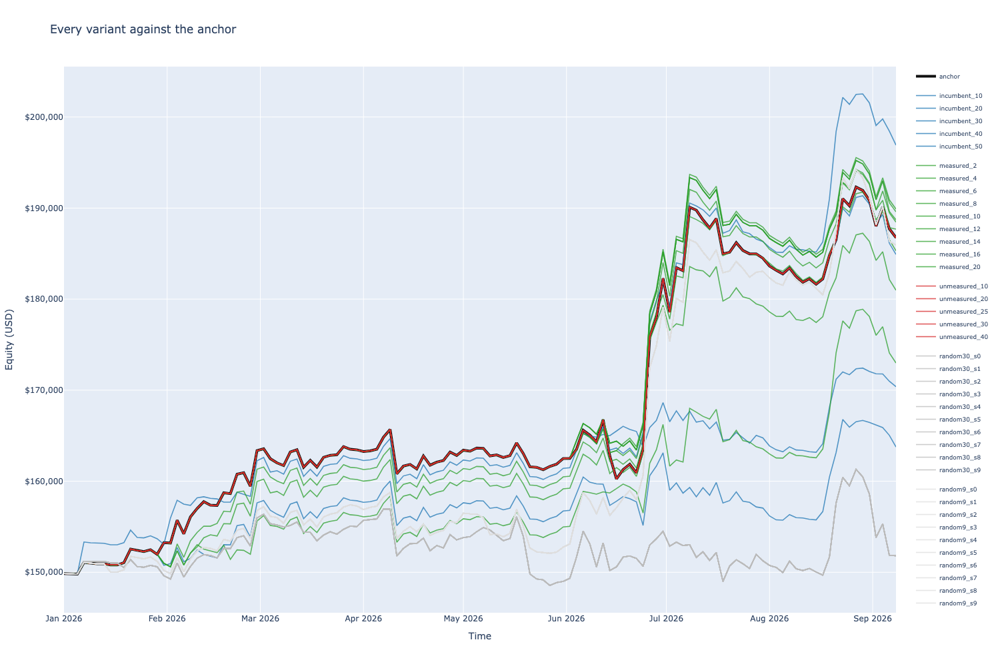

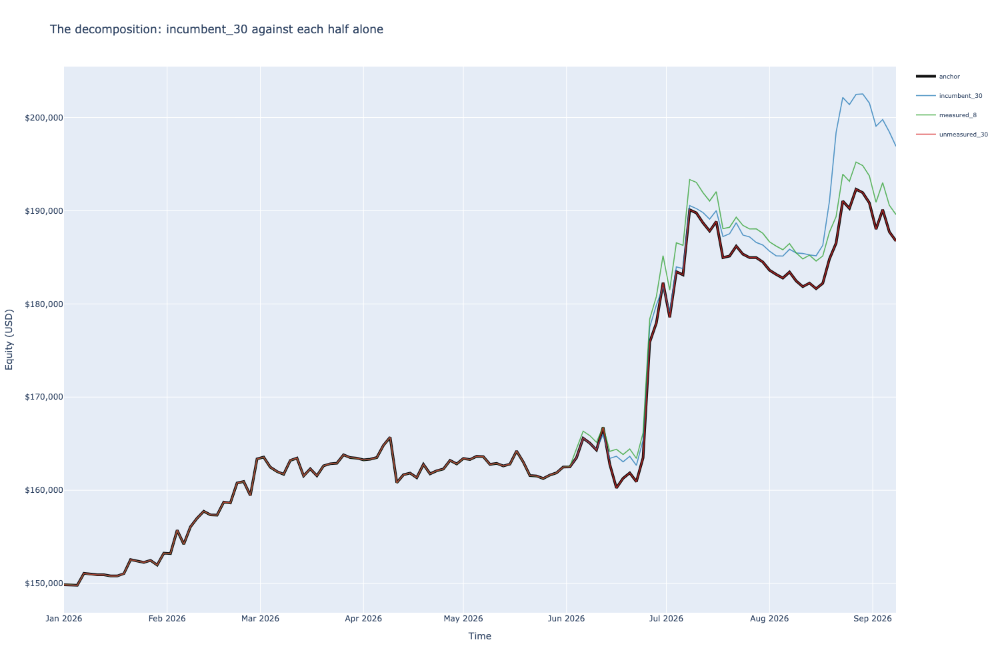

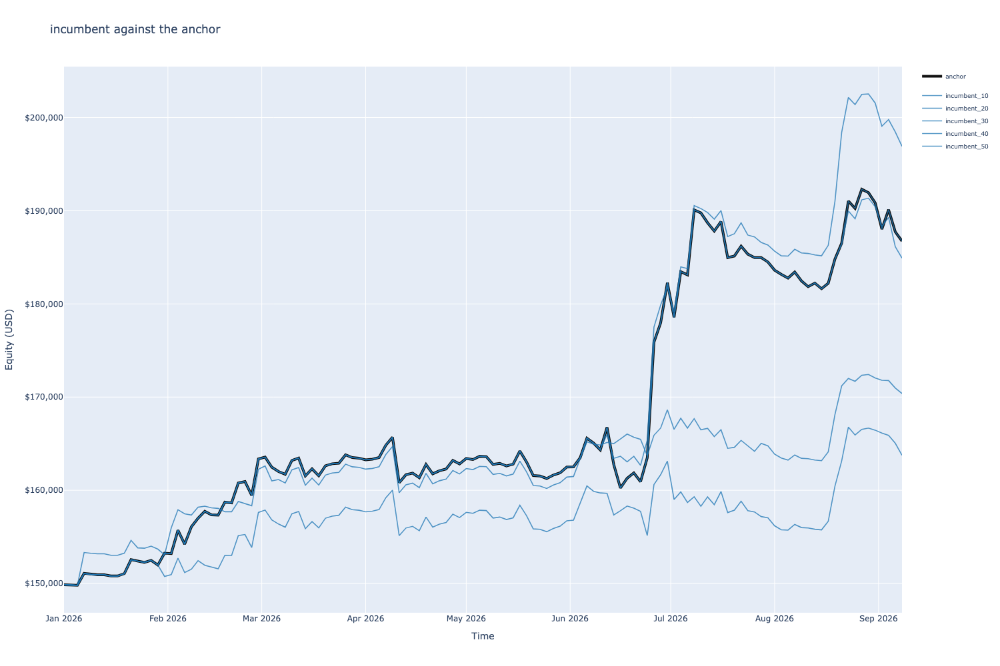

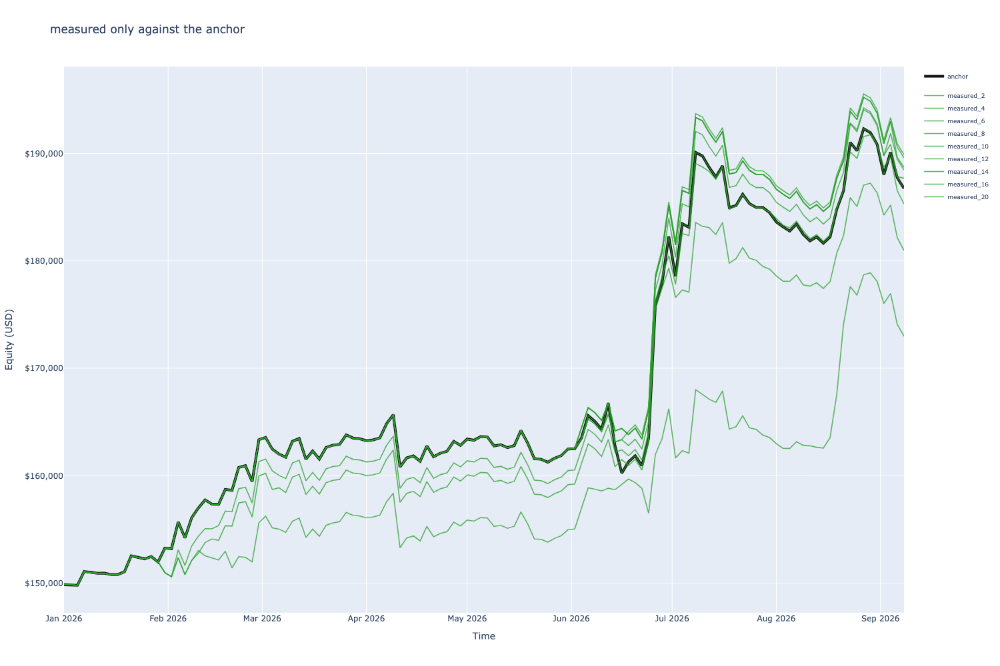

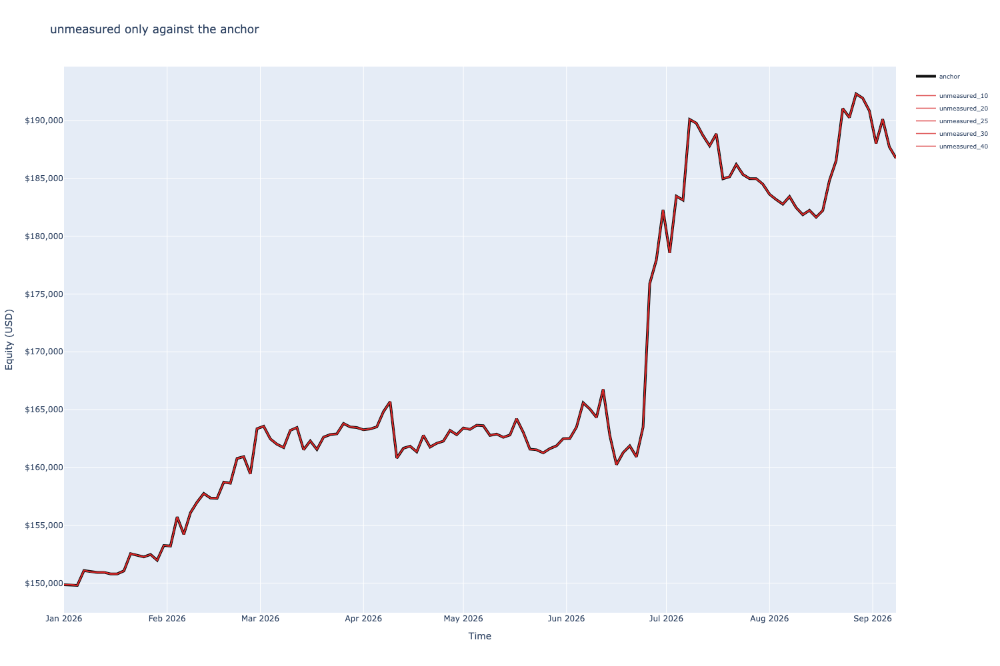

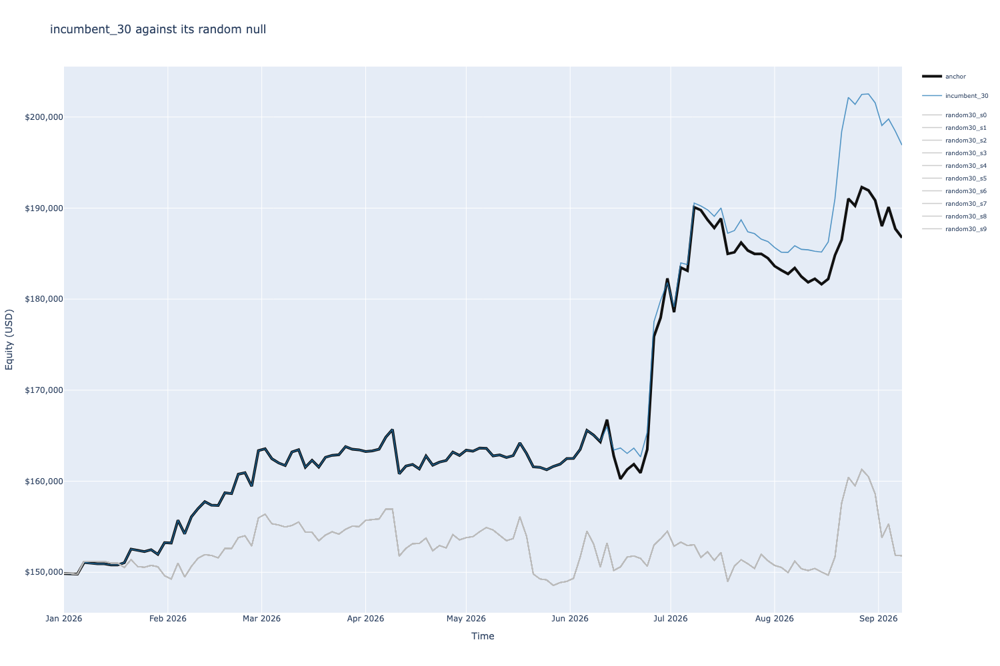

In [18]:
import plotly.graph_objects as go

MODE_COLOURS = {
    "anchor": "#111111", "incumbent": "#1f77b4", "measured only": "#2ca02c",
    "unmeasured only": "#d62728", "random null n=30": "#bbbbbb", "random null n=9": "#dddddd",
}
equity_by_label = {e["label"]: e["equity"] for e in runs}

def equity_figure(labels, title):
    fig = go.Figure()
    for label in labels:
        curve = equity_by_label[label]
        is_anchor = label == "anchor"
        fig.add_trace(go.Scatter(
            x=curve.index, y=curve.to_numpy(), name=label, mode="lines",
            line=dict(color=MODE_COLOURS.get(mode_by_label[label], "#888888"),
                      width=4 if is_anchor else 1.6),
            opacity=1.0 if is_anchor else 0.75, legendgroup=mode_by_label[label],
            hovertemplate="%{fullData.name}<br>%{x|%Y-%m-%d}<br>$%{y:,.0f}<extra></extra>",
        ))
    fig.update_layout(title=title, hovermode="x unified", legend=dict(font=dict(size=9)))
    fig.update_yaxes(title="Equity (USD)", tickformat="$,.0f")
    fig.update_xaxes(title="Time")
    return fig

equity_figure(list(equity_by_label), "Every variant against the anchor").show()
equity_figure(["anchor", "incumbent_30", m_match, u_match],
              "The decomposition: incumbent_30 against each half alone").show()
for mode_name in ("incumbent", "measured only", "unmeasured only"):
    labels = ["anchor"] + [l for l, m in mode_by_label.items() if m == mode_name]
    equity_figure(labels, f"{mode_name} against the anchor").show()
equity_figure(["anchor", "incumbent_30"] + [l for l, m in mode_by_label.items()
              if m == "random null n=30"], "incumbent_30 against its random null").show()


# Underwater curves


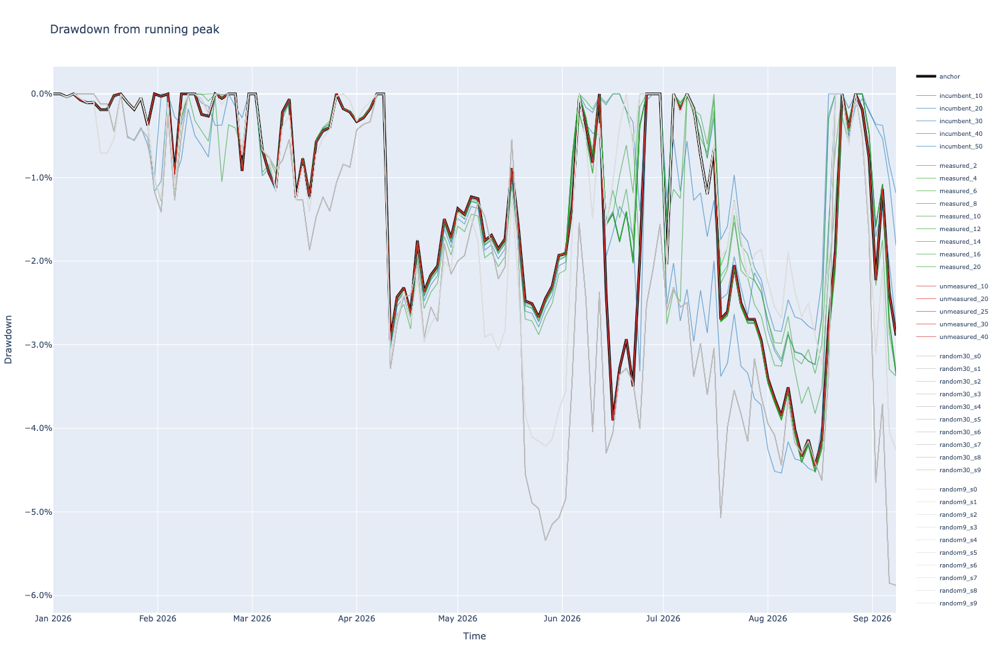

In [19]:
fig = go.Figure()
for label, curve in equity_by_label.items():
    drawdown = curve / curve.cummax() - 1.0
    is_anchor = label == "anchor"
    fig.add_trace(go.Scatter(
        x=drawdown.index, y=drawdown.to_numpy(), name=label, mode="lines",
        line=dict(color=MODE_COLOURS.get(mode_by_label[label], "#888888"),
                  width=4 if is_anchor else 1.2),
        opacity=1.0 if is_anchor else 0.6, legendgroup=mode_by_label[label],
        hovertemplate="%{fullData.name}<br>%{x|%Y-%m-%d}<br>%{y:.2%}<extra></extra>",
    ))
fig.update_layout(title="Drawdown from running peak", hovermode="x unified",
                  legend=dict(font=dict(size=9)))
fig.update_yaxes(title="Drawdown", tickformat=".1%")
fig.update_xaxes(title="Time")
fig.show()


# Asset weights

Per-vault share of total equity at every decision, from `state.stats.positions` valued against
`state.stats.portfolio` equity at the same timestamp. This is the realised book, not the target
weights, so it already reflects the minimum-hold rule and any blocked deposit window.


Stacked weight charts for 22 variants. The remaining 18 random-null draws are summarised numerically below instead of charted: they are a null, they differ only by seed, and 38 stacked-area figures would make the notebook unreadable and very large.


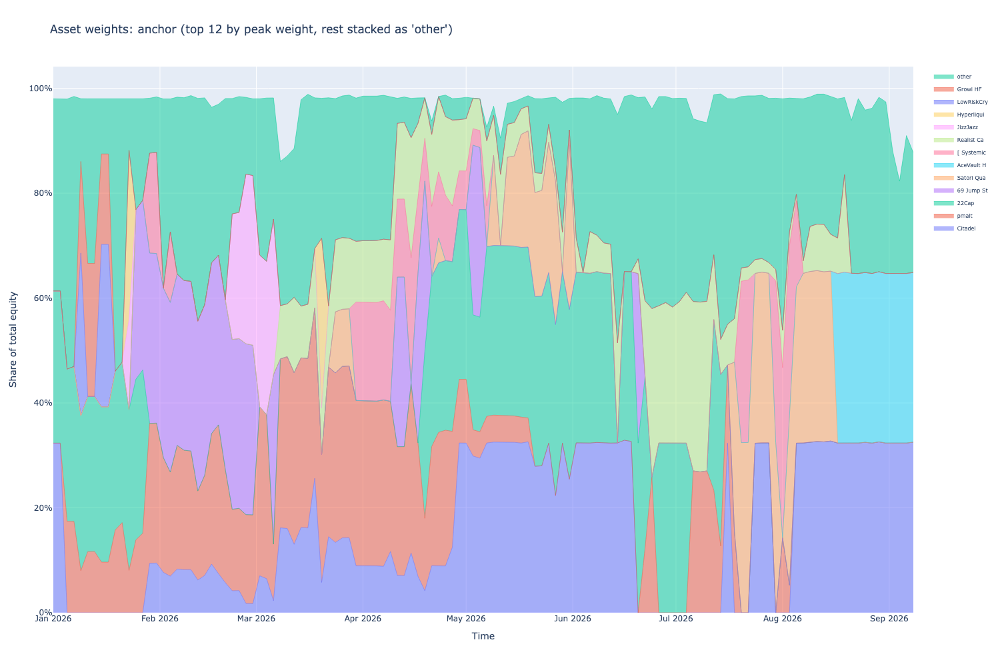

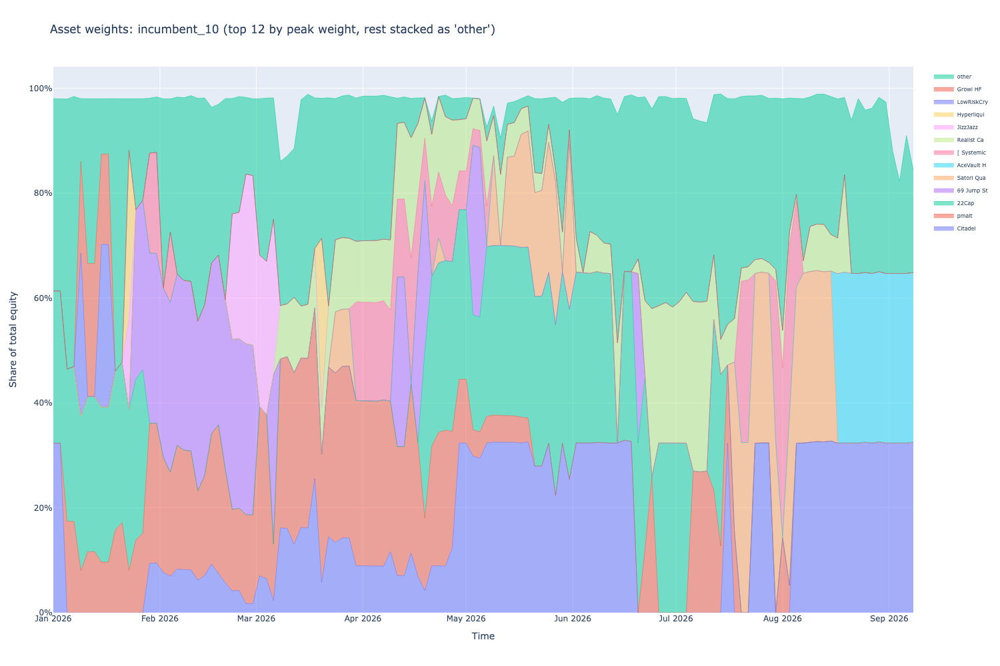

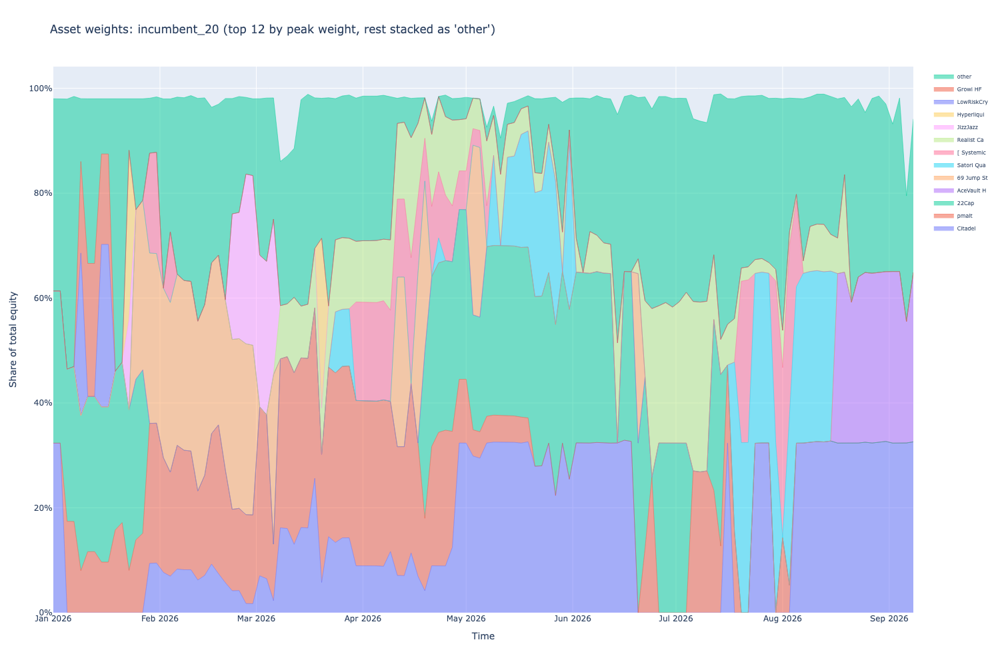

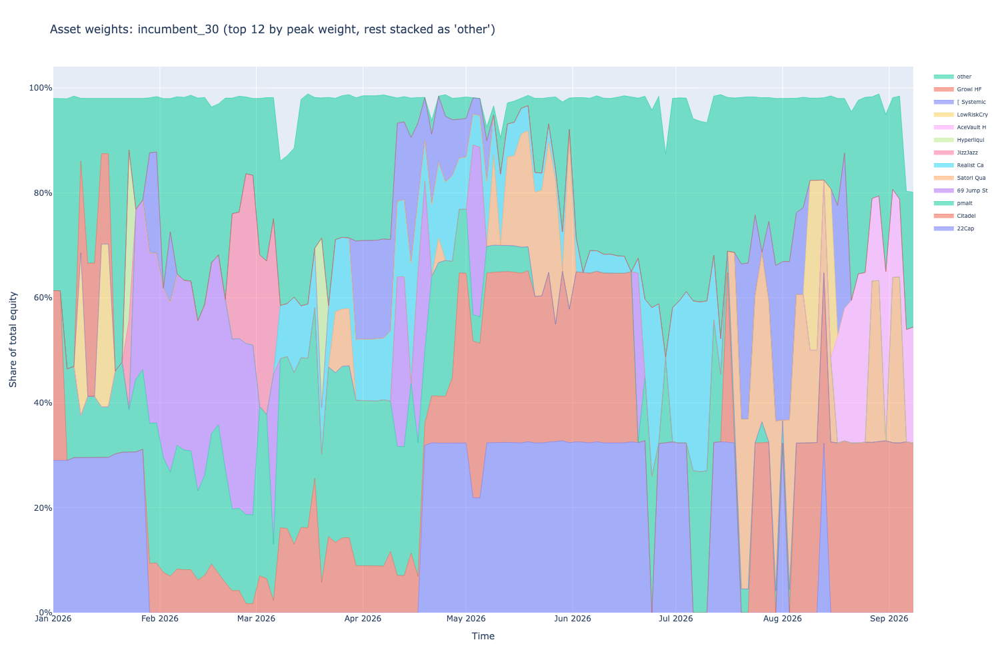

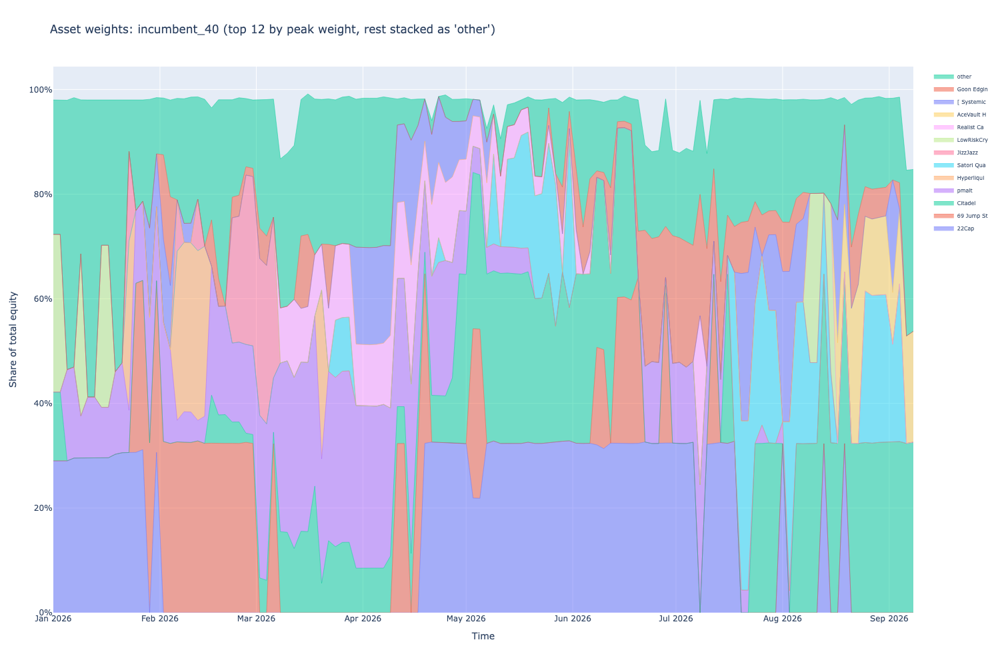

...

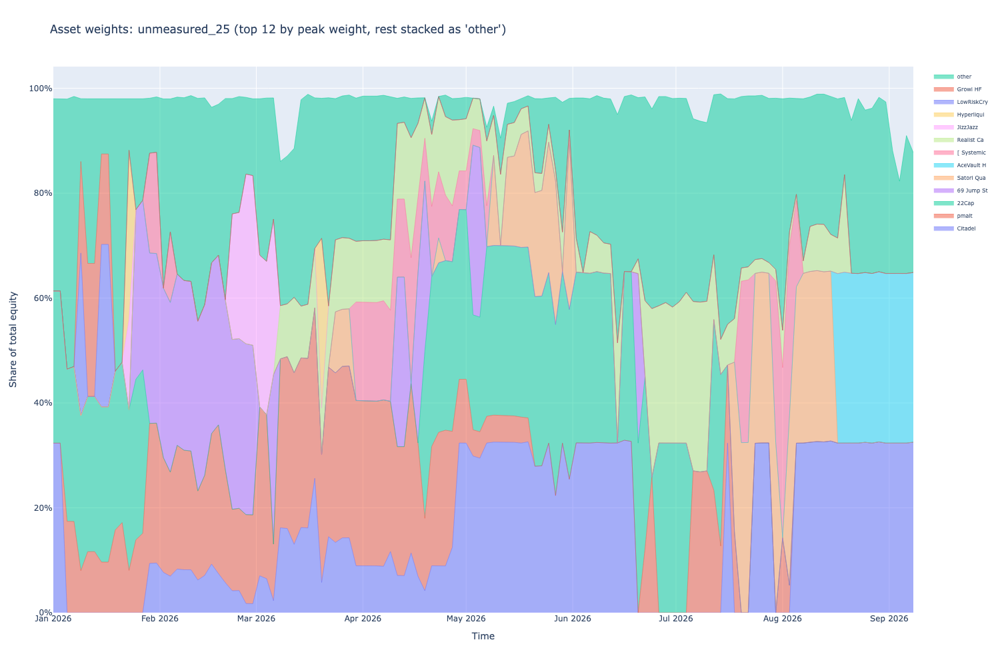

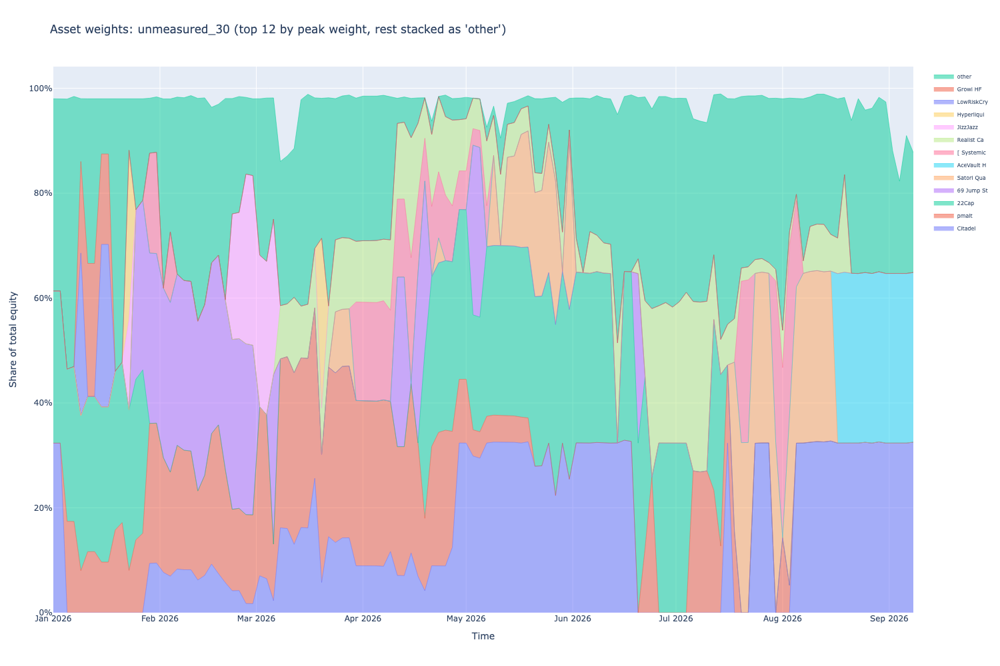

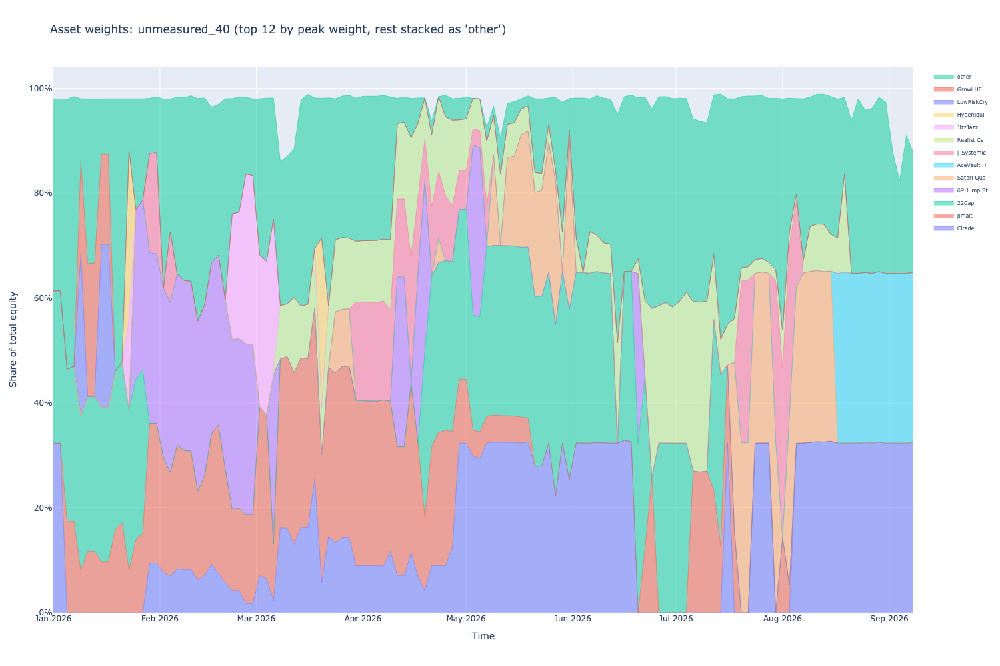

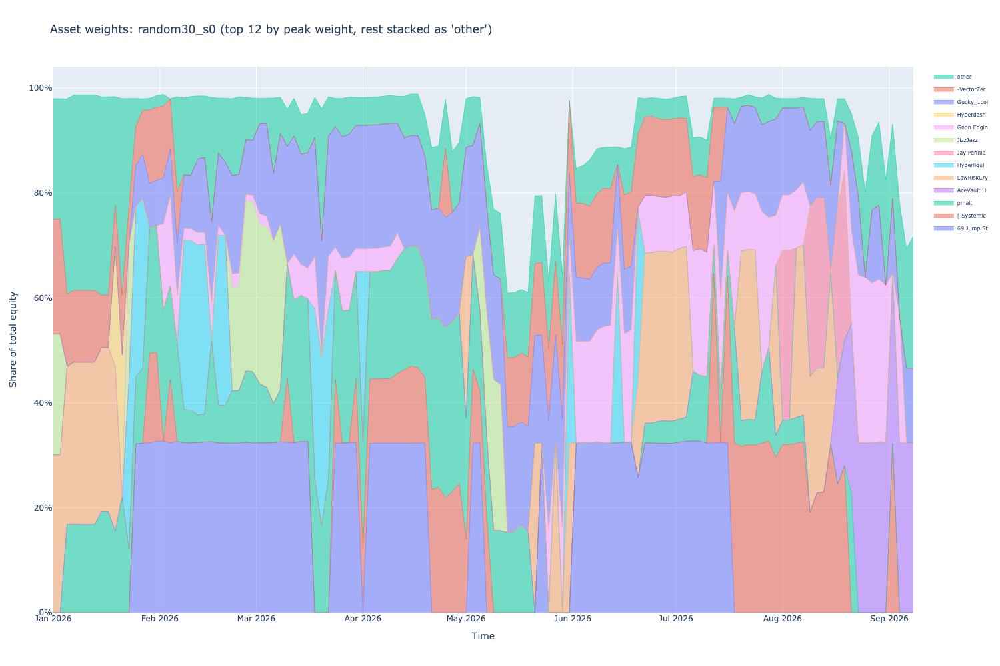

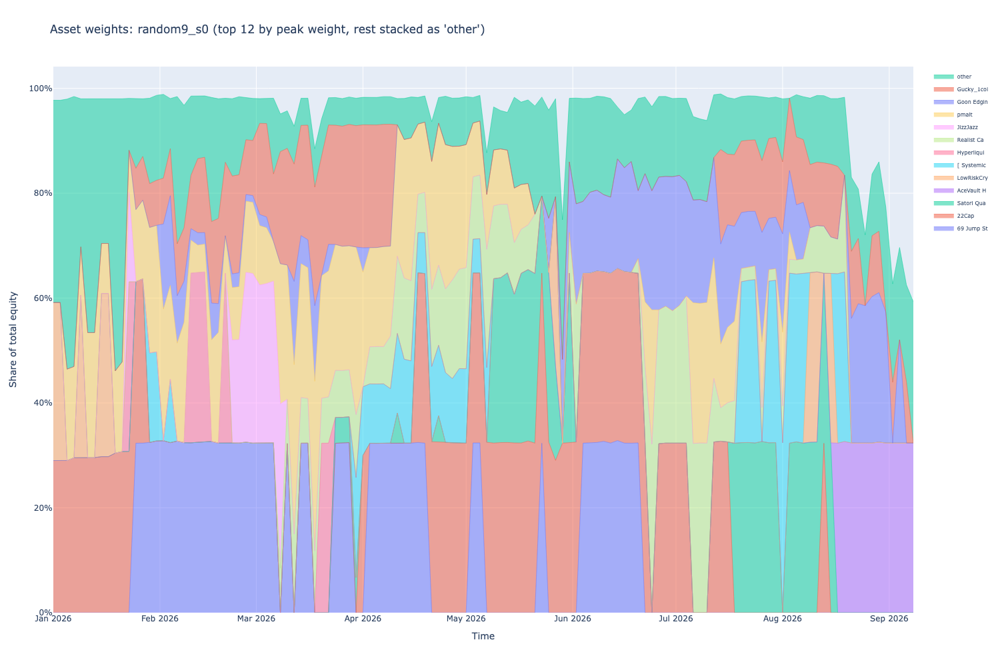

In [20]:
def weight_frame(label: str) -> pd.DataFrame:
    """Realised per-vault weight over time, columns are vault names, rows are decision dates."""
    state_ = run_by_label[label]["state"]
    equity_at = {}
    for stat in state_.stats.portfolio:
        if stat.total_equity:
            equity_at[pd.Timestamp(stat.calculated_at)] = float(stat.total_equity)
    rows = {}
    for position_id, series in state_.stats.positions.items():
        position = state_.portfolio.get_position_by_id(position_id)
        if position.is_credit_supply():
            continue
        base = getattr(position.pair, "base", None)
        symbol = getattr(base, "token_symbol", None) if base is not None else None
        name = str(symbol) if symbol else str(position.pair.pool_address)[:10]
        for stat in series:
            ts = pd.Timestamp(stat.calculated_at)
            equity = equity_at.get(ts)
            if not equity:
                continue
            rows.setdefault(ts, {})
            rows[ts][name] = rows[ts].get(name, 0.0) + float(stat.value) / equity
    if not rows:
        return pd.DataFrame()
    frame = pd.DataFrame(rows).T.sort_index().fillna(0.0)
    return frame.loc[:, frame.max().sort_values(ascending=False).index]


def weight_chart(label: str, top: int = 12):
    frame = weight_frame(label)
    if frame.empty:
        print(f"{label}: no position statistics")
        return
    keep = list(frame.columns[:top])
    plot = frame[keep].copy()
    if len(frame.columns) > top:
        plot["other"] = frame[frame.columns[top:]].sum(axis=1)
    fig = go.Figure()
    for column in plot.columns:
        fig.add_trace(go.Scatter(
            x=plot.index, y=plot[column].to_numpy(), name=str(column), mode="lines",
            stackgroup="one", line=dict(width=0.5),
            hovertemplate="%{fullData.name}<br>%{x|%Y-%m-%d}<br>%{y:.1%}<extra></extra>",
        ))
    fig.update_layout(title=f"Asset weights: {label} (top {top} by peak weight, rest stacked as 'other')",
                      hovermode="x unified", legend=dict(font=dict(size=8)))
    fig.update_yaxes(title="Share of total equity", tickformat=".0%")
    fig.update_xaxes(title="Time")
    fig.show()


WEIGHT_CHART_LABELS = (["anchor"]
                       + [l for l, m in mode_by_label.items() if m in ("incumbent", "measured only", "unmeasured only")]
                       + ["random30_s0", "random9_s0"])
print(f"Stacked weight charts for {len(WEIGHT_CHART_LABELS)} variants. The remaining "
      f"{len(RANDOM_SEEDS) * 2 - 2} random-null draws are summarised numerically below instead of "
      f"charted: they are a null, they differ only by seed, and 38 stacked-area figures would "
      f"make the notebook unreadable and very large.")
for label in WEIGHT_CHART_LABELS:
    weight_chart(label)


## Weight concentration, every variant

The numeric summary that covers the runs not charted above, and makes the charts comparable.
`mean_holdings` is how many vaults were actually funded, `mean_top1` the largest single weight,
and `mean_hhi` the Herfindahl index of the weight vector - 1/6 is a perfectly even six-name book,
1.0 is everything in one name.


In [21]:
rows = []
for entry in runs:
    frame = weight_frame(entry["label"])
    if frame.empty:
        continue
    invested = frame.sum(axis=1).replace(0.0, np.nan)
    normalised = frame.div(invested, axis=0).fillna(0.0)
    rows.append({
        "label": entry["label"], "mode": entry["family"],
        "mean_holdings": float((frame > 1e-9).sum(axis=1).mean()),
        "mean_top1": float(normalised.max(axis=1).mean()),
        "mean_hhi": float((normalised ** 2).sum(axis=1).mean()),
        "distinct_vaults_held": int((frame > 1e-9).any().sum()),
        "mean_invested": float(invested.mean()),
    })
weights = pd.DataFrame(rows).set_index("label")
display(weights.round(4).sort_values("mean_hhi"))
display(weights.groupby("mode")[["mean_holdings", "mean_top1", "mean_hhi",
                                 "distinct_vaults_held"]].median().round(4))


,mode,mean_holdings,mean_top1,mean_hhi,distinct_vaults_held,mean_invested
label,,,,,,
measured_14,measured only,6.0000,0.3308,0.2417,34,0.9730
incumbent_20,incumbent,6.0000,0.3311,0.2420,34,0.9735
incumbent_30,incumbent,6.0000,0.3316,0.2421,34,0.9719
measured_16,measured only,6.0000,0.3314,0.2421,33,0.9716
measured_12,measured only,6.0000,0.3305,0.2423,32,0.9735
measured_10,measured only,6.0000,0.3308,0.2430,32,0.9727
incumbent_40,incumbent,5.9841,0.3320,0.2431,32,0.9693
measured_6,measured only,6.0000,0.3312,0.2433,32,0.9720
measured_8,measured only,6.0000,0.3313,0.2434,32,0.9716


,mean_holdings,mean_top1,mean_hhi,distinct_vaults_held
mode,,,,
anchor,6.0000,0.3316,0.2436,33.0
incumbent,6.0000,0.3316,0.2431,33.0
measured only,6.0000,0.3312,0.2433,32.0
random null n=30,5.9921,0.3398,0.2448,28.0
random null n=9,6.0000,0.3401,0.2470,34.0
unmeasured only,6.0000,0.3316,0.2436,33.0


# Sub-period stability

A real effect should survive being cut in time. The plan's three segments are the sparse polling
regime before April, the dense regime to the end of June, and the late period from July.


In [22]:
SEG = ["sparse_cagr", "sparse_ulcer", "dense_cagr", "dense_ulcer", "late_cagr", "late_ulcer"]
focus = ["anchor", "incumbent_30", m_match, u_match]
display(comparison.loc[focus, SEG].round(4))

segment_rows = []
for mode_name in ("incumbent", "measured only", "unmeasured only", "random null n=30", "random null n=9"):
    subset = comparison[comparison["mode"] == mode_name]
    segment_rows.append({
        "mode": mode_name, "runs": len(subset),
        **{c: float(subset[c].median()) for c in SEG},
        "positive in all three": int(((subset["sparse_cagr"] > 0) & (subset["dense_cagr"] > 0)
                                      & (subset["late_cagr"] > 0)).sum()),
    })
display(pd.DataFrame(segment_rows).set_index("mode").round(4))


,sparse_cagr,sparse_ulcer,dense_cagr,dense_ulcer,late_cagr,late_ulcer
label,,,,,,
anchor,0.4335,0.0045,0.5634,0.0192,0.2720,0.0253
incumbent_30,0.4335,0.0045,0.5474,0.0166,0.6613,0.0172
measured_8,0.4331,0.0045,0.6672,0.0165,0.2644,0.0257
unmeasured_30,0.4335,0.0045,0.5634,0.0192,0.2720,0.0253


,runs,sparse_cagr,sparse_ulcer,dense_cagr,dense_ulcer,late_cagr,late_ulcer,positive in all three
mode,,,,,,,,
incumbent,5,0.4335,0.0045,0.5474,0.0180,0.2064,0.0172,5
measured only,9,0.4331,0.0045,0.6253,0.0166,0.2632,0.0255,9
unmeasured only,5,0.4335,0.0045,0.5634,0.0192,0.2720,0.0253,5
random null n=30,10,0.1506,0.0074,-0.0312,0.0298,-0.0362,0.0219,0
random null n=9,10,0.2223,0.0056,0.7116,0.0227,0.3691,0.0201,10


# Uncertainty and leave-one-vault-out

Paired block bootstrap against the anchor for the three focus runs, then a full re-simulation of
each with its largest contributing vault masked. A result that disappears when one vault is
removed was that vault.


In [23]:
for label in ("incumbent_30", m_match, u_match):
    display(bootstrap_margin_table(label, family))

for label in ("incumbent_30", m_match, u_match):
    top = largest_contributing_vault(run_by_label[label]["state"])
    masked_label = f"{label}__without_top_vault"
    run_and_record(masked_label, "robustness", masked={top}, **run_by_label[label]["overrides"])
    before, after = run_by_label[label]["panel"], run_by_label[masked_label]["panel"]
    print(f"{label}: masked {top}")
    display(pd.DataFrame([before, after]).set_index("label")[
        ["cagr", "ulcer", "martin", "cycle_vol", "cycle_sharpe", "abs_invested_beta", "late_cagr"]])


,run,against,block,boundary,observed_diff,ci_lo,ci_hi,clears_boundary
0,incumbent_30,anchor,5,-0.1,0.587599,0.068316,1.326019,True
1,incumbent_30,observed control incumbent_30,5,0.1,0.000000,0.000000,0.000000,False
2,incumbent_30,anchor,10,-0.1,0.587599,0.131691,1.331199,True
3,incumbent_30,observed control incumbent_30,10,0.1,0.000000,0.000000,0.000000,False
4,incumbent_30,anchor,20,-0.1,0.587599,0.000000,1.213444,True
5,incumbent_30,observed control incumbent_30,20,0.1,0.000000,0.000000,0.000000,False


,run,against,block,boundary,observed_diff,ci_lo,ci_hi,clears_boundary
0,measured_8,anchor,5,-0.1,0.213976,-0.038933,0.676447,True
1,measured_8,observed control incumbent_30,5,0.1,-0.373624,-0.996006,0.107702,False
2,measured_8,anchor,10,-0.1,0.213976,-0.038394,0.664810,True
3,measured_8,observed control incumbent_30,10,0.1,-0.373624,-1.068603,0.077515,False
4,measured_8,anchor,20,-0.1,0.213976,-0.038548,0.576017,True
5,measured_8,observed control incumbent_30,20,0.1,-0.373624,-1.038109,0.155789,False


,run,against,block,boundary,observed_diff,ci_lo,ci_hi,clears_boundary
0,unmeasured_30,anchor,5,-0.1,0.000000,0.000000,0.000000,True
1,unmeasured_30,observed control incumbent_30,5,0.1,-0.587599,-1.326019,-0.068316,False
2,unmeasured_30,anchor,10,-0.1,0.000000,0.000000,0.000000,True
3,unmeasured_30,observed control incumbent_30,10,0.1,-0.587599,-1.331199,-0.131691,False
4,unmeasured_30,anchor,20,-0.1,0.000000,0.000000,0.000000,True
5,unmeasured_30,observed control incumbent_30,20,0.1,-0.587599,-1.213444,0.000000,False


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:09<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:15:14,238 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:15:14,276 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.631520628998396047592398, executed reserve 6008.532971295332676819573900
  Estimated quantity -3624.10657780110659587080590426921844482421875, executed quantity -3624.10657780110659587080590426921844482421875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:15:14,310 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.655658787644126687291442, executed reserve 3153.462418772855133186414461
  Estimated quantity -1807.358340230454587072017602622509002685546875, executed quantity -1807.358340230454587072017602622509002685546875
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:15:14,365 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.485336785541091209970801, executed reserve 3042.197876312657511193722692
  Estimated quantity -1779.199370326362213745596818625926971435546875, executed quantity -1779.199370326362213745596818625926971435546875
  Reserve drift 1.114501 %, quantity drift 0.000000 %


2026-09-13 18:15:14,449 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8455.107787702435563641300266, executed reserve 8369.178273907683374933232359
  Estimated quantity -3091.65139782867436224478296935558319091796875, executed quantity -3091.65139782867436224478296935558319091796875
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:15:14,472 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.679090446527078542866857, executed reserve 2473.789219597291360462429419
  Estimated quantity -200.95453804265025610220618546009063720703125, executed quantity -200.95453804265025610220618546009063720703125
  Reserve drift 1.547745 %, quantity drift 0.000000 %


2026-09-13 18:15:15,486 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #296
  Estimated reserve 2173.730039452759140616626955, executed reserve 2141.227119974715627545972455
  Estimated quantity -143.3025946397638108464889228343963623046875, executed quantity -143.3025946397638108464889228343963623046875
  Reserve drift 1.495260 %, quantity drift 0.000000 %


2026-09-13 18:15:15,758 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #345
  Estimated reserve 3697.635997743725165627745990, executed reserve 3544.394480540522711363201404
  Estimated quantity -976.5307983655594625815865583717823028564453125, executed quantity -976.5307983655594625815865583717823028564453125
  Reserve drift 4.144311 %, quantity drift 0.000000 %


2026-09-13 18:15:16,019 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #393
  Estimated reserve 801.2292757373070299342816436, executed reserve 792.1784976650659019737755347
  Estimated quantity -448.07587098125208058263524435460567474365234375, executed quantity -448.07587098125208058263524435460567474365234375
  Reserve drift 1.129612 %, quantity drift 0.000000 %


2026-09-13 18:15:16,043 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #397
  Estimated reserve 1736.174372714565739959290876, executed reserve 1709.116030378322707106762835
  Estimated quantity -928.5361737817107723458320833742618560791015625, executed quantity -928.5361737817107723458320833742618560791015625
  Reserve drift 1.558504 %, quantity drift 0.000000 %


2026-09-13 18:15:16,756 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #527
  Estimated reserve 1454.074578798094024877751556, executed reserve 1415.937539046992363682944534
  Estimated quantity -321.9051306988770875250338576734066009521484375, executed quantity -321.9051306988770875250338576734066009521484375
  Reserve drift 2.622771 %, quantity drift 0.000000 %


2026-09-13 18:15:16,778 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #533
  Estimated reserve 4550.062159540753800959601143, executed reserve 4437.795184692212253956647665
  Estimated quantity -1026.595614899121983398799784481525421142578125, executed quantity -1026.595614899121983398799784481525421142578125
  Reserve drift 2.467372 %, quantity drift 0.000000 %


2026-09-13 18:15:16,779 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #531
  Estimated reserve 31728.18835736931148196065408, executed reserve 31371.56084416524246440025049
  Estimated quantity -19687.351242651857319287955760955810546875, executed quantity -19687.351242651857319287955760955810546875
  Reserve drift 1.124008 %, quantity drift 0.000000 %


incumbent_30: masked 0x77fee2df7bad4f1db93052fa82bf78eaab771a16


,cagr,ulcer,martin,cycle_vol,cycle_sharpe,abs_invested_beta,late_cagr
label,,,,,,,
incumbent_30,0.489942,0.013843,35.392444,0.149229,2.747391,0.001055,0.661276
incumbent_30__without_top_vault,0.241170,0.022058,10.933453,0.118031,1.889823,0.002441,0.229179


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:07<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:15:34,471 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:15:34,506 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.578591984912760922430766, executed reserve 6008.480687427398873801098703
  Estimated quantity -3624.075042264796138624660670757293701171875, executed quantity -3624.075042264796138624660670757293701171875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:15:34,538 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.636417232012153120164104, executed reserve 3153.443514930983005697861160
  Estimated quantity -1807.347498067447077119140885770320892333984375, executed quantity -1807.347498067447077119140885770320892333984375
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:15:34,592 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.176589404664072699085505, executed reserve 3041.894036611801696373137965
  Estimated quantity -1779.019957124573693363345228135585784912109375, executed quantity -1779.019957124573693363345228135585784912109375
  Reserve drift 1.114453 %, quantity drift 0.000000 %


2026-09-13 18:15:34,677 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8456.797791322441363373642402, executed reserve 8370.851101970259890673675910
  Estimated quantity -3092.26935589441609408822841942310333251953125, executed quantity -3092.26935589441609408822841942310333251953125
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:15:34,698 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.476417018566142307197605, executed reserve 2473.590691090799570032310335
  Estimated quantity -200.93824710338259365016710944473743438720703125, executed quantity -200.93824710338259365016710944473743438720703125
  Reserve drift 1.547705 %, quantity drift 0.000000 %


2026-09-13 18:15:35,640 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #296
  Estimated reserve 2173.423824468545029286386578, executed reserve 2140.925836555288981455899645
  Estimated quantity -143.282383880648893637044238857924938201904296875, executed quantity -143.282383880648893637044238857924938201904296875
  Reserve drift 1.495244 %, quantity drift 0.000000 %


2026-09-13 18:15:35,914 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #340
  Estimated reserve 3661.516852738958722315926466, executed reserve 3509.772225057599487630776285
  Estimated quantity -966.991877409221842754050157964229583740234375, executed quantity -966.991877409221842754050157964229583740234375
  Reserve drift 4.144311 %, quantity drift 0.000000 %


2026-09-13 18:15:36,182 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #390
  Estimated reserve 2278.564864291983928419062583, executed reserve 2242.975958697004056157639725
  Estimated quantity -1218.65806282515177372260950505733489990234375, executed quantity -1218.65806282515177372260950505733489990234375
  Reserve drift 1.561900 %, quantity drift 0.000000 %


2026-09-13 18:15:36,904 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Sequoia Hy #516
  Estimated reserve 2033.245779102474177058242582, executed reserve 2002.277133161230780626465481
  Estimated quantity -3518.83779505851862268173135817050933837890625, executed quantity -3518.83779505851862268173135817050933837890625
  Reserve drift 1.523114 %, quantity drift 0.000000 %


2026-09-13 18:15:36,951 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #525
  Estimated reserve 1024.167612933655571591514728, executed reserve 1012.664586944126876638364046
  Estimated quantity -635.4908760521742578930570743978023529052734375, executed quantity -635.4908760521742578930570743978023529052734375
  Reserve drift 1.123159 %, quantity drift 0.000000 %


2026-09-13 18:15:36,999 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #532
  Estimated reserve 1172.323731581993296778535121, executed reserve 1157.748315875527422044209623
  Estimated quantity -718.5592047898468308630981482565402984619140625, executed quantity -718.5592047898468308630981482565402984619140625
  Reserve drift 1.243293 %, quantity drift 0.000000 %


2026-09-13 18:15:37,022 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #540
  Estimated reserve 961.4410359120375837287491262, executed reserve 946.4826430308065264937368194
  Estimated quantity -224.1325025414251967958989553153514862060546875, executed quantity -224.1325025414251967958989553153514862060546875
  Reserve drift 1.555831 %, quantity drift 0.000000 %


2026-09-13 18:15:37,023 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #539
  Estimated reserve 853.0893676115447051155993092, executed reserve 842.5202571290037127434065359
  Estimated quantity -523.12392779126957975677214562892913818359375, executed quantity -523.12392779126957975677214562892913818359375
  Reserve drift 1.238922 %, quantity drift 0.000000 %


measured_8: masked 0x77fee2df7bad4f1db93052fa82bf78eaab771a16


,cagr,ulcer,martin,cycle_vol,cycle_sharpe,abs_invested_beta,late_cagr
label,,,,,,,
measured_8,0.409685,0.017132,23.914106,0.149361,2.373768,0.043716,0.264370
measured_8__without_top_vault,0.272510,0.021946,12.417249,0.121756,2.040695,0.002197,0.297396


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count, sortino_score, cagr_sortino_weight, fresh_observation_count, btc_beta, btc_beta_r2, ulcer_index_180, downside_deviation_90, positive_window_share, residual_event_concentration, min_window_sortino, residual_cagr_score, gain_to_pain_score, cagr_min_sortino_weight, downside_score, drawdown_recovery_days, tvl_growth, cagr_downside_weight, cagr_positive_window_weight, residual_cagr_sortino_weight, sortino_raw_event, sortino_neff_event, sortino_cross_sectional_prior, sortino_shrunk_score, expanding_cagr_score, evidence_composite, inverse_vol_early, fresh_daily_return, cohort_down_flag, joint_loss_frequency, cagr_sortino_shrunk_weight for 342 pairs, using 1 threads:   0%|          | 0/11634 [00:09<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_342p4bc8230f_2021-05-06-2026-09-09_ff_cross_d2e4b0dae


2026-09-13 18:15:54,056 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #73
  Estimated reserve 1149.004759247334741937935431, executed reserve 1135.221277962433177067548596
  Estimated quantity -685.895448491890192599385045468807220458984375, executed quantity -685.895448491890192599385045468807220458984375
  Reserve drift 1.199602 %, quantity drift 0.000000 %


2026-09-13 18:15:54,091 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #88
  Estimated reserve 6082.631520628998396047592398, executed reserve 6008.532971295332676819573900
  Estimated quantity -3624.10657780110659587080590426921844482421875, executed quantity -3624.10657780110659587080590426921844482421875
  Reserve drift 1.218199 %, quantity drift 0.000000 %


2026-09-13 18:15:54,126 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #95
  Estimated reserve 3208.655658787644126687291442, executed reserve 3153.462418772855133186414461
  Estimated quantity -1807.358340230454587072017602622509002685546875, executed quantity -1807.358340230454587072017602622509002685546875
  Reserve drift 1.720136 %, quantity drift 0.000000 %


2026-09-13 18:15:54,183 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #111
  Estimated reserve 3076.485336785541091209970801, executed reserve 3042.197876312657511193722692
  Estimated quantity -1779.199370326362213745596818625926971435546875, executed quantity -1779.199370326362213745596818625926971435546875
  Reserve drift 1.114501 %, quantity drift 0.000000 %


2026-09-13 18:15:54,270 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Gucky_1coi #131
  Estimated reserve 8455.107787702435563641300266, executed reserve 8369.178273907683374933232359
  Estimated quantity -3091.65139782867436224478296935558319091796875, executed quantity -3091.65139782867436224478296935558319091796875
  Reserve drift 1.016303 %, quantity drift 0.000000 %


2026-09-13 18:15:54,302 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #136
  Estimated reserve 2512.679090446527078542866857, executed reserve 2473.789219597291360462429419
  Estimated quantity -200.95453804265025610220618546009063720703125, executed quantity -200.95453804265025610220618546009063720703125
  Reserve drift 1.547745 %, quantity drift 0.000000 %


2026-09-13 18:15:55,338 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell pmalt #296
  Estimated reserve 2173.730039452759140616626955, executed reserve 2141.227119974715627545972455
  Estimated quantity -143.3025946397638108464889228343963623046875, executed quantity -143.3025946397638108464889228343963623046875
  Reserve drift 1.495260 %, quantity drift 0.000000 %


2026-09-13 18:15:55,594 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Octavious  #344
  Estimated reserve 1637.778769219221426926636409, executed reserve 1569.904131588180702732068164
  Estimated quantity -432.530787245612600599997676908969879150390625, executed quantity -432.530787245612600599997676908969879150390625
  Reserve drift 4.144311 %, quantity drift 0.000000 %


2026-09-13 18:15:55,869 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #387
  Estimated reserve 1290.667180747121240327185829, executed reserve 1276.470123895423259706229623
  Estimated quantity -721.5706638405321200480102561414241790771484375, executed quantity -721.5706638405321200480102561414241790771484375
  Reserve drift 1.099978 %, quantity drift 0.000000 %


2026-09-13 18:15:55,895 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Goon Edgin #390
  Estimated reserve 1717.305986288614771673091729, executed reserve 1691.026272674436150268192620
  Estimated quantity -918.1818526206153592283953912556171417236328125, executed quantity -918.1818526206153592283953912556171417236328125
  Reserve drift 1.530287 %, quantity drift 0.000000 %


2026-09-13 18:15:56,622 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell Sequoia Hy #517
  Estimated reserve 2079.890690230668655522341408, executed reserve 2048.211589236456959986481823
  Estimated quantity -3599.56383315583616422372870147228240966796875, executed quantity -3599.56383315583616422372870147228240966796875
  Reserve drift 1.523114 %, quantity drift 0.000000 %


2026-09-13 18:15:56,669 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #526
  Estimated reserve 1006.810985266798471789464798, executed reserve 995.5141461660619487953610183
  Estimated quantity -624.7141191902625223519862629473209381103515625, executed quantity -624.7141191902625223519862629473209381103515625
  Reserve drift 1.122042 %, quantity drift 0.000000 %


2026-09-13 18:15:56,716 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #534
  Estimated reserve 1160.786585388552373379457921, executed reserve 1146.367400787909644536710572
  Estimated quantity -711.4797362250716332709998823702335357666015625, executed quantity -711.4797362250716332709998823702335357666015625
  Reserve drift 1.242191 %, quantity drift 0.000000 %


2026-09-13 18:15:56,741 tradeexecutor.strategy.runner                      WARNING  Trade quantity and reserve match for pre an post-execution for: Sell AceVault H #541
  Estimated reserve 846.5793261790532326284485864, executed reserve 836.1002030089863971227360439
  Estimated quantity -519.126102857111845878534950315952301025390625, executed quantity -519.126102857111845878534950315952301025390625
  Reserve drift 1.237819 %, quantity drift 0.000000 %


unmeasured_30: masked 0x77fee2df7bad4f1db93052fa82bf78eaab771a16


,cagr,ulcer,martin,cycle_vol,cycle_sharpe,abs_invested_beta,late_cagr
label,,,,,,,
unmeasured_30,0.378971,0.017964,21.096003,0.154278,2.159792,0.045797,0.272027
unmeasured_30__without_top_vault,0.238981,0.022347,10.693868,0.124673,1.781367,0.003589,0.300065


# Verdict


In [24]:
summary = {
    "incumbent_30 CAGR": float(comparison.loc["incumbent_30", "cagr"]),
    f"{m_match} (measured half) CAGR": float(comparison.loc[m_match, "cagr"]),
    f"{u_match} (unmeasured half) CAGR": float(comparison.loc[u_match, "cagr"]),
    "anchor CAGR": float(anchor_panel["cagr"]),
    "random n=30 median CAGR": float(comparison[comparison["mode"] == "random null n=30"]["cagr"].median()),
    "random n=30 best CAGR": float(comparison[comparison["mode"] == "random null n=30"]["cagr"].max()),
}
display(pd.Series(summary).round(4).to_frame("value"))

import json
from pathlib import Path
manifest = {
    "verdict": "see the heading",
    "measured_match": m_match, "unmeasured_match": u_match,
    "composition": composition.round(6).to_dict(orient="index"),
    "metrics": comparison[["mode", "cagr", "ulcer", "martin", "cycle_vol", "cycle_sharpe",
                           "abs_invested_beta", "mean_invested", "late_cagr", "late_ok",
                           "passes_1_to_6", "failed_1_to_6"]].to_dict(orient="index"),
    "null_percentiles": null_rows,
    "weights": weights.round(6).to_dict(orient="index"),
}
Path("_build/manifest_26.json").write_text(json.dumps(manifest, indent=1, default=str))
print("wrote _build/manifest_26.json")


,value
incumbent_30 CAGR,0.4899
measured_8 (measured half) CAGR,0.4097
unmeasured_30 (unmeasured half) CAGR,0.3790
anchor CAGR,0.3790
random n=30 median CAGR,0.0192
random n=30 best CAGR,0.0192


wrote _build/manifest_26.json


## Integrity: destroyed and stranded capital

NB80's accounting identity - `equity == initial cash + realised + unrealised` - cannot fail after
trade-executor [#1623](https://github.com/tradingstrategy-ai/trade-executor/pull/1623), because
realised + unrealised now *is* cash-flow profit, which reduces to cash + holdings. It is replaced
here by the check that caught the genuine
[#1621](https://github.com/tradingstrategy-ai/trade-executor/pull/1621) dust defect.

Equity reconciling against cash plus holdings is still worth asserting - it is cheap and it is the
one identity that was ever load-bearing - but it is reported as a reconciliation, not as a pass mark.


In [25]:
import pandas as pd

def audit_portfolio(portfolio) -> dict:
    """Screen one run for capital that entered a position and did not come back.

    Two failure modes, neither visible to the accounting identity, because the engine values a
    vanished position at zero and equity therefore still reconciles:

    - **destroyed**: funded with real cash, closed returning nothing
    - **stranded**: closed while still holding quantity
    """
    destroyed, stranded, stranded_usd = 0, 0, 0.0
    for position in portfolio.get_all_positions():
        if position.is_open() or position.is_credit_supply():
            continue
        funded = sum(abs(float(t.executed_reserve or 0))
                     for t in position.trades.values() if t.is_buy() and t.is_success())
        returned = sum(abs(float(t.executed_reserve or 0))
                       for t in position.trades.values() if t.is_sell() and t.is_success())
        # $100 funded against $1 returned keeps ordinary engine dust out of the count.
        if funded > 100 and returned < 1.0:
            destroyed += 1
        quantity = float(position.get_quantity() or 0)
        if abs(quantity) > 1e-9:
            stranded += 1
            stranded_usd += quantity * float(position.last_token_price or 0)

    cash = float(portfolio.get_cash())
    holdings = sum(float(p.get_value() or 0) for p in portfolio.open_positions.values())
    equity = float(portfolio.get_total_equity())
    return {
        "destroyed": destroyed,
        "stranded": stranded,
        "stranded USD": stranded_usd,
        "cash + holdings - equity": cash + holdings - equity,
    }


audit = audit_portfolio(state.portfolio)
display(pd.DataFrame([audit]).style.format({
    "stranded USD": "${:,.2f}", "cash + holdings - equity": "${:,.2f}",
}).hide(axis="index").set_caption("Integrity screen"))

if audit["destroyed"] or audit["stranded"]:
    print(f"FAILED: {audit['destroyed']} destroyed, {audit['stranded']} stranded position(s)")
else:
    print("Passed: no destroyed or stranded positions")


destroyed,stranded,stranded USD,cash + holdings - equity
0,0,$0.00,$0.00


Passed: no destroyed or stranded positions


## Redemption-fee audit

Verify every executed vault redemption charged exactly the 10% fee on positive profit plus 10 bps of gross redeemed capital.


In [26]:
def redemption_fee_audit(state_) -> pd.DataFrame:
    """Reconcile executed redemption prices against the configured fee treatment."""
    rows = []
    for position in state_.portfolio.get_all_positions():
        if not position.pair.is_vault():
            continue
        quantity = 0.0
        cost_basis = 0.0
        for trade in sorted(position.get_successful_trades(), key=lambda trade: trade.executed_at):
            trade_quantity = abs(float(trade.get_position_quantity()))
            if trade.is_buy():
                quantity += trade_quantity
                cost_basis += trade_quantity * float(trade.executed_price)
                continue
            if not trade.is_sell():
                continue
            gross_price = float(trade.planned_mid_price)
            gross_proceeds = trade_quantity * gross_price
            released_cost_basis = cost_basis * trade_quantity / quantity
            configured_fee = float(trade.other_data["backtest_vault_redemption_fee"])
            capital_fee = gross_proceeds * Parameters.vault_redemption_capital_fee
            performance_fee = gross_proceeds * configured_fee - capital_fee
            actual_proceeds = trade_quantity * float(trade.executed_price)
            expected_proceeds = gross_proceeds * (1.0 - configured_fee)
            rows.append({
                "Vault": position.pair.base.token_symbol,
                "Redeemed at": trade.executed_at,
                "Gross proceeds": gross_proceeds,
                "Performance fee": performance_fee,
                "Capital fee": capital_fee,
                "Configured redemption fee": configured_fee,
                "Net proceeds": actual_proceeds,
                "Reconciliation error": actual_proceeds - expected_proceeds,
            })
            cost_basis -= released_cost_basis
            quantity -= trade_quantity
    return pd.DataFrame(rows)


redemption_fees = redemption_fee_audit(state)
assert len(redemption_fees), "Expected at least one vault redemption"
max_reconciliation_error = redemption_fees["Reconciliation error"].abs().max()
print(f"Maximum redemption-fee reconciliation error: ${max_reconciliation_error:,.8f}")
assert max_reconciliation_error < 1e-6, "Redemption fees did not reconcile"
display(
    redemption_fees.style.format({
        "Gross proceeds": "${:,.2f}",
        "Performance fee": "${:,.2f}",
        "Capital fee": "${:,.2f}",
        "Configured redemption fee": "{:.4%}",
        "Net proceeds": "${:,.2f}",
        "Reconciliation error": "${:,.8f}",
    }).set_caption("Every vault redemption reconciles to performance fee plus capital fee")
)


Maximum redemption-fee reconciliation error: $0.00000000


,Vault,Redeemed at,Gross proceeds,Performance fee,Capital fee,Configured redemption fee,Net proceeds,Reconciliation error
0,Citadel,2026-08-17 00:00:00,"$1,761.12",$4.93,$1.76,0.3800%,"$1,754.43",$0.00000000
1,Citadel,2026-08-19 00:00:00,"$1,374.58",$9.17,$1.37,0.7670%,"$1,364.04",$-0.00000000
2,Citadel,2026-08-31 00:00:00,$800.64,$5.49,$0.80,0.7863%,$794.35,$0.00000000
3,Citadel,2026-09-02 00:00:00,$900.79,$6.18,$0.90,0.7863%,$893.71,$0.00000000
4,Citadel,2026-09-06 00:00:00,$756.85,$5.13,$0.76,0.7779%,$750.96,$0.00000000
5,AceVault H,2026-08-21 00:00:00,"$4,827.89",$51.30,$4.83,1.1625%,"$4,771.76",$-0.00000000
6,AceVault H,2026-08-27 00:00:00,"$1,081.08",$13.54,$1.08,1.3524%,"$1,066.46",$0.00000000
7,AceVault H,2026-08-31 00:00:00,"$1,238.89",$16.97,$1.24,1.4695%,"$1,220.69",$0.00000000
8,AceVault H,2026-09-02 00:00:00,$873.05,$11.92,$0.87,1.4652%,$860.26,$0.00000000
9,Octavious,2026-09-02 00:00:00,"$1,154.37",$16.66,$1.15,1.5434%,"$1,136.55",$0.00000000
